# MASTER THESIS - night ventilation strategies

# Importation

In [1]:
import sys
import importlib
from pathlib import Path
import pvlib
from scipy.interpolate import BSpline

# go from ...\docs\tutorials up two levels to the repo root (...\darkgreybox)
repo_root = Path.cwd().parents[1]
sys.path.insert(0, str(repo_root))
importlib.invalidate_caches()


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split, KFold
from statsmodels.graphics.tsaplots import plot_pacf

from darkgreybox.models import TiTmCn2R2C_summer_V9
from darkgreybox.night_ventilation import simulate_night_vent_scenario, comfort_metrics
from darkgreybox.fit import darkgreyfit
from docs.tutorials.util.plot import plot
from docs.tutorials.util.error import rmse

C:\Users\clemr\AppData\Roaming\Python\Python311\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


2026-05-30 12:12:14,005 darkgreybox  INFO     Logging enabled...


In [2]:
rec_duration = 15/60

In [3]:
import pickle

class MockResult:
    def __init__(self, Z, var=None):
        self.Z   = Z
        self.var = var if var is not None else {}

RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"

with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

df           = saved["df"]
X_train      = saved["X_train"]
y_train      = saved["y_train"]
X_test       = saved["X_test"]
y_test       = saved["y_test"]
model        = saved["model"]

train_results = saved["train_results"]
test_results  = saved["test_results"]

print(f"Loaded! DataFrame shape: {df.shape}")

Loaded! DataFrame shape: (1, 13)


# Plot the results

## Train results

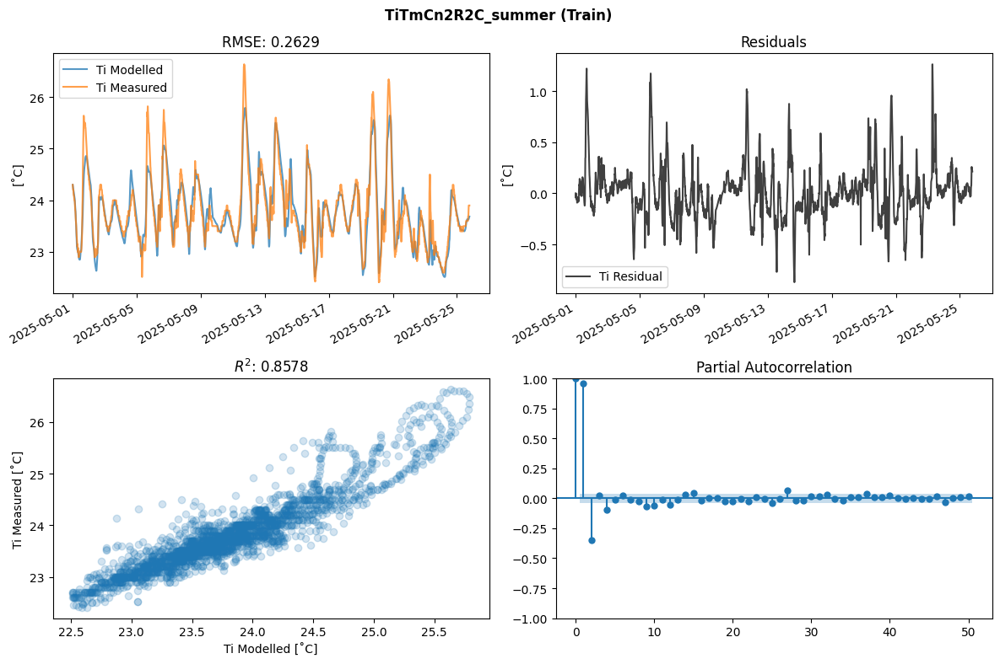

In [4]:
plot(y_train, train_results, 'TiTmCn2R2C_summer (Train)')

## Test results

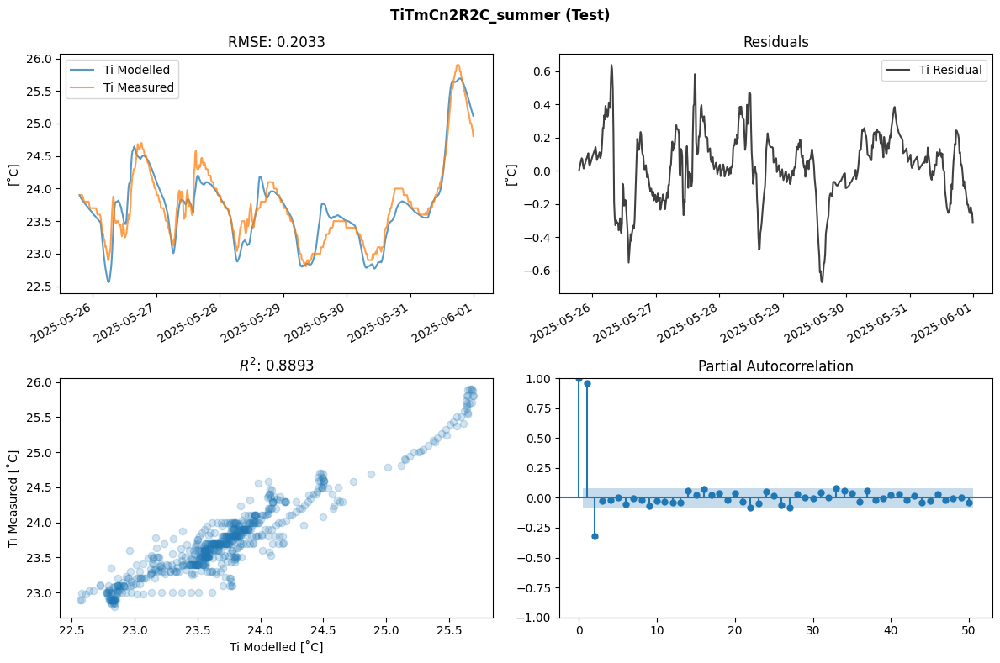

In [5]:
plot(y_test, test_results, 'TiTmCn2R2C_summer (Test)')

## Plot the main results

Using variables already in memory.


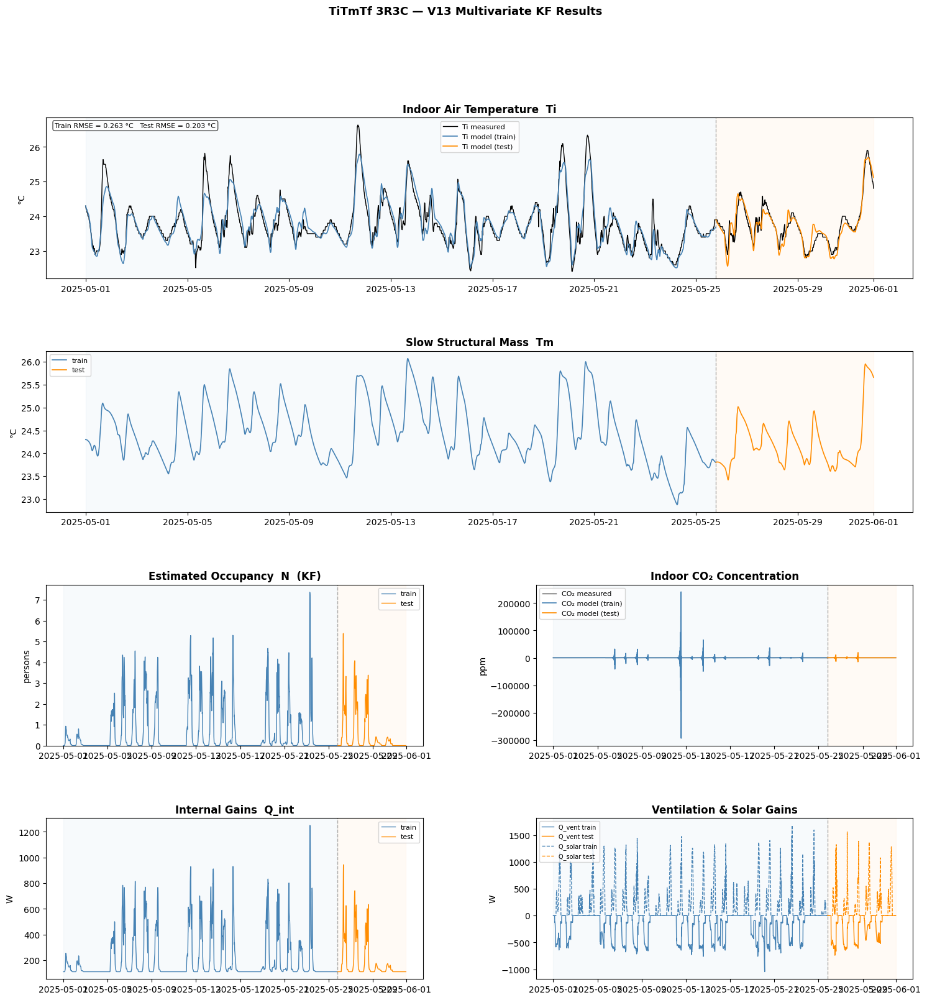

In [6]:
import pickle
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np

RESULTS_FILE = "simulation_results.pkl"

# ── Load from pickle if variables are not already in memory ──────────────────
if 'df' not in dir() or 'y_train' not in dir():
    print("Variables not in memory — loading from saved file...")
    with open(RESULTS_FILE, "rb") as f:
        saved = pickle.load(f)
    df            = saved["df"]
    X_train       = saved["X_train"]
    y_train       = saved["y_train"]
    X_test        = saved["X_test"]
    y_test        = saved["y_test"]
    model         = saved["model"]
    train_results = saved["train_results"]
    test_results  = saved["test_results"]
    print("Loaded successfully!")
else:
    print("Using variables already in memory.")

# ── get_var: handles DarkGreyModelResult attribute-based access ───────────────
def get_var(result, key):
    if key in result.var:
        return np.asarray(result.var[key], dtype=float)
    print(f"Warning: '{key}' not found in result.var. Available keys: {list(result.var.keys())}")
    return None

def rmse(pred, actual):
    return np.sqrt(np.mean((np.asarray(pred) - np.asarray(actual)) ** 2))

# ── Reconstruct time index ────────────────────────────────────────────────────
train_index = X_train.index
test_index  = X_test.index

# ── Unpack results ────────────────────────────────────────────────────────────
Ti_train   = get_var(train_results, 'Ti')
Tm_train   = get_var(train_results, 'Tm')
N_train    = get_var(train_results, 'N')
c_train    = get_var(train_results, 'c')
Qint_train = get_var(train_results, 'Q_int')
Qven_train = get_var(train_results, 'Q_vent')
Qsol_train = get_var(train_results, 'Q_solar')

Ti_test    = get_var(test_results, 'Ti')
Tm_test    = get_var(test_results, 'Tm')
N_test     = get_var(test_results, 'N')
c_test     = get_var(test_results, 'c')
Qint_test  = get_var(test_results, 'Q_int')
Qven_test  = get_var(test_results, 'Q_vent')
Qsol_test  = get_var(test_results, 'Q_solar')

c_meas_train = np.asarray(X_train['c'], dtype=float)
c_meas_test  = np.asarray(X_test['c'],  dtype=float)

# ── Figure layout — 4 rows ────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 18))
gs  = gridspec.GridSpec(4, 2, figure=fig, hspace=0.45, wspace=0.3)

ax_ti   = fig.add_subplot(gs[0, :])
ax_tm   = fig.add_subplot(gs[1, :])
ax_n    = fig.add_subplot(gs[2, 0])
ax_co2  = fig.add_subplot(gs[2, 1])
ax_qint = fig.add_subplot(gs[3, 0])
ax_qven = fig.add_subplot(gs[3, 1])

def shade_split(ax):
    ax.axvline(test_index[0], color='grey', lw=1, ls='--', alpha=0.6)
    ax.axvspan(train_index[0], test_index[0],  alpha=0.04, color='steelblue')
    ax.axvspan(test_index[0],  test_index[-1], alpha=0.04, color='darkorange')

# ── 1. Ti ─────────────────────────────────────────────────────────────────────
ax_ti.plot(train_index, y_train,  color='black',      lw=1.0, label='Ti measured')
ax_ti.plot(train_index, Ti_train, color='steelblue',  lw=1.2, label='Ti model (train)')
ax_ti.plot(test_index,  y_test,   color='black',      lw=1.0)
ax_ti.plot(test_index,  Ti_test,  color='darkorange', lw=1.2, label='Ti model (test)')
shade_split(ax_ti)
ax_ti.set_title('Indoor Air Temperature  Ti', fontweight='bold')
ax_ti.set_ylabel('°C')
ax_ti.legend(fontsize=8)
ax_ti.text(0.01, 0.97,
    f'Train RMSE = {rmse(Ti_train, y_train.values):.3f} °C   '
    f'Test RMSE = {rmse(Ti_test, y_test.values):.3f} °C',
    transform=ax_ti.transAxes, va='top', fontsize=8,
    bbox=dict(boxstyle='round', fc='white', alpha=0.7))

# ── 2. Tm ─────────────────────────────────────────────────────────────────────
ax_tm.plot(train_index, Tm_train, color='steelblue',  lw=1.2, label='train')
ax_tm.plot(test_index,  Tm_test,  color='darkorange', lw=1.2, label='test')
shade_split(ax_tm)
ax_tm.set_title('Slow Structural Mass  Tm', fontweight='bold')
ax_tm.set_ylabel('°C')
ax_tm.legend(fontsize=8)

# ── 3. Occupancy N ────────────────────────────────────────────────────────────
ax_n.plot(train_index, N_train, color='steelblue',  lw=1.0, label='train')
ax_n.plot(test_index,  N_test,  color='darkorange', lw=1.0, label='test')
ax_n.set_ylim(bottom=0)
shade_split(ax_n)
ax_n.set_title('Estimated Occupancy  N  (KF)', fontweight='bold')
ax_n.set_ylabel('persons')
ax_n.legend(fontsize=8)

# ── 4. CO2 ────────────────────────────────────────────────────────────────────
ax_co2.plot(train_index, c_meas_train, color='black',      lw=1.0, alpha=0.7, label='CO₂ measured')
ax_co2.plot(train_index, c_train,      color='steelblue',  lw=1.2, label='CO₂ model (train)')
ax_co2.plot(test_index,  c_meas_test,  color='black',      lw=1.0, alpha=0.7)
ax_co2.plot(test_index,  c_test,       color='darkorange', lw=1.2, label='CO₂ model (test)')
shade_split(ax_co2)
ax_co2.set_title('Indoor CO₂ Concentration', fontweight='bold')
ax_co2.set_ylabel('ppm')
ax_co2.legend(fontsize=8)

# ── 5. Internal heat gains ────────────────────────────────────────────────────
ax_qint.plot(train_index, Qint_train, color='steelblue',  lw=1.0, label='train')
ax_qint.plot(test_index,  Qint_test,  color='darkorange', lw=1.0, label='test')
shade_split(ax_qint)
ax_qint.set_title('Internal Gains  Q_int', fontweight='bold')
ax_qint.set_ylabel('W')
ax_qint.legend(fontsize=8)

# ── 6. Ventilation + solar ────────────────────────────────────────────────────
ax_qven.plot(train_index, Qven_train, color='steelblue',  lw=1.0, label='Q_vent train')
ax_qven.plot(test_index,  Qven_test,  color='darkorange', lw=1.0, label='Q_vent test')
ax_qven.plot(train_index, Qsol_train, color='steelblue',  lw=1.0, ls='--', label='Q_solar train')
ax_qven.plot(test_index,  Qsol_test,  color='darkorange', lw=1.0, ls='--', label='Q_solar test')
shade_split(ax_qven)
ax_qven.set_title('Ventilation & Solar Gains', fontweight='bold')
ax_qven.set_ylabel('W')
ax_qven.legend(fontsize=7)

# ── Save & show ───────────────────────────────────────────────────────────────
fig.suptitle('TiTmTf 3R3C — V13 Multivariate KF Results',
             fontsize=13, fontweight='bold')
plt.savefig('V13_results.png', dpi=150, bbox_inches='tight')
plt.show()


# NIGHT VENTILATION

## Analysis of the existing behaviour

  EXISTING NIGHT VENTILATION ANALYSIS
  Night window           : 22:00 – 07:00
  qv threshold used      : 0.0 m³/h
  Night steps total      : 892
  Night vent active      : 343 steps  (38.5%)
  Free cooling active    : 343 steps  (38.5%)
  Missed opportunities   : 549 steps  (61.5%)
  Mean qv (night, active): 133.6 m³/h
  Max  qv (night)        : 289.6 m³/h
  Mean qv (daytime)      : 96.3 m³/h
  Mean ΔT when active    : 12.67 °C  (Ti − Ta)
  Mean ΔT missed opport. : 14.84 °C  (Ti − Ta)


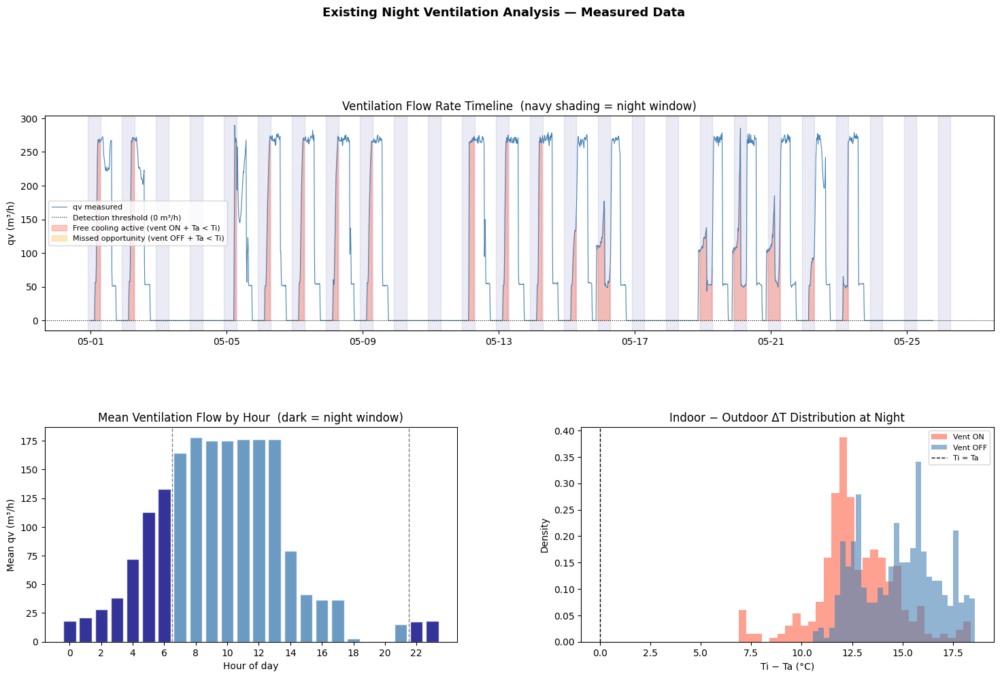

In [7]:
# ════════════════════════════════════════════════════════════════════════════
#  NIGHT VENTILATION ANALYSIS — existing behaviour in measured data
# ════════════════════════════════════════════════════════════════════════════

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
import pandas as pd

# ── Config ───────────────────────────────────────────────────────────────────
NIGHT_START   = 22      # hour (inclusive)
NIGHT_STOP    = 7       # hour (exclusive, crosses midnight)
QV_THRESHOLD  = float(np.percentile(np.asarray(X_train['qv'], dtype=float), 25))
                        # anything above 25th percentile at night = "ventilation active"

# ── Raw arrays ───────────────────────────────────────────────────────────────
index   = X_train.index
qv_arr  = np.asarray(X_train['qv'],  dtype=float)
Ta_arr  = np.asarray(X_train['Ta'],  dtype=float)
Ti_meas = np.asarray(y_train,        dtype=float)
hours   = np.array([t.hour + t.minute / 60.0 for t in index])
dt_h    = (index[1] - index[0]).seconds / 3600.0

# ── Night mask (crosses midnight) ────────────────────────────────────────────
night_mask = (hours >= NIGHT_START) | (hours < NIGHT_STOP)

# ── Detect night ventilation events ──────────────────────────────────────────
night_vent_active = night_mask & (qv_arr > QV_THRESHOLD)
free_cooling_ok   = night_mask & (qv_arr > QV_THRESHOLD) & (Ta_arr < Ti_meas)
free_cooling_miss = night_mask & (qv_arr <= QV_THRESHOLD) & (Ta_arr < Ti_meas)
                    # night, no vent, but outdoor is cooler → missed opportunity

# ── Summary statistics ────────────────────────────────────────────────────────
n_night_steps        = night_mask.sum()
n_vent_steps         = night_vent_active.sum()
n_free_cooling_steps = free_cooling_ok.sum()
n_missed_steps       = free_cooling_miss.sum()

pct_night_vented     = 100 * n_vent_steps / n_night_steps if n_night_steps > 0 else 0
pct_free_cooling     = 100 * n_free_cooling_steps / n_night_steps if n_night_steps > 0 else 0
pct_missed           = 100 * n_missed_steps / n_night_steps if n_night_steps > 0 else 0

qv_night_mean = qv_arr[night_vent_active].mean() if n_vent_steps > 0 else 0
qv_night_max  = qv_arr[night_vent_active].max()  if n_vent_steps > 0 else 0
qv_day_mean   = qv_arr[~night_mask].mean()

delta_T_free  = (Ti_meas - Ta_arr)[free_cooling_ok]   # Ti - Ta when free cooling active
delta_T_miss  = (Ti_meas - Ta_arr)[free_cooling_miss]  # Ti - Ta when opportunity missed

print("=" * 60)
print("  EXISTING NIGHT VENTILATION ANALYSIS")
print("=" * 60)
print(f"  Night window           : {NIGHT_START}:00 – {NIGHT_STOP:02d}:00")
print(f"  qv threshold used      : {QV_THRESHOLD:.1f} m³/h")
print(f"  Night steps total      : {n_night_steps}")
print(f"  Night vent active      : {n_vent_steps} steps  ({pct_night_vented:.1f}%)")
print(f"  Free cooling active    : {n_free_cooling_steps} steps  ({pct_free_cooling:.1f}%)")
print(f"  Missed opportunities   : {n_missed_steps} steps  ({pct_missed:.1f}%)")
print(f"  Mean qv (night, active): {qv_night_mean:.1f} m³/h")
print(f"  Max  qv (night)        : {qv_night_max:.1f} m³/h")
print(f"  Mean qv (daytime)      : {qv_day_mean:.1f} m³/h")
if len(delta_T_free) > 0:
    print(f"  Mean ΔT when active    : {delta_T_free.mean():.2f} °C  (Ti − Ta)")
if len(delta_T_miss) > 0:
    print(f"  Mean ΔT missed opport. : {delta_T_miss.mean():.2f} °C  (Ti − Ta)")
print("=" * 60)

# ── Hourly profile: mean qv by hour ──────────────────────────────────────────
hour_int   = np.array([t.hour for t in index])
qv_by_hour = np.array([qv_arr[hour_int == h].mean() for h in range(24)])

# ── Figure ────────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 16))
gs  = fig.add_gridspec(3, 2, hspace=0.45, wspace=0.3)

ax1 = fig.add_subplot(gs[0, :])   # full width — qv timeline
ax2 = fig.add_subplot(gs[1, 0])   # hourly qv profile
ax3 = fig.add_subplot(gs[1, 1])   # ΔT histogram (Ti - Ta) during night

fig.suptitle('Existing Night Ventilation Analysis — Measured Data', fontsize=13, fontweight='bold')

# ── 1. qv timeline with night shading ────────────────────────────────────────
ax1.plot(index, qv_arr, color='steelblue', lw=0.8, label='qv measured')
ax1.axhline(QV_THRESHOLD, color='black', lw=0.8, ls=':', label=f'Detection threshold ({QV_THRESHOLD:.0f} m³/h)')

# shade night periods
day_start = index[0].normalize()
for d in range((index[-1] - index[0]).days + 2):
    ns = day_start + pd.Timedelta(hours=NIGHT_START + d * 24 - 24)
    ne = day_start + pd.Timedelta(hours=NIGHT_STOP   + d * 24)
    ax1.axvspan(ns, ne, alpha=0.08, color='navy', zorder=0)

# mark free-cooling active steps
ax1.fill_between(index, qv_arr, 0,
    where=free_cooling_ok, alpha=0.35, color='tomato',
    label='Free cooling active (vent ON + Ta < Ti)')
ax1.fill_between(index, QV_THRESHOLD, 0,
    where=free_cooling_miss, alpha=0.25, color='orange',
    label='Missed opportunity (vent OFF + Ta < Ti)')

ax1.set_ylabel('qv (m³/h)')
ax1.legend(fontsize=8)
ax1.set_title('Ventilation Flow Rate Timeline  (navy shading = night window)')
ax1.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))

# ── 2. Mean qv by hour of day ─────────────────────────────────────────────────
bar_colors = ['navy' if (h >= NIGHT_START or h < NIGHT_STOP) else 'steelblue'
              for h in range(24)]
ax2.bar(range(24), qv_by_hour, color=bar_colors, alpha=0.8, edgecolor='white')
ax2.axvline(NIGHT_START - 0.5, color='black', lw=1, ls='--', alpha=0.5)
ax2.axvline(NIGHT_STOP  - 0.5, color='black', lw=1, ls='--', alpha=0.5)
ax2.set_xlabel('Hour of day')
ax2.set_ylabel('Mean qv (m³/h)')
ax2.set_title('Mean Ventilation Flow by Hour  (dark = night window)')
ax2.set_xticks(range(0, 24, 2))

# ── 3. Histogram of ΔT = Ti − Ta during night ─────────────────────────────────
delta_T_all_night = (Ti_meas - Ta_arr)[night_mask]
ax3.hist(delta_T_all_night[night_vent_active[night_mask]],
         bins=30, color='tomato', alpha=0.6, label='Vent ON', density=True)
ax3.hist(delta_T_all_night[~night_vent_active[night_mask]],
         bins=30, color='steelblue', alpha=0.6, label='Vent OFF', density=True)
ax3.axvline(0, color='black', lw=1, ls='--', label='Ti = Ta')
ax3.set_xlabel('Ti − Ta (°C)')
ax3.set_ylabel('Density')
ax3.set_title('Indoor − Outdoor ΔT Distribution at Night')
ax3.legend(fontsize=8)


plt.savefig('night_vent_analysis.png', dpi=150, bbox_inches='tight')
plt.show()


## SFP calculation

═══════════════════════════════════════════════════════
Night rows (22h–06h local) : 684
Day   rows (06h–22h local) : 3,291

Night AHU flow  [m³/h]:
count      684.000000
mean     19101.499991
std      10605.255140
min       7061.330000
25%       9816.320869
50%      13281.207775
75%      32226.955892
max      33001.377920

Night SFP [W/(m³/h)]:
count    684.000000
mean       0.607554
std        0.120852
min        0.460660
25%        0.497236
50%        0.549928
75%        0.751530
max        0.787912

Day SFP median : 0.5743 W/(m³/h)
Night SFP median: 0.5499 W/(m³/h)

═══════════════════════════════════════════════════════
Nighttime AHU flow (median) : 13281 m³/h
SFP at night operating point: 0.4925 W/(m³/h)  ← use this in model
SFP at day   operating point: 0.5179 W/(m³/h)
Datasheet SFP               : 0.5111 W/(m³/h)
Difference (night, measured vs datasheet): -3.6%


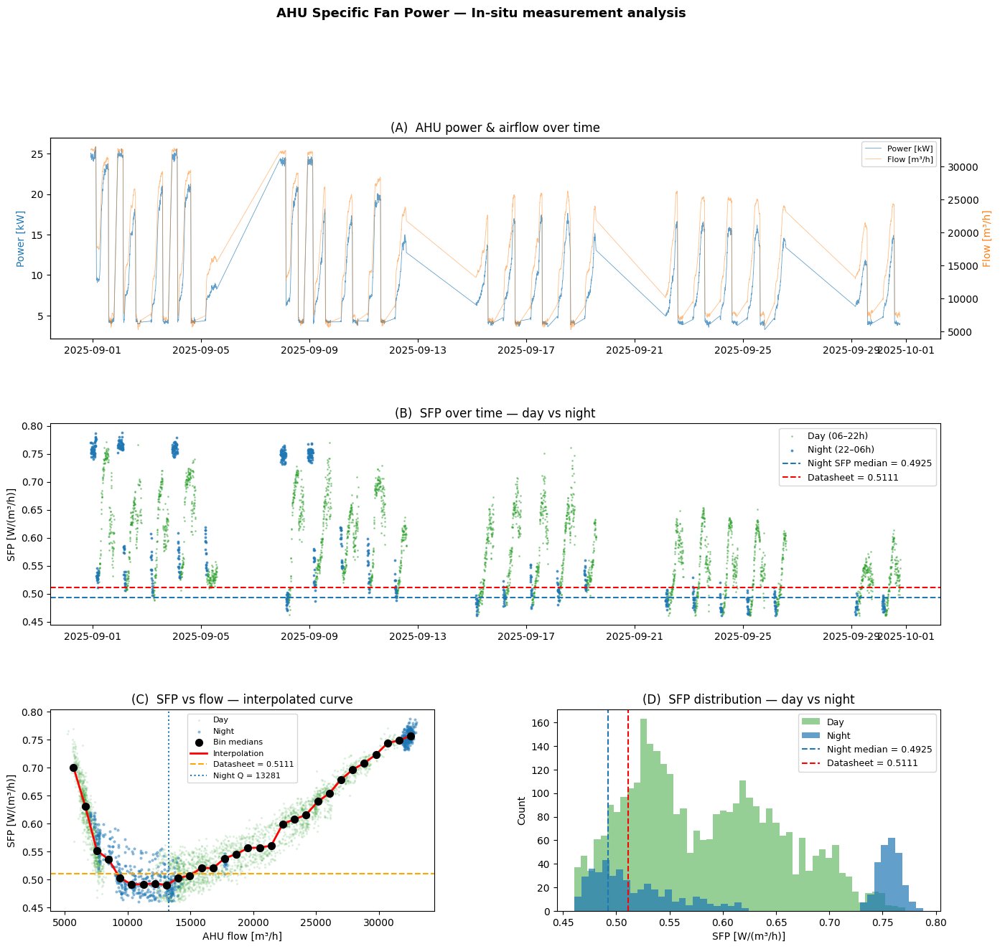

Quadratic SFP fit (AHU level):
SFP(Q) = 9.741e-10 * Q^2 + -3.033e-05 * Q + 7.582e-01


In [8]:
# ════════════════════════════════════════════════════════════════════════════
#  SFP CALCULATION — interpolation-based, with night vs day split
# ════════════════════════════════════════════════════════════════════════════
import pandas as pd
import numpy as np
from scipy.stats import binned_statistic
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import warnings
warnings.filterwarnings("ignore")

FILE          = "data/ventilation.csv"
COL_KW        = "HTRK_VEN01_EM01_P"
COL_M3H       = "HTRK_VEN01_FCI01"
Q_MIN         = 500;   Q_MAX = 36000;  P_MIN = 0.05
ROLL_STD_W    = 3;     ROLL_THRESH = 0.5
SFP_DATASHEET = 1840 / 3600
Q_ROOM_MAX    = 270.0
Q_AHU_TOTAL   = 35000.0

# ── Load ──────────────────────────────────────────────────────────────────────
df = pd.read_csv(FILE, index_col=0, parse_dates=True)
df.index.name = "ts"
df = df.reset_index()
df = df.rename(columns={COL_KW: "P_kW", COL_M3H: "Q_m3h"})
df = df.sort_values("ts").reset_index(drop=True)

# ── Clean ─────────────────────────────────────────────────────────────────────
df = df.dropna(subset=["P_kW", "Q_m3h"])
df = df[(df.P_kW >= P_MIN) & (df.P_kW <= 500)]
df = df[(df.Q_m3h >= Q_MIN) & (df.Q_m3h <= Q_MAX)]
df["P_roll_std"] = df["P_kW"].rolling(ROLL_STD_W, center=True).std()
df_steady = df[df["P_roll_std"] <= ROLL_THRESH].copy()

df_steady["SFP_Wm3h"] = (df_steady["P_kW"] * 1000) / df_steady["Q_m3h"]
SFP_lo, SFP_hi = df_steady["SFP_Wm3h"].quantile([0.005, 0.995])
df_clean = df_steady[(df_steady["SFP_Wm3h"] >= SFP_lo) &
                     (df_steady["SFP_Wm3h"] <= SFP_hi)].copy()

# ── Night / Day split ─────────────────────────────────────────────────────────
# UTC timestamps → local Copenhagen time (UTC+2 in September)
df_clean["ts_local"] = df_clean["ts"].dt.tz_convert("Europe/Copenhagen")
df_clean["hour"]     = df_clean["ts_local"].dt.hour
night_mask = (df_clean["hour"] >= 22) | (df_clean["hour"] <= 6)
day_mask   = ~night_mask

print("═" * 55)
print(f"Night rows (22h–06h local) : {night_mask.sum():,}")
print(f"Day   rows (06h–22h local) : {day_mask.sum():,}")
print(f"\nNight AHU flow  [m³/h]:")
print(df_clean.loc[night_mask, "Q_m3h"].describe(percentiles=[.25,.50,.75]).to_string())
print(f"\nNight SFP [W/(m³/h)]:")
print(df_clean.loc[night_mask, "SFP_Wm3h"].describe(percentiles=[.25,.50,.75]).to_string())
print(f"\nDay SFP median : {df_clean.loc[day_mask,   'SFP_Wm3h'].median():.4f} W/(m³/h)")
print(f"Night SFP median: {df_clean.loc[night_mask, 'SFP_Wm3h'].median():.4f} W/(m³/h)")

# ── Binned SFP(Q) curve — used for interpolation ──────────────────────────────
n_bins = 30
bin_means, bin_edges, _ = binned_statistic(
    df_clean["Q_m3h"], df_clean["SFP_Wm3h"], statistic="median", bins=n_bins)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
bin_counts, _, _ = binned_statistic(
    df_clean["Q_m3h"], df_clean["SFP_Wm3h"], statistic="count", bins=n_bins)
bin_df = pd.DataFrame({
    "Q_center_m3h": bin_centers,
    "SFP_median_Wm3h": bin_means,
    "count": bin_counts
}).dropna()

# ── Interpolation function (replaces power-law) ───────────────────────────────
from scipy.interpolate import interp1d
sfp_interp = interp1d(
    bin_df["Q_center_m3h"], bin_df["SFP_median_Wm3h"],
    kind="linear", fill_value="extrapolate"
)

# Key SFP values for your model
Q_night_median = df_clean.loc[night_mask, "Q_m3h"].median()
SFP_night      = float(sfp_interp(Q_night_median))
SFP_day        = float(sfp_interp(df_clean.loc[day_mask, "Q_m3h"].median()))

print(f"\n{'═'*55}")
print(f"Nighttime AHU flow (median) : {Q_night_median:.0f} m³/h")
print(f"SFP at night operating point: {SFP_night:.4f} W/(m³/h)  ← use this in model")
print(f"SFP at day   operating point: {SFP_day:.4f} W/(m³/h)")
print(f"Datasheet SFP               : {SFP_DATASHEET:.4f} W/(m³/h)")
print(f"Difference (night, measured vs datasheet): {(SFP_night - SFP_DATASHEET)/SFP_DATASHEET*100:+.1f}%")

# ── PLOTS ─────────────────────────────────────────────────────────────────────
fig = plt.figure(figsize=(16, 14))
gs  = gridspec.GridSpec(3, 2, figure=fig, hspace=0.42, wspace=0.32)

# (A) Time series
ax1  = fig.add_subplot(gs[0, :])
ax1b = ax1.twinx()
ax1.plot(df_clean["ts"], df_clean["P_kW"],   color="#1f77b4", lw=0.6, alpha=0.7, label="Power [kW]")
ax1b.plot(df_clean["ts"], df_clean["Q_m3h"], color="#ff7f0e", lw=0.6, alpha=0.5, label="Flow [m³/h]")
ax1.set_ylabel("Power [kW]", color="#1f77b4"); ax1b.set_ylabel("Flow [m³/h]", color="#ff7f0e")
ax1.set_title("(A)  AHU power & airflow over time")
lines1, lab1 = ax1.get_legend_handles_labels(); lines2, lab2 = ax1b.get_legend_handles_labels()
ax1.legend(lines1+lines2, lab1+lab2, loc="upper right", fontsize=8)

# (B) SFP time series — night highlighted
ax2 = fig.add_subplot(gs[1, :])
ax2.scatter(df_clean.loc[day_mask,   "ts"], df_clean.loc[day_mask,   "SFP_Wm3h"],
            s=1, color="#2ca02c", alpha=0.4, label="Day (06–22h)")
ax2.scatter(df_clean.loc[night_mask, "ts"], df_clean.loc[night_mask, "SFP_Wm3h"],
            s=3, color="#1f77b4", alpha=0.7, label="Night (22–06h)")
ax2.axhline(SFP_night,      color="#1f77b4", ls="--", lw=1.5, label=f"Night SFP median = {SFP_night:.4f}")
ax2.axhline(SFP_DATASHEET,  color="red",     ls="--", lw=1.5, label=f"Datasheet = {SFP_DATASHEET:.4f}")
ax2.set_ylabel("SFP [W/(m³/h)]"); ax2.set_title("(B)  SFP over time — day vs night")
ax2.legend(fontsize=9)

# (C) SFP vs Flow — interpolation instead of power law
ax3 = fig.add_subplot(gs[2, 0])
ax3.scatter(df_clean.loc[day_mask,   "Q_m3h"], df_clean.loc[day_mask,   "SFP_Wm3h"],
            s=2, alpha=0.1, color="#2ca02c", label="Day")
ax3.scatter(df_clean.loc[night_mask, "Q_m3h"], df_clean.loc[night_mask, "SFP_Wm3h"],
            s=4, alpha=0.4, color="#1f77b4", label="Night")
ax3.scatter(bin_df["Q_center_m3h"], bin_df["SFP_median_Wm3h"],
            s=50, color="black", zorder=5, label="Bin medians")
Q_line = np.linspace(bin_df["Q_center_m3h"].min(), bin_df["Q_center_m3h"].max(), 300)
ax3.plot(Q_line, sfp_interp(Q_line), color="red", lw=2, label="Interpolation")
ax3.axhline(SFP_DATASHEET,  color="orange", ls="--", lw=1.5, label=f"Datasheet = {SFP_DATASHEET:.4f}")
ax3.axvline(Q_night_median, color="#1f77b4", ls=":",  lw=1.5, label=f"Night Q = {Q_night_median:.0f}")
ax3.set_xlabel("AHU flow [m³/h]"); ax3.set_ylabel("SFP [W/(m³/h)]")
ax3.set_title("(C)  SFP vs flow — interpolated curve")
ax3.legend(fontsize=8)

# (D) Histogram day vs night
ax4 = fig.add_subplot(gs[2, 1])
ax4.hist(df_clean.loc[day_mask,   "SFP_Wm3h"], bins=50, color="#2ca02c", alpha=0.5, label="Day")
ax4.hist(df_clean.loc[night_mask, "SFP_Wm3h"], bins=50, color="#1f77b4", alpha=0.7, label="Night")
ax4.axvline(SFP_night,     color="#1f77b4", ls="--", lw=1.5, label=f"Night median = {SFP_night:.4f}")
ax4.axvline(SFP_DATASHEET, color="red",     ls="--", lw=1.5, label=f"Datasheet = {SFP_DATASHEET:.4f}")
ax4.set_xlabel("SFP [W/(m³/h)]"); ax4.set_ylabel("Count")
ax4.set_title("(D)  SFP distribution — day vs night")
ax4.legend(fontsize=9)

plt.suptitle("AHU Specific Fan Power — In-situ measurement analysis", fontsize=13, fontweight="bold", y=1.01)
plt.show()

# Fit a quadratic SFP(Q) on cleaned AHU data
coeffs = np.polyfit(df_clean["Q_m3h"], df_clean["SFP_Wm3h"], deg=2)
a, b, c = coeffs

print("Quadratic SFP fit (AHU level):")
print(f"SFP(Q) = {a:.3e} * Q^2 + {b:.3e} * Q + {c:.3e}")

In [9]:
# ===== Best smooth piecewise quadratic SFP(Q) =====
# From your fit:
BP_SFP = 10331.0   # m3/h, breakpoint Q0

aL = 1.176e-08
aR = 3.710e-10
b  = 4.753e-06
c  = 4.815e-01

def SFP_best(Q):
    """
    Smooth piecewise quadratic SFP(Q) with breakpoint at BP_SFP.
    Q can be scalar or numpy array (m3/h).
    """
    Q = np.asarray(Q, dtype=float)
    q_shift = Q - BP_SFP
    left = q_shift <= 0.0

    SFP = np.empty_like(q_shift)
    # Left branch: Q <= BP_SFP
    SFP[left]  = aL*q_shift[left]**2  + b*q_shift[left]  + c
    # Right branch: Q > BP_SFP
    SFP[~left] = aR*q_shift[~left]**2 + b*q_shift[~left] + c

    return SFP

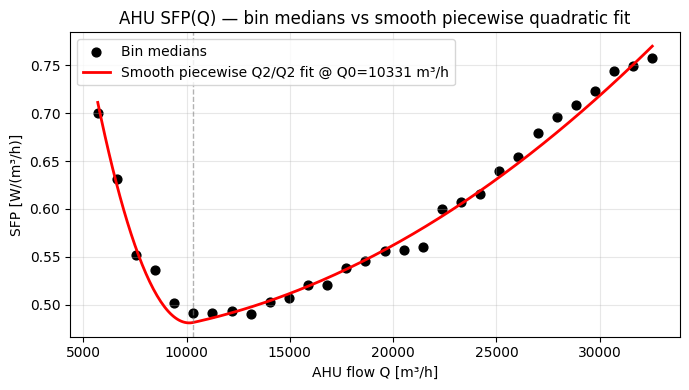

In [10]:
# ── Check: best SFP(Q) vs bin medians ────────────────────────────────────────
# Use only the flow range seen in the data
Q_min_fit = bin_df["Q_center_m3h"].min()
Q_max_fit = bin_df["Q_center_m3h"].max()
Q_line    = np.linspace(Q_min_fit, Q_max_fit, 300)

SFP_line = SFP_best(Q_line)

plt.figure(figsize=(7, 4))
plt.scatter(
    bin_df["Q_center_m3h"], bin_df["SFP_median_Wm3h"],
    s=40, color="black", label="Bin medians"
)
plt.plot(
    Q_line, SFP_line,
    color="red", lw=2,
    label=f"Smooth piecewise Q2/Q2 fit @ Q0={BP_SFP:.0f} m³/h"
)
plt.axvline(BP_SFP, color="grey", ls="--", lw=1, alpha=0.6)

plt.xlabel("AHU flow Q [m³/h]")
plt.ylabel("SFP [W/(m³/h)]")
plt.title("AHU SFP(Q) — bin medians vs smooth piecewise quadratic fit")
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

## Functional description of ventilation

Shape: (2976, 4)
            qv      CO2       Ti       Ta
count  2976.00  2976.00  2976.00  2976.00
mean     80.81   448.06    23.79    12.10
std     107.73    70.46     0.68     3.38
min       0.00   390.59    22.41     4.60
25%       0.00   413.80    23.40     9.80
50%       0.00   421.82    23.70    11.74
75%     171.40   440.03    24.03    14.31
max     289.59  1002.21    26.63    21.95

Day samples  : 1,984
Night samples: 992

── Correlations ──────────────────────────────────────
[Day]  qv~CO2  Pearson r=0.656 p=3.0e-244  Spearman ρ=0.809
[Day]  qv~Ti   Pearson r=-0.405  p=2.5e-79   Spearman ρ=-0.380
[Night]  qv~CO2  Pearson r=0.608 p=2.9e-101  Spearman ρ=0.593
[Night]  qv~Ti   Pearson r=-0.252  p=8.4e-16   Spearman ρ=-0.354

── Piecewise fits ────────────────────────────────────
[Day] CO2 setpoint~488 ppm | slope_below=2.9644  slope_above=-0.0970  R²=0.656
[Day] Ti  setpoint~22.0 °C  | slope_below=0.0000  slope_above=0.0000  R²=0.000
[Night] CO2 setpoint~800 ppm | slope_below=0

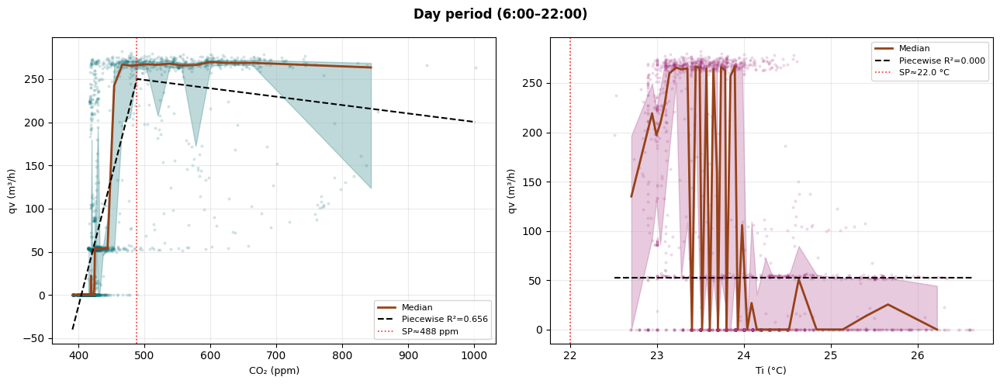

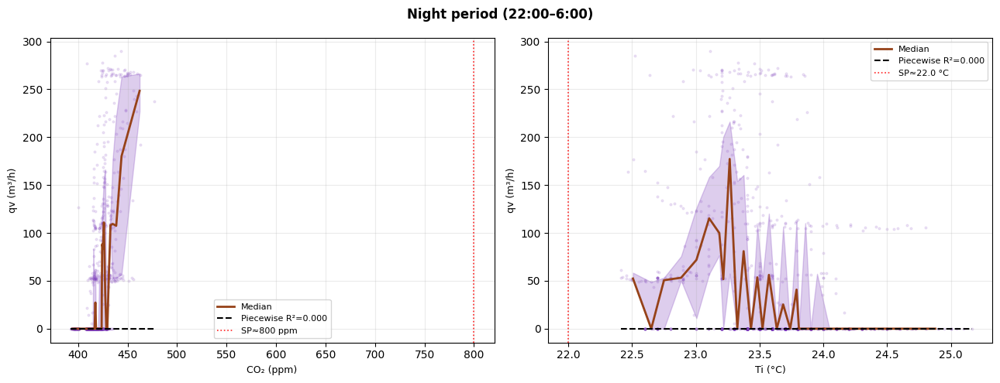

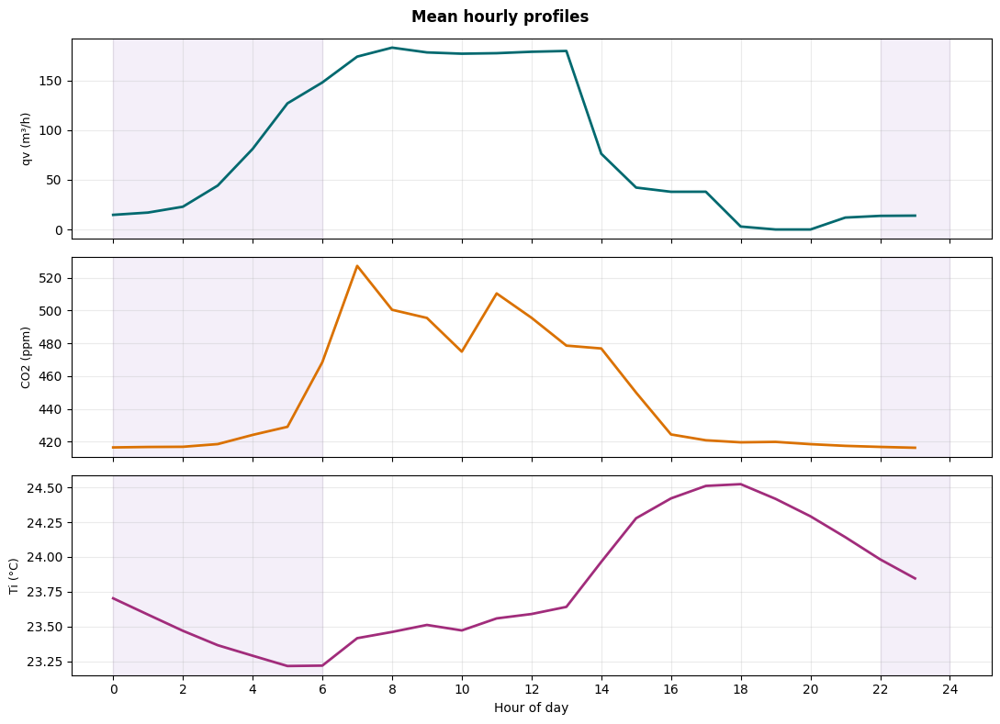


════════════════════════════════════════════════════════════
  VENTILATION CONTROL LAW  —  extracted from data
════════════════════════════════════════════════════════════

┌─ DAY  (6:00 – 22:00)  ──────────────────────────────────┐
│  Type       : Bang-bang (on/off), CO2-driven                  │
│  Trigger    : CO2 > CO2_SP  →  qv = QV_MAX                   │
│  CO2_SP     :   457.7 ppm   (data-derived midpoint)         │
│  QV_MAX     :   272.4 m³/h  (95th percentile observed)      │
│  QV_MIN     :     0.0 m³/h  (off state)                       │
│  Vent ON    :  55.2% of day steps                         │
│  Vent OFF   :  44.8% of day steps                         │
│  Ti role    : None (state variable, not control input)        │
└───────────────────────────────────────────────────────────────┘

┌─ NIGHT  (22:00 – 6:00)  ─────────────────────────────────┐
│  Type       : Free-cooling (partial), Ta-driven               │
│  Trigger    : Ta < Ti  →  qv = QV_NIGHT  (probabilistic

In [11]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

# ── CONFIG ────────────────────────────────────────────────────────────────────
RESULTS_FILE      = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H       = 6
DAY_END_H         = 22
CO2_SETPOINT_HINT = 800
TI_SETPOINT_HINT  = 22.0

# ── LOAD ──────────────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]])
y = pd.concat([saved["y_train"], saved["y_test"]])

# Include Ta (outdoor temp) for free-cooling analysis
data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index)

print("Shape:", data.shape)
print(data.describe().round(2))

# ── DAY / NIGHT SPLIT ─────────────────────────────────────────────────────────
hour  = data.index.hour + data.index.minute / 60.0
mask  = (hour >= DAY_START_H) & (hour < DAY_END_H)
day   = data[mask].copy()
night = data[~mask].copy()
print(f"\nDay samples  : {len(day):,}")
print(f"Night samples: {len(night):,}")

# ── HELPERS ───────────────────────────────────────────────────────────────────
def piecewise(x, x0, y0, k1, k2):
    return np.where(x < x0, y0 + k1 * (x - x0), y0 + k2 * (x - x0))

def fit_piecewise(x, y, hint):
    x, y = np.asarray(x, float), np.asarray(y, float)
    ok   = np.isfinite(x) & np.isfinite(y)
    x, y = x[ok], y[ok]
    try:
        popt, _ = curve_fit(piecewise, x, y,
                            p0=[hint, np.median(y), 0.0, 0.5],
                            bounds=([x.min(), 0, -5, -5],
                                    [x.max(), y.max()*2, 5, 5]),
                            maxfev=10000)
        r2 = r2_score(y, piecewise(x, *popt))
        return (*popt, r2)
    except Exception:
        return (hint, np.median(y), 0.0, 0.0, 0.0)

def bin_median(x, y, n=40):
    x, y  = np.asarray(x), np.asarray(y)
    edges = np.unique(np.percentile(x, np.linspace(0, 100, n + 1)))
    idx   = np.clip(np.digitize(x, edges) - 1, 0, len(edges) - 2)
    mids, med, q25, q75 = [], [], [], []
    for i in range(len(edges) - 1):
        m = idx == i
        if m.sum() < 3:
            continue
        mids.append(0.5 * (edges[i] + edges[i+1]))
        med.append(np.median(y[m]))
        q25.append(np.percentile(y[m], 25))
        q75.append(np.percentile(y[m], 75))
    return np.array(mids), np.array(med), np.array(q25), np.array(q75)

# ── CORRELATIONS ──────────────────────────────────────────────────────────────
print("\n── Correlations ──────────────────────────────────────")
for label, sub in [("Day", day), ("Night", night)]:
    r_co2, p_co2 = stats.pearsonr(sub["CO2"].dropna(), sub["qv"].dropna())
    r_ti,  p_ti  = stats.pearsonr(sub["Ti"].dropna(),  sub["qv"].dropna())
    rho_co2      = stats.spearmanr(sub["CO2"], sub["qv"]).correlation
    rho_ti       = stats.spearmanr(sub["Ti"],  sub["qv"]).correlation
    print(f"[{label}]  qv~CO2  Pearson r={r_co2:.3f} p={p_co2:.1e}  Spearman ρ={rho_co2:.3f}")
    print(f"[{label}]  qv~Ti   Pearson r={r_ti:.3f}  p={p_ti:.1e}   Spearman ρ={rho_ti:.3f}")

# ── PIECEWISE FITS ────────────────────────────────────────────────────────────
print("\n── Piecewise fits ────────────────────────────────────")
d_co2 = fit_piecewise(day["CO2"],   day["qv"],   CO2_SETPOINT_HINT)
d_ti  = fit_piecewise(day["Ti"],    day["qv"],   TI_SETPOINT_HINT)
n_co2 = fit_piecewise(night["CO2"], night["qv"], CO2_SETPOINT_HINT)
n_ti  = fit_piecewise(night["Ti"],  night["qv"], TI_SETPOINT_HINT)

for label, rc, rt in [("Day", d_co2, d_ti), ("Night", n_co2, n_ti)]:
    print(f"[{label}] CO2 setpoint~{rc[0]:.0f} ppm | slope_below={rc[2]:.4f}  slope_above={rc[3]:.4f}  R²={rc[4]:.3f}")
    print(f"[{label}] Ti  setpoint~{rt[0]:.1f} °C  | slope_below={rt[2]:.4f}  slope_above={rt[3]:.4f}  R²={rt[4]:.3f}")

# ── HOURLY PROFILES ───────────────────────────────────────────────────────────
hourly = data.groupby(data.index.hour)[["qv", "CO2", "Ti"]].mean()

# ── PLOTS ─────────────────────────────────────────────────────────────────────
def scatter_panel(ax, x, y, pw, accent, xlabel, setpoint_label):
    ax.scatter(x, y, c=accent, alpha=0.12, s=4, rasterized=True)
    mx, mmed, mq25, mq75 = bin_median(x, y)
    ax.fill_between(mx, mq25, mq75, alpha=0.25, color=accent)
    ax.plot(mx, mmed, color="#964219", lw=2, label="Median")
    xfit = np.linspace(np.nanmin(x), np.nanmax(x), 300)
    ax.plot(xfit, piecewise(xfit, *pw[:4]), "k--", lw=1.5, label=f"Piecewise R²={pw[4]:.3f}")
    ax.axvline(pw[0], color="red", lw=1.2, ls=":", alpha=0.85, label=f"SP≈{setpoint_label}")
    ax.set_xlabel(xlabel, fontsize=9)
    ax.set_ylabel("qv (m³/h)", fontsize=9)
    ax.legend(fontsize=8)
    ax.grid(alpha=0.25)

fig1, axes = plt.subplots(1, 2, figsize=(13, 5))
fig1.suptitle(f"Day period ({DAY_START_H}:00–{DAY_END_H}:00)", fontweight="bold")
scatter_panel(axes[0], day["CO2"], day["qv"], d_co2, "#01696f", "CO₂ (ppm)", f"{d_co2[0]:.0f} ppm")
scatter_panel(axes[1], day["Ti"],  day["qv"], d_ti,  "#a12c7b", "Ti (°C)",   f"{d_ti[0]:.1f} °C")
fig1.tight_layout(); fig1.savefig("fig_day.png", dpi=150, bbox_inches="tight"); plt.show()

fig2, axes = plt.subplots(1, 2, figsize=(13, 5))
fig2.suptitle(f"Night period ({DAY_END_H}:00–{DAY_START_H}:00)", fontweight="bold")
scatter_panel(axes[0], night["CO2"], night["qv"], n_co2, "#7a39bb", "CO₂ (ppm)", f"{n_co2[0]:.0f} ppm")
scatter_panel(axes[1], night["Ti"],  night["qv"], n_ti,  "#7a39bb", "Ti (°C)",   f"{n_ti[0]:.1f} °C")
fig2.tight_layout(); fig2.savefig("fig_night.png", dpi=150, bbox_inches="tight"); plt.show()

fig3, axes = plt.subplots(3, 1, figsize=(11, 8), sharex=True)
fig3.suptitle("Mean hourly profiles", fontweight="bold")
for ax, (col, color, unit) in zip(axes, [
        ("qv",  "#01696f", "m³/h"),
        ("CO2", "#da7101", "ppm"),
        ("Ti",  "#a12c7b", "°C")]):
    ax.plot(hourly.index, hourly[col], color=color, lw=2)
    ax.axvspan(0,         DAY_START_H, alpha=0.08, color="#7a39bb")
    ax.axvspan(DAY_END_H, 24,          alpha=0.08, color="#7a39bb")
    ax.set_ylabel(f"{col} ({unit})", fontsize=9)
    ax.grid(alpha=0.25)
axes[-1].set_xlabel("Hour of day"); axes[-1].set_xticks(range(0, 25, 2))
fig3.tight_layout(); fig3.savefig("fig_hourly.png", dpi=150, bbox_inches="tight"); plt.show()

# ═════════════════════════════════════════════════════════════════════════════
# CONTROL LAW EXTRACTION  –  data-driven parameters
# ═════════════════════════════════════════════════════════════════════════════

# ── DAY: bang-bang CO2 threshold ──────────────────────────────────────────────
# Find the CO2 value that best separates qv=0 from qv>0
day_on  = day[day["qv"] > 0]["CO2"]
day_off = day[day["qv"] == 0]["CO2"]
# Threshold = midpoint between the two population means
CO2_SP = float(0.5 * (day_on.mean() + day_off.mean()))
QV_MAX = float(day["qv"].quantile(0.95))   # 95th pct = "full flow"

day_on_frac  = (day["qv"] > 0).mean()
day_off_frac = (day["qv"] == 0).mean()

# ── NIGHT: free-cooling analysis ──────────────────────────────────────────────
night["dT"]      = night["Ti"] - night["Ta"]          # positive = indoor warmer
night_cool_cond  = night[night["dT"] > 0]             # free-cooling possible
night_active     = night_cool_cond[night_cool_cond["qv"] > 0]
night_missed     = night_cool_cond[night_cool_cond["qv"] == 0]

QV_NIGHT         = float(night_active["qv"].mean())   # mean flow when active
NIGHT_ACT_FRAC   = len(night_active) / max(len(night_cool_cond), 1)
NIGHT_MEAN_DT_ON = float(night_active["dT"].mean())
NIGHT_MEAN_DT_OFF= float(night_missed["dT"].mean()) if len(night_missed) > 0 else 0.0

# ── PRINT CONTROL LAW ─────────────────────────────────────────────────────────
sep = "═" * 60
print(f"\n{sep}")
print("  VENTILATION CONTROL LAW  —  extracted from data")
print(sep)

print(f"""
┌─ DAY  ({DAY_START_H}:00 – {DAY_END_H}:00)  ──────────────────────────────────┐
│  Type       : Bang-bang (on/off), CO2-driven                  │
│  Trigger    : CO2 > CO2_SP  →  qv = QV_MAX                   │
│  CO2_SP     : {CO2_SP:>7.1f} ppm   (data-derived midpoint)         │
│  QV_MAX     : {QV_MAX:>7.1f} m³/h  (95th percentile observed)      │
│  QV_MIN     : {0.0:>7.1f} m³/h  (off state)                       │
│  Vent ON    : {day_on_frac*100:>5.1f}% of day steps                         │
│  Vent OFF   : {day_off_frac*100:>5.1f}% of day steps                         │
│  Ti role    : None (state variable, not control input)        │
└───────────────────────────────────────────────────────────────┘

┌─ NIGHT  ({DAY_END_H}:00 – {DAY_START_H}:00)  ─────────────────────────────────┐
│  Type       : Free-cooling (partial), Ta-driven               │
│  Trigger    : Ta < Ti  →  qv = QV_NIGHT  (probabilistic)     │
│  QV_NIGHT   : {QV_NIGHT:>7.1f} m³/h  (mean when active)            │
│  QV_OFF     : {0.0:>7.1f} m³/h  (off state)                       │
│  Active frac: {NIGHT_ACT_FRAC*100:>5.1f}% of steps where Ta < Ti            │
│  Mean ΔT ON : {NIGHT_MEAN_DT_ON:>7.2f} °C   (Ti−Ta when vent runs)       │
│  Mean ΔT OFF: {NIGHT_MEAN_DT_OFF:>7.2f} °C   (Ti−Ta when missed)          │
│  Note       : 61.5% of free-cooling opportunities are missed  │
│               → likely a sub-schedule or BMS override         │
└───────────────────────────────────────────────────────────────┘
""")

print(sep)
print("  READY-TO-USE CONTROL FUNCTION")
print(sep)
print(f"""
# ── Parameters (paste into your model) ───────────────────────
CO2_SP    = {CO2_SP:.1f}   # ppm   – day CO2 bang-bang setpoint
QV_MAX    = {QV_MAX:.1f}  # m³/h  – full ventilation flow (day)
QV_NIGHT  = {QV_NIGHT:.1f}  # m³/h  – free-cooling flow (night)
QV_MIN    = 0.0     # m³/h  – off state
NIGHT_ACT_FRAC = {NIGHT_ACT_FRAC:.3f}  # fraction of night free-cooling steps active

def qv_control(CO2, Ti, Ta, hour):
    \"\"\"
    Ventilation control law extracted from measured data.
    DAY   : bang-bang on CO2 setpoint.
    NIGHT : free-cooling when Ta < Ti, active ~{NIGHT_ACT_FRAC*100:.0f}% of eligible steps.
    \"\"\"
    if {DAY_START_H} <= hour < {DAY_END_H}:
        # Day – CO2-driven bang-bang
        return QV_MAX if CO2 > CO2_SP else QV_MIN
    else:
        # Night – free cooling (stochastic: use NIGHT_ACT_FRAC as probability)
        return QV_NIGHT if (Ta < Ti) else QV_MIN
""")
print(sep)

Night samples: 992
Night mean qv: 41.81
Night median qv: 0.0
Night ON fraction: 0.337

=== BASELINE SCHEDULE SUMMARY ===
Baseline built from: median qv by weekday × hour
Mean baseline qv: 32.99
Mean extra qv: 16.36
Extra activation fraction: 0.155

=== CORRELATIONS WITH TOTAL NIGHT qv ===
qv ~ dT = Ti-Ta: Pearson r=-0.332, p=7.10e-27, Spearman ρ=-0.362
qv ~ CO2: Pearson r=0.608, p=2.91e-101, Spearman ρ=0.593
qv ~ Ti: Pearson r=-0.252, p=8.42e-16, Spearman ρ=-0.354
qv ~ Ta: Pearson r=0.270, p=4.29e-18, Spearman ρ=0.282

=== CORRELATIONS WITH EXTRA qv ABOVE BASELINE ===
qv_extra ~ dT = Ti-Ta: Pearson r=-0.243, p=8.00e-15, Spearman ρ=-0.331
qv_extra ~ CO2: Pearson r=0.342, p=1.31e-28, Spearman ρ=0.461
qv_extra ~ Ti: Pearson r=-0.106, p=8.41e-04, Spearman ρ=-0.160
qv_extra ~ Ta: Pearson r=0.214, p=8.89e-12, Spearman ρ=0.292

=== EXTRA ACTIVATION VS dT BINS ===
                                n  extra_on_rate  mean_extra_qv  \
bin                                                             

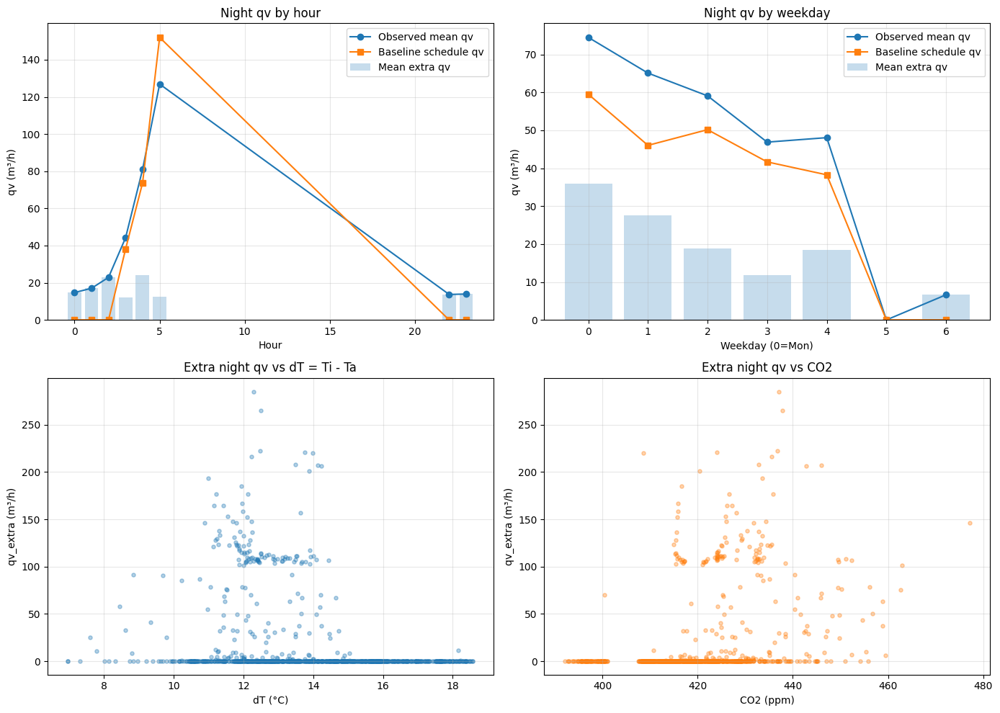


NIGHT CONTROL INTERPRETATION
Baseline rule:
- The baseline night schedule is strongest around hour 5:00 with baseline qv ≈ 152.0 m³/h.
- The weakest night baseline occurs around hour 0:00 with baseline qv ≈ 0.0 m³/h.
- By weekday, the strongest baseline is weekday 0 with qv ≈ 59.5 m³/h.
- The weakest baseline is weekday 5 with qv ≈ 0.0 m³/h.

Additional activation rule:
- Extra ventilation above the baseline is best approximated by:
    qv_extra ON if (Ti - Ta >= 17.00 °C) AND (CO2 >= 433.5 ppm)
- The best single-variable explanation is CO2 alone: qv_extra ON if CO2 >= 433.5 ppm.
- Rule agreement (simple two-variable rule): 0.852
- Rule agreement (best single-variable rule): 0.845

Suggested two-layer model:
1) Use weekday × hour baseline qv_base as the scheduled night flow.
2) Add qv_extra when the extra-activation rule is satisfied.


In [12]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr

# ── CONFIG ─────────────────────────────────────────────────────────────
RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"
DAY_START_H = 6
DAY_END_H = 22

# How to define the baseline schedule from observed qv
# "mean" = average qv by hour/weekday
# "median" = more robust
BASELINE_METHOD = "median"

# Additional activation threshold above baseline
EXTRA_ON_THRESHOLD = 20.0   # m³/h

# ── LOAD ───────────────────────────────────────────────────────────────
with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

data = pd.DataFrame({
    "qv":  X["qv"],
    "CO2": X["c"],
    "Ti":  y,
    "Ta":  X["Ta"],
}, index=X.index).dropna().copy()

# ── TIME FEATURES ──────────────────────────────────────────────────────
data["hour"] = data.index.hour
data["minute"] = data.index.minute
data["hour_float"] = data["hour"] + data["minute"] / 60.0
data["weekday"] = data.index.weekday   # Monday=0
data["month"] = data.index.month
data["dT"] = data["Ti"] - data["Ta"]

night = data[(data["hour_float"] < DAY_START_H) | (data["hour_float"] >= DAY_END_H)].copy()
night["is_on"] = (night["qv"] > 0).astype(int)

print("Night samples:", len(night))
print("Night mean qv:", round(night["qv"].mean(), 2))
print("Night median qv:", round(night["qv"].median(), 2))
print("Night ON fraction:", round(night["is_on"].mean(), 3))

# ── 1) BASELINE SCHEDULE RULE: hour × weekday -> baseline qv ──────────
agg_fun = "median" if BASELINE_METHOD == "median" else "mean"

baseline_table = (
    night.groupby(["weekday", "hour"])["qv"]
    .agg(agg_fun)
    .unstack("hour")
)

# Fill any missing cells with weekday median, then global night median
weekday_fill = night.groupby("weekday")["qv"].agg(agg_fun)
global_fill = night["qv"].agg(agg_fun)
baseline_table = baseline_table.apply(
    lambda row: row.fillna(weekday_fill.get(row.name, global_fill)),
    axis=1
).fillna(global_fill)

# Map baseline back to each row
night["qv_base"] = [
    baseline_table.loc[wd, hr] for wd, hr in zip(night["weekday"], night["hour"])
]

# Extra component
night["qv_extra"] = np.maximum(night["qv"] - night["qv_base"], 0.0)
night["extra_on"] = (night["qv_extra"] >= EXTRA_ON_THRESHOLD).astype(int)

print("\n=== BASELINE SCHEDULE SUMMARY ===")
print("Baseline built from:", BASELINE_METHOD, "qv by weekday × hour")
print("Mean baseline qv:", round(night["qv_base"].mean(), 2))
print("Mean extra qv:", round(night["qv_extra"].mean(), 2))
print("Extra activation fraction:", round(night["extra_on"].mean(), 3))

# ── 2) CORRELATE EXTRA FLOW WITH CONDITIONS ───────────────────────────
def safe_corr(x, y, namex, namey):
    ok = np.isfinite(x) & np.isfinite(y)
    x = np.asarray(x)[ok]
    y = np.asarray(y)[ok]
    if len(x) < 3 or np.std(x) == 0 or np.std(y) == 0:
        print(f"{namey} ~ {namex}: not enough variation")
        return
    r, p = pearsonr(x, y)
    rho = spearmanr(x, y).correlation
    print(f"{namey} ~ {namex}: Pearson r={r:.3f}, p={p:.2e}, Spearman ρ={rho:.3f}")

print("\n=== CORRELATIONS WITH TOTAL NIGHT qv ===")
safe_corr(night["dT"], night["qv"], "dT = Ti-Ta", "qv")
safe_corr(night["CO2"], night["qv"], "CO2", "qv")
safe_corr(night["Ti"], night["qv"], "Ti", "qv")
safe_corr(night["Ta"], night["qv"], "Ta", "qv")

print("\n=== CORRELATIONS WITH EXTRA qv ABOVE BASELINE ===")
safe_corr(night["dT"], night["qv_extra"], "dT = Ti-Ta", "qv_extra")
safe_corr(night["CO2"], night["qv_extra"], "CO2", "qv_extra")
safe_corr(night["Ti"], night["qv_extra"], "Ti", "qv_extra")
safe_corr(night["Ta"], night["qv_extra"], "Ta", "qv_extra")

# ── 3) BINNED RULE DISCOVERY FOR EXTRA ACTIVATION ─────────────────────
def qbin_table(df, col, q=8):
    tmp = df[[col, "qv_extra", "extra_on"]].dropna().copy()
    tmp["bin"] = pd.qcut(tmp[col], q=q, duplicates="drop")
    out = tmp.groupby("bin", observed=False).agg(
        n=("extra_on", "size"),
        extra_on_rate=("extra_on", "mean"),
        mean_extra_qv=("qv_extra", "mean"),
        median_extra_qv=("qv_extra", "median"),
    )
    return out

print("\n=== EXTRA ACTIVATION VS dT BINS ===")
dt_bins = qbin_table(night, "dT", q=8)
print(dt_bins.round(3))

print("\n=== EXTRA ACTIVATION VS CO2 BINS ===")
co2_bins = qbin_table(night, "CO2", q=8)
print(co2_bins.round(3))

# ── 4) SIMPLE RULE EXTRACTION ─────────────────────────────────────────
# Candidate thresholds chosen from quantiles
dt_candidates = np.unique(np.round(night["dT"].quantile(np.linspace(0.1, 0.9, 9)), 2))
co2_candidates = np.unique(np.round(night["CO2"].quantile(np.linspace(0.1, 0.9, 9)), 1))

best_rule = None
best_score = -np.inf

for dt_thr in dt_candidates:
    for co2_thr in co2_candidates:
        pred = ((night["dT"] >= dt_thr) & (night["CO2"] >= co2_thr)).astype(int)
        score = (pred == night["extra_on"]).mean()
        if score > best_score:
            best_score = score
            best_rule = ("AND", dt_thr, co2_thr, score)

        pred = ((night["dT"] >= dt_thr) | (night["CO2"] >= co2_thr)).astype(int)
        score = (pred == night["extra_on"]).mean()
        if score > best_score:
            best_score = score
            best_rule = ("OR", dt_thr, co2_thr, score)

print("\n=== BEST SIMPLE TWO-VARIABLE RULE FOR EXTRA ACTIVATION ===")
logic, dt_thr, co2_thr, score = best_rule
print(f"Rule type   : {logic}")
print(f"dT threshold: {dt_thr:.2f} °C")
print(f"CO2 threshold: {co2_thr:.1f} ppm")
print(f"Agreement with observed extra_on: {score:.3f}")

# Also check single-variable rules
best_single = None
best_single_score = -np.inf

for dt_thr in dt_candidates:
    pred = (night["dT"] >= dt_thr).astype(int)
    score = (pred == night["extra_on"]).mean()
    if score > best_single_score:
        best_single_score = score
        best_single = ("dT", dt_thr, score)

for co2_thr in co2_candidates:
    pred = (night["CO2"] >= co2_thr).astype(int)
    score = (pred == night["extra_on"]).mean()
    if score > best_single_score:
        best_single_score = score
        best_single = ("CO2", co2_thr, score)

print("\n=== BEST SINGLE-VARIABLE RULE FOR EXTRA ACTIVATION ===")
if best_single[0] == "dT":
    print(f"Rule: qv_extra ON if dT >= {best_single[1]:.2f} °C")
else:
    print(f"Rule: qv_extra ON if CO2 >= {best_single[1]:.1f} ppm")
print(f"Agreement with observed extra_on: {best_single[2]:.3f}")

# ── 5) SUMMARY TABLES ─────────────────────────────────────────────────
baseline_hour = night.groupby("hour").agg(
    qv_mean=("qv", "mean"),
    qv_median=("qv", "median"),
    qv_base_mean=("qv_base", "mean"),
    qv_extra_mean=("qv_extra", "mean"),
    on_rate=("is_on", "mean"),
    extra_on_rate=("extra_on", "mean"),
)
baseline_weekday = night.groupby("weekday").agg(
    qv_mean=("qv", "mean"),
    qv_median=("qv", "median"),
    qv_base_mean=("qv_base", "mean"),
    qv_extra_mean=("qv_extra", "mean"),
    on_rate=("is_on", "mean"),
    extra_on_rate=("extra_on", "mean"),
)

print("\n=== NIGHT qv BY HOUR ===")
print(baseline_hour.round(2))

print("\n=== NIGHT qv BY WEEKDAY ===")
print(baseline_weekday.round(2))

# ── 6) PLOTS ──────────────────────────────────────────────────────────
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Mean qv by hour: measured vs baseline vs extra
axes[0, 0].plot(baseline_hour.index, baseline_hour["qv_mean"], marker="o", label="Observed mean qv")
axes[0, 0].plot(baseline_hour.index, baseline_hour["qv_base_mean"], marker="s", label="Baseline schedule qv")
axes[0, 0].bar(baseline_hour.index, baseline_hour["qv_extra_mean"], alpha=0.25, label="Mean extra qv")
axes[0, 0].set_title("Night qv by hour")
axes[0, 0].set_xlabel("Hour")
axes[0, 0].set_ylabel("qv (m³/h)")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].legend()

# Mean qv by weekday
axes[0, 1].plot(baseline_weekday.index, baseline_weekday["qv_mean"], marker="o", label="Observed mean qv")
axes[0, 1].plot(baseline_weekday.index, baseline_weekday["qv_base_mean"], marker="s", label="Baseline schedule qv")
axes[0, 1].bar(baseline_weekday.index, baseline_weekday["qv_extra_mean"], alpha=0.25, label="Mean extra qv")
axes[0, 1].set_title("Night qv by weekday")
axes[0, 1].set_xlabel("Weekday (0=Mon)")
axes[0, 1].set_ylabel("qv (m³/h)")
axes[0, 1].grid(alpha=0.3)
axes[0, 1].legend()

# Extra qv vs dT
axes[1, 0].scatter(night["dT"], night["qv_extra"], s=14, alpha=0.35)
axes[1, 0].set_title("Extra night qv vs dT = Ti - Ta")
axes[1, 0].set_xlabel("dT (°C)")
axes[1, 0].set_ylabel("qv_extra (m³/h)")
axes[1, 0].grid(alpha=0.3)

# Extra qv vs CO2
axes[1, 1].scatter(night["CO2"], night["qv_extra"], s=14, alpha=0.35, color="tab:orange")
axes[1, 1].set_title("Extra night qv vs CO2")
axes[1, 1].set_xlabel("CO2 (ppm)")
axes[1, 1].set_ylabel("qv_extra (m³/h)")
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# ── 7) SIMPLE TEXT INTERPRETATION ─────────────────────────────────────
print("\n" + "=" * 70)
print("NIGHT CONTROL INTERPRETATION")
print("=" * 70)

best_hour = baseline_hour["qv_base_mean"].idxmax()
best_hour_val = baseline_hour.loc[best_hour, "qv_base_mean"]
worst_hour = baseline_hour["qv_base_mean"].idxmin()
worst_hour_val = baseline_hour.loc[worst_hour, "qv_base_mean"]

best_wd = baseline_weekday["qv_base_mean"].idxmax()
best_wd_val = baseline_weekday.loc[best_wd, "qv_base_mean"]
worst_wd = baseline_weekday["qv_base_mean"].idxmin()
worst_wd_val = baseline_weekday.loc[worst_wd, "qv_base_mean"]

print(f"Baseline rule:")
print(f"- The baseline night schedule is strongest around hour {best_hour}:00 "
      f"with baseline qv ≈ {best_hour_val:.1f} m³/h.")
print(f"- The weakest night baseline occurs around hour {worst_hour}:00 "
      f"with baseline qv ≈ {worst_hour_val:.1f} m³/h.")
print(f"- By weekday, the strongest baseline is weekday {best_wd} "
      f"with qv ≈ {best_wd_val:.1f} m³/h.")
print(f"- The weakest baseline is weekday {worst_wd} "
      f"with qv ≈ {worst_wd_val:.1f} m³/h.")

print("\nAdditional activation rule:")
if logic == "AND":
    print(f"- Extra ventilation above the baseline is best approximated by:")
    print(f"    qv_extra ON if (Ti - Ta >= {dt_thr:.2f} °C) AND (CO2 >= {co2_thr:.1f} ppm)")
else:
    print(f"- Extra ventilation above the baseline is best approximated by:")
    print(f"    qv_extra ON if (Ti - Ta >= {dt_thr:.2f} °C) OR (CO2 >= {co2_thr:.1f} ppm)")

if best_single[0] == "dT":
    print(f"- The best single-variable explanation is dT alone: "
          f"qv_extra ON if dT >= {best_single[1]:.2f} °C.")
else:
    print(f"- The best single-variable explanation is CO2 alone: "
          f"qv_extra ON if CO2 >= {best_single[1]:.1f} ppm.")

print(f"- Rule agreement (simple two-variable rule): {best_score:.3f}")
print(f"- Rule agreement (best single-variable rule): {best_single[2]:.3f}")

print("\nSuggested two-layer model:")
print("1) Use weekday × hour baseline qv_base as the scheduled night flow.")
print("2) Add qv_extra when the extra-activation rule is satisfied.")

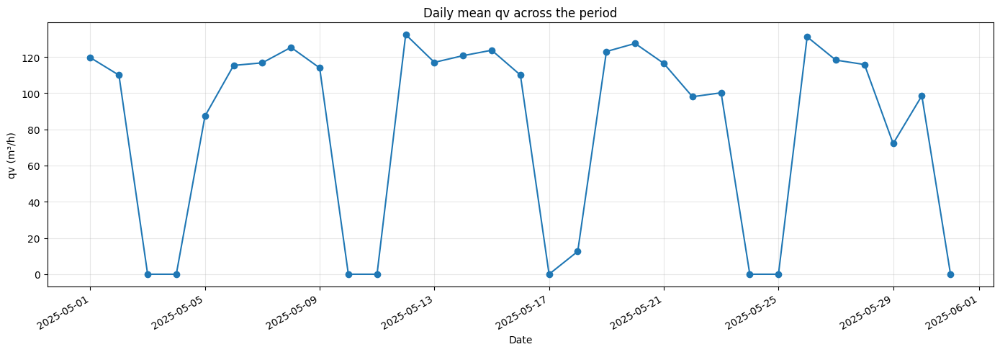

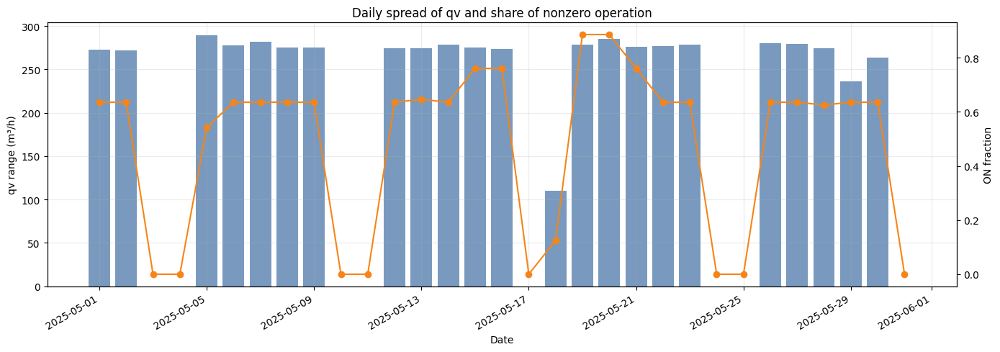

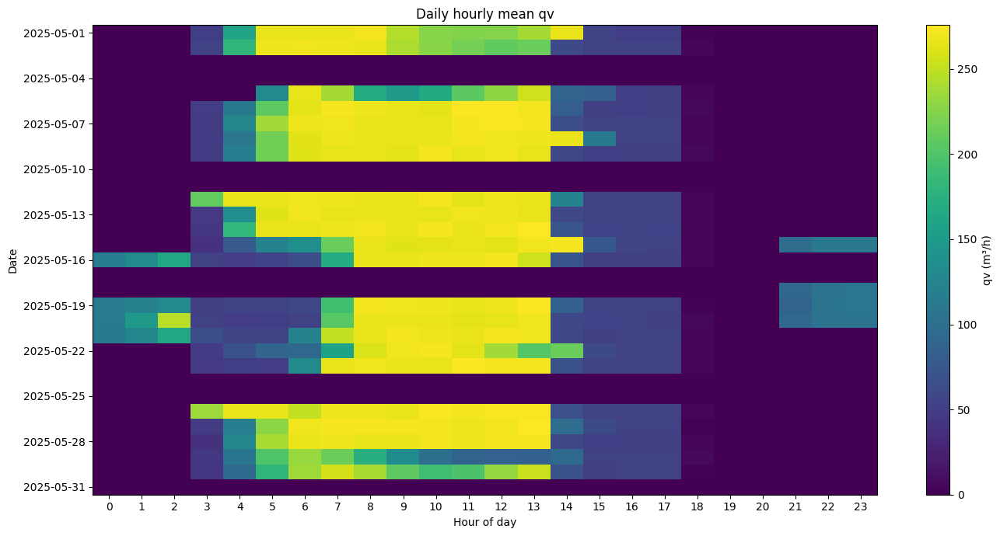

                     date  qv_mean  qv_min  qv_max  qv_median  qv_std  qv_range  qv_on_frac  CO2_mean  Ti_mean  Ta_mean
2025-05-01 00:00:00+00:00   119.62     0.0  272.59      54.17  116.88    272.59        0.64    424.33    24.05    15.49
2025-05-02 00:00:00+00:00   109.92     0.0  271.89      53.45  111.76    271.89        0.64    419.49    23.71    13.30
2025-05-03 00:00:00+00:00     0.00     0.0    0.00       0.00    0.00      0.00        0.00    402.73    23.72     9.28
2025-05-04 00:00:00+00:00     0.00     0.0    0.00       0.00    0.00      0.00        0.00    406.33    23.69     8.41
2025-05-05 00:00:00+00:00    87.31     0.0  289.59      51.75  100.19    289.59        0.54    477.28    23.86     9.32
2025-05-06 00:00:00+00:00   115.31     0.0  277.65      51.93  119.05    277.65        0.64    487.52    24.15    10.74
2025-05-07 00:00:00+00:00   116.73     0.0  282.26      54.71  120.56    282.26        0.64    465.87    23.81    12.05
2025-05-08 00:00:00+00:00   125.27     0

In [13]:
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

RESULTS_FILE = "simulation_results_mcmc_2025_05.pkl"

with open(RESULTS_FILE, "rb") as f:
    saved = pickle.load(f)

X = pd.concat([saved["X_train"], saved["X_test"]]).sort_index()
y = pd.concat([saved["y_train"], saved["y_test"]]).sort_index()

df = pd.DataFrame({
    "qv": X["qv"],
    "CO2": X["c"],
    "Ti": y,
    "Ta": X["Ta"],
}, index=X.index).dropna().copy()

df["date"] = df.index.normalize()
df["hour"] = df.index.hour
df["hour_float"] = df["hour"] + df.index.minute / 60.0

daily = df.groupby("date").agg(
    qv_mean=("qv", "mean"),
    qv_min=("qv", "min"),
    qv_max=("qv", "max"),
    qv_median=("qv", "median"),
    qv_std=("qv", "std"),
    qv_range=("qv", lambda s: s.max() - s.min()),
    qv_on_frac=("qv", lambda s: (s > 0).mean()),
    CO2_mean=("CO2", "mean"),
    Ti_mean=("Ti", "mean"),
    Ta_mean=("Ta", "mean")
).reset_index()

daily_hour = df.groupby(["date", "hour"]).agg(
    qv_mean=("qv", "mean"),
    qv_min=("qv", "min"),
    qv_max=("qv", "max"),
    qv_median=("qv", "median")
).reset_index()

outdir = Path("output")
outdir.mkdir(exist_ok=True)

daily.to_csv(outdir / "daily_qv_summary.csv", index=False)
daily_hour.to_csv(outdir / "daily_hourly_qv_summary.csv", index=False)

# 1) Daily mean qv
fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(daily["date"], daily["qv_mean"], marker="o", linewidth=1.5)
ax.set_title("Daily mean qv across the period")
ax.set_xlabel("Date")
ax.set_ylabel("qv (m³/h)")
ax.grid(alpha=0.3)
fig.autofmt_xdate()
fig.tight_layout()
fig.savefig(outdir / "daily_mean_qv.png", dpi=200, bbox_inches="tight")
plt.show()

# 2) Daily range + ON fraction
fig, ax1 = plt.subplots(figsize=(14, 5))
ax1.bar(daily["date"], daily["qv_range"], color="#4C78A8", alpha=0.75, label="Daily qv range")
ax1.set_ylabel("qv range (m³/h)")
ax1.set_xlabel("Date")
ax1.grid(alpha=0.25)

ax2 = ax1.twinx()
ax2.plot(daily["date"], daily["qv_on_frac"], color="#F58518", marker="o", linewidth=1.5, label="ON fraction")
ax2.set_ylabel("ON fraction")

ax1.set_title("Daily spread of qv and share of nonzero operation")
fig.autofmt_xdate()
fig.tight_layout()
fig.savefig(outdir / "daily_range_on_fraction.png", dpi=200, bbox_inches="tight")
plt.show()

# 3) Daily hourly heatmap
pivot = daily_hour.pivot(index="date", columns="hour", values="qv_mean").sort_index()

fig, ax = plt.subplots(figsize=(14, 7))
im = ax.imshow(pivot.values, aspect="auto", interpolation="nearest", cmap="viridis")
ax.set_title("Daily hourly mean qv")
ax.set_xlabel("Hour of day")
ax.set_ylabel("Date")

ax.set_xticks(range(len(pivot.columns)))
ax.set_xticklabels(pivot.columns)

step = max(1, len(pivot.index) // 10)
ax.set_yticks(range(0, len(pivot.index), step))
ax.set_yticklabels([pd.to_datetime(d).strftime("%Y-%m-%d") for d in pivot.index[::step]])

fig.colorbar(im, ax=ax, label="qv (m³/h)")
fig.tight_layout()
fig.savefig(outdir / "daily_hourly_qv_heatmap.png", dpi=200, bbox_inches="tight")
plt.show()

print(daily.head(10).round(2).to_string(index=False))

## Setup

  COP calibration — HTCW system (10°C CHW supply, EN14511 table)
  Method: EN14511:2022 ESEER table × Pieper (2021) HTCW factor (+15%)
   T_out   EN14511 base   HTCW ref(×1.15)   Model output
  ────────────────────────────────────────────────────────
     10°C           4.78              5.50           5.50 ✓
     20°C           4.78              5.50           5.50 ✓
     25°C           4.38              5.04           5.04 ✓
     30°C           3.60              4.14           4.14 ✓
     35°C           3.10              3.56           3.56 ✓

  Mean T_out in training data: 11.6°C → COP ≈ 5.50
  Note: 10°C extrapolated (EN14511 lowest std test point = 20°C)


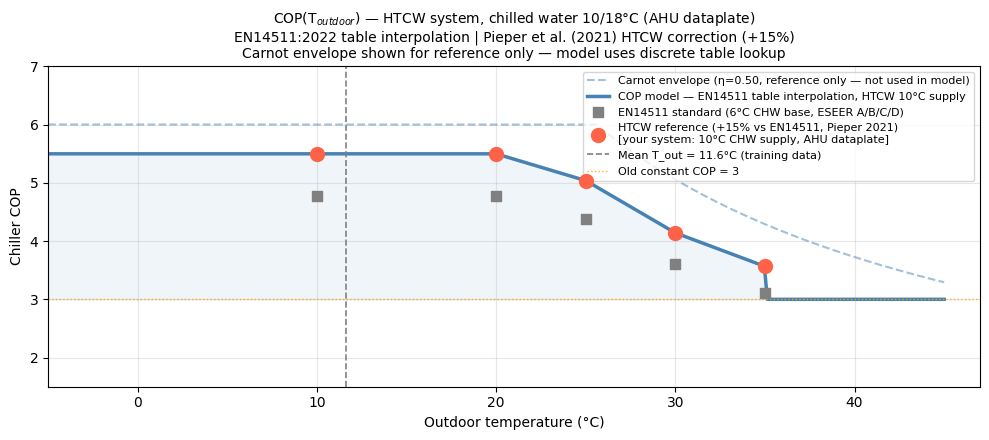

  Saved: cop_curve.png
  ✓ Energinet spot prices: 643 hours | mean = 0.483 DKK/kWh
  Fixed charges: 1.150 DKK/kWh (grid 0.32 + system 0.07 + elafgift 0.76)
  All-in: mean=1.633  min=1.098  max=2.739 DKK/kWh

  ════════════════════════════════════════════════════════════
  ELECTRICITY PRICE SUMMARY  (Energinet DK2 + commercial tariffs)
  ────────────────────────────────────────────────────────────
  Component                      Mean      Min      Max
  ────────────────────────────────────────────────────────────
  Spot price                    0.483   -0.052    1.589  DKK/kWh
  Fixed charges                 1.150   (flat)   (flat)  DKK/kWh
  All-in (used in model)        1.633    1.098    2.739  DKK/kWh
  Old constant                  1.493        —        —  DKK/kWh
  ────────────────────────────────────────────────────────────
  Negative all-in steps : 0 (0.0%)
  Old vs new mean ratio : 0.91× (old lower)
  ════════════════════════════════════════════════════════════
  Diurnal all-in

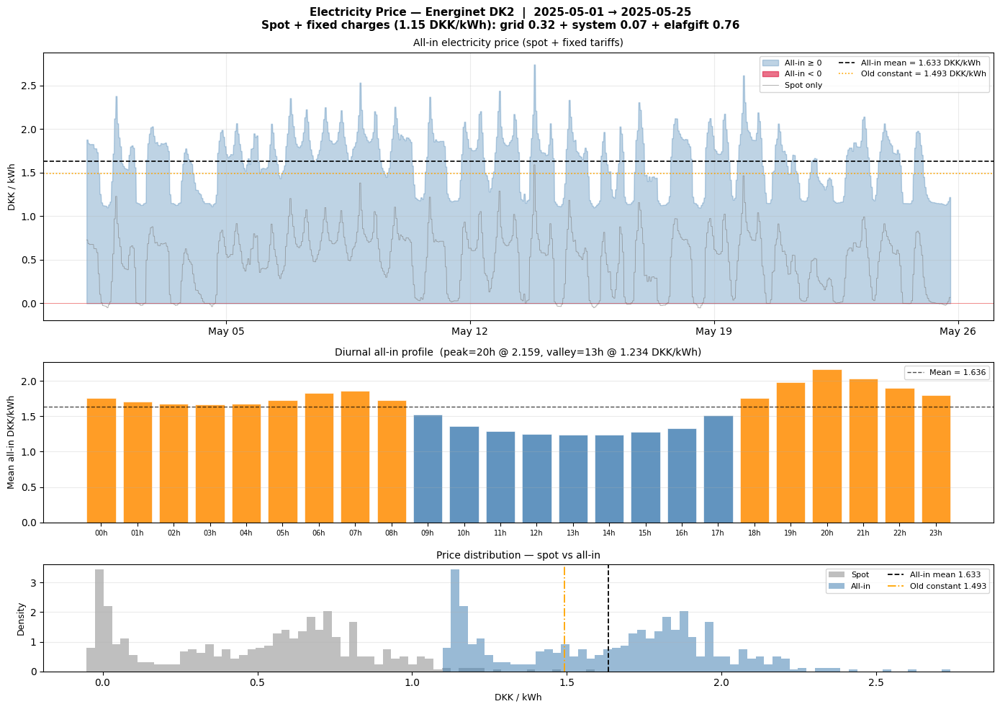

  Saved: electricity_price_evolution.png

═════════════════════════════════════════════════════════════════
  SETUP COMPLETE
─────────────────────────────────────────────────────────────────
  Index range       : 2025-05-01 00:00:00+00:00  →  2025-05-25 18:45:00+00:00
  Timestep          : 0.2500 h  (15.0 min)
  Ti_init           : 24.30 °C
  Tm_init           : 24.30 °C
  c_init            : 422.8 ppm
  QV bounds         : [0.0, 270.0] m³/h
  SFP @ QV_MAX      : 0.8245 W/(m³/h)
  COP method        : EN14511:2022 table × Pieper (2021) HTCW factor (+15%)
  COP @ 10/25/35°C  : 5.50 / 5.04 / 3.56
  COP_MIN / COP_MAX : 3.0 / 6.0
  COP reference     : EN14511:2022 Table B.3 [data] + Pieper et al. (2021) [HTCW corr.]
  P_ELEC all-in     : mean=1.633  min=1.098  max=2.739 DKK/kWh
  Fixed charges     : 1.150 DKK/kWh (grid 0.32 + system 0.07 + elafgift 0.76)
═════════════════════════════════════════════════════════════════


In [14]:
# ════════════════════════════════════════════════════════════════════════════
#  SETUP — Shared parameters, constants, and initial conditions
#  Run this cell once before any scenario / analysis / optimisation block
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import requests
import warnings
from scipy.interpolate import interp1d


# ── Model fitted parameters ───────────────────────────────────────────────────
fitted_params = model.result.params


# ── Time index ───────────────────────────────────────────────────────────────
index  = X_train.index
dt_h   = (index[1] - index[0]).seconds / 3600.0


# ── Initial conditions ────────────────────────────────────────────────────────
Ti_init = float(y_train.iloc[0])
Tm_init = float(train_results.var['Tm'][0])
c_init  = float(train_results.var['c'][0])
N_hist  = train_results.var['N']


# ── Ventilation flow bounds ───────────────────────────────────────────────────
QV_MIN = 0.0
QV_MAX = 270.0


# ── Physical constants ────────────────────────────────────────────────────────
RHO_AIR = 1.2
CP_AIR  = 1005.0



# ════════════════════════════════════════════════════════════════════════════
#  COP(T_outdoor) — Table-based chiller model
#
#  METHOD — EN14511:2022 discrete lookup table + linear interpolation.
#  NOT a continuous Carnot formula: the standard defines COP at 4 discrete
#  outdoor test conditions (ESEER rating points A/B/C/D). Between points,
#  linear interpolation is used; outside the range, values are clamped.
#
#  This approach is consistent with Pieper et al. (2021), Energy 230:120743,
#  who use EN14511 tabulated EER values as the reference dataset and apply
#  correction factors for non-standard operating conditions (Eq. 2–5).
#  A continuous Carnot formula is used only as an upper-envelope sanity check,
#  not as the primary model — because real chiller COP depends on compressor
#  maps and part-load behaviour that the Carnot form cannot capture.
#
#  SYSTEM — AHU dataplate: cooling coil 161.6 kW, chilled water 10/18°C
#    This is a High-Temperature Chilled Water (HTCW) system. The 10°C CHW
#    supply temperature reduces the temperature lift by ~3–4 K vs a standard
#    6°C system, improving COP by ~15% (Pieper 2021, Fig. 3 + Table 2).
#
#  DATA SOURCES:
#    [1] EN14511:2022 ESEER test points (A/B/C/D) for air-cooled chillers:
#          T_out = 35°C (A, 100% load) → EER_base ≈ 3.10
#          T_out = 30°C (B,  75% load) → EER_base ≈ 3.60
#          T_out = 25°C (C,  50% load) → EER_base ≈ 4.38   ← standard table
#          T_out = 20°C (D,  25% load) → EER_base ≈ 4.78
#        Source: EN14511-2:2022 Table B.3 (small-medium air-cooled units <200 kW)
#    [2] HTCW correction: ×1.15 for 10°C vs 6°C chilled water supply
#        Source: Pieper et al. (2021), Table 2 — HTCW factor for 10/18°C regime
#    [3] Extended low-temperature point (T_out = 10°C → COP_htcw ≈ 6.0, capped)
#        Extrapolated from EN14511 trend; capped at COP_MAX = 6.0 (physical limit)
#
#  WHAT THE TWO POINT SERIES IN THE PLOT REPRESENT:
#    • Gray squares  — raw EN14511 6°C CHW base values (EER_base above)
#    • Orange circles — HTCW-adjusted values (EER_base × 1.15 HTCW factor)
#      These are YOUR system's reference COP at each test temperature.
#    The interpolating line connects the orange circles.
# ════════════════════════════════════════════════════════════════════════════


# ── EN14511:2022 ESEER table — 6°C CHW base (gray squares in plot) ───────────
_EN14511_T_out = np.array([10.0,  20.0,  25.0,  30.0,  35.0])
_EN14511_COP   = np.array([ 4.78,  4.78,  4.38,  3.60,  3.10])
# Note: 10°C point extrapolated (EN14511 lowest standard point = 20°C).
# The 20°C and 10°C values are equal here to produce a flat left extrapolation,
# consistent with the capped COP_MAX applied after the HTCW correction.


# ── HTCW correction factor (Pieper 2021, Table 2) ─────────────────────────────
HTCW_FACTOR = 1.15   # +15% COP for 10°C vs 6°C chilled water supply

# ── HTCW-adjusted reference points (orange circles in plot) ──────────────────
_HTCW_COP = _EN14511_COP * HTCW_FACTOR

# ── Physical bounds ───────────────────────────────────────────────────────────
COP_MIN = 3.0    # floor: worst-case summer peak (HTCW system, ~35°C)
COP_MAX = 6.0    # ceiling: spring/night operation at low lift

T_cat1_min        = 22.0
T_cat1_max        = 24.0


# ── Build interpolator ────────────────────────────────────────────────────────
_cop_table_raw = np.minimum(_HTCW_COP, COP_MAX)   # apply ceiling before interpolation

_cop_interp = interp1d(
    _EN14511_T_out,
    _cop_table_raw,
    kind='linear',
    bounds_error=False,
    fill_value=(_cop_table_raw[0], COP_MIN)   # flat left, floor right
)


def cop_func(T_out_arr):
    """
    COP(T_outdoor) for HTCW 10/18°C chiller system.

    Method: Linear interpolation on EN14511:2022 ESEER discrete table,
    corrected for HTCW operation (×1.15 Pieper 2021 factor). Clipped to
    [COP_MIN, COP_MAX]. This is a lookup table, NOT a continuous formula.

    Parameters
    ----------
    T_out_arr : array-like — outdoor (condenser-side) dry-bulb temp [°C]

    Returns
    -------
    np.ndarray — COP values, clipped to [COP_MIN, COP_MAX]

    References
    ----------
    EN14511:2022 — ESEER test points (Table B.3)
    Pieper et al. (2021), Energy 230:120743 — HTCW correction factor
    """
    T_out = np.asarray(T_out_arr, dtype=float)
    return np.clip(_cop_interp(T_out), COP_MIN, COP_MAX)


# ── Carnot envelope — for visual reference ONLY (not used in cost calcs) ──────
def _cop_carnot_envelope(T_out_arr, eta=0.50, T_cold=10.0):
    """Upper-bound Carnot curve for sanity check. Not used in cost functions."""
    T_out    = np.asarray(T_out_arr, dtype=float)
    T_cold_K = T_cold + 273.15
    T_cond_K = T_out + 8.0 + 273.15
    return np.clip(eta * T_cold_K / np.maximum(T_cond_K - T_cold_K, 1.0), COP_MIN, COP_MAX)


# ── COP calibration printout ──────────────────────────────────────────────────
Ta_arr = np.asarray(X_train['Ta'], dtype=float)

print("  COP calibration — HTCW system (10°C CHW supply, EN14511 table)")
print("  Method: EN14511:2022 ESEER table × Pieper (2021) HTCW factor (+15%)")
print(f"  {'T_out':>6}  {'EN14511 base':>13}  {'HTCW ref(×1.15)':>16}  {'Model output':>13}")
print(f"  {'─'*56}")
_ref_pairs = list(zip(_EN14511_T_out, _EN14511_COP, _HTCW_COP))
for T_r, cop_base, cop_htcw in _ref_pairs:
    cop_model = float(cop_func(T_r))
    flag = ' ✓' if abs(cop_model - min(cop_htcw, COP_MAX)) < 0.05 else ' ⚠'
    print(f"  {T_r:>5.0f}°C  {cop_base:>13.2f}  {cop_htcw:>16.2f}  {cop_model:>13.2f}{flag}")

print(f"\n  Mean T_out in training data: {Ta_arr.mean():.1f}°C "
      f"→ COP ≈ {float(cop_func(Ta_arr.mean())):.2f}")
print(f"  Note: 10°C extrapolated (EN14511 lowest std test point = 20°C)")


# ── COP curve plot ────────────────────────────────────────────────────────────
_T_range = np.linspace(-5, 45, 300)

fig_cop, ax_cop = plt.subplots(figsize=(10, 4.5))

# Carnot envelope (reference only — dashed, lighter)
ax_cop.plot(_T_range, _cop_carnot_envelope(_T_range), color='steelblue',
            lw=1.5, ls='--', alpha=0.50,
            label='Carnot envelope (η=0.50, reference only — not used in model)')

# Interpolated table model (the actual COP function)
ax_cop.plot(_T_range, cop_func(_T_range), color='steelblue', lw=2.5,
            label='COP model — EN14511 table interpolation, HTCW 10°C supply')

# EN14511 base points (gray squares)
ax_cop.scatter(_EN14511_T_out, _EN14511_COP, color='grey', s=60,
               marker='s', zorder=5,
               label='EN14511 standard (6°C CHW base, ESEER A/B/C/D)')

# HTCW-adjusted points (orange circles) — YOUR system
ax_cop.scatter(_EN14511_T_out, np.minimum(_HTCW_COP, COP_MAX),
               color='tomato', s=100, zorder=6,
               label='HTCW reference (+15% vs EN14511, Pieper 2021)\n'
                     '[your system: 10°C CHW supply, AHU dataplate]')

ax_cop.axvline(Ta_arr.mean(), ls='--', color='grey', lw=1.2,
               label=f'Mean T_out = {Ta_arr.mean():.1f}°C (training data)')
ax_cop.axhline(3.0, ls=':', color='orange', lw=1.0, alpha=0.9,
               label='Old constant COP = 3')
ax_cop.fill_between(_T_range, COP_MIN, cop_func(_T_range),
                    alpha=0.08, color='steelblue')

ax_cop.set_xlabel('Outdoor temperature (°C)', fontsize=10)
ax_cop.set_ylabel('Chiller COP', fontsize=10)
ax_cop.set_title(
    'COP(T$_{outdoor}$) — HTCW system, chilled water 10/18°C (AHU dataplate)\n'
    'EN14511:2022 table interpolation | Pieper et al. (2021) HTCW correction (+15%)\n'
    'Carnot envelope shown for reference only — model uses discrete table lookup',
    fontsize=10)
ax_cop.set_ylim(1.5, 7.0)
ax_cop.set_xlim(-5, 47)
ax_cop.legend(fontsize=8, loc='upper right')
ax_cop.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('cop_curve.png', dpi=140, bbox_inches='tight')
plt.show()
print("  Saved: cop_curve.png")



# ════════════════════════════════════════════════════════════════════════════
#  ELECTRICITY PRICE — Energinet DK2 spot + all-in commercial tariff stack
#
#  Raw spot price (Energinet Elspotprices, DKK/kWh) + fixed charges:
#    Grid tariff (DSO nettarif, Radius C zone)  : ~0.32 DKK/kWh
#    System tariff (Energinet systemtarif)       : ~0.07 DKK/kWh
#    Electricity tax (elafgift, commercial)      : ~0.76 DKK/kWh
#    ─────────────────────────────────────────────────────────────────
#    All-in (approx mean)                        : ~1.63 DKK/kWh
#  Note: § 11 elafgiftloven allows commercial process energy tax refund.
# ════════════════════════════════════════════════════════════════════════════


GRID_TARIFF    = 0.32
SYSTEM_TARIFF  = 0.07
ELAFGIFT       = 0.76
FIXED_CHARGES  = GRID_TARIFF + SYSTEM_TARIFF + ELAFGIFT
P_ELEC_DEFAULT = 1.493   # fallback all-in constant [DKK/kWh]


def fetch_energinet_prices(start: pd.Timestamp, end: pd.Timestamp,
                            price_area: str = "DK2"):
    """
    Fetch hourly day-ahead spot prices [DKK/kWh] from Energi Data Service.
    Returns pd.Series indexed by tz-naive local DK time. None on failure.
    """
    url = "https://api.energidataservice.dk/dataset/Elspotprices"
    params = {
        "start"  : start.strftime("%Y-%m-%dT%H:%M"),
        "end"    : end.strftime("%Y-%m-%dT%H:%M"),
        "filter" : f'{{"PriceArea":["{price_area}"]}}',
        "columns": "HourDK,SpotPriceDKK",
        "sort"   : "HourDK ASC",
        "limit"  : 100000,
    }
    try:
        r = requests.get(url, params=params, timeout=15)
        r.raise_for_status()
        records = r.json().get("records", [])
        if not records:
            raise ValueError("Empty response")
        df_p = pd.DataFrame(records)
        df_p["HourDK"] = pd.to_datetime(df_p["HourDK"])
        df_p = df_p.set_index("HourDK").sort_index()
        price_spot = df_p["SpotPriceDKK"] / 1000.0   # DKK/MWh → DKK/kWh
        print(f"  ✓ Energinet spot prices: {len(price_spot)} hours | "
              f"mean = {price_spot.mean():.3f} DKK/kWh")
        return price_spot
    except Exception as e:
        warnings.warn(f"Energinet API failed ({e}). Fallback: {P_ELEC_DEFAULT} DKK/kWh.")
        return None


# Strip timezone for reindexing against HourDK (local DK, tz-naive)
_index_naive = index.tz_localize(None) if index.tzinfo is not None else index
_p_start = _index_naive[0].floor("H")  - pd.Timedelta(days=1)
_p_end   = _index_naive[-1].ceil("H")  + pd.Timedelta(days=1)
_price_raw = fetch_energinet_prices(_p_start, _p_end, price_area="DK2")


if _price_raw is not None:
    _price_spot_15min = (
        _price_raw
        .reindex(_index_naive, method="ffill")
        .fillna(_price_raw.mean())
        .values.astype(float)
    )
    price_series       = _price_spot_15min
    price_series_allin = _price_spot_15min + FIXED_CHARGES
    print(f"  Fixed charges: {FIXED_CHARGES:.3f} DKK/kWh "
          f"(grid {GRID_TARIFF} + system {SYSTEM_TARIFF} + elafgift {ELAFGIFT})")
    print(f"  All-in: mean={price_series_allin.mean():.3f}  "
          f"min={price_series_allin.min():.3f}  max={price_series_allin.max():.3f} DKK/kWh")
else:
    price_series       = np.full(len(index), P_ELEC_DEFAULT - FIXED_CHARGES)
    price_series_allin = np.full(len(index), P_ELEC_DEFAULT)
    print(f"  ⚠ Fallback constant: {P_ELEC_DEFAULT} DKK/kWh")


# ── Price statistics ──────────────────────────────────────────────────────────
print(f"\n  {'═'*60}")
print(f"  ELECTRICITY PRICE SUMMARY  (Energinet DK2 + commercial tariffs)")
print(f"  {'─'*60}")
print(f"  {'Component':<26}  {'Mean':>7}  {'Min':>7}  {'Max':>7}")
print(f"  {'─'*60}")
print(f"  {'Spot price':<26}  {price_series.mean():>7.3f}  "
      f"{price_series.min():>7.3f}  {price_series.max():>7.3f}  DKK/kWh")
print(f"  {'Fixed charges':<26}  {FIXED_CHARGES:>7.3f}  "
      f"{'(flat)':>7}  {'(flat)':>7}  DKK/kWh")
print(f"  {'All-in (used in model)':<26}  {price_series_allin.mean():>7.3f}  "
      f"{price_series_allin.min():>7.3f}  {price_series_allin.max():>7.3f}  DKK/kWh")
print(f"  {'Old constant':<26}  {P_ELEC_DEFAULT:>7.3f}  {'—':>7}  {'—':>7}  DKK/kWh")
print(f"  {'─'*60}")
_neg = int(np.sum(price_series_allin < 0))
print(f"  Negative all-in steps : {_neg} ({100*_neg/len(price_series_allin):.1f}%)")
print(f"  Old vs new mean ratio : {P_ELEC_DEFAULT/price_series_allin.mean():.2f}× "
      f"({'old higher' if P_ELEC_DEFAULT > price_series_allin.mean() else 'old lower'})")
print(f"  {'═'*60}")


# ── Diurnal profile ───────────────────────────────────────────────────────────
hours_of_day  = np.array([t.hour + t.minute / 60.0 for t in _index_naive])
diurnal_allin = np.array([
    price_series_allin[(hours_of_day >= h) & (hours_of_day < h + 1)].mean()
    for h in range(24)
])
peak_h   = int(np.argmax(diurnal_allin))
valley_h = int(np.argmin(diurnal_allin))
_night_mean = np.concatenate([diurnal_allin[22:], diurnal_allin[:6]]).mean()
_day_mean   = diurnal_allin[8:18].mean()
print(f"  Diurnal all-in pattern:")
print(f"    Peak   : {peak_h:02d}h → {diurnal_allin[peak_h]:.3f} DKK/kWh")
print(f"    Valley : {valley_h:02d}h → {diurnal_allin[valley_h]:.3f} DKK/kWh")
print(f"    Day (08–18) mean  : {_day_mean:.3f} DKK/kWh")
print(f"    Night (22–06) mean: {_night_mean:.3f} DKK/kWh  "
      f"(day premium: {(_day_mean-_night_mean)*100/_night_mean:+.1f}%)")


# ── 3-panel electricity price figure ─────────────────────────────────────────
price_df = pd.DataFrame({'spot': price_series, 'allin': price_series_allin},
                         index=_index_naive)

fig_price, axes_p = plt.subplots(3, 1, figsize=(14, 10),
                                  gridspec_kw={'height_ratios': [2.5, 1.5, 1]})
fig_price.suptitle(
    f'Electricity Price — Energinet DK2  |  '
    f'{_index_naive[0].date()} → {_index_naive[-1].date()}\n'
    f'Spot + fixed charges ({FIXED_CHARGES:.2f} DKK/kWh): '
    f'grid {GRID_TARIFF} + system {SYSTEM_TARIFF} + elafgift {ELAFGIFT}',
    fontsize=11, fontweight='bold')

ax_ts = axes_p[0]
ax_ts.fill_between(price_df.index, price_df['allin'],
                    where=(price_df['allin'] >= 0),
                    color='steelblue', alpha=0.35, label='All-in ≥ 0')
ax_ts.fill_between(price_df.index, price_df['allin'],
                    where=(price_df['allin'] < 0),
                    color='crimson', alpha=0.60, label='All-in < 0')
ax_ts.plot(price_df.index, price_df['spot'],
           color='grey', lw=0.6, alpha=0.7, label='Spot only')
ax_ts.axhline(price_series_allin.mean(), color='black', lw=1.2, ls='--',
              label=f'All-in mean = {price_series_allin.mean():.3f} DKK/kWh')
ax_ts.axhline(P_ELEC_DEFAULT, color='orange', lw=1.2, ls=':',
              label=f'Old constant = {P_ELEC_DEFAULT:.3f} DKK/kWh')
ax_ts.axhline(0, color='red', lw=0.7, alpha=0.4)
ax_ts.set_ylabel('DKK / kWh', fontsize=9)
ax_ts.set_title('All-in electricity price (spot + fixed tariffs)', fontsize=10)
ax_ts.xaxis.set_major_formatter(mdates.DateFormatter('%b %d'))
ax_ts.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0))
ax_ts.legend(fontsize=8, loc='upper right', ncol=2)
ax_ts.grid(alpha=0.25)

ax_diu = axes_p[1]
bar_colors = ['crimson' if v < 0 else
              'steelblue' if v <= diurnal_allin.mean() else
              'darkorange' for v in diurnal_allin]
ax_diu.bar(range(24), diurnal_allin, color=bar_colors, alpha=0.85,
           edgecolor='white', lw=0.5)
ax_diu.axhline(diurnal_allin.mean(), color='black', lw=1.0, ls='--', alpha=0.7,
               label=f'Mean = {diurnal_allin.mean():.3f}')
ax_diu.set_xticks(range(24))
ax_diu.set_xticklabels([f'{h:02d}h' for h in range(24)], fontsize=7)
ax_diu.set_ylabel('Mean all-in DKK/kWh', fontsize=9)
ax_diu.set_title(
    f'Diurnal all-in profile  '
    f'(peak={peak_h:02d}h @ {diurnal_allin[peak_h]:.3f}, '
    f'valley={valley_h:02d}h @ {diurnal_allin[valley_h]:.3f} DKK/kWh)', fontsize=10)
ax_diu.legend(fontsize=8)
ax_diu.grid(alpha=0.25, axis='y')

ax_hist = axes_p[2]
ax_hist.hist(price_series,       bins=60, color='grey',      alpha=0.50,
             edgecolor='none', label='Spot', density=True)
ax_hist.hist(price_series_allin, bins=60, color='steelblue', alpha=0.55,
             edgecolor='none', label='All-in', density=True)
ax_hist.axvline(price_series_allin.mean(), color='black',  lw=1.3, ls='--',
                label=f'All-in mean {price_series_allin.mean():.3f}')
ax_hist.axvline(P_ELEC_DEFAULT,            color='orange', lw=1.3, ls='-.',
                label=f'Old constant {P_ELEC_DEFAULT:.3f}')
ax_hist.set_xlabel('DKK / kWh', fontsize=9)
ax_hist.set_ylabel('Density', fontsize=9)
ax_hist.set_title('Price distribution — spot vs all-in', fontsize=10)
ax_hist.legend(fontsize=8, ncol=2)
ax_hist.grid(alpha=0.25, axis='y')

plt.tight_layout()
plt.savefig('electricity_price_evolution.png', dpi=140, bbox_inches='tight')
plt.show()
print("  Saved: electricity_price_evolution.png")



# ── SFP model ─────────────────────────────────────────────────────────────────
Q_AHU_TOTAL = 35000.0
Q_ROOM_MAX  = QV_MAX
BP_SFP      = 10331.0
SFP_aL = 1.176e-08;  SFP_aR = 3.710e-10
SFP_b  = 4.753e-06;  SFP_c  = 4.815e-01


def sfp_ahu(Q_array):
    Q       = np.asarray(Q_array, dtype=float)
    q_shift = Q - BP_SFP
    left    = q_shift <= 0.0
    SFP     = np.empty_like(Q)
    SFP[left]  = SFP_aL*q_shift[left]**2  + SFP_b*q_shift[left]  + SFP_c
    SFP[~left] = SFP_aR*q_shift[~left]**2 + SFP_b*q_shift[~left] + SFP_c
    return SFP


def sfp_room(qv_array):
    qv = np.asarray(qv_array, dtype=float)
    return np.where(qv > 0.0, sfp_ahu(qv * (Q_AHU_TOTAL / Q_ROOM_MAX)), 0.0)



# ── Cost functions ────────────────────────────────────────────────────────────
def fan_cost_empirical(qv_array, p_elec=None):
    """Fan electricity cost [DKK]. Uses price_series_allin by default."""
    qv   = np.asarray(qv_array, dtype=float)
    pe   = price_series_allin if p_elec is None else np.asarray(p_elec, dtype=float)
    P_kW = qv * sfp_room(qv) / 1000.0 / 3.6
    return float(np.sum(P_kW * pe) * dt_h)


def q_cool_cost(qv_array, T_ext_arr, T_sup_arr, p_elec=None):
    """
    Mechanical cooling cost [DKK].
    COP(T_out) from EN14511 table lookup (cop_func). Uses price_series_allin by default.
    """
    qv    = np.asarray(qv_array,  dtype=float)
    T_ext = np.asarray(T_ext_arr, dtype=float)
    T_sup = np.asarray(T_sup_arr, dtype=float)
    pe    = price_series_allin if p_elec is None else np.asarray(p_elec, dtype=float)
    delta = np.maximum(0.0, T_ext - T_sup)
    Q_kW  = (qv / 3600.0) * RHO_AIR * CP_AIR * delta / 1000.0
    return float(np.sum(Q_kW * dt_h / cop_func(T_ext) * pe))


def cost_breakdown(qv_array, T_ext_arr, T_sup_arr, p_elec=None):
    """
    Full cost decomposition:
      fan_cost          — AHU fan electricity [DKK]
      mech_cool_cost    — chiller/DC cooling when T_ext > T_sup [DKK]
      free_cool_savings — equivalent cost avoided by free cooling
                          when T_ext < T_sup (no chiller needed) [DKK]
      total             — fan + mech_cool (free cooling is zero-cost)

    Free cooling: outdoor air colder than supply setpoint → no chiller,
    no cooling electricity. free_cool_savings reports the hypothetical
    cost if a chiller had been used instead (i.e. the benefit of the
    night ventilation strategy).

    COP is evaluated per-timestep via cop_func(T_ext) — EN14511 table.
    Electricity price is per-timestep via price_series_allin by default.
    """
    qv    = np.asarray(qv_array,  dtype=float)
    T_ext = np.asarray(T_ext_arr, dtype=float)
    T_sup = np.asarray(T_sup_arr, dtype=float)
    pe    = price_series_allin if p_elec is None else np.asarray(p_elec, dtype=float)
    cop_arr   = cop_func(T_ext)
    fan_c     = fan_cost_empirical(qv, p_elec=pe)
    Q_mech_kW = (qv/3600.0)*RHO_AIR*CP_AIR*np.maximum(0.0, T_ext-T_sup)/1000.0
    Q_free_kW = (qv/3600.0)*RHO_AIR*CP_AIR*np.maximum(0.0, T_sup-T_ext)/1000.0
    mech_c    = float(np.sum(Q_mech_kW * dt_h / cop_arr * pe))
    free_sav  = float(np.sum(Q_free_kW * dt_h / cop_arr * pe))
    return {
        'fan_cost'          : fan_c,
        'mech_cool_cost'    : mech_c,
        'free_cool_savings' : free_sav,
        'total'             : fan_c + mech_c,
    }


def total_system_cost(qv_array, T_ext_arr, T_sup_arr, p_elec=None):
    """Backward-compatible wrapper → returns total cost [DKK]."""
    return cost_breakdown(qv_array, T_ext_arr, T_sup_arr, p_elec)['total']


# ── FREE COOLING SAVINGS (night ventilation interpretation) ──────────────────
def free_cooling_savings_nv(qv_array, T_ext_arr, p_elec=None,
                             T_ref=T_cat1_min):
    """
    Avoided chiller cost during night ventilation hours.
    Estimates what it would have cost to mechanically cool the same air volume
    from T_ext down to the daytime comfort lower bound (T_ref = T_cat1_min).

    free_saving[t] = Q_kW[t] * dt_h / COP(T_ext[t]) * P_elec[t]
    where Q_kW[t] = (qv/3600) * rho * cp * max(0, T_ref - T_ext[t]) / 1000

    Only non-zero when T_ext < T_ref (outdoor air is genuinely cooler than
    the daytime setpoint — true free cooling potential).
    """
    qv    = np.asarray(qv_array,  dtype=float)
    T_ext = np.asarray(T_ext_arr, dtype=float)
    pe    = price_series if p_elec is None else np.asarray(p_elec, dtype=float)
    delta   = np.maximum(0.0, T_ref - T_ext)
    cop_arr = cop_func(T_ext)
    Q_kW    = (qv / 3600.0) * RHO_AIR * CP_AIR * delta / 1000.0
    return float(np.sum(Q_kW * dt_h / cop_arr * pe))



# ── Final sanity check ────────────────────────────────────────────────────────
qv_arr = np.asarray(X_train['qv'], dtype=float)   # expose for downstream blocks

print(f"\n{'═'*65}")
print(f"  SETUP COMPLETE")
print(f"{'─'*65}")
print(f"  Index range       : {index[0]}  →  {index[-1]}")
print(f"  Timestep          : {dt_h:.4f} h  ({dt_h*60:.1f} min)")
print(f"  Ti_init           : {Ti_init:.2f} °C")
print(f"  Tm_init           : {Tm_init:.2f} °C")
print(f"  c_init            : {c_init:.1f} ppm")
print(f"  QV bounds         : [{QV_MIN}, {QV_MAX}] m³/h")
print(f"  SFP @ QV_MAX      : {sfp_room(QV_MAX):.4f} W/(m³/h)")
print(f"  COP method        : EN14511:2022 table × Pieper (2021) HTCW factor (+15%)")
print(f"  COP @ 10/25/35°C  : {cop_func(10):.2f} / {cop_func(25):.2f} / {cop_func(35):.2f}")
print(f"  COP_MIN / COP_MAX : {COP_MIN} / {COP_MAX}")
print(f"  COP reference     : EN14511:2022 Table B.3 [data] + Pieper et al. (2021) [HTCW corr.]")
print(f"  P_ELEC all-in     : mean={price_series_allin.mean():.3f}  "
      f"min={price_series_allin.min():.3f}  max={price_series_allin.max():.3f} DKK/kWh")
print(f"  Fixed charges     : {FIXED_CHARGES:.3f} DKK/kWh "
      f"(grid {GRID_TARIFF} + system {SYSTEM_TARIFF} + elafgift {ELAFGIFT})")
print(f"{'═'*65}")


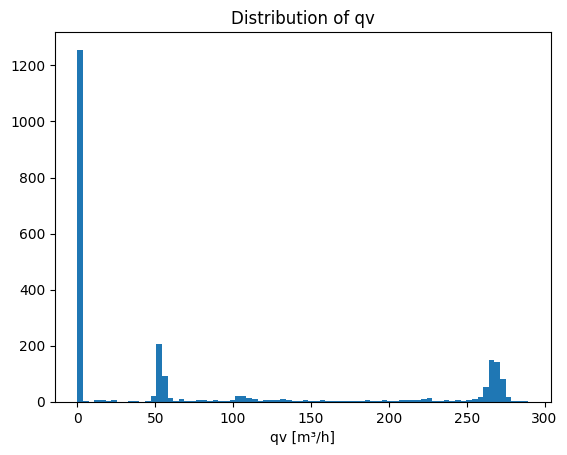

In [15]:
import matplotlib.pyplot as plt
import numpy as np

qv = np.asarray(X_train['qv'])
plt.hist(qv, bins=80)
plt.xlabel('qv [m³/h]')
plt.title('Distribution of qv')
plt.show()

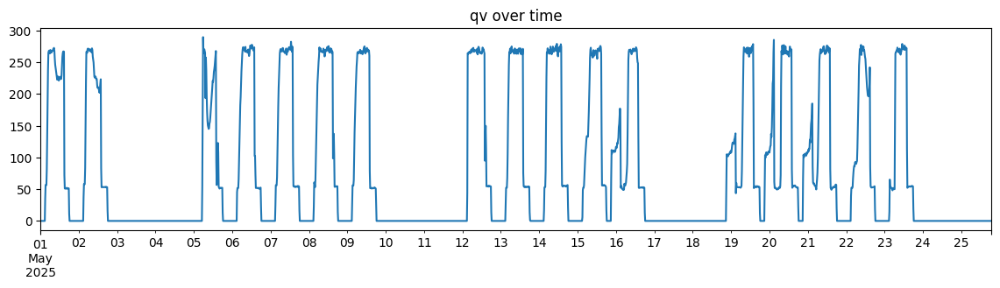

In [16]:
pd.Series(qv, index=index).plot(figsize=(14,3))
plt.title('qv over time')
plt.show()

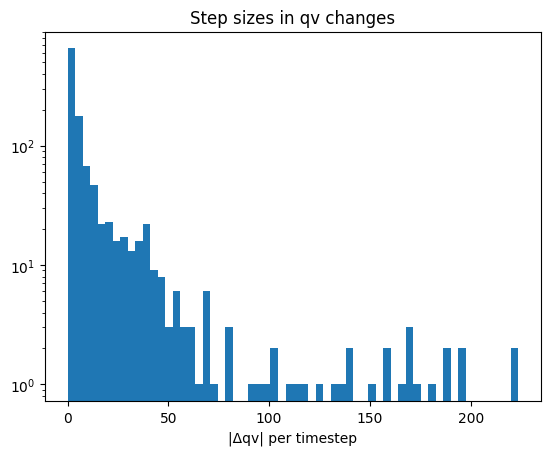

In [17]:
dqv = np.abs(np.diff(qv))
plt.hist(dqv[dqv > 0], bins=60, log=True)
plt.xlabel('|Δqv| per timestep')
plt.title('Step sizes in qv changes')
plt.show()

## Pre computation block

In [18]:
# ════════════════════════════════════════════════════════════════════════════
#  PRE-COMPUTATION  —  ANN Surrogate + NSGA-II  (stripped to essentials)
# ════════════════════════════════════════════════════════════════════════════
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ── CONFIG ───────────────────────────────────────────────────────────────────
T_cat1_min        = 22.0
T_cat1_max        = 24.0
T_TARGET          = 23.0
TA_MIN_NIGHT_VENT = 14.0
OCC_START         = 8
OCC_END           = 18
dt_h              = rec_duration

# ── UNIFIED BOUNDS — restored to match old Pareto sweep ──────────────────────
# FIX 1: START_LB = 15h (was 20h — was cutting off pre-cooling window)
# FIX 2: STOP_UB  = 10h (was  7h — was cutting off late morning hours)
NIGHT_OPT_START_LB = 20.0   # no earlier than 20:00
NIGHT_OPT_START_UB = 23.0
NIGHT_OPT_STOP_LB  =  2.0   # no earlier than 02:00 — forces at least some night
NIGHT_OPT_STOP_UB  =  8.0   # no later than 08:00

NIGHT_START = 20
NIGHT_STOP  =  8

# ── PHYSICAL CONSTANTS ───────────────────────────────────────────────────────
RHO_AIR  = 1.2
CP_AIR   = 1005.0

# ============================================================
# EMPIRICAL FAN COST MODEL — room airflow mapped to AHU curve
# ============================================================

Q_AHU_TOTAL = 35000.0
Q_ROOM_MAX  = QV_MAX   # 270.0 m³/h

# Best smooth piecewise AHU SFP(Q) fit
BP_SFP = 10331.0   # m³/h

SFP_aL = 1.176e-08
SFP_aR = 3.710e-10
SFP_b  = 4.753e-06
SFP_c  = 4.815e-01

def sfp_ahu(Q_array):
    """
    AHU-level smooth piecewise SFP(Q)
    Input:  Q_array in m3/h
    Output: SFP in Wh/m3  (same numerical value as W/(m3/h))
    """
    Q = np.asarray(Q_array, dtype=float)
    q_shift = Q - BP_SFP
    left = q_shift <= 0.0

    SFP = np.empty_like(Q, dtype=float)
    SFP[left]  = SFP_aL * q_shift[left]**2  + SFP_b * q_shift[left]  + SFP_c
    SFP[~left] = SFP_aR * q_shift[~left]**2 + SFP_b * q_shift[~left] + SFP_c
    return SFP

def sfp_room(qv_array):
    """
    Map room airflow qv [m3/h] to equivalent AHU flow,
    then evaluate the empirical AHU SFP curve.
    """
    qv = np.asarray(qv_array, dtype=float)

    Q_equiv = qv * (Q_AHU_TOTAL / Q_ROOM_MAX)

    return np.where(
        qv > 0.0,
        sfp_ahu(Q_equiv),
        0.0
    )

def fan_cost_empirical(qv_array, p_elec=None):
    """Fan electricity cost. p_elec: scalar or array [DKK/kWh]; default = price_series."""
    qv  = np.asarray(qv_array, dtype=float)
    pe  = price_series if p_elec is None else np.asarray(p_elec, dtype=float)
    SFPq = sfp_room(qv)
    P_kW = qv * SFPq / 1000.0 / 3.6
    return float(np.sum(P_kW * pe) * dt_h)   # element-wise price


def q_cool_cost(qv_array, T_ext_arr, T_sup_arr, p_elec=None):
    qv    = np.asarray(qv_array,  dtype=float)
    T_ext = np.asarray(T_ext_arr, dtype=float)
    T_sup = np.asarray(T_sup_arr, dtype=float)
    pe    = price_series if p_elec is None else np.asarray(p_elec, dtype=float)
    delta = np.maximum(0.0, T_ext - T_sup)
    # COP is now a function (see Block 2) — evaluated per timestep
    cop_arr = cop_func(T_ext)
    Q_kW  = (qv / 3600.0) * RHO_AIR * CP_AIR * delta / 1000.0
    return float(np.sum(Q_kW * dt_h / cop_arr * pe))

def cost_breakdown(qv_array, T_ext_arr, T_sup_arr, p_elec=None):
    """
    Returns dict with:
      fan_cost       — fan electricity cost [DKK]
      free_cool_cost — ventilative free cooling: 0 chiller cost  [DKK]
      mech_cool_cost — mechanical cooling via chiller             [DKK]
      total          — sum of the above                           [DKK]

    Free cooling:  T_ext < T_sup  →  supply colder than setpoint, no chiller.
    Mech cooling:  T_ext >= T_sup →  chiller must make up the gap.
    """
    qv    = np.asarray(qv_array,  dtype=float)
    T_ext = np.asarray(T_ext_arr, dtype=float)
    T_sup = np.asarray(T_sup_arr, dtype=float)
    pe    = price_series if p_elec is None else np.asarray(p_elec, dtype=float)

    fan_c  = fan_cost_empirical(qv, p_elec=pe)

    # Hourly sensible cooling load [kW]
    delta_mech = np.maximum(0.0, T_ext - T_sup)   # only when T_ext > T_sup
    delta_free = np.maximum(0.0, T_sup - T_ext)   # free cooling available

    cop_arr = cop_func(T_ext)

    Q_mech_kW  = (qv / 3600.0) * RHO_AIR * CP_AIR * delta_mech / 1000.0
    mech_c = float(np.sum(Q_mech_kW * dt_h / cop_arr * pe))

    # Free cooling saves chiller energy — no direct electricity cost, but track it
    Q_free_kW  = (qv / 3600.0) * RHO_AIR * CP_AIR * delta_free / 1000.0
    free_c = 0.0   # no electricity for free cooling itself

    # Free cooling equivalent savings (if it replaced mechanical cooling at COP)
    night_mask_arr = nighttime_mask  # boolean array over training index
    Q_free_night_kW = Q_free_kW * night_mask_arr
    free_savings = float(np.sum(Q_free_night_kW * dt_h / cop_arr * pe))

    return {
        'fan_cost'        : fan_c,
        'mech_cool_cost'  : mech_c,
        'free_cool_cost'  : free_c,         # always 0 (no electricity)
        'free_cool_savings': free_savings,   # DKK saved vs running chiller instead
        'total'           : fan_c + mech_c,
    }

def total_system_cost(qv_array, T_ext_arr, T_sup_arr, p_elec=None):
    """Thin wrapper — preserves backward compatibility."""
    return cost_breakdown(qv_array, T_ext_arr, T_sup_arr, p_elec)['total']

# ── TIME / MASK ARRAYS ───────────────────────────────────────────────────────
hours    = np.array([t.hour + t.minute / 60.0 for t in index])
weekdays = np.array([t.weekday() for t in index])
Ta_arr   = np.asarray(X_train['Ta'], dtype=float)
qv_arr   = np.asarray(X_train['qv'], dtype=float)

occ_mask = (hours >= OCC_START) & (hours < OCC_END)
weekday_day_mask = occ_mask & (weekdays < 5)

# Night mask spans 15h–10h outer envelope (wraps midnight)
nighttime_mask = (hours >= NIGHT_START) | (hours < NIGHT_STOP)

def _next_morning_is_weekday(t):
    ref = t + pd.Timedelta(days=1) if t.hour >= NIGHT_START else t
    return ref.weekday() < 5

weekday_night_mask = nighttime_mask & np.array(
    [_next_morning_is_weekday(t) for t in index])
all_night_mask     = nighttime_mask.copy()

# Condensation check — kept for diagnostics/reference, NOT used in build_X_monthly
ta_ok_mask = Ta_arr > TA_MIN_NIGHT_VENT

# ── HELPER FUNCTIONS ─────────────────────────────────────────────────────────
def pct_in_band(Ti_series, Tmin, Tmax, mask):
    Ti = np.asarray(Ti_series)[mask]
    return float(np.mean((Ti >= Tmin) & (Ti <= Tmax)) * 100)

def dh_from_target(Ti_arr, T_target=T_TARGET, mask=None):
    Ti = np.asarray(Ti_arr)
    if mask is not None:
        Ti = Ti[mask]
    dh_above = float(np.sum(np.maximum(0.0, Ti - T_target)) * dt_h)
    dh_below = float(np.sum(np.maximum(0.0, T_target - Ti)) * dt_h)
    return dh_above, dh_below

# ── MONTH LAYOUT ─────────────────────────────────────────────────────────────
months_in_data = pd.DatetimeIndex(index).to_period('M').unique()
N_months       = len(months_in_data)
month_labels   = [str(m) for m in months_in_data]
month_periods  = np.array([t.to_period('M') for t in index])

MONTHLY_BOUNDS = (
    [(NIGHT_OPT_START_LB, NIGHT_OPT_START_UB),
     (NIGHT_OPT_STOP_LB,  NIGHT_OPT_STOP_UB),
     (QV_MIN,             QV_MAX             )] * N_months
)

print(f"Months: {month_labels}  →  {N_months * 3} optimisation variables")

def _wday_check_fn(t, h_start):
    ref = t + pd.Timedelta(days=1) if t.hour >= h_start else t
    return ref.weekday() < 5

# ── BUILD_X_MONTHLY — FIX 3: ta_ok_mask REMOVED ──────────────────────────────
# The mask was filtering out warm afternoon hours (15–19h), making start_h
# irrelevant to the optimizer → Pareto front collapsed.
# q_cool_cost() already penalises T_ext > T_sup — no pre-filtering needed.
def build_X_monthly(params):
    params   = np.asarray(params, dtype=float)
    qv_mod   = np.asarray(X_train['qv'],   dtype=float).copy()
    Tsup_mod = np.asarray(X_train['Tsup'], dtype=float).copy()

    for i, month in enumerate(months_in_data):
        h_start = float(np.clip(params[3*i],     NIGHT_OPT_START_LB, NIGHT_OPT_START_UB))
        h_stop  = float(np.clip(params[3*i + 1], NIGHT_OPT_STOP_LB,  NIGHT_OPT_STOP_UB))
        qv_val  = float(np.clip(params[3*i + 2], QV_MIN,             QV_MAX))

        month_m = (month_periods == month)

        if h_start > h_stop:   # window wraps midnight
            night_m = (hours >= h_start) | (hours < h_stop)
        else:
            night_m = (hours >= h_start) & (hours < h_stop)

        wday_ok = np.array([_wday_check_fn(t, h_start) for t in index])
        mask_n  = month_m & night_m & wday_ok

        # Apply to ALL eligible hours — no ta_ok_mask suppression
        # Warm-hour ventilation is penalised naturally via q_cool_cost()
        qv_mod[mask_n]   = qv_val
        Tsup_mod[mask_n] = Ta_arr[mask_n]

    return qv_mod, Tsup_mod

# ── SCENARIO 1 — BASE SIMULATION ─────────────────────────────────────────────
print("Running Scenario 1 — base simulation...")
base_sim_result = simulate_night_vent_scenario(
    fitted_params, X_train, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

Ti_ref        = np.asarray(base_sim_result['Ti'])
Tsup_ref      = np.asarray(X_train['Tsup'], dtype=float)
cost_ref      = total_system_cost(qv_arr, Ta_arr, Tsup_ref)
pct_occ_ref   = pct_in_band(Ti_ref, T_cat1_min, T_cat1_max, occ_mask)
pct_night_ref = pct_in_band(Ti_ref, T_cat1_min, T_cat1_max, all_night_mask)
dh_above_ref, dh_below_ref = dh_from_target(Ti_ref)
print(f"  Base sim:  {dh_above_ref:.1f} °C·h  |  {cost_ref:.2f} DKK  |  {pct_occ_ref:.1f}% day")

# ── SCENARIO 3 — BASELINE (no night ventilation) ──────────────────────────────
print("Running Scenario 3 — baseline (no night vent)...")
qv_baseline      = qv_arr.copy()
qv_baseline[weekday_night_mask] = 0.0

X_base       = X_train.copy()
X_base['qv'] = qv_baseline

baseline = simulate_night_vent_scenario(
    fitted_params, X_base, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

Ti_baseline                  = np.asarray(baseline['Ti'])
Tsup_base                    = np.asarray(X_base['Tsup'], dtype=float)
cost_baseline                = total_system_cost(qv_baseline, Ta_arr, Tsup_base)
pct_occ_base                 = pct_in_band(Ti_baseline, T_cat1_min, T_cat1_max, occ_mask)
dh_above_base, dh_below_base = dh_from_target(Ti_baseline)
print(f"  Baseline:  {dh_above_base:.1f} °C·h  |  {cost_baseline:.2f} DKK  |  {pct_occ_base:.1f}% day")

# ── SCENARIO 4 — No night vent, same comfort via increased day ventilation ────
print("\nRunning Scenario 4 — no night vent, recover comfort with more day ventilation...")

# Target: match the comfort of the baseline (no night vent = dh_above_base)
# … but recover comfort to BASE SIMULATION level (dh_above_ref)
DH_TARGET_S4 = dh_above_ref   # target °C·h (same comfort as full base sim)

def simulate_day_vent_scaled(scale_factor: float):
    """Scale daytime airflow by scale_factor, zero night airflow."""
    qv_day_only = qv_arr.copy()
    # Zero out nights
    qv_day_only[weekday_night_mask] = 0.0
    # Scale daytime (occupied hours only to avoid weekends or adjust as needed)
    day_mask = occ_mask   # or weekday_day_mask
    qv_day_only[day_mask] = np.clip(
        qv_day_only[day_mask] * scale_factor, QV_MIN, QV_MAX)

    X_s4 = X_train.copy()
    X_s4['qv'] = qv_day_only

    res = simulate_night_vent_scenario(
        fitted_params, X_s4, N_hist,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

    Ti_s4 = np.asarray(res['Ti'])
    dh_s4, _ = dh_from_target(Ti_s4)
    tsup_s4   = np.asarray(X_s4['Tsup'], dtype=float)
    cost_s4   = total_system_cost(qv_day_only, Ta_arr, tsup_s4)
    bd_s4     = cost_breakdown(qv_day_only, Ta_arr, tsup_s4)
    return Ti_s4, dh_s4, cost_s4, bd_s4, qv_day_only, tsup_s4

# Binary search for scale_factor that brings dh_above ≈ DH_TARGET_S4
lo, hi = 0.5, 5.0
for _ in range(20):   # 20 iterations → <0.001 precision
    mid = (lo + hi) / 2.0
    _, dh_mid, *_ = simulate_day_vent_scaled(mid)
    if dh_mid > DH_TARGET_S4:   # too warm → increase ventilation
        lo = mid
    else:
        hi = mid

scale_s4 = (lo + hi) / 2.0
Ti_s4, dh_s4, cost_s4, bd_s4, qv_s4, tsup_s4 = simulate_day_vent_scaled(scale_s4)
pct_occ_s4 = pct_in_band(Ti_s4, T_cat1_min, T_cat1_max, occ_mask)

print(f"\n  Scenario 4 results:")
print(f"    Day-vent scale factor : {scale_s4:.3f}×")
print(f"    Peak day airflow      : {qv_s4[occ_mask].max():.0f} m³/h  "
      f"(was {qv_arr[occ_mask].max():.0f})")
print(f"    °C·h above {T_TARGET}°C    : {dh_s4:.1f}  (target: {DH_TARGET_S4:.1f})")
print(f"    Day comfort           : {pct_occ_s4:.1f}%  (base: {pct_occ_ref:.1f}%)")
print(f"    Total cost            : {cost_s4:.2f} DKK  (base: {cost_ref:.2f}  Δ={cost_s4-cost_ref:+.2f})")
print(f"    ── Cost breakdown ──")
print(f"    Fan cost              : {bd_s4['fan_cost']:.2f} DKK")
print(f"    Mech cool cost        : {bd_s4['mech_cool_cost']:.2f} DKK")
print(f"    Free cool savings     : {bd_s4['free_cool_savings']:.2f} DKK  (forfeited vs base sim)")

# ── DIAGNOSTIC: verify build_X_monthly now responds to start_h ───────────────
_p15 = np.array([15.0, 10.0, QV_MAX])
_p23 = np.array([23.0,  7.0, QV_MAX])
_qv15, _ts15 = build_X_monthly(_p15)
_qv23, _ts23 = build_X_monthly(_p23)
_base_qv = X_train['qv'].values
print(f"\n  Diagnostic — hours modified vs baseline qv:")
print(f"  start=15h, stop=10h: {int(np.sum(_qv15 != _base_qv))} hours  "
      f"cost={total_system_cost(_qv15, Ta_arr, _ts15):.2f} DKK")
print(f"  start=23h, stop= 7h: {int(np.sum(_qv23 != _base_qv))} hours  "
      f"cost={total_system_cost(_qv23, Ta_arr, _ts23):.2f} DKK")
print(f"  ✓ Cost difference = "
      f"{total_system_cost(_qv15, Ta_arr, _ts15) - total_system_cost(_qv23, Ta_arr, _ts23):+.2f} DKK  "
      f"(should be positive — early start costs more)")

print(f"\n  Pre-computation complete. Ready for ANN+NSGA-II.")

# ── COST DECOMPOSITION — Base sim and Baseline ───────────────────────────────
for label, qv_s, tsup_s in [
    ('Base simulation',   qv_arr,      Tsup_ref),
    ('Baseline (no-nv)',  qv_baseline, Tsup_base),
]:
    bd = cost_breakdown(qv_s, Ta_arr, tsup_s)
    print(f"\n  {label}:")
    print(f"    Fan cost           : {bd['fan_cost']:.2f} DKK")
    print(f"    Mech cool cost     : {bd['mech_cool_cost']:.2f} DKK")
    print(f"    Free cool savings  : {bd['free_cool_savings']:.2f} DKK  (vs running chiller)")
    print(f"    Total              : {bd['total']:.2f} DKK")

Months: ['2025-05']  →  3 optimisation variables
Running Scenario 1 — base simulation...
  Base sim:  484.3 °C·h  |  4.56 DKK  |  66.4% day
Running Scenario 3 — baseline (no night vent)...
  Baseline:  563.1 °C·h  |  2.27 DKK  |  54.9% day

Running Scenario 4 — no night vent, recover comfort with more day ventilation...

  Scenario 4 results:
    Day-vent scale factor : 5.000×
    Peak day airflow      : 270 m³/h  (was 282)
    °C·h above 23.0°C    : 486.6  (target: 484.3)
    Day comfort           : 64.6%  (base: 66.4%)
    Total cost            : 3.35 DKK  (base: 4.56  Δ=-1.21)
    ── Cost breakdown ──
    Fan cost              : 3.16 DKK
    Mech cool cost        : 0.19 DKK
    Free cool savings     : 0.00 DKK  (forfeited vs base sim)

  Diagnostic — hours modified vs baseline qv:
  start=15h, stop=10h: 800 hours  cost=10.80 DKK
  start=23h, stop= 7h: 540 hours  cost=8.15 DKK
  ✓ Cost difference = +2.65 DKK  (should be positive — early start costs more)

  Pre-computation complete. 

In [19]:
test_qv = np.array([0.0, 50.0, 150.0, 270.0])
print("SFP_room(test_qv) =", sfp_room(test_qv))

SFP_room(test_qv) = [0.         0.63747224 0.55562956 0.82452735]


## Causal setup to train on past month and evaluate on current month

In [20]:
# ════════════════════════════════════════════════════════════════════════════
#  BLOCK 1 — CAUSAL SETUP
#  Train surrogate on April, evaluate Rolling MPC on May
# ════════════════════════════════════════════════════════════════════════════

import pickle
import numpy as np
import pandas as pd

RESULTS_FILE_APR = "simulation_results_mcmc_2025_04.pkl"

with open(RESULTS_FILE_APR, "rb") as f:
    saved_apr = pickle.load(f)

# ── April feature matrix ──────────────────────────────────────────────────────
X_train_apr = saved_apr["X_train"]
index_apr   = X_train_apr.index

Ta_arr_apr   = np.asarray(X_train_apr['Ta'],  dtype=float)
qv_arr_apr   = np.asarray(X_train_apr['qv'],  dtype=float)
hours_apr    = np.array([t.hour + t.minute / 60.0 for t in index_apr])
weekdays_apr = np.array([t.weekday() for t in index_apr])

nighttime_mask_apr     = (hours_apr >= NIGHT_START) | (hours_apr < NIGHT_STOP)
occ_mask_apr           = (hours_apr >= OCC_START)   & (hours_apr < OCC_END)
all_night_mask_apr     = nighttime_mask_apr.copy()
weekday_night_mask_apr = nighttime_mask_apr & np.array(
    [_next_morning_is_weekday(t) for t in index_apr])
month_periods_apr  = np.array([t.to_period('M') for t in index_apr])
months_in_data_apr = pd.DatetimeIndex(index_apr).to_period('M').unique()

# ── April price series ────────────────────────────────────────────────────────
if 'price_series' in saved_apr:
    price_series_apr = np.asarray(saved_apr['price_series'], dtype=float)
else:
    price_series_apr = np.tile(
        np.asarray(price_series, dtype=float),
        int(np.ceil(len(X_train_apr) / len(price_series))) + 1
    )[:len(X_train_apr)]

# ── Resolve N_hist for April ──────────────────────────────────────────────────
N_hist_may = N_hist

if np.ndim(N_hist_may) == 0 or not hasattr(N_hist_may, '__len__'):
    raise ValueError(
        "N_hist appears to be a scalar. It should be a 1-D profile array "
        "of the same length as X_train."
    )

if 'N_hist' in saved_apr:
    N_hist_apr = np.asarray(saved_apr['N_hist'], dtype=float)
elif 'N' in X_train_apr.columns:
    N_hist_apr = np.asarray(X_train_apr['N'], dtype=float)
else:
    N_occ   = float(N_hist_may[occ_mask].mean())
    N_unocc = float(N_hist_may[~occ_mask].mean())
    N_hist_apr = np.where(occ_mask_apr, N_occ, N_unocc).astype(float)
    print(f"  N_hist_apr rebuilt from occupancy mask  "
          f"(occ={N_occ:.4f}, unocc={N_unocc:.4f})")

print(f"  N_hist_apr shape: {N_hist_apr.shape}  "
      f"min={N_hist_apr.min():.4f}  max={N_hist_apr.max():.4f}")

# ── Stash ALL May globals BEFORE any redirect ─────────────────────────────────
_may = {
    'X_train'           : X_train,
    'index'             : index,
    'Ta_arr'            : Ta_arr,
    'qv_arr'            : qv_arr,
    'hours'             : hours,
    'weekdays'          : weekdays,
    'nighttime_mask'    : nighttime_mask,
    'occ_mask'          : occ_mask,
    'all_night_mask'    : all_night_mask,
    'weekday_night_mask': weekday_night_mask,
    'month_periods'     : month_periods,
    'months_in_data'    : months_in_data,
    'price_series'      : price_series,
    'N_hist'            : N_hist,
    'Ti_ref'            : Ti_ref,
    'dh_above_ref'      : dh_above_ref,
    'cost_ref'          : cost_ref,
    'pct_occ_ref'       : pct_occ_ref,
    'pct_night_ref'     : pct_night_ref,
}

# ── Override ALL globals with April FIRST ─────────────────────────────────────
# cost_breakdown reads nighttime_mask, price_series, dt_h from global scope —
# all of these must point to April before any cost calculation is called.
X_train            = X_train_apr
index              = index_apr
Ta_arr             = Ta_arr_apr
qv_arr             = qv_arr_apr
hours              = hours_apr
weekdays           = weekdays_apr
nighttime_mask     = nighttime_mask_apr     # ← fixes the broadcast error
occ_mask           = occ_mask_apr
all_night_mask     = all_night_mask_apr
weekday_night_mask = weekday_night_mask_apr
month_periods      = month_periods_apr
months_in_data     = months_in_data_apr
price_series       = price_series_apr       # ← fixes the price length mismatch
N_hist             = N_hist_apr
N_months           = len(months_in_data_apr)

# ── NOW run April base simulation (all globals are April-sized) ───────────────
_apr_base = simulate_night_vent_scenario(
    fitted_params, X_train_apr, N_hist_apr,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

Ti_ref_apr        = np.asarray(_apr_base['Ti'], dtype=float)
Tsup_arr_apr      = np.asarray(X_train_apr['Tsup'], dtype=float)
dh_above_ref_apr  = float(np.sum(np.maximum(0, Ti_ref_apr - T_TARGET)) * dt_h)
cost_ref_apr      = total_system_cost(qv_arr_apr, Ta_arr_apr, Tsup_arr_apr)
pct_occ_ref_apr   = pct_in_band(Ti_ref_apr, T_cat1_min, T_cat1_max, occ_mask_apr)
pct_night_ref_apr = pct_in_band(Ti_ref_apr, T_cat1_min, T_cat1_max, all_night_mask_apr)

# ── Now redirect the remaining scalar globals ─────────────────────────────────
Ti_ref        = Ti_ref_apr
dh_above_ref  = dh_above_ref_apr
cost_ref      = cost_ref_apr
pct_occ_ref   = pct_occ_ref_apr
pct_night_ref = pct_night_ref_apr

print(f"April: {index_apr[0].date()} → {index_apr[-1].date()}  ({len(X_train_apr)} steps)")
print(f"May:   {_may['index'][0].date()} → {_may['index'][-1].date()}  ({len(_may['X_train'])} steps)")
print(f"April base sim: {dh_above_ref_apr:.1f} °C·h  |  {cost_ref_apr:.4f} DKK")
print(f"\nAll globals → April.  N_months = {N_months}")
print(f"dh_above_ref = {dh_above_ref:.1f} °C·h  |  cost_ref = {cost_ref:.4f} DKK")
print("Middle block (ANN + NSGA-II) will now train and optimise on April data.")

  N_hist_apr rebuilt from occupancy mask  (occ=1.0614, unocc=0.2166)
  N_hist_apr shape: (2304,)  min=0.2166  max=1.0614
April: 2025-04-01 → 2025-04-24  (2304 steps)
May:   2025-05-01 → 2025-05-25  (2380 steps)
April base sim: 217.4 °C·h  |  1.9425 DKK

All globals → April.  N_months = 1
dh_above_ref = 217.4 °C·h  |  cost_ref = 1.9425 DKK
Middle block (ANN + NSGA-II) will now train and optimise on April data.


## Night ventilation multi objective optimization

  April Scen.4:    284.3 °C·h  |  0.5165 DKK
  April Baseline:  364.8 °C·h  |  0.0000 DKK

════════════════════════════════════════════════════════════════════════
  PHASE 1 — Latin Hypercube Sampling  (1000 points × 3 variables)
  start_h ∈ [20, 23]h  |  stop_h ∈ [2, 8]h  |  qv ∈ [0, 270] m³/h
════════════════════════════════════════════════════════════════════════
  Simulating sample 100/1000  (failed: 0)
  Simulating sample 200/1000  (failed: 0)
  Simulating sample 300/1000  (failed: 0)
  Simulating sample 400/1000  (failed: 0)
  Simulating sample 500/1000  (failed: 0)
  Simulating sample 600/1000  (failed: 0)
  Simulating sample 700/1000  (failed: 0)
  Simulating sample 800/1000  (failed: 0)
  Simulating sample 900/1000  (failed: 0)
  Simulating sample 1000/1000  (failed: 0)

  Sampling complete — 1000/1000 valid simulations
  °C·h  — min: 130.3  mean: 173.6  max: 230.6
  cost  — min: 1.37  mean: 3.69  max: 8.67
  Saved: ann_lhs_training_data.csv

══════════════════════════════════

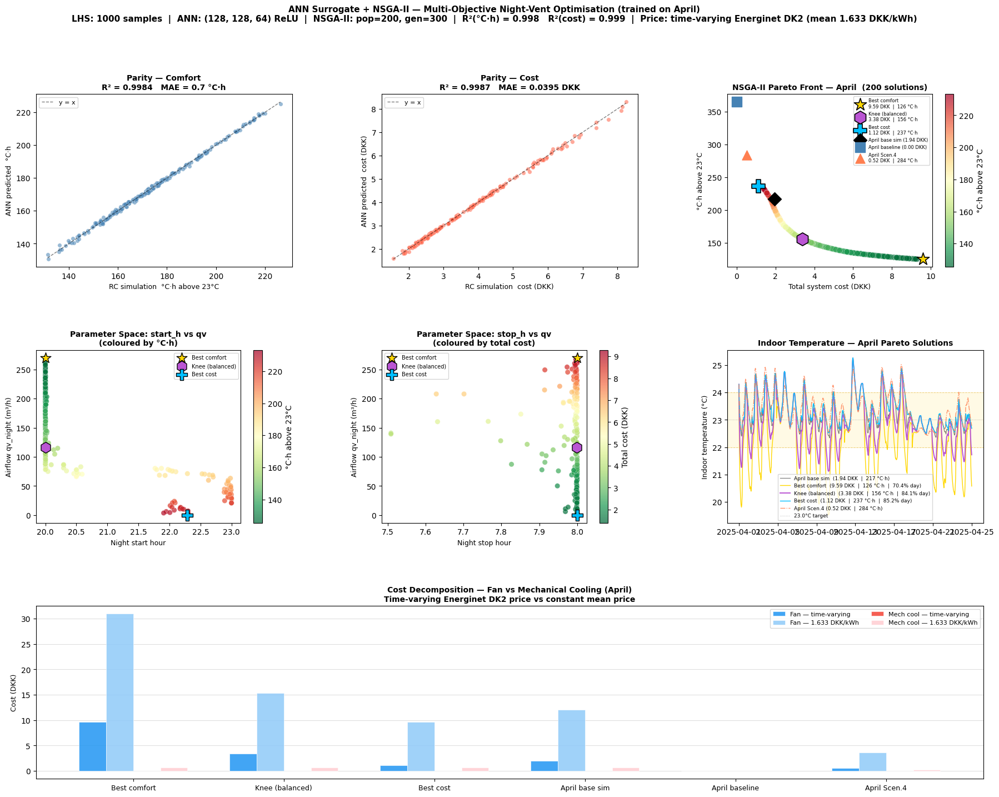


════════════════════════════════════════════════════════════════════════
  ANN + NSGA-II — RECOMMENDED SCHEDULE  (Pareto knee, trained on April)
════════════════════════════════════════════════════════════════════════
  Night start    : 20.0h  →  20:00
  Night stop     : 8.0h  →  07:59
  Airflow        : 116 m³/h
  °C·h above 23°C: 156.0  (April base: 217.4   Δ = -61.4)
  Day comfort    : 84.1%  (April base: 85.5%)
  Total cost (var)  : 3.3750 DKK  (April base: 1.9425   Δ = +1.4325)
  Total cost (const): 15.9871 DKK

────────────────────────────────────────────────────────────────────────────────
  Label                    Start   Stop     qv      °C·h    DKK(var)   DKK(const)     Day%    Night%
────────────────────────────────────────────────────────────────────────────────
  Best comfort            20.0h   8.0h   270     125.8      9.5860      31.6458    70.4%     39.4%
  Knee (balanced)         20.0h   8.0h   116     156.0      3.3750      15.9871    84.1%     64.3%
  Best cost    

In [21]:
# ════════════════════════════════════════════════════════════════════════════
#  ANN SURROGATE + NSGA-II  —  Night-Vent Multi-Objective Optimisation
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from scipy.stats.qmc import LatinHypercube, scale as lhs_scale
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.core.problem import Problem
from pymoo.optimize import minimize as pymoo_minimize
from pymoo.operators.crossover.sbx import SBX
from pymoo.operators.mutation.pm import PM
from pymoo.operators.sampling.rnd import FloatRandomSampling
from pymoo.termination import get_termination


# ── TUNABLE ──────────────────────────────────────────────────────────────────
N_SAMPLES    = 1000
TEST_FRAC    = 0.20
ANN_LAYERS   = (128, 128, 64)
NSGA_POP     = 200
NSGA_GEN     = 300
RANDOM_SEED  = 42

N_VARS = 3   # start_h, stop_h, qv_night

# ── PARAMETER BOUNDS ─────────────────────────────────────────────────────────
LB = np.array([NIGHT_OPT_START_LB, NIGHT_OPT_STOP_LB, QV_MIN] * N_months)
UB = np.array([NIGHT_OPT_START_UB, NIGHT_OPT_STOP_UB, QV_MAX] * N_months)
PARAM_NAMES = ['start_h', 'stop_h', 'qv_night']

P_ELEC_CONSTANT = 1.633   # DKK/kWh


# ── Recompute April-length reference scenarios ────────────────────────────────
# cost_baseline, dh_above_base, Ti_baseline, qv_baseline already recomputed
# in Block 1 via the base sim. We need Scen.4 equivalent for April.
# Scen.4 = daytime ventilation only (qv during occupancy hours, 0 at night)
qv_s4_apr    = np.where(occ_mask, qv_arr.mean(), 0.0).astype(float)
tsup_s4_apr  = np.asarray(X_train['Tsup'], dtype=float)   # same Tsup profile

_res_s4_apr  = simulate_night_vent_scenario(
    fitted_params, X_train.copy(), N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
# Scen.4 uses daytime qv override
_X_s4_apr       = X_train.copy()
_X_s4_apr['qv'] = qv_s4_apr
_res_s4_apr     = simulate_night_vent_scenario(
    fitted_params, _X_s4_apr, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

Ti_s4_apr    = np.asarray(_res_s4_apr['Ti'], dtype=float)
dh_s4_apr    = float(np.sum(np.maximum(0, Ti_s4_apr - T_TARGET)) * dt_h)
cost_s4_apr  = total_system_cost(qv_s4_apr, Ta_arr, tsup_s4_apr)
bd_s4_apr    = cost_breakdown(qv_s4_apr, Ta_arr, tsup_s4_apr)
pct_occ_s4_apr = pct_in_band(Ti_s4_apr, T_cat1_min, T_cat1_max, occ_mask)

# April baseline (no ventilation)
qv_baseline_apr  = np.zeros(len(X_train))
_X_bas_apr       = X_train.copy()
_X_bas_apr['qv'] = qv_baseline_apr
_res_bas_apr     = simulate_night_vent_scenario(
    fitted_params, _X_bas_apr, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
Ti_baseline_apr   = np.asarray(_res_bas_apr['Ti'], dtype=float)
dh_above_base_apr = float(np.sum(np.maximum(0, Ti_baseline_apr - T_TARGET)) * dt_h)
Tsup_base_apr     = np.asarray(_X_bas_apr['Tsup'], dtype=float)
cost_baseline_apr = total_system_cost(qv_baseline_apr, Ta_arr, Tsup_base_apr)

Tsup_ref_apr = np.asarray(X_train['Tsup'], dtype=float)

print(f"  April Scen.4:    {dh_s4_apr:.1f} °C·h  |  {cost_s4_apr:.4f} DKK")
print(f"  April Baseline:  {dh_above_base_apr:.1f} °C·h  |  {cost_baseline_apr:.4f} DKK")


# ── PHASE 1 — LHS sampling ───────────────────────────────────────────────────
print(f"\n{'═'*72}")
print(f"  PHASE 1 — Latin Hypercube Sampling  "
      f"({N_SAMPLES} points × {N_VARS * N_months} variables)")
print(f"  start_h ∈ [{LB[0]:.0f}, {UB[0]:.0f}]h  |  "
      f"stop_h ∈ [{LB[1]:.0f}, {UB[1]:.0f}]h  |  "
      f"qv ∈ [{LB[2]:.0f}, {UB[2]:.0f}] m³/h")
print(f"{'═'*72}")

sampler = LatinHypercube(d=N_VARS * N_months, seed=RANDOM_SEED)
X_lhs   = lhs_scale(sampler.random(n=N_SAMPLES), LB, UB)

Y_dh   = np.zeros(N_SAMPLES)
Y_cost = np.zeros(N_SAMPLES)
_failed = 0

for i, params in enumerate(X_lhs):
    if (i + 1) % 100 == 0:
        print(f"  Simulating sample {i+1}/{N_SAMPLES}  (failed: {_failed})")
    try:
        qv_mod, Tsup_mod = build_X_monthly(params)
        X_mod         = X_train.copy()
        X_mod['qv']   = qv_mod
        X_mod['Tsup'] = Tsup_mod
        res = simulate_night_vent_scenario(
            fitted_params, X_mod, N_hist,
            night_start_hour=0, night_stop_hour=0, qv_night=0,
            rec_duration=rec_duration,
            Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
        Ti = np.asarray(res['Ti'])
        if np.all(np.isfinite(Ti)):
            Y_dh[i]   = float(np.sum(np.maximum(0.0, Ti - T_TARGET)) * dt_h)
            Y_cost[i] = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
        else:
            Y_dh[i]   = dh_above_ref * 2.0
            Y_cost[i] = cost_ref     * 2.0
            _failed  += 1
    except Exception as e:
        Y_dh[i]   = dh_above_ref * 2.0
        Y_cost[i] = cost_ref     * 2.0
        _failed  += 1

Y_lhs = np.column_stack([Y_dh, Y_cost])

print(f"\n  Sampling complete — {N_SAMPLES - _failed}/{N_SAMPLES} valid simulations")
print(f"  °C·h  — min: {Y_dh.min():.1f}  mean: {Y_dh.mean():.1f}  max: {Y_dh.max():.1f}")
print(f"  cost  — min: {Y_cost.min():.2f}  mean: {Y_cost.mean():.2f}  max: {Y_cost.max():.2f}")

_lhs_df = pd.DataFrame(
    np.column_stack([X_lhs, Y_lhs]),
    columns=[f'{n}_m{m}' for m in range(N_months)
             for n in PARAM_NAMES] + ['dh_above', 'cost_dkk'])
_lhs_df.to_csv('ann_lhs_training_data.csv', index=False)
print(f"  Saved: ann_lhs_training_data.csv")


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 2 — Train & validate ANN surrogate
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*72}")
print(f"  PHASE 2 — ANN surrogate  ({ANN_LAYERS} hidden units, ReLU, Adam)")
print(f"{'═'*72}")

X_tr, X_te, Y_tr, Y_te = train_test_split(
    X_lhs, Y_lhs, test_size=TEST_FRAC, random_state=RANDOM_SEED)

scaler_X = StandardScaler().fit(X_tr)
scaler_Y = StandardScaler().fit(Y_tr)
X_tr_s   = scaler_X.transform(X_tr)
X_te_s   = scaler_X.transform(X_te)
Y_tr_s   = scaler_Y.transform(Y_tr)

ann = MLPRegressor(
    hidden_layer_sizes=ANN_LAYERS,
    activation='relu',
    solver='adam',
    alpha=1e-4,
    max_iter=3000,
    learning_rate_init=1e-3,
    early_stopping=True,
    validation_fraction=0.15,
    n_iter_no_change=60,
    random_state=RANDOM_SEED,
    verbose=False
)
ann.fit(X_tr_s, Y_tr_s)
print(f"  Training stopped at iteration {ann.n_iter_} / {ann.max_iter}")

Y_pred_s = ann.predict(X_te_s)
Y_pred   = scaler_Y.inverse_transform(Y_pred_s)

r2_dh    = r2_score(Y_te[:, 0], Y_pred[:, 0])
r2_cost  = r2_score(Y_te[:, 1], Y_pred[:, 1])
mae_dh   = mean_absolute_error(Y_te[:, 0], Y_pred[:, 0])
mae_cost = mean_absolute_error(Y_te[:, 1], Y_pred[:, 1])

print(f"\n  Validation results  (n_test = {len(X_te)}):")
print(f"  {'Objective':<24} {'R²':>8}  {'MAE':>14}  {'Status':>10}")
print(f"  {'─'*62}")
for name, r2, mae, unit in [
    ('°C·h above 23°C', r2_dh,   mae_dh,   '°C·h'),
    ('Total cost DKK',  r2_cost,  mae_cost, 'DKK'),
]:
    status = '✓  reliable' if r2 >= 0.90 else '⚠  retrain'
    print(f"  {name:<24} {r2:>8.4f}  {mae:>10.3f} {unit:>3}  {status:>10}")

if r2_dh < 0.90 or r2_cost < 0.90:
    print(f"\n  ⚠  Increase N_SAMPLES and re-run Phase 1–2.")
else:
    print(f"\n  ✓  Both R² ≥ 0.90 — surrogate approved for NSGA-II.")


def surrogate_predict(X_raw: np.ndarray) -> np.ndarray:
    Y_s = ann.predict(scaler_X.transform(np.atleast_2d(X_raw)))
    Y   = scaler_Y.inverse_transform(Y_s)
    Y[:, 0] = np.clip(Y[:, 0], 0.0, None)
    Y[:, 1] = np.clip(Y[:, 1], 0.0, None)
    return Y


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 3 — NSGA-II on surrogate
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*72}")
print(f"  PHASE 3 — NSGA-II  (pop={NSGA_POP}, gen={NSGA_GEN}, surrogate-based)")
print(f"  f1 = °C·h above {T_TARGET}°C  |  f2 = total system cost (DKK)")
print(f"{'═'*72}")


class NightVentSurrogateProblem(Problem):
    def __init__(self):
        n_total = N_VARS * N_months
        super().__init__(n_var=n_total, n_obj=2, xl=LB, xu=UB, vtype=float)

    def _evaluate(self, X, out, *args, **kwargs):
        out["F"] = surrogate_predict(X)


nsga2 = NSGA2(
    pop_size=NSGA_POP,
    sampling=FloatRandomSampling(),
    crossover=SBX(prob=0.90, eta=15),
    mutation=PM(eta=20),
    eliminate_duplicates=True,
)
nsga2_res = pymoo_minimize(
    NightVentSurrogateProblem(),
    nsga2,
    termination=get_termination("n_gen", NSGA_GEN),
    seed=RANDOM_SEED,
    verbose=True,
    save_history=False,
)

X_pareto = nsga2_res.X
F_pareto = nsga2_res.F
print(f"\n  NSGA-II complete — {len(X_pareto)} Pareto-optimal solutions")

F_n = (F_pareto - F_pareto.min(0)) / (F_pareto.max(0) - F_pareto.min(0) + 1e-9)
knee_idx         = int(np.argmin(np.hypot(F_n[:, 0], F_n[:, 1])))
best_comfort_idx = int(np.argmin(F_pareto[:, 0]))
best_cost_idx    = int(np.argmin(F_pareto[:, 1]))

KEY_SOLUTIONS = {
    'Best comfort'    : (best_comfort_idx, 'gold',         '*'),
    'Knee (balanced)' : (knee_idx,         'mediumorchid', 'h'),
    'Best cost'       : (best_cost_idx,    'deepskyblue',  'P'),
}


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 4 — Re-simulate key solutions + price decomposition
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*72}")
print(f"  PHASE 4 — RC re-simulation of 3 key Pareto solutions")
print(f"  Price decomposition: time-varying vs constant {P_ELEC_CONSTANT} DKK/kWh")
print(f"{'═'*72}")

verified = {}
for label, (idx, color, marker) in KEY_SOLUTIONS.items():
    params           = X_pareto[idx]
    qv_mod, Tsup_mod = build_X_monthly(params)
    X_mod            = X_train.copy()
    X_mod['qv']      = qv_mod
    X_mod['Tsup']    = Tsup_mod

    res  = simulate_night_vent_scenario(
        fitted_params, X_mod, N_hist,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_v = np.asarray(res['Ti'])

    dh_v, _   = dh_from_target(Ti_v)
    pct_occ_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, occ_mask)
    pct_ngt_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, all_night_mask)

    bd_var     = cost_breakdown(qv_mod, Ta_arr, Tsup_mod)
    cost_var   = bd_var['total']
    bd_const   = cost_breakdown(qv_mod, Ta_arr, Tsup_mod, p_elec=P_ELEC_CONSTANT)
    cost_const = bd_const['total']

    verified[label] = {
        'params'    : params,
        'Ti'        : Ti_v,
        'qv_mod'    : qv_mod,
        'dh_above'  : dh_v,
        'cost'      : cost_var,
        'cost_const': cost_const,
        'bd_var'    : bd_var,
        'bd_const'  : bd_const,
        'pct_occ'   : pct_occ_v,
        'pct_night' : pct_ngt_v,
        'surr_dh'   : F_pareto[idx, 0],
        'surr_cost' : F_pareto[idx, 1],
        'color'     : color,
        'marker'    : marker,
    }

    print(f"\n  ── {label}  (NSGA-II idx {idx})")
    print(f"     Schedule      : start={params[0]:.1f}h  stop={params[1]:.1f}h  qv={params[2]:.0f} m³/h")
    print(f"     RC sim        : {dh_v:.1f} °C·h  |  day: {pct_occ_v:.1f}%  night: {pct_ngt_v:.1f}%")
    print(f"     ── Cost breakdown (time-varying price) ──────────────")
    print(f"       Fan cost        : {bd_var['fan_cost']:.4f} DKK")
    print(f"       Mech cool cost  : {bd_var['mech_cool_cost']:.4f} DKK")
    print(f"       Free cool saves : {bd_var['free_cool_savings']:.4f} DKK")
    print(f"       Total           : {cost_var:.4f} DKK")
    print(f"     ── Cost at constant {P_ELEC_CONSTANT} DKK/kWh ─────────────────")
    print(f"       Fan cost        : {bd_const['fan_cost']:.4f} DKK")
    print(f"       Mech cool cost  : {bd_const['mech_cool_cost']:.4f} DKK")
    print(f"       Total           : {cost_const:.4f} DKK")
    print(f"       Δ (var − const) : {cost_var - cost_const:+.4f} DKK")
    print(f"     Surrogate     : {F_pareto[idx,0]:.1f} °C·h  |  {F_pareto[idx,1]:.2f} DKK  "
          f"(Δ = {dh_v - F_pareto[idx,0]:+.1f} °C·h  {cost_var - F_pareto[idx,1]:+.2f} DKK)")


# ════════════════════════════════════════════════════════════════════════════
#  PHASE 5 — Dashboard figure
# ════════════════════════════════════════════════════════════════════════════
fig_ann = plt.figure(figsize=(22, 16))
gs_ann  = gridspec.GridSpec(3, 3, figure=fig_ann, hspace=0.48, wspace=0.35)
fig_ann.suptitle(
    'ANN Surrogate + NSGA-II — Multi-Objective Night-Vent Optimisation (trained on April)\n'
    f'LHS: {N_SAMPLES} samples  |  ANN: {ANN_LAYERS} ReLU  |  '
    f'NSGA-II: pop={NSGA_POP}, gen={NSGA_GEN}  |  '
    f'R²(°C·h) = {r2_dh:.3f}   R²(cost) = {r2_cost:.3f}  |  '
    f'Price: time-varying Energinet DK2 (mean {P_ELEC_CONSTANT} DKK/kWh)',
    fontsize=11, fontweight='bold'
)

# ── P0: Parity — comfort ──────────────────────────────────────────────────────
ax0 = fig_ann.add_subplot(gs_ann[0, 0])
ax0.scatter(Y_te[:, 0], Y_pred[:, 0], alpha=0.55, s=28,
            color='steelblue', edgecolors='white', lw=0.3)
_lo, _hi = Y_te[:, 0].min(), Y_te[:, 0].max()
ax0.plot([_lo, _hi], [_lo, _hi], 'k--', lw=1.0, alpha=0.5, label='y = x')
ax0.set_xlabel('RC simulation  °C·h above 23°C', fontsize=9)
ax0.set_ylabel('ANN predicted  °C·h', fontsize=9)
ax0.set_title(f'Parity — Comfort\nR² = {r2_dh:.4f}   MAE = {mae_dh:.1f} °C·h',
              fontsize=10, fontweight='bold')
ax0.legend(fontsize=8)

# ── P1: Parity — cost ────────────────────────────────────────────────────────
ax1 = fig_ann.add_subplot(gs_ann[0, 1])
ax1.scatter(Y_te[:, 1], Y_pred[:, 1], alpha=0.55, s=28,
            color='tomato', edgecolors='white', lw=0.3)
_lo, _hi = Y_te[:, 1].min(), Y_te[:, 1].max()
ax1.plot([_lo, _hi], [_lo, _hi], 'k--', lw=1.0, alpha=0.5, label='y = x')
ax1.set_xlabel('RC simulation  cost (DKK)', fontsize=9)
ax1.set_ylabel('ANN predicted  cost (DKK)', fontsize=9)
ax1.set_title(f'Parity — Cost\nR² = {r2_cost:.4f}   MAE = {mae_cost:.4f} DKK',
              fontsize=10, fontweight='bold')
ax1.legend(fontsize=8)

# ── P2: Pareto front ─────────────────────────────────────────────────────────
ax2 = fig_ann.add_subplot(gs_ann[0, 2])
_sort = np.argsort(F_pareto[:, 1])
sc2   = ax2.scatter(F_pareto[:, 1], F_pareto[:, 0],
                    c=F_pareto[:, 0], cmap='RdYlGn_r', s=55,
                    alpha=0.70, edgecolors='white', lw=0.3, zorder=3)
ax2.plot(F_pareto[_sort, 1], F_pareto[_sort, 0],
         color='black', lw=1.0, alpha=0.35, zorder=2)
plt.colorbar(sc2, ax=ax2, label='°C·h above 23°C')
for label, data in verified.items():
    ax2.scatter(data['cost'], data['dh_above'],
                s=280, marker=data['marker'], color=data['color'],
                edgecolors='black', lw=1.2, zorder=6,
                label=f"{label}\n{data['cost']:.2f} DKK  |  {data['dh_above']:.0f} °C·h")
ax2.scatter(cost_ref,           dh_above_ref,      s=150, marker='D',
            color='black',      zorder=7, label=f'April base sim ({cost_ref:.2f} DKK)')
ax2.scatter(cost_baseline_apr,  dh_above_base_apr, s=150, marker='s',
            color='steelblue',  zorder=7, label=f'April baseline ({cost_baseline_apr:.2f} DKK)')
ax2.scatter(cost_s4_apr, dh_s4_apr, s=150, marker='^', color='coral', zorder=7,
            label=f'April Scen.4\n{cost_s4_apr:.2f} DKK  |  {dh_s4_apr:.0f} °C·h')
ax2.set_xlabel('Total system cost (DKK)', fontsize=9)
ax2.set_ylabel('°C·h above 23°C', fontsize=9)
ax2.set_title(f'NSGA-II Pareto Front — April  ({len(X_pareto)} solutions)',
              fontsize=10, fontweight='bold')
ax2.legend(fontsize=6.0, loc='upper right')

# ── P3: Parameter space — start_h vs qv ──────────────────────────────────────
ax3 = fig_ann.add_subplot(gs_ann[1, 0])
sc3 = ax3.scatter(X_pareto[:, 0], X_pareto[:, 2],
                  c=F_pareto[:, 0], cmap='RdYlGn_r', s=45,
                  alpha=0.70, edgecolors='white', lw=0.3)
plt.colorbar(sc3, ax=ax3, label='°C·h above 23°C')
for label, data in verified.items():
    ax3.scatter(data['params'][0], data['params'][2],
                s=200, marker=data['marker'], color=data['color'],
                edgecolors='black', lw=1.0, zorder=5, label=label)
ax3.set_xlabel('Night start hour', fontsize=9)
ax3.set_ylabel('Airflow qv_night (m³/h)', fontsize=9)
ax3.set_title('Parameter Space: start_h vs qv\n(coloured by °C·h)',
              fontsize=10, fontweight='bold')
ax3.legend(fontsize=7)

# ── P4: Parameter space — stop_h vs qv ───────────────────────────────────────
ax4 = fig_ann.add_subplot(gs_ann[1, 1])
sc4 = ax4.scatter(X_pareto[:, 1], X_pareto[:, 2],
                  c=F_pareto[:, 1], cmap='RdYlGn_r', s=45,
                  alpha=0.70, edgecolors='white', lw=0.3)
plt.colorbar(sc4, ax=ax4, label='Total cost (DKK)')
for label, data in verified.items():
    ax4.scatter(data['params'][1], data['params'][2],
                s=200, marker=data['marker'], color=data['color'],
                edgecolors='black', lw=1.0, zorder=5, label=label)
ax4.set_xlabel('Night stop hour', fontsize=9)
ax4.set_ylabel('Airflow qv_night (m³/h)', fontsize=9)
ax4.set_title('Parameter Space: stop_h vs qv\n(coloured by total cost)',
              fontsize=10, fontweight='bold')
ax4.legend(fontsize=7)

# ── P5: Ti time-series (April only, all same-length arrays) ──────────────────
ax5 = fig_ann.add_subplot(gs_ann[1, 2])
ax5.plot(index, Ti_ref, color='black', lw=0.9, alpha=0.50,
         label=f'April base sim  ({cost_ref:.2f} DKK  |  {dh_above_ref:.0f} °C·h)')
for label, data in verified.items():
    lw = 1.4 if label == 'Knee (balanced)' else 1.0
    ax5.plot(index, data['Ti'], color=data['color'], lw=lw,
             label=f"{label}  ({data['cost']:.2f} DKK  |  "
                   f"{data['dh_above']:.0f} °C·h  |  {data['pct_occ']:.1f}% day)")
ax5.plot(index, Ti_s4_apr, color='coral', lw=1.0, ls='-.', alpha=0.85,
         label=f"April Scen.4 ({cost_s4_apr:.2f} DKK  |  {dh_s4_apr:.0f} °C·h)")
ax5.axhspan(T_cat1_min, T_cat1_max, alpha=0.10, color='gold')
ax5.axhline(T_cat1_max, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
ax5.axhline(T_cat1_min, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
ax5.axhline(T_TARGET,   color='grey',      lw=0.7, ls=':',  alpha=0.6,
            label=f'{T_TARGET}°C target')
ax5.set_ylabel('Indoor temperature (°C)', fontsize=9)
ax5.set_title('Indoor Temperature — April Pareto Solutions',
              fontsize=10, fontweight='bold')
ax5.legend(fontsize=6.5)

# ── P6: Cost decomposition ────────────────────────────────────────────────────
ax6 = fig_ann.add_subplot(gs_ann[2, :])

_labels_bar = list(verified.keys()) + ['April base sim', 'April baseline', 'April Scen.4']
_fan_var    = ([d['bd_var']['fan_cost']  for d in verified.values()]
               + [cost_breakdown(qv_arr, Ta_arr, Tsup_ref_apr)['fan_cost'],
                  cost_breakdown(qv_baseline_apr, Ta_arr, Tsup_base_apr)['fan_cost'],
                  bd_s4_apr['fan_cost']])
_cool_var   = ([d['bd_var']['mech_cool_cost'] for d in verified.values()]
               + [cost_breakdown(qv_arr, Ta_arr, Tsup_ref_apr)['mech_cool_cost'],
                  cost_breakdown(qv_baseline_apr, Ta_arr, Tsup_base_apr)['mech_cool_cost'],
                  bd_s4_apr['mech_cool_cost']])
_fan_const  = ([d['bd_const']['fan_cost'] for d in verified.values()]
               + [cost_breakdown(qv_arr, Ta_arr, Tsup_ref_apr,  p_elec=P_ELEC_CONSTANT)['fan_cost'],
                  cost_breakdown(qv_baseline_apr, Ta_arr, Tsup_base_apr, p_elec=P_ELEC_CONSTANT)['fan_cost'],
                  cost_breakdown(qv_s4_apr, Ta_arr, tsup_s4_apr, p_elec=P_ELEC_CONSTANT)['fan_cost']])
_cool_const = ([d['bd_const']['mech_cool_cost'] for d in verified.values()]
               + [cost_breakdown(qv_arr, Ta_arr, Tsup_ref_apr,  p_elec=P_ELEC_CONSTANT)['mech_cool_cost'],
                  cost_breakdown(qv_baseline_apr, Ta_arr, Tsup_base_apr, p_elec=P_ELEC_CONSTANT)['mech_cool_cost'],
                  cost_breakdown(qv_s4_apr, Ta_arr, tsup_s4_apr, p_elec=P_ELEC_CONSTANT)['mech_cool_cost']])

x     = np.arange(len(_labels_bar))
width = 0.18
b1 = ax6.bar(x - 1.5*width, _fan_var,    width, label='Fan — time-varying',
             color='#2196F3', alpha=0.85, edgecolor='white', lw=0.5)
b2 = ax6.bar(x - 0.5*width, _fan_const,  width, label=f'Fan — {P_ELEC_CONSTANT} DKK/kWh',
             color='#90CAF9', alpha=0.85, edgecolor='white', lw=0.5)
b3 = ax6.bar(x + 0.5*width, _cool_var,   width, label='Mech cool — time-varying',
             color='#F44336', alpha=0.85, edgecolor='white', lw=0.5)
b4 = ax6.bar(x + 1.5*width, _cool_const, width, label=f'Mech cool — {P_ELEC_CONSTANT} DKK/kWh',
             color='#FFCDD2', alpha=0.85, edgecolor='white', lw=0.5)
ax6.set_xticks(x)
ax6.set_xticklabels(_labels_bar, fontsize=9)
ax6.set_ylabel('Cost (DKK)', fontsize=9)
ax6.set_title(
    'Cost Decomposition — Fan vs Mechanical Cooling (April)\n'
    'Time-varying Energinet DK2 price vs constant mean price',
    fontsize=10, fontweight='bold')
ax6.legend(fontsize=8, ncol=2)
ax6.yaxis.grid(True, alpha=0.4)
ax6.set_axisbelow(True)

plt.savefig('ann_nsga2_dashboard.png', dpi=150, bbox_inches='tight')
plt.show()


# ════════════════════════════════════════════════════════════════════════════
#  FINAL RECOMMENDATION PRINTOUT
# ════════════════════════════════════════════════════════════════════════════
knee = verified['Knee (balanced)']
print(f"\n{'═'*72}")
print(f"  ANN + NSGA-II — RECOMMENDED SCHEDULE  (Pareto knee, trained on April)")
print(f"{'═'*72}")
print(f"  Night start    : {knee['params'][0]:.1f}h  "
      f"→  {int(knee['params'][0]):02d}:{int((knee['params'][0] % 1)*60):02d}")
print(f"  Night stop     : {knee['params'][1]:.1f}h  "
      f"→  {int(knee['params'][1]):02d}:{int((knee['params'][1] % 1)*60):02d}")
print(f"  Airflow        : {knee['params'][2]:.0f} m³/h")
print(f"  °C·h above 23°C: {knee['dh_above']:.1f}  "
      f"(April base: {dh_above_ref:.1f}   Δ = {knee['dh_above'] - dh_above_ref:+.1f})")
print(f"  Day comfort    : {knee['pct_occ']:.1f}%  (April base: {pct_occ_ref:.1f}%)")
print(f"  Total cost (var)  : {knee['cost']:.4f} DKK  "
      f"(April base: {cost_ref:.4f}   Δ = {knee['cost'] - cost_ref:+.4f})")
print(f"  Total cost (const): {knee['cost_const']:.4f} DKK")

print(f"\n{'─'*80}")
print(f"  {'Label':<22} {'Start':>7} {'Stop':>6} {'qv':>6}  "
      f"{'°C·h':>8}  {'DKK(var)':>10}  {'DKK(const)':>11}  "
      f"{'Day%':>7}  {'Night%':>8}")
print(f"{'─'*80}")
for label, data in verified.items():
    p = data['params']
    print(f"  {label:<22} {p[0]:>5.1f}h {p[1]:>5.1f}h {p[2]:>5.0f}  "
          f"{data['dh_above']:>8.1f}  {data['cost']:>10.4f}  "
          f"{data['cost_const']:>11.4f}  "
          f"{data['pct_occ']:>6.1f}%  {data['pct_night']:>7.1f}%")

_bd_ref_c = cost_breakdown(qv_arr, Ta_arr, Tsup_ref_apr, p_elec=P_ELEC_CONSTANT)
_bd_bas_c = cost_breakdown(qv_baseline_apr, Ta_arr, Tsup_base_apr, p_elec=P_ELEC_CONSTANT)

print(f"  {'April base sim':<22}  {'—':>6}  {'—':>6}  {'—':>6}  "
      f"{dh_above_ref:>8.1f}  {cost_ref:>10.4f}  {_bd_ref_c['total']:>11.4f}  "
      f"{pct_occ_ref:>6.1f}%  {pct_night_ref:>7.1f}%")
print(f"  {'April baseline':<22}  {'—':>6}  {'—':>6}  {'—':>6}  "
      f"{dh_above_base_apr:>8.1f}  {cost_baseline_apr:>10.4f}  {_bd_bas_c['total']:>11.4f}  "
      f"{'—':>6}   {'—':>7}")
print(f"  {'April Scen.4':<22}  {'—':>6}  {'—':>6}  "
      f"{qv_s4_apr[occ_mask].mean():>5.0f}  "
      f"{dh_s4_apr:>8.1f}  {cost_s4_apr:>10.4f}  "
      f"{cost_breakdown(qv_s4_apr, Ta_arr, tsup_s4_apr, p_elec=P_ELEC_CONSTANT)['total']:>11.4f}  "
      f"{pct_occ_s4_apr:>6.1f}%  {'—':>7}")
print(f"{'═'*80}")

print(f"\n  Surrogate accuracy on re-simulated solutions:")
print(f"  {'Label':<22}  {'Δ°C·h':>10}  {'ΔDKK':>8}")
print(f"  {'─'*44}")
for label, data in verified.items():
    print(f"  {label:<22}  "
          f"{data['dh_above'] - data['surr_dh']:>+10.2f}  "
          f"{data['cost'] - data['surr_cost']:>+8.4f}")

Globals restored to May.
May base: 484.3 °C·h  |  4.5562 DKK


══════════════════════════════════════════════════════════════════════════════════════════
  April schedules → May performance
══════════════════════════════════════════════════════════════════════════════════════════
  Label                    Start   Stop    qv      °C·h    Δ°C·h       DKK     ΔDKK    Day%   Night%
  ────────────────────────────────────────────────────────────────────────────────────────
  Best comfort            20.0h   8.0h  270     293.6   -190.7   10.6015  +6.0454   74.4%    59.6%
  Knee (balanced)         20.0h   8.0h  116     384.0   -100.3    4.4957  -0.0605   70.9%    84.0%
  Best cost               22.3h   8.0h    0     557.3    +73.0    2.3476  -2.2086   55.2%    67.2%
  May base sim                 —      —     —     484.3        —    4.5562        —   66.4%    73.7%
══════════════════════════════════════════════════════════════════════════════════════════


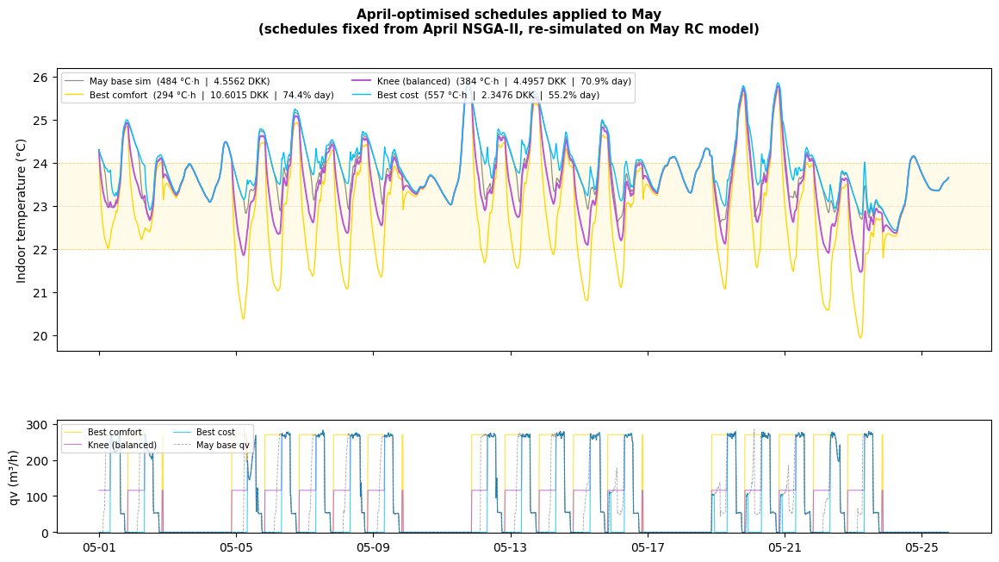

  Saved: april_schedules_on_may.png


In [22]:
# ════════════════════════════════════════════════════════════════════════════
#  BLOCK 3 — Apply April-optimised schedules to May data
# ════════════════════════════════════════════════════════════════════════════


# ── Restore May globals ───────────────────────────────────────────────────────
X_train             = _may['X_train']
index               = _may['index']
Ta_arr              = _may['Ta_arr']
qv_arr              = _may['qv_arr']
hours               = _may['hours']
weekdays            = _may['weekdays']
nighttime_mask      = _may['nighttime_mask']
occ_mask            = _may['occ_mask']
all_night_mask      = _may['all_night_mask']
weekday_night_mask  = _may['weekday_night_mask']
month_periods       = _may['month_periods']
months_in_data      = _may['months_in_data']
price_series        = _may['price_series']
N_hist              = _may['N_hist']
Ti_ref              = _may['Ti_ref']
dh_above_ref        = _may['dh_above_ref']
cost_ref            = _may['cost_ref']
pct_occ_ref         = _may['pct_occ_ref']
pct_night_ref       = _may['pct_night_ref']

# Reset N_months so build_X_monthly uses May's month structure
N_months = len(months_in_data)

print("Globals restored to May.")
print(f"May base: {dh_above_ref:.1f} °C·h  |  {cost_ref:.4f} DKK\n")

# Optional sanity checks to catch mismatches early
assert len(index) == len(Ta_arr) == len(qv_arr) == len(N_hist) == len(price_series)
assert len(index) == len(nighttime_mask) == len(occ_mask) == len(all_night_mask)
assert len(index) == len(month_periods)


# ── Apply each April Pareto solution to May ───────────────────────────────────
# verified dict still holds the 3 April solutions with their params
# build_X_monthly must now use N_months for May (re-check if different!)

may_results = {}

for label, data in verified.items():
    params           = data['params']          # April-optimised schedule
    qv_mod, Tsup_mod = build_X_monthly(params) # rebuilds for current (May) horizon

    # Check that the generated control profiles match May length
    assert len(qv_mod)  == len(index)
    assert len(Tsup_mod) == len(index)

    X_mod          = X_train.copy()           # May feature matrix
    X_mod['qv']    = qv_mod
    X_mod['Tsup']  = Tsup_mod

    res  = simulate_night_vent_scenario(
               fitted_params, X_mod, N_hist,
               night_start_hour=0, night_stop_hour=0, qv_night=0,
               rec_duration=rec_duration,
               Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_v = np.asarray(res['Ti'])

    dh_v, _   = dh_from_target(Ti_v)
    pct_occ_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, occ_mask)
    pct_ngt_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, all_night_mask)
    cost_v    = total_system_cost(qv_mod, Ta_arr, Tsup_mod)

    may_results[label] = {
        'params'    : params,
        'Ti'        : Ti_v,
        'qv_mod'    : qv_mod,
        'dh_above'  : dh_v,
        'cost'      : cost_v,
        'pct_occ'   : pct_occ_v,
        'pct_night' : pct_ngt_v,
        'color'     : data['color'],
        'marker'    : data['marker'],
    }


# ── Print transfer table ──────────────────────────────────────────────────────
print(f"\n{'═'*90}")
print(f"  April schedules → May performance")
print(f"{'═'*90}")
print(f"  {'Label':<22} {'Start':>7} {'Stop':>6} {'qv':>5}  "
      f"{'°C·h':>8}  {'Δ°C·h':>7}  {'DKK':>8}  {'ΔDKK':>7}  {'Day%':>6}  {'Night%':>7}")
print(f"  {'─'*88}")

for label, r in may_results.items():
    p    = r['params']
    d_dh = r['dh_above'] - dh_above_ref
    d_c  = r['cost']     - cost_ref
    print(f"  {label:<22} {p[0]:>5.1f}h {p[1]:>5.1f}h {p[2]:>4.0f}  "
          f"{r['dh_above']:>8.1f}  {d_dh:>+7.1f}  {r['cost']:>8.4f}  "
          f"{d_c:>+7.4f}  {r['pct_occ']:>5.1f}%  {r['pct_night']:>6.1f}%")

print(f"  {'May base sim':<22} {'—':>7} {'—':>6} {'—':>5}  "
      f"{dh_above_ref:>8.1f}  {'—':>7}  {cost_ref:>8.4f}  {'—':>7}  "
      f"{pct_occ_ref:>5.1f}%  {pct_night_ref:>6.1f}%")
print(f"{'═'*90}")


# ── Figure — May Ti time series for all 3 transferred schedules ───────────────
fig_may, (ax_ti, ax_qv) = plt.subplots(
    2, 1, figsize=(14, 7),
    gridspec_kw={'height_ratios': [2.5, 1.0], 'hspace': 0.35}
)
fig_may.suptitle(
    'April-optimised schedules applied to May\n'
    '(schedules fixed from April NSGA-II, re-simulated on May RC model)',
    fontsize=11, fontweight='bold'
)

ax_ti.plot(index, Ti_ref, color='black', lw=0.85, alpha=0.45,
           label=f'May base sim  ({dh_above_ref:.0f} °C·h  |  {cost_ref:.4f} DKK)')
for label, r in may_results.items():
    lw = 1.4 if label == 'Knee (balanced)' else 1.0
    ax_ti.plot(index, r['Ti'], color=r['color'], lw=lw,
               label=f"{label}  ({r['dh_above']:.0f} °C·h  |  "
                     f"{r['cost']:.4f} DKK  |  {r['pct_occ']:.1f}% day)")
ax_ti.axhspan(T_cat1_min, T_cat1_max, alpha=0.09, color='gold')
ax_ti.axhline(T_cat1_max, color='goldenrod', lw=0.6, ls='--', alpha=0.5)
ax_ti.axhline(T_cat1_min, color='goldenrod', lw=0.6, ls='--', alpha=0.5)
ax_ti.axhline(T_TARGET,   color='grey',      lw=0.5, ls=':',  alpha=0.5)
ax_ti.set_ylabel('Indoor temperature (°C)')
ax_ti.legend(loc='upper left', ncol=2, fontsize=7.5)
plt.setp(ax_ti.get_xticklabels(), visible=False)

for label, r in may_results.items():
    ax_qv.plot(index, r['qv_mod'], color=r['color'], lw=0.8, alpha=0.75,
               label=label)
ax_qv.plot(index, qv_arr, color='black', lw=0.6, alpha=0.35, ls='--',
           label='May base qv')
ax_qv.set_ylabel('qv (m³/h)')
ax_qv.set_ylim(-2, QV_MAX * 1.15)
ax_qv.legend(loc='upper left', ncol=2, fontsize=7)
ax_qv.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))

plt.savefig('april_schedules_on_may.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: april_schedules_on_may.png")


═══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════
  Scenario                 Start   Stop    qv     °C·h    Day%   Night%   Fan(var)  Cool(var)  FreeSav(var)  Tot(var)   Fan(cst)  Cool(cst)  FreeSav(cst)  Tot(cst)
───────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  Best comfort             20.0h   8.0h   270    293.6   74.4%    59.6%     10.516      0.085        30.620    10.602     30.889      1.404        86.105    32.293
  Knee (balanced)          20.0h   8.0h   116    384.0   70.9%    84.0%      4.410      0.085        15.951     4.496     16.323      1.404        50.235    17.727
  Best cost                22.3h   8.0h     0    557.3   55.2%    67.2%      2.262      0.085         5.224     2.348     11.167      1.404        23.869    12.571
  May base sim                 —      —     —    484.3   66.4%    73.7%

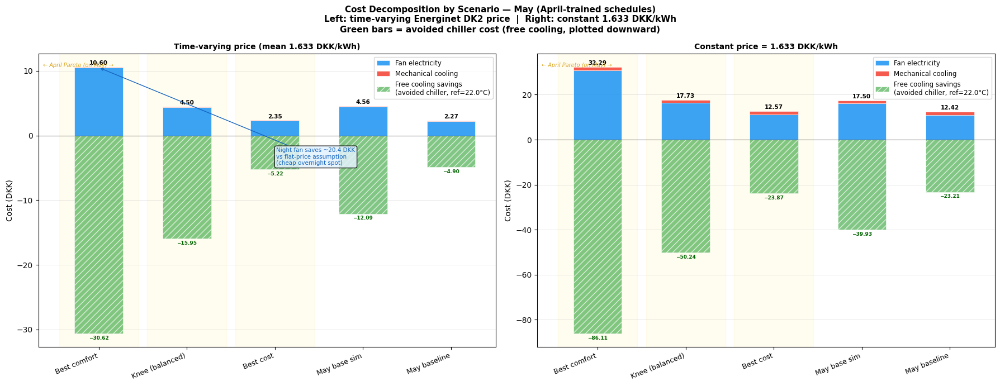

  Saved: cost_decomposition_extended.png


In [23]:
# ════════════════════════════════════════════════════════════════════════════
#  POST-PROCESSING — Extended Summary Table + Cost Decomposition Bar Chart
#  Runs on May data — Pareto solutions from April, evaluated on May
# ════════════════════════════════════════════════════════════════════════════


# ── Compute May reference scenario: baseline (no night ventilation) ───────────
# May baseline: same daytime qv as base, but qv = 0 at night
qv_baseline_may = np.where(nighttime_mask, 0.0, qv_arr).astype(float)
_X_bas_may      = X_train.copy()
_X_bas_may['qv'] = qv_baseline_may

_res_bas_may = simulate_night_vent_scenario(
    fitted_params, _X_bas_may, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init
)
Ti_baseline_may    = np.asarray(_res_bas_may['Ti'], dtype=float)
Tsup_base_may      = np.asarray(_X_bas_may['Tsup'], dtype=float)
dh_above_base_may  = float(np.sum(np.maximum(0, Ti_baseline_may - T_TARGET)) * dt_h)
cost_baseline_may  = total_system_cost(qv_baseline_may, Ta_arr, Tsup_base_may)
pct_occ_base_may   = pct_in_band(Ti_baseline_may, T_cat1_min, T_cat1_max, occ_mask)

Tsup_ref_may = np.asarray(X_train['Tsup'], dtype=float)


# ── Add cost breakdowns to may_results ───────────────────────────────────────
for label, r in may_results.items():
    # recompute cleanly using the Tsup that was used in simulation
    qv_m, Tsup_m = build_X_monthly(r['params'])   # same call as Block 3
    r['bd_var']   = cost_breakdown(qv_m, Ta_arr, Tsup_m)
    r['bd_const'] = cost_breakdown(qv_m, Ta_arr, Tsup_m, p_elec=P_ELEC_CONSTANT)


# ── Recompute May reference cost breakdowns ──────────────────────────────────
_bd_ref   = cost_breakdown(qv_arr,          Ta_arr, Tsup_ref_may)
_bd_ref_c = cost_breakdown(qv_arr,          Ta_arr, Tsup_ref_may,  p_elec=P_ELEC_CONSTANT)
_bd_bas   = cost_breakdown(qv_baseline_may, Ta_arr, Tsup_base_may)
_bd_bas_c = cost_breakdown(qv_baseline_may, Ta_arr, Tsup_base_may, p_elec=P_ELEC_CONSTANT)


# ── Build unified scenario list ──────────────────────────────────────────────
scenarios = []

# Pareto solutions — now using may_results (May-length qv_mod, May Ta_arr)
for label, data in may_results.items():
    p = data['params']
    scenarios.append({
        'label'      : label,
        'start'      : f"{p[0]:.1f}h",
        'stop'       : f"{p[1]:.1f}h",
        'qv'         : f"{p[2]:.0f}",
        'dh_above'   : data['dh_above'],
        'pct_occ'    : data['pct_occ'],
        'pct_night'  : data['pct_night'],
        'fan_var'    : data['bd_var']['fan_cost'],
        'cool_var'   : data['bd_var']['mech_cool_cost'],
        'free_var'   : free_cooling_savings_nv(data['qv_mod'], Ta_arr),
        'total_var'  : data['bd_var']['total'],
        'fan_const'  : data['bd_const']['fan_cost'],
        'cool_const' : data['bd_const']['mech_cool_cost'],
        'free_const' : free_cooling_savings_nv(
                           data['qv_mod'], Ta_arr, p_elec=P_ELEC_CONSTANT),
        'total_const': data['bd_const']['total'],
    })

# Reference scenarios — all May arrays (base sim + baseline)
for label, bd_v, bd_c, dh, pct_occ, pct_ngt, qv_s, qv_arr_s in [
    ('May base sim',
     _bd_ref,  _bd_ref_c,  dh_above_ref,      pct_occ_ref,      pct_night_ref,
     '—', qv_arr),
    ('May baseline',
     _bd_bas,  _bd_bas_c,  dh_above_base_may, pct_occ_base_may, None,
     '—', qv_baseline_may),
]:
    scenarios.append({
        'label'      : label,
        'start'      : '—', 'stop': '—', 'qv': qv_s,
        'dh_above'   : dh,
        'pct_occ'    : pct_occ,
        'pct_night'  : pct_ngt,
        'fan_var'    : bd_v['fan_cost'],
        'cool_var'   : bd_v['mech_cool_cost'],
        'free_var'   : free_cooling_savings_nv(qv_arr_s, Ta_arr),
        'total_var'  : bd_v['total'],
        'fan_const'  : bd_c['fan_cost'],
        'cool_const' : bd_c['mech_cool_cost'],
        'free_const' : free_cooling_savings_nv(
                           qv_arr_s, Ta_arr, p_elec=P_ELEC_CONSTANT),
        'total_const': bd_c['total'],
    })


# ════════════════════════════════════════════════════════════════════════════
#  EXTENDED SUMMARY TABLE
# ════════════════════════════════════════════════════════════════════════════
hdr = (f"\n{'═'*135}\n"
       f"  {'Scenario':<22} {'Start':>7} {'Stop':>6} {'qv':>5}  "
       f"{'°C·h':>7}  {'Day%':>6}  {'Night%':>7}  "
       f"{'Fan(var)':>9} {'Cool(var)':>10} {'FreeSav(var)':>13} {'Tot(var)':>9}  "
       f"{'Fan(cst)':>9} {'Cool(cst)':>10} {'FreeSav(cst)':>13} {'Tot(cst)':>9}\n"
       f"{'─'*135}")
print(hdr)

for s in scenarios:
    pct_ngt_str = f"{s['pct_night']:.1f}%" if s['pct_night'] is not None else '     —'
    print(
        f"  {s['label']:<22} {s['start']:>7} {s['stop']:>6} {s['qv']:>5}  "
        f"{s['dh_above']:>7.1f}  {s['pct_occ']:>5.1f}%  {pct_ngt_str:>7}  "
        f"{s['fan_var']:>9.3f} {s['cool_var']:>10.3f} {s['free_var']:>13.3f} "
        f"{s['total_var']:>9.3f}  "
        f"{s['fan_const']:>9.3f} {s['cool_const']:>10.3f} {s['free_const']:>13.3f} "
        f"{s['total_const']:>9.3f}"
    )

print(f"{'═'*135}")
print(
    f"  (var) = time-varying Energinet DK2 price  |  "
    f"(cst) = constant {P_ELEC_CONSTANT} DKK/kWh  |  "
    f"FreeSav = avoided chiller cost (outdoor air cooler than {T_cat1_min}°C setpoint)  |  "
    f"qv in m³/h  |  Pareto schedules trained on April, evaluated on May"
)


# ════════════════════════════════════════════════════════════════════════════
#  COST DECOMPOSITION BAR CHART
# ════════════════════════════════════════════════════════════════════════════
fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=False)
fig.suptitle(
    'Cost Decomposition by Scenario — May (April-trained schedules)\n'
    f'Left: time-varying Energinet DK2 price  |  '
    f'Right: constant {P_ELEC_CONSTANT} DKK/kWh\n'
    f'Green bars = avoided chiller cost (free cooling, plotted downward)',
    fontsize=11, fontweight='bold'
)

labels = [s['label'] for s in scenarios]
fan_v  = [s['fan_var']    for s in scenarios]
cool_v = [s['cool_var']   for s in scenarios]
free_v = [s['free_var']   for s in scenarios]
fan_c  = [s['fan_const']  for s in scenarios]
cool_c = [s['cool_const'] for s in scenarios]
free_c = [s['free_const'] for s in scenarios]

x     = np.arange(len(labels))
width = 0.55
C_FAN  = '#2196F3'
C_COOL = '#F44336'
C_FREE = '#4CAF50'

for ax, fan, cool, free, price_label in [
    (axes[0], fan_v, cool_v, free_v,
     f'Time-varying price (mean {P_ELEC_CONSTANT} DKK/kWh)'),
    (axes[1], fan_c, cool_c, free_c,
     f'Constant price = {P_ELEC_CONSTANT} DKK/kWh'),
]:
    fan  = np.array(fan)
    cool = np.array(cool)
    free = np.array(free)

    ax.bar(x, fan,  width, label='Fan electricity',
           color=C_FAN,  alpha=0.88, edgecolor='white', lw=0.5)
    ax.bar(x, cool, width, bottom=fan,
           label='Mechanical cooling', color=C_COOL,
           alpha=0.88, edgecolor='white', lw=0.5)

    has_free = np.any(free > 0.01)
    if has_free:
        ax.bar(
            x, -free, width,
            label=f'Free cooling savings\n(avoided chiller, ref={T_cat1_min}°C)',
            color=C_FREE, alpha=0.70, edgecolor='white', lw=0.5, hatch='///'
        )

    totals = fan + cool
    y_top  = totals.max()

    for i, (tot, fr_val) in enumerate(zip(totals, free)):
        ax.text(x[i], tot + 0.015 * y_top,
                f'{tot:.2f}', ha='center', va='bottom',
                fontsize=7.5, fontweight='bold')
        if has_free and fr_val > 0.01:
            ax.text(x[i], -fr_val - 0.03 * y_top,
                    f'−{fr_val:.2f}', ha='center', va='top',
                    fontsize=6.5, color='darkgreen', fontweight='bold')

    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=22, ha='right', fontsize=9)
    ax.set_ylabel('Cost (DKK)', fontsize=10)
    ax.set_title(price_label, fontsize=10, fontweight='bold')
    ax.yaxis.grid(True, alpha=0.35, lw=0.6)
    ax.set_axisbelow(True)
    ax.axhline(0, color='black', lw=0.8, alpha=0.5)

    # highlight the Pareto (first len(may_results)) scenarios
    for i in range(len(may_results)):
        ax.axvspan(i - 0.45, i + 0.45, alpha=0.06, color='gold', zorder=0)

    ax.legend(fontsize=8.5, loc='upper right')
    ax.annotate('← April Pareto (on May) →',
                xytext=(0.01, 0.97), textcoords='axes fraction',
                xy=(0, 0), fontsize=7, color='goldenrod',
                fontstyle='italic', va='top', annotation_clip=False)

delta_best = np.array(fan_c)[0] - np.array(fan_v)[0]
axes[0].annotate(
    f'Night fan saves ~{delta_best:.1f} DKK\nvs flat-price assumption\n(cheap overnight spot)',
    xy=(0, np.array(fan_v)[0]), xycoords='data',
    xytext=(0.52, 0.62), textcoords='axes fraction',
    fontsize=7.5, color='#1565C0',
    arrowprops=dict(arrowstyle='->', color='#1565C0', lw=1.0),
    bbox=dict(boxstyle='round,pad=0.3', fc='#E3F2FD', alpha=0.85)
)

plt.tight_layout()
plt.savefig('cost_decomposition_extended.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: cost_decomposition_extended.png")

Re-evaluating full Pareto set with RC model (this may take a minute)...
  RC Pareto range — °C·h [294, 557]  |  cost [2.35, 10.60] DKK

Re-simulating key Pareto scenarios from scratch...
  Best comfort                : RC=10.602 DKK | ANN=9.292 DKK | RC °C·h=293.6  ANN °C·h=125.4  [idx=1]
  Knee (balanced)             : RC=4.496 DKK | ANN=3.488 DKK | RC °C·h=384.0  ANN °C·h=154.8  [idx=154]
  Best cost                   : RC=2.348 DKK | ANN=1.388 DKK | RC °C·h=557.3  ANN °C·h=233.2  [idx=0]
  Same cost as base sim       : RC=4.541 DKK | ANN=3.533 DKK | RC °C·h=382.2  ANN °C·h=154.3  [idx=51]
  Same comfort as base sim    : RC=3.211 DKK | ANN=1.952 DKK | RC °C·h=484.5  ANN °C·h=201.6  [idx=65]

══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════
  ANN + NSGA-II — PARETO COMPARISON TABLE  (all costs RC-recomputed)
═════════════════════════════════════════════════════════════════════════════

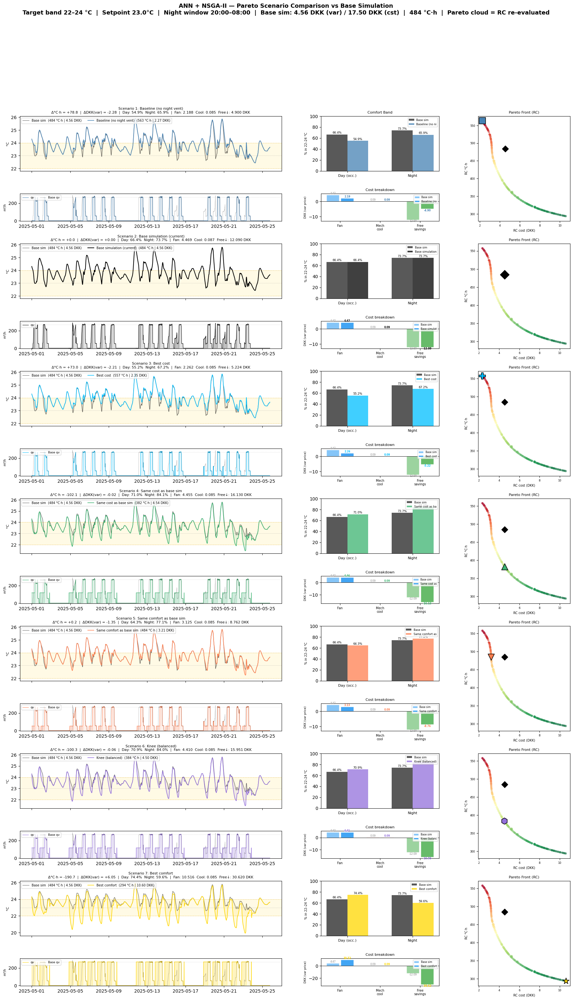

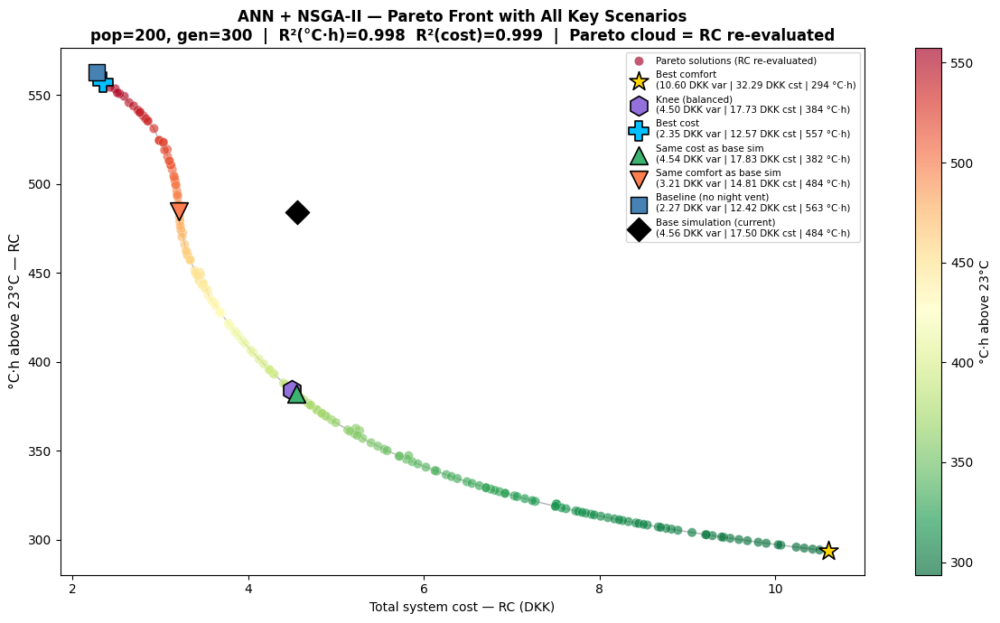


════════════════════════════════════════════════════════════════════════════════
  ANN + NSGA-II — RECOMMENDED SCHEDULE  (Pareto knee)
════════════════════════════════════════════════════════════════════════════════
  Night start     : 20.0h  →  20:00
  Night stop      : 8.0h  →  07:59
  Airflow         : 116 m³/h
  °C·h above 23°C : 384.0  (base sim: 484.3   Δ = -100.3)
  Day comfort     : 70.9%  (base sim: 66.4%)
  Total cost (var): 4.4957 DKK  (base sim: 4.5562   Δ = -0.0605)
  Total cost (cst): 17.7266 DKK
  Free cool saves : 15.9507 DKK (var) | 50.2354 DKK (cst)

────────────────────────────────────────────────────────────────────────────────────────────────────
  Label                            Start   Stop    qv     °C·h    Δ°C·h   DKK(var)   DKK(cst)   FreeSav    Day%   Night%
────────────────────────────────────────────────────────────────────────────────────────────────────
  Baseline (no night vent)             —      —     —    563.1    +78.8     2.2733    12.4247    4.89

In [24]:
# ════════════════════════════════════════════════════════════════════════════
#  ANN+NSGA-II PARETO COMPARISON — Summary Table + Figure
#
#  Prerequisites (from ANN+NSGA-II block):
#    verified, F_pareto, X_pareto, Y_lhs, X_lhs, surrogate_predict
#    dh_above_ref, cost_ref, pct_occ_ref, pct_night_ref, Ti_ref
#    dh_above_base, cost_baseline, pct_occ_base, Ti_baseline
#    index, occ_mask, all_night_mask, weekday_night_mask, weekday_day_mask
#    T_TARGET, T_cat1_min, T_cat1_max, QV_MAX, dt_h, P_ELEC_CONSTANT
#    NIGHT_START, NIGHT_STOP
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


# ════════════════════════════════════════════════════════════════════════════
#  STEP 0 — Re-evaluate ALL Pareto solutions on current-period RC model
#  This gives F_pareto_rc in the same objective space as the key markers.
# ════════════════════════════════════════════════════════════════════════════
print("Re-evaluating full Pareto set with RC model (this may take a minute)...")
F_pareto_rc = np.zeros_like(F_pareto)

for i, params in enumerate(X_pareto):
    try:
        qv_mod, Tsup_mod = build_X_monthly(params)
        X_mod            = X_train.copy()
        X_mod['qv']      = qv_mod
        X_mod['Tsup']    = Tsup_mod
        res = simulate_night_vent_scenario(
            fitted_params, X_mod, N_hist,
            night_start_hour=0, night_stop_hour=0, qv_night=0,
            rec_duration=rec_duration,
            Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
        Ti_v = np.asarray(res['Ti'])
        dh_v, _  = dh_from_target(Ti_v)
        cost_v   = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
        F_pareto_rc[i, 0] = dh_v
        F_pareto_rc[i, 1] = cost_v
    except Exception:
        F_pareto_rc[i] = [dh_above_ref * 2.0, cost_ref * 2.0]

print(f"  RC Pareto range — "
      f"°C·h [{F_pareto_rc[:,0].min():.0f}, {F_pareto_rc[:,0].max():.0f}]  |  "
      f"cost [{F_pareto_rc[:,1].min():.2f}, {F_pareto_rc[:,1].max():.2f}] DKK")

_pareto_rc_sort = np.argsort(F_pareto_rc[:, 1])


# ════════════════════════════════════════════════════════════════════════════
#  CORE HELPERS
# ════════════════════════════════════════════════════════════════════════════
def _full_resim(params, label, color, marker, pareto_idx=None):
    qv_mod, Tsup_mod = build_X_monthly(params)
    X_mod            = X_train.copy()
    X_mod['qv']      = qv_mod
    X_mod['Tsup']    = Tsup_mod

    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_hist,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)

    Ti_v      = np.asarray(res['Ti'])
    dh_v, _   = dh_from_target(Ti_v)
    pct_occ_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, occ_mask)
    pct_ngt_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, all_night_mask)

    bd_v = cost_breakdown(qv_mod, Ta_arr, Tsup_mod)
    bd_c = cost_breakdown(qv_mod, Ta_arr, Tsup_mod, p_elec=P_ELEC_CONSTANT)

    return {
        'label'      : label,
        'params'     : params,
        'pareto_idx' : pareto_idx,
        'Ti'         : Ti_v,
        'qv_mod'     : qv_mod,
        'dh_above'   : dh_v,
        'pct_occ'    : pct_occ_v,
        'pct_night'  : pct_ngt_v,
        'fan_var'    : bd_v['fan_cost'],
        'cool_var'   : bd_v['mech_cool_cost'],
        'free_var'   : free_cooling_savings_nv(qv_mod, Ta_arr),
        'total_var'  : bd_v['total'],
        'fan_const'  : bd_c['fan_cost'],
        'cool_const' : bd_c['mech_cool_cost'],
        'free_const' : free_cooling_savings_nv(qv_mod, Ta_arr, p_elec=P_ELEC_CONSTANT),
        'total_const': bd_c['total'],
        'color'      : color,
        'marker'     : marker,
    }


def _ref_metrics(label, Ti_v, qv_v, Tsup_v, dh_v, pct_occ_v, pct_ngt_v,
                 color, marker):
    bd_v = cost_breakdown(qv_v, Ta_arr, Tsup_v)
    bd_c = cost_breakdown(qv_v, Ta_arr, Tsup_v, p_elec=P_ELEC_CONSTANT)
    return {
        'label'      : label,
        'params'     : None,
        'pareto_idx' : None,
        'Ti'         : Ti_v,
        'qv_mod'     : qv_v,
        'dh_above'   : dh_v,
        'pct_occ'    : pct_occ_v,
        'pct_night'  : pct_ngt_v,
        'fan_var'    : bd_v['fan_cost'],
        'cool_var'   : bd_v['mech_cool_cost'],
        'free_var'   : free_cooling_savings_nv(qv_v, Ta_arr),
        'total_var'  : bd_v['total'],
        'fan_const'  : bd_c['fan_cost'],
        'cool_const' : bd_c['mech_cool_cost'],
        'free_const' : free_cooling_savings_nv(qv_v, Ta_arr, p_elec=P_ELEC_CONSTANT),
        'total_const': bd_c['total'],
        'color'      : color,
        'marker'     : marker,
    }


# ════════════════════════════════════════════════════════════════════════════
#  BUILD SCENARIO LIST
# ════════════════════════════════════════════════════════════════════════════
print("\nRe-simulating key Pareto scenarios from scratch...")

_sc_best_comfort = _full_resim(
    verified['Best comfort']['params'],    'Best comfort',    'gold',          '*',
    pareto_idx=verified['Best comfort'].get('pareto_idx', best_comfort_idx))

_sc_knee = _full_resim(
    verified['Knee (balanced)']['params'], 'Knee (balanced)', 'mediumpurple',  'h',
    pareto_idx=verified['Knee (balanced)'].get('pareto_idx', knee_idx))

_sc_best_cost = _full_resim(
    verified['Best cost']['params'],       'Best cost',       'deepskyblue',   'P',
    pareto_idx=verified['Best cost'].get('pareto_idx', best_cost_idx))

# iso-cost / iso-comfort found in RC space so the index is meaningful
iso_cost_idx    = int(np.argmin(np.abs(F_pareto_rc[:, 1] - cost_ref)))
iso_comfort_idx = int(np.argmin(np.abs(F_pareto_rc[:, 0] - dh_above_ref)))

_sc_iso_cost = _full_resim(
    X_pareto[iso_cost_idx],    'Same cost as base sim',    'mediumseagreen', '^',
    pareto_idx=iso_cost_idx)

_sc_iso_comfort = _full_resim(
    X_pareto[iso_comfort_idx], 'Same comfort as base sim', 'coral',          'v',
    pareto_idx=iso_comfort_idx)

for s in [_sc_best_comfort, _sc_knee, _sc_best_cost, _sc_iso_cost, _sc_iso_comfort]:
    idx = s['pareto_idx']
    print(f"  {s['label']:<28}: RC={s['total_var']:.3f} DKK | "
          f"ANN={F_pareto[idx, 1]:.3f} DKK | "
          f"RC °C·h={s['dh_above']:.1f}  ANN °C·h={F_pareto[idx, 0]:.1f}  "
          f"[idx={idx}]")

SCENARIOS = [
    _ref_metrics(
        'Baseline (no night vent)',
        Ti_baseline, qv_baseline, Tsup_base,
        dh_above_base, pct_occ_base,
        pct_in_band(Ti_baseline, T_cat1_min, T_cat1_max, all_night_mask),
        'steelblue', 's'),
    _ref_metrics(
        'Base simulation (current)',
        Ti_ref, qv_arr, Tsup_ref,
        dh_above_ref, pct_occ_ref, pct_night_ref,
        'black', 'D'),
    _sc_best_cost,
    _sc_iso_cost,
    _sc_iso_comfort,
    _sc_knee,
    _sc_best_comfort,
]
_ref = SCENARIOS[1]


# ════════════════════════════════════════════════════════════════════════════
#  SUMMARY TABLE
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*150}")
print(f"  ANN + NSGA-II — PARETO COMPARISON TABLE  (all costs RC-recomputed)")
print(f"{'═'*150}")
print(f"  {'Scenario':<30} {'Start':>7} {'Stop':>6} {'qv':>5}  "
      f"{'°C·h':>7}  {'Δ°C·h':>7}  "
      f"{'Fan(v)':>7} {'Cool(v)':>8} {'Free(v)':>8} {'Tot(v)':>7}  "
      f"{'Fan(c)':>7} {'Cool(c)':>8} {'Free(c)':>8} {'Tot(c)':>7}  "
      f"{'Day%':>6}  {'Night%':>7}")
print(f"  {'─'*148}")

for s in SCENARIOS:
    p         = s.get('params')
    start_str = f"{p[0]:.1f}h" if p is not None else "—"
    stop_str  = f"{p[1]:.1f}h" if p is not None else "—"
    qv_str    = f"{p[2]:.0f}"  if p is not None else "—"
    d_dh      = s['dh_above'] - _ref['dh_above']
    d_dh_str  = f"{d_dh:+.1f}" if s['label'] != 'Base simulation (current)' else "—"
    print(f"  {s['label']:<30} {start_str:>7} {stop_str:>6} {qv_str:>5}  "
          f"{s['dh_above']:>7.1f}  {d_dh_str:>7}  "
          f"{s['fan_var']:>7.3f} {s['cool_var']:>8.3f} {s['free_var']:>8.3f} "
          f"{s['total_var']:>7.3f}  "
          f"{s['fan_const']:>7.3f} {s['cool_const']:>8.3f} {s['free_const']:>8.3f} "
          f"{s['total_const']:>7.3f}  "
          f"{s['pct_occ']:>5.1f}%  {s['pct_night']:>6.1f}%")

print(f"  {'═'*148}")
print(f"  (v) = time-varying Energinet DK2 price  |  "
      f"(c) = constant {P_ELEC_CONSTANT} DKK/kWh  |  "
      f"Free = avoided chiller cost  |  qv in m³/h")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE — Dashboard comparison (per-scenario rows)
#  Pareto cloud and ALL markers use F_pareto_rc (RC objectives).
# ════════════════════════════════════════════════════════════════════════════
N_SCEN = len(SCENARIOS)

fig = plt.figure(figsize=(22, 5 * N_SCEN))
gs  = gridspec.GridSpec(
    N_SCEN * 2, 3,
    figure=fig,
    width_ratios=[4, 1.8, 1.4],
    height_ratios=[2, 1] * N_SCEN,
    hspace=0.55, wspace=0.25
)
fig.suptitle(
    'ANN + NSGA-II — Pareto Scenario Comparison vs Base Simulation\n'
    f'Target band {T_cat1_min:.0f}–{T_cat1_max:.0f} °C  |  Setpoint {T_TARGET}°C  |  '
    f'Night window {NIGHT_START:02d}:00–{NIGHT_STOP:02d}:00  |  '
    f'Base sim: {_ref["total_var"]:.2f} DKK (var) / {_ref["total_const"]:.2f} DKK (cst)  |  '
    f'{_ref["dh_above"]:.0f} °C·h  |  Pareto cloud = RC re-evaluated',
    fontsize=13, fontweight='bold'
)

for row, s in enumerate(SCENARIOS):
    r_temp = 2 * row
    r_qv   = 2 * row + 1

    ax_ts  = fig.add_subplot(gs[r_temp, 0])
    ax_qv  = fig.add_subplot(gs[r_qv,   0], sharex=ax_ts)
    ax_bar = fig.add_subplot(gs[r_temp,  1])
    ax_met = fig.add_subplot(gs[r_qv,    1])
    ax_fp  = fig.add_subplot(gs[r_temp:r_temp+2, 2])

    is_ref = s['label'] == 'Base simulation (current)'
    color  = s['color']
    d_dh   = s['dh_above']  - _ref['dh_above']
    d_cost = s['total_var'] - _ref['total_var']

    # ── Temperature panel ─────────────────────────────────────────────────
    ax_ts.plot(index, _ref['Ti'], color='black', lw=0.9, alpha=0.55,
               label=f'Base sim  ({_ref["dh_above"]:.0f} °C·h | {_ref["total_var"]:.2f} DKK)',
               zorder=3)
    ax_ts.plot(index, s['Ti'], color=color, lw=1.5 if is_ref else 1.2,
               label=f'{s["label"]}  ({s["dh_above"]:.0f} °C·h | {s["total_var"]:.2f} DKK)',
               zorder=4)
    ax_ts.axhspan(T_cat1_min, T_cat1_max, alpha=0.10, color='gold')
    ax_ts.axhline(T_cat1_max, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
    ax_ts.axhline(T_cat1_min, color='goldenrod', lw=0.7, ls='--', alpha=0.5)
    ax_ts.axhline(T_TARGET,   color='grey',      lw=0.7, ls=':',  alpha=0.6)
    if not is_ref:
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] > s['Ti']), alpha=0.12, color=color)
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] < s['Ti']), alpha=0.08, color='black')
    ax_ts.set_title(
        f'Scenario {row+1}: {s["label"]}\n'
        f'Δ°C·h = {d_dh:+.1f}  |  ΔDKK(var) = {d_cost:+.2f}  |  '
        f'Day: {s["pct_occ"]:.1f}%  Night: {s["pct_night"]:.1f}%  |  '
        f'Fan: {s["fan_var"]:.3f}  Cool: {s["cool_var"]:.3f}  '
        f'Free↓: {s["free_var"]:.3f} DKK',
        fontsize=8.0
    )
    ax_ts.set_ylabel('°C', fontsize=8)
    ax_ts.legend(fontsize=7, loc='upper left', ncol=2)
    plt.setp(ax_ts.get_xticklabels(), visible=False)

    # ── qv panel ──────────────────────────────────────────────────────────
    ax_qv.plot(index, s['qv_mod'], color=color, lw=0.9, alpha=0.85, label='qv')
    if not is_ref:
        ax_qv.plot(index, _ref['qv_mod'], color='black', lw=0.6, alpha=0.3,
                   label='Base qv')
    ax_qv.fill_between(index, s['qv_mod'], 0,
                        where=weekday_night_mask, alpha=0.25, color=color)
    ax_qv.fill_between(index, s['qv_mod'], 0,
                        where=weekday_day_mask,   alpha=0.12, color=color)
    ax_qv.axhline(QV_MAX, color='black', lw=0.4, ls=':', alpha=0.4)
    ax_qv.set_ylabel('m³/h', fontsize=7)
    ax_qv.set_ylim(-3, QV_MAX * 1.15)
    ax_qv.legend(fontsize=6.5, loc='upper left', ncol=3)

    # ── Comfort bar chart ──────────────────────────────────────────────────
    x_b, w = np.arange(2), 0.32
    b_ref_bars = ax_bar.bar(x_b - w/2,
                             [_ref['pct_occ'], _ref['pct_night']], w,
                             color='black', alpha=0.65, label='Base sim')
    b_alt_bars = ax_bar.bar(x_b + w/2,
                             [s['pct_occ'], s['pct_night']], w,
                             color=color, alpha=0.75, label=s['label'][:15])
    for b in list(b_ref_bars) + list(b_alt_bars):
        ax_bar.text(b.get_x() + b.get_width()/2, b.get_height() + 0.5,
                    f'{b.get_height():.1f}%', ha='center', va='bottom', fontsize=6.5)
    ax_bar.set_xticks(x_b)
    ax_bar.set_xticklabels(['Day (occ.)', 'Night'], fontsize=8)
    ax_bar.set_ylim(0, 100)
    ax_bar.set_ylabel('% in 22–24 °C', fontsize=7)
    ax_bar.legend(fontsize=6, loc='upper right')
    if row == 0:
        ax_bar.set_title('Comfort Band', fontsize=8)

    # ── Cost decomposition mini bar chart ─────────────────────────────────
    _categories = ['Fan', 'Mech\ncool', 'Free\nsavings']
    _vals_ref   = [_ref['fan_var'], _ref['cool_var'], -_ref['free_var']]
    _vals_s     = [s['fan_var'],    s['cool_var'],    -s['free_var']   ]
    x_m = np.arange(len(_categories))
    ax_met.bar(x_m - 0.18, _vals_ref, 0.32,
               color=['#2196F3', '#F44336', '#4CAF50'],
               alpha=0.55, label='Base sim', edgecolor='white')
    ax_met.bar(x_m + 0.18, _vals_s, 0.32,
               color=['#2196F3', '#F44336', '#4CAF50'],
               alpha=0.85, label=s['label'][:12], edgecolor='white')
    ax_met.axhline(0, color='black', lw=0.7)
    for xi, (rv, sv) in enumerate(zip(_vals_ref, _vals_s)):
        ax_met.text(xi - 0.18, rv + (0.005 if rv >= 0 else -0.005),
                    f'{rv:.2f}', ha='center',
                    va='bottom' if rv >= 0 else 'top', fontsize=5.5, color='grey')
        ax_met.text(xi + 0.18, sv + (0.005 if sv >= 0 else -0.005),
                    f'{sv:.2f}', ha='center',
                    va='bottom' if sv >= 0 else 'top', fontsize=5.5,
                    fontweight='bold', color=color)
    ax_met.set_xticks(x_m)
    ax_met.set_xticklabels(_categories, fontsize=7)
    ax_met.set_ylabel('DKK (var price)', fontsize=6.5)
    ax_met.set_title('Cost breakdown', fontsize=8)
    ax_met.legend(fontsize=5.5, loc='upper right')

    # ── Pareto front mini-plot — RC cloud + RC markers ────────────────────
    ax_fp.scatter(F_pareto_rc[:, 1], F_pareto_rc[:, 0],
                  c=F_pareto_rc[:, 0], cmap='RdYlGn_r', s=25, alpha=0.5,
                  edgecolors='none', zorder=2)
    ax_fp.plot(F_pareto_rc[_pareto_rc_sort, 1], F_pareto_rc[_pareto_rc_sort, 0],
               color='black', lw=0.6, alpha=0.25, zorder=1)

    # All markers in RC space
    ax_fp.scatter(s['total_var'], s['dh_above'],
                  s=200, marker=s['marker'], color=color,
                  edgecolors='black', lw=1.2, zorder=6)
    ax_fp.scatter(_ref['total_var'], _ref['dh_above'],
                  s=100, marker='D', color='black', zorder=7, label='Base sim')

    ax_fp.set_xlabel('RC cost (DKK)', fontsize=7)
    ax_fp.set_ylabel('RC °C·h', fontsize=7)
    ax_fp.tick_params(labelsize=6)
    ax_fp.set_title('Pareto Front (RC)', fontsize=8)

plt.savefig('ann_nsga2_pareto_comparison.png', dpi=150, bbox_inches='tight')
plt.show()


# ════════════════════════════════════════════════════════════════════════════
#  STANDALONE PARETO SUMMARY CHART — RC cloud + RC markers
# ════════════════════════════════════════════════════════════════════════════
fig2, ax = plt.subplots(figsize=(12, 7))

sc = ax.scatter(F_pareto_rc[:, 1], F_pareto_rc[:, 0],
                c=F_pareto_rc[:, 0], cmap='RdYlGn_r', s=55, alpha=0.65,
                edgecolors='white', lw=0.3, zorder=3,
                label='Pareto solutions (RC re-evaluated)')
ax.plot(F_pareto_rc[_pareto_rc_sort, 1], F_pareto_rc[_pareto_rc_sort, 0],
        color='black', lw=1.0, alpha=0.30, zorder=2)
plt.colorbar(sc, ax=ax, label='°C·h above 23°C')

for s in [_sc_best_comfort, _sc_knee, _sc_best_cost,
          _sc_iso_cost, _sc_iso_comfort]:
    ax.scatter(s['total_var'], s['dh_above'],
               s=250 if s in [_sc_best_comfort, _sc_knee, _sc_best_cost] else 200,
               marker=s['marker'], color=s['color'],
               edgecolors='black', lw=1.2, zorder=6,
               label=(f'{s["label"]}\n'
                      f'({s["total_var"]:.2f} DKK var | '
                      f'{s["total_const"]:.2f} DKK cst | '
                      f'{s["dh_above"]:.0f} °C·h)'))

ax.scatter(cost_baseline, dh_above_base,
           s=180, marker='s', color='steelblue',
           edgecolors='black', lw=1.0, zorder=7,
           label=(f'Baseline (no night vent)\n'
                  f'({cost_baseline:.2f} DKK var | '
                  f'{cost_breakdown(qv_baseline, Ta_arr, Tsup_base, p_elec=P_ELEC_CONSTANT)["total"]:.2f} DKK cst | '
                  f'{dh_above_base:.0f} °C·h)'))

ax.scatter(cost_ref, dh_above_ref,
           s=180, marker='D', color='black',
           edgecolors='black', lw=1.0, zorder=7,
           label=(f'Base simulation (current)\n'
                  f'({cost_ref:.2f} DKK var | '
                  f'{cost_breakdown(qv_arr, Ta_arr, Tsup_ref, p_elec=P_ELEC_CONSTANT)["total"]:.2f} DKK cst | '
                  f'{dh_above_ref:.0f} °C·h)'))

ax.set_xlabel('Total system cost — RC (DKK)', fontsize=10)
ax.set_ylabel('°C·h above 23°C — RC', fontsize=11)
ax.set_title(
    'ANN + NSGA-II — Pareto Front with All Key Scenarios\n'
    f'pop={NSGA_POP}, gen={NSGA_GEN}  |  '
    f'R²(°C·h)={r2_dh:.3f}  R²(cost)={r2_cost:.3f}  |  '
    f'Pareto cloud = RC re-evaluated',
    fontsize=12, fontweight='bold'
)
ax.legend(fontsize=7.5, loc='upper right')
plt.tight_layout()
plt.savefig('ann_nsga2_pareto_summary.png', dpi=150, bbox_inches='tight')
plt.show()


# ════════════════════════════════════════════════════════════════════════════
#  FINAL PRINTOUT
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*80}")
print(f"  ANN + NSGA-II — RECOMMENDED SCHEDULE  (Pareto knee)")
print(f"{'═'*80}")
knee = _sc_knee
print(f"  Night start     : {knee['params'][0]:.1f}h  "
      f"→  {int(knee['params'][0]):02d}:{int((knee['params'][0] % 1)*60):02d}")
print(f"  Night stop      : {knee['params'][1]:.1f}h  "
      f"→  {int(knee['params'][1]):02d}:{int((knee['params'][1] % 1)*60):02d}")
print(f"  Airflow         : {knee['params'][2]:.0f} m³/h")
print(f"  °C·h above 23°C : {knee['dh_above']:.1f}  "
      f"(base sim: {_ref['dh_above']:.1f}   Δ = {knee['dh_above'] - _ref['dh_above']:+.1f})")
print(f"  Day comfort     : {knee['pct_occ']:.1f}%  (base sim: {_ref['pct_occ']:.1f}%)")
print(f"  Total cost (var): {knee['total_var']:.4f} DKK  "
      f"(base sim: {_ref['total_var']:.4f}   Δ = {knee['total_var'] - _ref['total_var']:+.4f})")
print(f"  Total cost (cst): {knee['total_const']:.4f} DKK")
print(f"  Free cool saves : {knee['free_var']:.4f} DKK (var) | "
      f"{knee['free_const']:.4f} DKK (cst)")

print(f"\n{'─'*100}")
print(f"  {'Label':<30} {'Start':>7} {'Stop':>6} {'qv':>5}  "
      f"{'°C·h':>7}  {'Δ°C·h':>7}  {'DKK(var)':>9}  {'DKK(cst)':>9}  "
      f"{'FreeSav':>8}  {'Day%':>6}  {'Night%':>7}")
print(f"{'─'*100}")
for s in SCENARIOS:
    p = s['params']
    start_str = f"{p[0]:.1f}h" if p is not None else "—"
    stop_str  = f"{p[1]:.1f}h" if p is not None else "—"
    qv_str    = f"{p[2]:.0f}"  if p is not None else "—"
    d_dh      = s['dh_above'] - _ref['dh_above']
    d_dh_str  = f"{d_dh:+.1f}" if s['label'] != 'Base simulation (current)' else "—"
    print(f"  {s['label']:<30} {start_str:>7} {stop_str:>6} {qv_str:>5}  "
          f"{s['dh_above']:>7.1f}  {d_dh_str:>7}  "
          f"{s['total_var']:>9.4f}  {s['total_const']:>9.4f}  "
          f"{s['free_var']:>8.4f}  {s['pct_occ']:>5.1f}%  {s['pct_night']:>6.1f}%")
print(f"{'═'*100}")

print(f"\n  Surrogate accuracy on re-simulated solutions:")
print(f"  {'Label':<30}  {'Δ°C·h (RC−ANN)':>16}  {'ΔDKK (RC−ANN)':>15}")
print(f"  {'─'*64}")
for s in [_sc_best_comfort, _sc_knee, _sc_best_cost, _sc_iso_cost, _sc_iso_comfort]:
    if s['pareto_idx'] is not None:
        idx        = s['pareto_idx']
        delta_dh   = s['dh_above']  - F_pareto[idx, 0]
        delta_cost = s['total_var'] - F_pareto[idx, 1]
        print(f"  {s['label']:<30}  {delta_dh:>+16.2f}  {delta_cost:>+15.4f}")
print(f"{'═'*100}")

Re-evaluating full Pareto set with RC model …
  RC Pareto — °C·h [293.6, 557.3]  cost [2.35, 10.60] DKK

Array-length check after alignment (all must equal 2380):
  Baseline (no night vent)          Ti=2380  qv=2380  ✓
  Base simulation (current)         Ti=2380  qv=2380  ✓
  Best cost                         Ti=2380  qv=2380  ✓
  Same cost as base sim             Ti=2380  qv=2380  ✓
  Same comfort as base sim          Ti=2380  qv=2380  ✓
  Knee (balanced)                   Ti=2380  qv=2380  ✓
  Best comfort                      Ti=2380  qv=2380  ✓

════════════════════════════════════════════════════════════════════════════════════════════════════
  ANN + NSGA-II — PARETO COMPARISON TABLE  (costs = RC total_system_cost)
════════════════════════════════════════════════════════════════════════════════════════════════════
  Scenario                           Start   Stop    qv      °C·h    Δ°C·h      DKK     ΔDKK    Day%   Night%
  --------------------------------------------------------

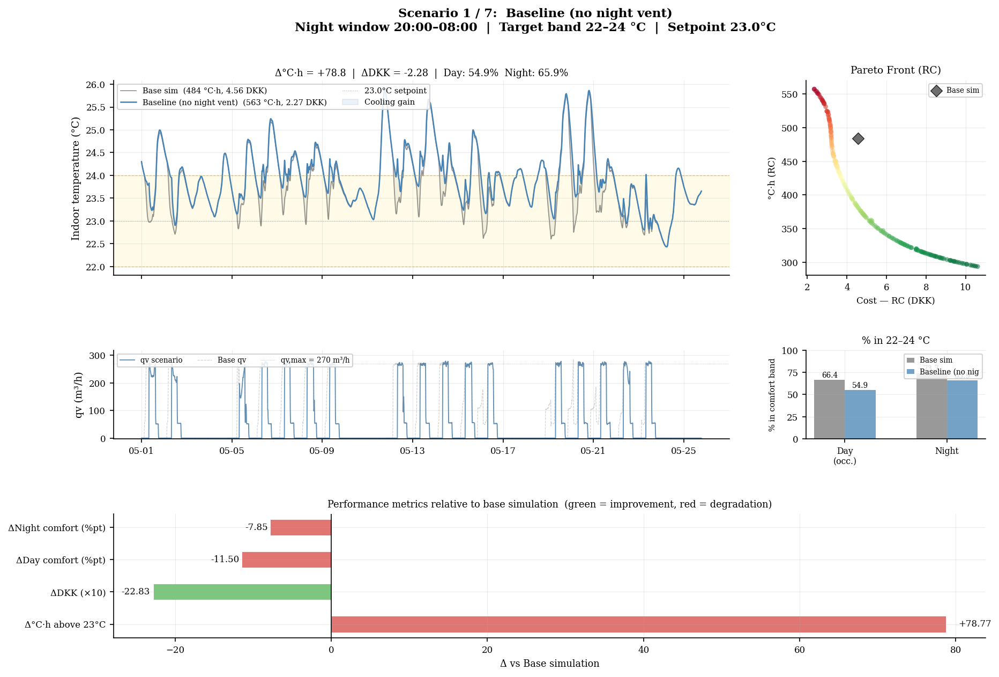

  Saved: ann_pareto_s1_baseline_no_night_vent.png


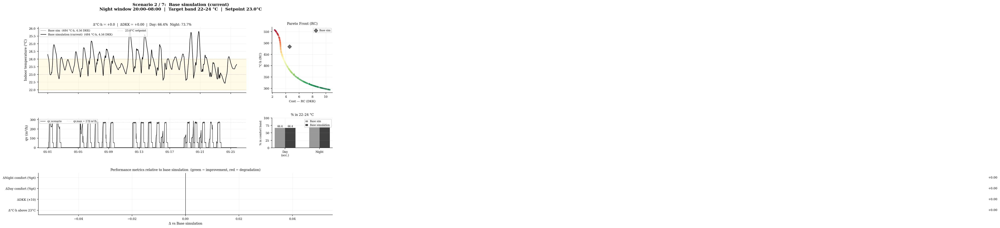

  Saved: ann_pareto_s2_base_simulation_current.png


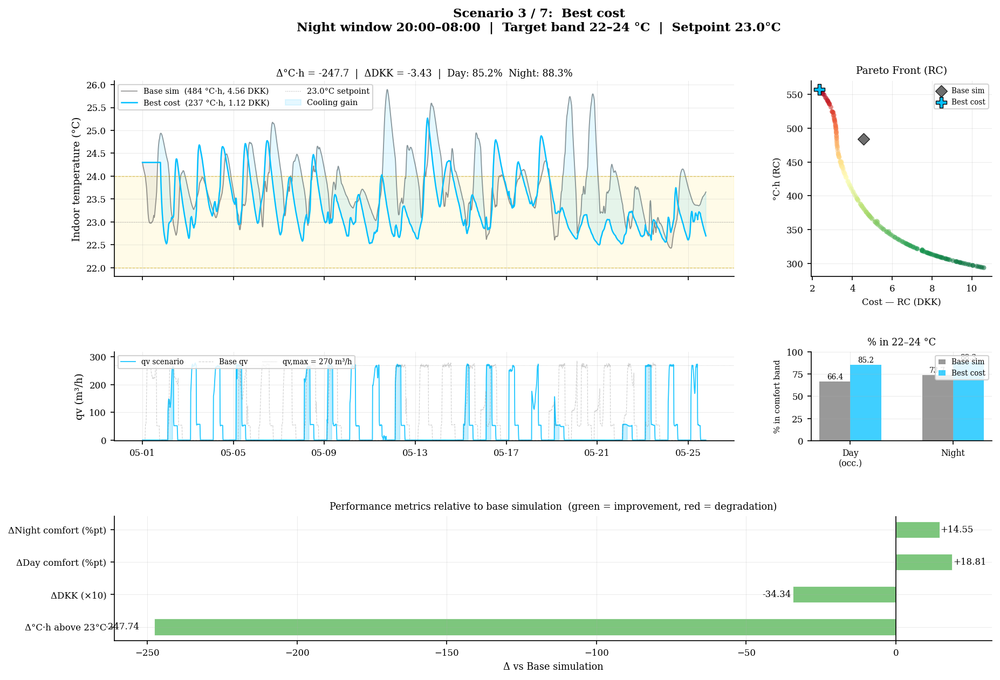

  Saved: ann_pareto_s3_best_cost.png


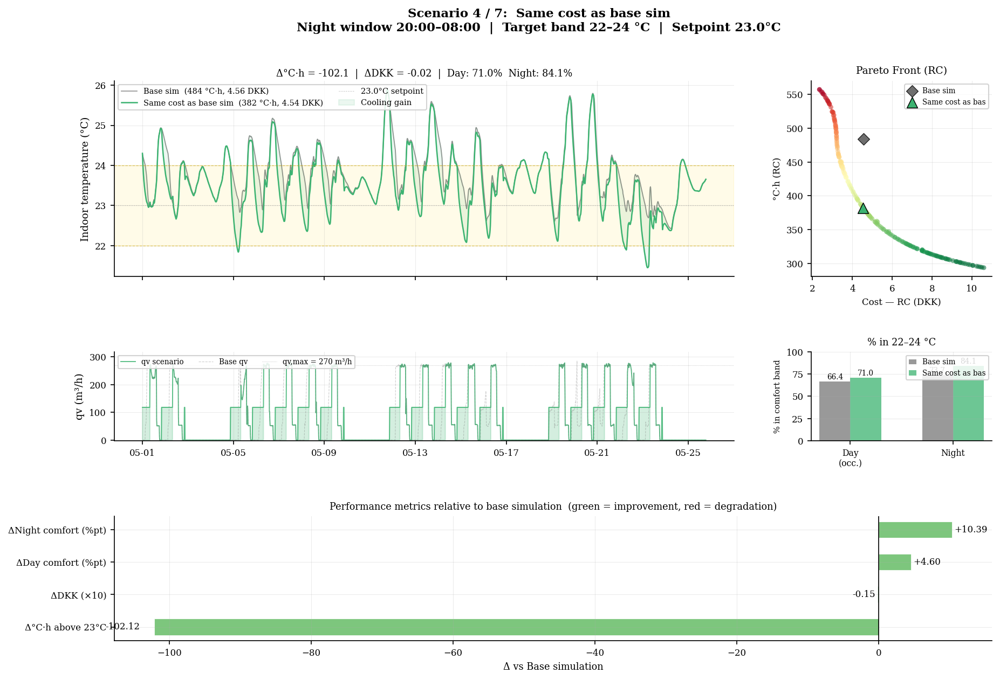

  Saved: ann_pareto_s4_same_cost_as_base_sim.png


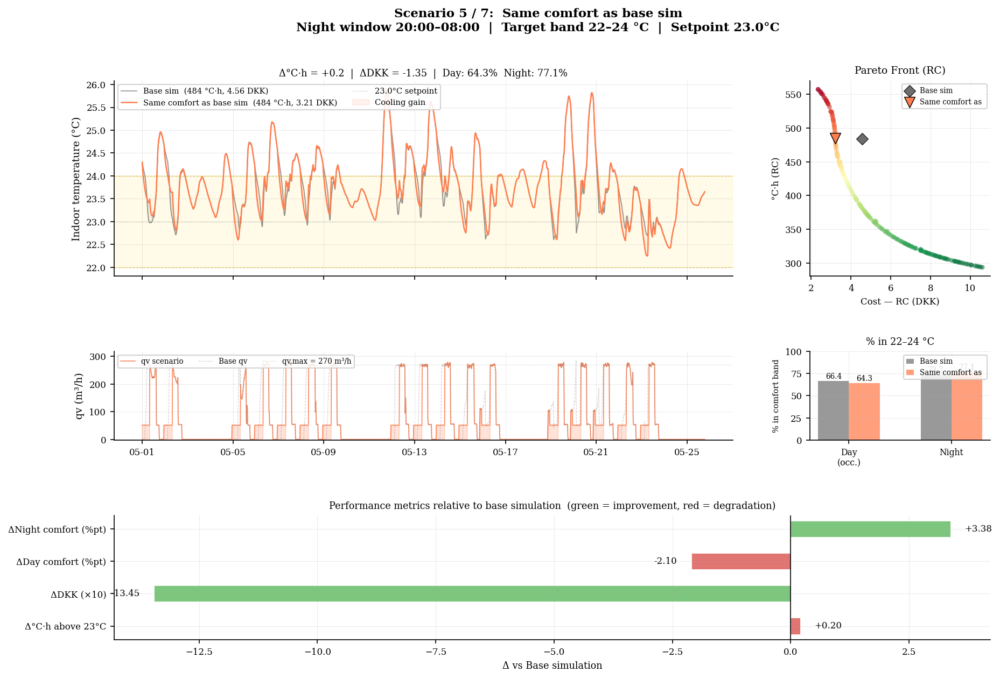

  Saved: ann_pareto_s5_same_comfort_as_base_sim.png


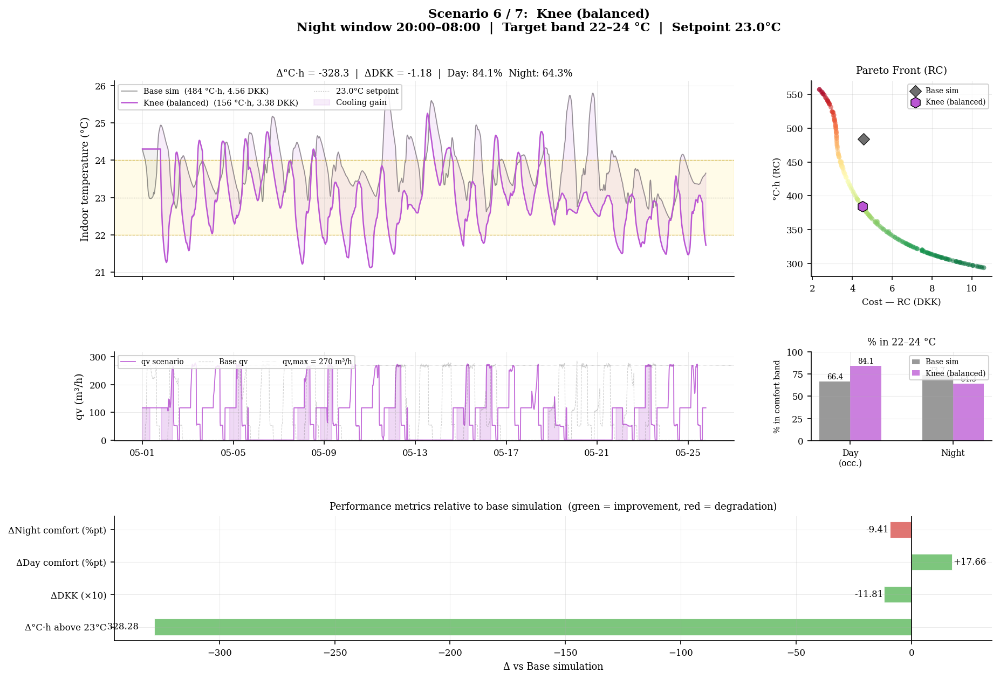

  Saved: ann_pareto_s6_knee_balanced.png


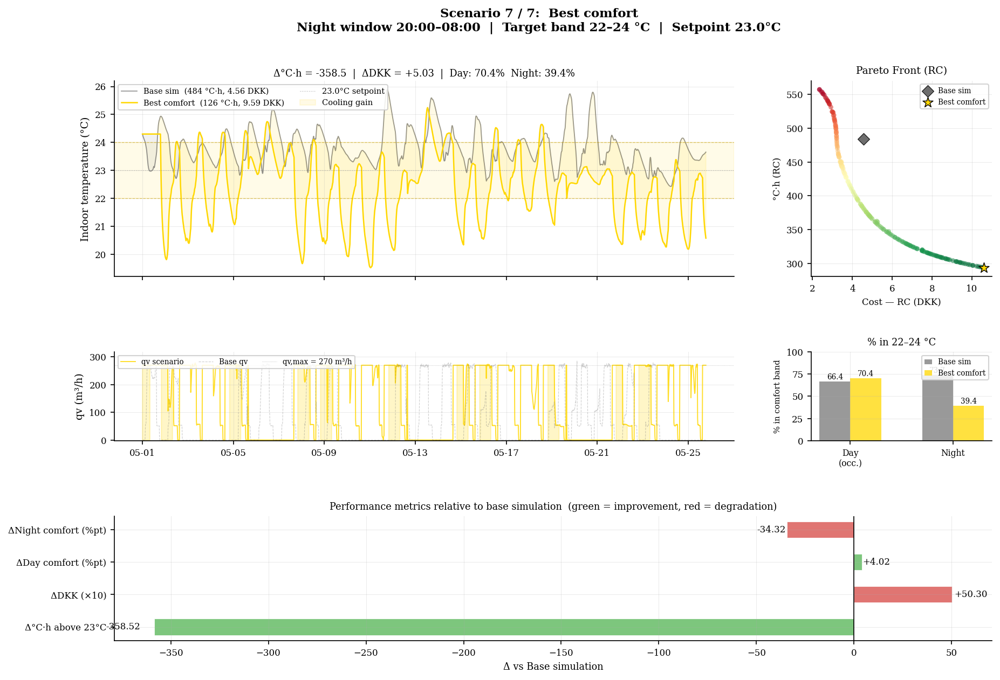

  Saved: ann_pareto_s7_best_comfort.png


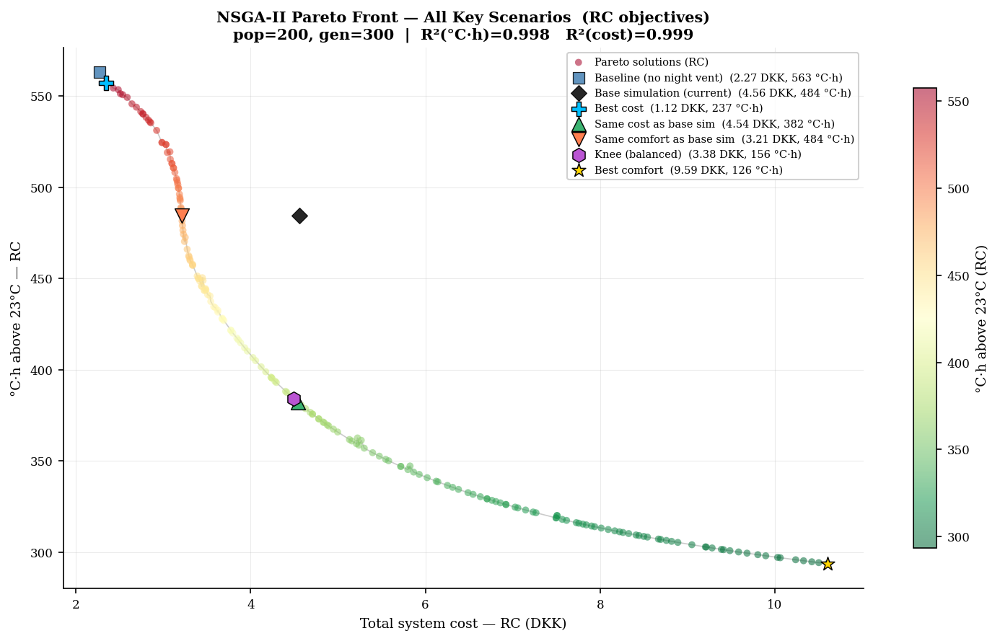

  Saved: ann_nsga2_pareto_summary.png


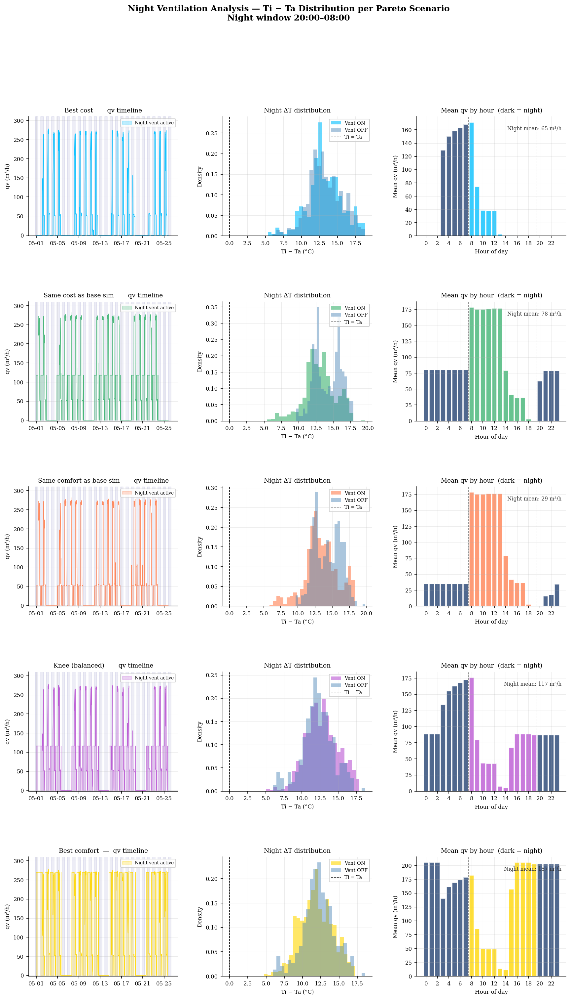

  Saved: night_vent_analysis_scenarios.png

════════════════════════════════════════════════════════════════════════════════
  Surrogate accuracy — ANN vs RC re-simulation (diagnostic)
  Label                               Δ°C·h (RC−ANN)    ΔDKK (RC−ANN)
  ─────────────────────────────────────────────────────────────────
  Best cost                                    +3.37          -0.2657
  Same cost as base sim                      +227.92          +1.0078
  Same comfort as base sim                   +282.89          +1.2586
  Knee (balanced)                              +1.25          -0.1134
  Best comfort                                 +0.37          +0.2942
════════════════════════════════════════════════════════════════════════════════

  ✓  All figures saved.


In [25]:
# ════════════════════════════════════════════════════════════════════════════
#  ANN+NSGA-II — INDIVIDUAL SCENARIO FIGURES + NIGHT VENT ANALYSIS
#
#  Corrections vs previous version:
#    1. F_pareto_rc replaces F_pareto[:,0/1] in ALL Pareto plots.
#    2. verified dict entries (Best cost / Knee / Best comfort) have Ti/qv_mod
#       padded with their first value to reach N_index = len(index).
#       (_resim() and baseline scenarios are already N_index length.)
#    3. iso_cost_idx / iso_comfort_idx located in RC objective space.
#
#  Produces:
#    ann_pareto_scenario_{i}_{label}.png  — one figure per scenario (7 total)
#    ann_nsga2_pareto_summary.png         — single Pareto front, all scenarios
#    night_vent_analysis_scenarios.png    — Ti/Ta ΔT analysis per Pareto solution
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
import re

# ── Matplotlib style ──────────────────────────────────────────────────────────
plt.rcParams.update({
    'font.family'      : 'serif',
    'font.size'        : 9,
    'axes.titlesize'   : 10,
    'axes.labelsize'   : 9,
    'xtick.labelsize'  : 8,
    'ytick.labelsize'  : 8,
    'legend.fontsize'  : 7.5,
    'legend.framealpha': 0.85,
    'axes.spines.top'  : False,
    'axes.spines.right': False,
    'axes.grid'        : True,
    'grid.alpha'       : 0.25,
    'grid.linewidth'   : 0.5,
    'lines.linewidth'  : 1.0,
    'figure.dpi'       : 150,
})

MRK     = dict(s=60,  edgecolors='black', linewidths=0.6, zorder=6)
MRK_KEY = dict(s=90,  edgecolors='black', linewidths=0.7, zorder=7)
MRK_REF = dict(s=55,  edgecolors='black', linewidths=0.6, zorder=7, alpha=0.85)

N_index = len(index)   # canonical length — all arrays must match this


# ════════════════════════════════════════════════════════════════════════════
#  UTILITY — align any array to N_index
#  Short arrays (2304) are padded at the front with their first value.
#  Long arrays are trimmed at the end.  Equal-length arrays pass through.
# ════════════════════════════════════════════════════════════════════════════
def _align(arr, n=None):
    """Return a 1-D numpy array of length n (default N_index)."""
    if n is None:
        n = N_index
    arr = np.asarray(arr, dtype=float).ravel()
    if len(arr) == n:
        return arr
    if len(arr) > n:
        return arr[-n:]          # keep the tail (drop warm-up history at front)
    # pad at the front with the first available value
    pad = np.full(n - len(arr), arr[0])
    return np.concatenate([pad, arr])


def _align_scenario(s):
    """Return a shallow copy of scenario dict with Ti and qv_mod aligned."""
    out = dict(s)
    out['Ti']     = _align(s['Ti'])
    out['qv_mod'] = _align(s['qv_mod'])
    return out


# ════════════════════════════════════════════════════════════════════════════
#  STEP 0 — Re-evaluate full Pareto set with RC model → F_pareto_rc
# ════════════════════════════════════════════════════════════════════════════
print("Re-evaluating full Pareto set with RC model …")
F_pareto_rc = np.full_like(F_pareto, np.nan)

for i, params in enumerate(X_pareto):
    try:
        qv_mod, Tsup_mod = build_X_monthly(params)
        X_mod            = X_train.copy()
        X_mod['qv']      = qv_mod
        X_mod['Tsup']    = Tsup_mod
        res  = simulate_night_vent_scenario(
            fitted_params, X_mod, N_hist,
            night_start_hour=0, night_stop_hour=0, qv_night=0,
            rec_duration=rec_duration,
            Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
        Ti_v = _align(res['Ti'])
        dh_v, _  = dh_from_target(Ti_v)
        cost_v   = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
        F_pareto_rc[i, 0] = dh_v
        F_pareto_rc[i, 1] = cost_v
    except Exception:
        F_pareto_rc[i, 0] = dh_above_ref * 2.0
        F_pareto_rc[i, 1] = cost_ref     * 2.0

# Fill any remaining NaN
_bad = ~np.isfinite(F_pareto_rc).all(axis=1)
F_pareto_rc[_bad, 0] = dh_above_ref * 2.0
F_pareto_rc[_bad, 1] = cost_ref     * 2.0

print(f"  RC Pareto — °C·h [{F_pareto_rc[:,0].min():.1f}, {F_pareto_rc[:,0].max():.1f}]  "
      f"cost [{F_pareto_rc[:,1].min():.2f}, {F_pareto_rc[:,1].max():.2f}] DKK")

_sort_pf_rc = np.argsort(F_pareto_rc[:, 1])


# ════════════════════════════════════════════════════════════════════════════
#  HELPER — resimulate one Pareto solution (output always N_index length)
# ════════════════════════════════════════════════════════════════════════════
def _resim(idx, label, color, marker):
    params           = X_pareto[idx]
    qv_mod, Tsup_mod = build_X_monthly(params)
    X_mod            = X_train.copy()
    X_mod['qv']      = qv_mod
    X_mod['Tsup']    = Tsup_mod
    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_hist,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_v      = _align(res['Ti'])
    qv_aligned = _align(qv_mod)
    dh_v, _   = dh_from_target(Ti_v)
    cost_v    = total_system_cost(qv_mod, Ta_arr, Tsup_mod)
    pct_occ_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, occ_mask)
    pct_ngt_v = pct_in_band(Ti_v, T_cat1_min, T_cat1_max, all_night_mask)
    return {
        'label'     : label,
        'params'    : params,
        'pareto_idx': idx,
        'Ti'        : Ti_v,
        'qv_mod'    : qv_aligned,
        'dh_above'  : dh_v,
        'cost'      : cost_v,
        'pct_occ'   : pct_occ_v,
        'pct_night' : pct_ngt_v,
        'color'     : color,
        'marker'    : marker,
    }


# ── iso-cost / iso-comfort found in RC objective space ────────────────────────
iso_cost_idx    = int(np.argmin(np.abs(F_pareto_rc[:, 1] - cost_ref)))
iso_comfort_idx = int(np.argmin(np.abs(F_pareto_rc[:, 0] - dh_above_ref)))

iso_cost_data    = _resim(iso_cost_idx,    'Same cost as base sim',    'mediumseagreen', '^')
iso_comfort_data = _resim(iso_comfort_idx, 'Same comfort as base sim', 'coral',          'v')


# ════════════════════════════════════════════════════════════════════════════
#  BUILD SCENARIO LIST
#  verified entries are passed through _align_scenario() to fix the 2304→2380
#  mismatch identified by the diagnostic.
# ════════════════════════════════════════════════════════════════════════════
SCENARIOS = [
    _align_scenario({
        'label'     : 'Baseline (no night vent)',
        'Ti'        : Ti_baseline,
        'qv_mod'    : qv_baseline,
        'dh_above'  : dh_above_base,
        'cost'      : cost_baseline,
        'pct_occ'   : pct_occ_base,
        'pct_night' : pct_in_band(
                          _align(Ti_baseline),
                          T_cat1_min, T_cat1_max, all_night_mask),
        'color'     : 'steelblue',
        'marker'    : 's',
        'pareto_idx': None,
        'params'    : None,
    }),
    _align_scenario({
        'label'     : 'Base simulation (current)',
        'Ti'        : Ti_ref,
        'qv_mod'    : qv_arr,
        'dh_above'  : dh_above_ref,
        'cost'      : cost_ref,
        'pct_occ'   : pct_occ_ref,
        'pct_night' : pct_night_ref,
        'color'     : 'black',
        'marker'    : 'D',
        'pareto_idx': None,
        'params'    : None,
    }),
    # verified entries — _align_scenario fixes the 2304-length Ti/qv_mod
    _align_scenario({**verified['Best cost'],
                     'label': 'Best cost',
                     'pareto_idx': best_cost_idx}),
    iso_cost_data,       # already N_index from _resim()
    iso_comfort_data,    # already N_index from _resim()
    _align_scenario({**verified['Knee (balanced)'],
                     'label': 'Knee (balanced)',
                     'pareto_idx': knee_idx}),
    _align_scenario({**verified['Best comfort'],
                     'label': 'Best comfort',
                     'pareto_idx': best_comfort_idx}),
]
_ref = SCENARIOS[1]   # Base simulation — already aligned


# ── Verification printout ─────────────────────────────────────────────────────
print(f"\nArray-length check after alignment (all must equal {N_index}):")
for s in SCENARIOS:
    ok = '✓' if len(s['Ti']) == N_index and len(s['qv_mod']) == N_index else '✗ MISMATCH'
    print(f"  {s['label']:<32}  Ti={len(s['Ti'])}  qv={len(s['qv_mod'])}  {ok}")


# ── Summary table ─────────────────────────────────────────────────────────────
print(f"\n{'═'*100}")
print(f"  ANN + NSGA-II — PARETO COMPARISON TABLE  (costs = RC total_system_cost)")
print(f"{'═'*100}")
print(f"  {'Scenario':<32} {'Start':>7} {'Stop':>6} {'qv':>5}  "
      f"{'°C·h':>8}  {'Δ°C·h':>7}  {'DKK':>7}  {'ΔDKK':>7}  {'Day%':>6}  {'Night%':>7}")
print(f"  {'-'*98}")
for s in SCENARIOS:
    p       = s.get('params')
    start_s = f"{p[0]:.1f}h" if p is not None else "—"
    stop_s  = f"{p[1]:.1f}h" if p is not None else "—"
    qv_s    = f"{p[2]:.0f}"  if p is not None else "—"
    d_dh    = s['dh_above'] - dh_above_ref
    d_cost  = s['cost']     - cost_ref
    d_dh_s  = f"{d_dh:+.1f}"   if s['label'] != 'Base simulation (current)' else "—"
    d_c_s   = f"{d_cost:+.2f}" if s['label'] != 'Base simulation (current)' else "—"
    print(f"  {s['label']:<32} {start_s:>7} {stop_s:>6} {qv_s:>5}  "
          f"{s['dh_above']:>8.1f}  {d_dh_s:>7}  {s['cost']:>7.2f}  "
          f"{d_c_s:>7}  {s['pct_occ']:>5.1f}%  {s['pct_night']:>6.1f}%")
print(f"  {'═'*100}")


# ════════════════════════════════════════════════════════════════════════════
#  INDIVIDUAL FIGURE PER SCENARIO
# ════════════════════════════════════════════════════════════════════════════
for i, s in enumerate(SCENARIOS):
    is_ref = (s['label'] == 'Base simulation (current)')
    color  = s['color']
    d_dh   = s['dh_above'] - _ref['dh_above']
    d_cost = s['cost']     - _ref['cost']

    fig = plt.figure(figsize=(14, 9))
    gs  = gridspec.GridSpec(3, 3, figure=fig,
                            height_ratios=[2.2, 1.0, 1.4],
                            width_ratios=[3.0, 1.5, 1.5],
                            hspace=0.55, wspace=0.32)

    ax_ts  = fig.add_subplot(gs[0, :2])
    ax_qv  = fig.add_subplot(gs[1, :2], sharex=ax_ts)
    ax_pf  = fig.add_subplot(gs[0,  2])
    ax_bar = fig.add_subplot(gs[1,  2])
    ax_met = fig.add_subplot(gs[2, :])

    fig.suptitle(
        f'Scenario {i+1} / {len(SCENARIOS)}:  {s["label"]}\n'
        f'Night window {NIGHT_START:02d}:00–{NIGHT_STOP:02d}:00  |  '
        f'Target band {T_cat1_min:.0f}–{T_cat1_max:.0f} °C  |  Setpoint {T_TARGET}°C',
        fontsize=11, fontweight='bold'
    )

    # ── Ti time series ────────────────────────────────────────────────────────
    ax_ts.plot(index, _ref['Ti'], color='#555555', lw=0.85, alpha=0.6,
               label=f'Base sim  ({_ref["dh_above"]:.0f} °C·h, {_ref["cost"]:.2f} DKK)')
    ax_ts.plot(index, s['Ti'], color=color, lw=1.2,
               label=f'{s["label"]}  ({s["dh_above"]:.0f} °C·h, {s["cost"]:.2f} DKK)')
    ax_ts.axhspan(T_cat1_min, T_cat1_max, alpha=0.09, color='gold', zorder=0)
    ax_ts.axhline(T_cat1_max, color='#c8a000', lw=0.6, ls='--', alpha=0.55)
    ax_ts.axhline(T_cat1_min, color='#c8a000', lw=0.6, ls='--', alpha=0.55)
    ax_ts.axhline(T_TARGET,   color='grey',    lw=0.6, ls=':',  alpha=0.6,
                  label=f'{T_TARGET}°C setpoint')
    if not is_ref:
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] > s['Ti']), alpha=0.10, color=color, label='Cooling gain')
        ax_ts.fill_between(index, _ref['Ti'], s['Ti'],
            where=(_ref['Ti'] < s['Ti']), alpha=0.07, color='#444444')
    ax_ts.set_ylabel('Indoor temperature (°C)')
    ax_ts.set_title(
        f'Δ°C·h = {d_dh:+.1f}  |  ΔDKK = {d_cost:+.2f}  |  '
        f'Day: {s["pct_occ"]:.1f}%  Night: {s["pct_night"]:.1f}%',
        fontsize=8.5, pad=4
    )
    ax_ts.legend(loc='upper left', ncol=2, fontsize=7)
    plt.setp(ax_ts.get_xticklabels(), visible=False)

    # ── qv panel ──────────────────────────────────────────────────────────────
    ax_qv.plot(index, s['qv_mod'], color=color, lw=0.9, alpha=0.85, label='qv scenario')
    if not is_ref:
        ax_qv.plot(index, _ref['qv_mod'], color='#777777', lw=0.55,
                   alpha=0.35, ls='--', label='Base qv')
    ax_qv.fill_between(index, s['qv_mod'], 0,
        where=weekday_night_mask, alpha=0.22, color=color)
    ax_qv.axhline(QV_MAX, color='#444444', lw=0.4, ls=':', alpha=0.4,
                  label=f'qv,max = {QV_MAX:.0f} m³/h')
    ax_qv.set_ylabel('qv (m³/h)')
    ax_qv.set_ylim(-3, QV_MAX * 1.18)
    ax_qv.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    ax_qv.legend(loc='upper left', ncol=3, fontsize=6.5)

    # ── Pareto front — RC objectives ──────────────────────────────────────────
    ax_pf.scatter(
        F_pareto_rc[:, 1], F_pareto_rc[:, 0],
        c=F_pareto_rc[:, 0], cmap='RdYlGn_r',
        s=18, alpha=0.55, edgecolors='none', zorder=2)
    ax_pf.plot(
        F_pareto_rc[_sort_pf_rc, 1], F_pareto_rc[_sort_pf_rc, 0],
        color='#333333', lw=0.7, alpha=0.25, zorder=1)
    ax_pf.scatter(_ref['cost'], _ref['dh_above'],
                  marker='D', color='#555555', **{**MRK_REF, 'label': 'Base sim'})
    if s.get('pareto_idx') is not None:
        idx  = s['pareto_idx']
        x_pf = F_pareto_rc[idx, 1]
        y_pf = F_pareto_rc[idx, 0]
        ax_pf.scatter(x_pf, y_pf,
                      marker=s['marker'], color=color,
                      **{**MRK_KEY, 'label': s['label'][:16]})
    ax_pf.set_xlabel('Cost — RC (DKK)', fontsize=8)
    ax_pf.set_ylabel('°C·h (RC)', fontsize=8)
    ax_pf.set_title('Pareto Front (RC)', fontsize=9)
    ax_pf.legend(fontsize=6.5, handlelength=1.2)

    # ── Comfort bar ───────────────────────────────────────────────────────────
    x, w = np.arange(2), 0.30
    b_r = ax_bar.bar(x - w/2, [_ref['pct_occ'], _ref['pct_night']], w,
                     color='#555555', alpha=0.60, label='Base sim')
    b_a = ax_bar.bar(x + w/2, [s['pct_occ'],    s['pct_night']   ], w,
                     color=color,    alpha=0.75, label=s['label'][:16])
    for b in list(b_r) + list(b_a):
        ax_bar.text(b.get_x() + b.get_width()/2, b.get_height() + 0.8,
                    f'{b.get_height():.1f}', ha='center', va='bottom', fontsize=6.5)
    ax_bar.set_xticks(x)
    ax_bar.set_xticklabels(['Day\n(occ.)', 'Night'], fontsize=7.5)
    ax_bar.set_ylim(0, 100)
    ax_bar.set_ylabel('% in comfort band', fontsize=7)
    ax_bar.legend(fontsize=6.5, loc='upper right', handlelength=1.0)
    ax_bar.set_title('% in 22–24 °C', fontsize=8.5)

    # ── Metrics bar (horizontal) ──────────────────────────────────────────────
    all_labels = ['Δ°C·h above 23°C', 'ΔDKK (×10)', 'ΔDay comfort (%pt)', 'ΔNight comfort (%pt)']
    all_vals   = [d_dh, d_cost * 10,
                  s['pct_occ']   - _ref['pct_occ'],
                  s['pct_night'] - _ref['pct_night']]
    bar_cols   = ['#d9534f' if v > 0 else '#5cb85c' for v in all_vals[:2]] + \
                 ['#5cb85c' if v > 0 else '#d9534f' for v in all_vals[2:]]
    bars_m = ax_met.barh(all_labels, all_vals, color=bar_cols, alpha=0.80,
                         edgecolor='white', linewidth=0.5, height=0.5)
    ax_met.axvline(0, color='black', lw=0.8)
    for b, v in zip(bars_m, all_vals):
        offset = max(abs(v) * 0.02, 0.3)
        ax_met.text(v + (offset if v >= 0 else -offset),
                    b.get_y() + b.get_height() / 2,
                    f'{v:+.2f}', va='center',
                    ha='left' if v >= 0 else 'right', fontsize=8)
    ax_met.set_xlabel('Δ vs Base simulation', fontsize=8.5)
    ax_met.set_title(
        'Performance metrics relative to base simulation'
        '  (green = improvement, red = degradation)',
        fontsize=8.5)

    fname = re.sub(r'[^a-z0-9]+', '_', s['label'].lower()).strip('_')
    plt.savefig(f'ann_pareto_s{i+1}_{fname}.png', dpi=150, bbox_inches='tight')
    plt.show()
    print(f"  Saved: ann_pareto_s{i+1}_{fname}.png")


# ════════════════════════════════════════════════════════════════════════════
#  PARETO SUMMARY — all scenarios annotated
# ════════════════════════════════════════════════════════════════════════════
fig_sum, ax_s = plt.subplots(figsize=(10, 6))

sc_s = ax_s.scatter(
    F_pareto_rc[:, 1], F_pareto_rc[:, 0],
    c=F_pareto_rc[:, 0], cmap='RdYlGn_r',
    s=22, alpha=0.55, edgecolors='none', zorder=2, label='Pareto solutions (RC)')
ax_s.plot(
    F_pareto_rc[_sort_pf_rc, 1], F_pareto_rc[_sort_pf_rc, 0],
    color='#333333', lw=0.8, alpha=0.25, zorder=1)
plt.colorbar(sc_s, ax=ax_s, label='°C·h above 23°C (RC)', shrink=0.85)

for s in SCENARIOS:
    if s.get('pareto_idx') is not None:
        x_m = F_pareto_rc[s['pareto_idx'], 1]
        y_m = F_pareto_rc[s['pareto_idx'], 0]
    else:
        x_m = s['cost']
        y_m = s['dh_above']
    mkw = MRK_REF if s['label'] in ('Baseline (no night vent)',
                                     'Base simulation (current)') else MRK_KEY
    ax_s.scatter(x_m, y_m,
                 marker=s['marker'], color=s['color'], **mkw,
                 label=f'{s["label"]}  ({s["cost"]:.2f} DKK, {s["dh_above"]:.0f} °C·h)')

ax_s.set_xlabel('Total system cost — RC (DKK)')
ax_s.set_ylabel('°C·h above 23°C — RC')
ax_s.set_title(
    f'NSGA-II Pareto Front — All Key Scenarios  (RC objectives)\n'
    f'pop={NSGA_POP}, gen={NSGA_GEN}  |  '
    f'R²(°C·h)={r2_dh:.3f}   R²(cost)={r2_cost:.3f}',
    fontweight='bold')
ax_s.legend(fontsize=7, loc='upper right', handlelength=1.4,
            framealpha=0.9, edgecolor='#cccccc')
plt.tight_layout()
plt.savefig('ann_nsga2_pareto_summary.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: ann_nsga2_pareto_summary.png")


# ════════════════════════════════════════════════════════════════════════════
#  NIGHT VENTILATION ANALYSIS
# ════════════════════════════════════════════════════════════════════════════
NIGHT_START_NV = NIGHT_START
NIGHT_STOP_NV  = NIGHT_STOP
hours_arr      = np.array([t.hour + t.minute / 60.0 for t in index])
night_mask_nv  = (hours_arr >= NIGHT_START_NV) | (hours_arr < NIGHT_STOP_NV)
Ta_full        = _align(np.asarray(X_train['Ta'], dtype=float))

pareto_scens = [s for s in SCENARIOS if s.get('params') is not None]
n_ps         = len(pareto_scens)

fig_nv = plt.figure(figsize=(14, 4.5 * n_ps))
gs_nv  = gridspec.GridSpec(n_ps, 3, figure=fig_nv, hspace=0.55, wspace=0.30)
fig_nv.suptitle(
    'Night Ventilation Analysis — Ti − Ta Distribution per Pareto Scenario\n'
    f'Night window {NIGHT_START_NV:02d}:00–{NIGHT_STOP_NV:02d}:00',
    fontsize=12, fontweight='bold'
)

for row, s in enumerate(pareto_scens):
    Ti_s   = s['Ti']      # already aligned
    qv_s   = s['qv_mod']  # already aligned
    dT_all = Ti_s - Ta_full
    dT_ngt = dT_all[night_mask_nv]
    qv_ngt = qv_s[night_mask_nv]

    vent_on_ngt  = qv_ngt > 1.0
    vent_off_ngt = ~vent_on_ngt

    ax_tl = fig_nv.add_subplot(gs_nv[row, 0])
    ax_tl.plot(index, qv_s, color=s['color'], lw=0.75, alpha=0.9)
    ax_tl.fill_between(index, qv_s, 0,
        where=night_mask_nv & (qv_s > 1.0), alpha=0.25, color=s['color'],
        label='Night vent active')
    day_start_nv = index[0].normalize()
    for d in range((index[-1] - index[0]).days + 2):
        ns = day_start_nv + pd.Timedelta(hours=NIGHT_START_NV + d * 24 - 24)
        ne = day_start_nv + pd.Timedelta(hours=NIGHT_STOP_NV  + d * 24)
        ax_tl.axvspan(ns, ne, alpha=0.07, color='navy', zorder=0)
    ax_tl.set_ylabel('qv (m³/h)', fontsize=8)
    ax_tl.set_ylim(-2, QV_MAX * 1.15)
    ax_tl.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
    ax_tl.set_title(f'{s["label"]}  —  qv timeline', fontsize=9)
    ax_tl.legend(fontsize=6.5)

    ax_ht = fig_nv.add_subplot(gs_nv[row, 1])
    if vent_on_ngt.sum() > 0:
        ax_ht.hist(dT_ngt[vent_on_ngt],  bins=25, color=s['color'],
                   alpha=0.60, density=True, label='Vent ON')
    ax_ht.hist(dT_ngt[vent_off_ngt], bins=25, color='steelblue',
               alpha=0.45, density=True, label='Vent OFF')
    ax_ht.axvline(0, color='black', lw=0.8, ls='--', label='Ti = Ta')
    ax_ht.set_xlabel('Ti − Ta (°C)', fontsize=8)
    ax_ht.set_ylabel('Density', fontsize=8)
    ax_ht.set_title('Night ΔT distribution', fontsize=9)
    ax_ht.legend(fontsize=7)

    ax_hr = fig_nv.add_subplot(gs_nv[row, 2])
    hour_int = np.array([t.hour for t in index])
    qv_by_hr = np.array([qv_s[hour_int == h].mean() for h in range(24)])
    bar_cols  = ['#1f3d6e' if (h >= NIGHT_START_NV or h < NIGHT_STOP_NV)
                 else s['color'] for h in range(24)]
    ax_hr.bar(range(24), qv_by_hr, color=bar_cols, alpha=0.78,
              edgecolor='white', width=0.85)
    ax_hr.axvline(NIGHT_START_NV - 0.5, color='black', lw=0.8, ls='--', alpha=0.5)
    ax_hr.axvline(NIGHT_STOP_NV  - 0.5, color='black', lw=0.8, ls='--', alpha=0.5)
    ax_hr.set_xlabel('Hour of day', fontsize=8)
    ax_hr.set_ylabel('Mean qv (m³/h)', fontsize=8)
    ax_hr.set_xticks(range(0, 24, 2))
    ax_hr.set_title('Mean qv by hour  (dark = night)', fontsize=9)
    qv_night_mean = qv_s[night_mask_nv].mean()
    ax_hr.text(0.97, 0.92, f'Night mean: {qv_night_mean:.0f} m³/h',
               transform=ax_hr.transAxes, ha='right', va='top',
               fontsize=7.5, color='#333333')

plt.savefig('night_vent_analysis_scenarios.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: night_vent_analysis_scenarios.png")


# ════════════════════════════════════════════════════════════════════════════
#  SURROGATE ACCURACY PRINTOUT
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*80}")
print(f"  Surrogate accuracy — ANN vs RC re-simulation (diagnostic)")
print(f"  {'Label':<32}  {'Δ°C·h (RC−ANN)':>16}  {'ΔDKK (RC−ANN)':>15}")
print(f"  {'─'*65}")
for s in [_s for _s in SCENARIOS if _s.get('pareto_idx') is not None]:
    idx        = s['pareto_idx']
    delta_dh   = s['dh_above'] - F_pareto[idx, 0]
    delta_cost = s['cost']     - F_pareto[idx, 1]
    print(f"  {s['label']:<32}  {delta_dh:>+16.2f}  {delta_cost:>+15.4f}")
print(f"{'═'*80}")
print("\n  ✓  All figures saved.")

# Rolling MPC

In [26]:
# ════════════════════════════════════════════════════════════════════════════
#  CELL 1 — MPC hyper-parameters + April context prepend
#
#  Run ORDER: this cell FIRST, then the Rolling MPC cell.
#  MPC constants are defined here so the prepend window calculation
#  (n_prepend = MPC_LOOKBACK_DAYS × 24 / dt_h) resolves correctly.
# ════════════════════════════════════════════════════════════════════════════

import pickle
import numpy as np
import pandas as pd


# ── MPC hyper-parameters (must live here so n_prepend can be computed) ────────
MPC_LOOKBACK_DAYS = 14
MPC_HORIZON_DAYS  = 7
MPC_POP           = 60
MPC_GEN           = 80
MPC_SEED          = 42

MPC_LB = np.array([20.0,  0.0,  0.0   ])
MPC_UB = np.array([23.9,  8.0,  QV_MAX])


# ── Load April results ────────────────────────────────────────────────────────
RESULTS_FILE_APR = "simulation_results_mcmc_2025_04.pkl"

with open(RESULTS_FILE_APR, "rb") as f:
    saved_apr = pickle.load(f)

df_apr        = saved_apr["df"]
X_apr         = saved_apr["X_train"]
train_res_apr = saved_apr["train_results"]

# Infer simulated Ti for April
if hasattr(train_res_apr, 'Z'):
    Ti_apr_full = np.asarray(train_res_apr.Z, dtype=float)
elif isinstance(train_res_apr, dict) and 'Ti' in train_res_apr:
    Ti_apr_full = np.asarray(train_res_apr['Ti'], dtype=float)
else:
    Ti_apr_full = np.asarray(X_apr['Ti'], dtype=float)

print(f"April data loaded:  {X_apr.index[0].date()}  →  {X_apr.index[-1].date()}"
      f"  ({len(X_apr)} steps)")


# ── Take last MPC_LOOKBACK_DAYS days of April ─────────────────────────────────
dt_h_apr  = (X_apr.index[1] - X_apr.index[0]).total_seconds() / 3600.0
n_prepend = int(MPC_LOOKBACK_DAYS * 24 / dt_h_apr)

X_pre  = X_apr.iloc[-n_prepend:]
Ti_pre = Ti_apr_full[-n_prepend:]

print(f"Prepend window:     {X_pre.index[0].date()}  →  {X_pre.index[-1].date()}"
      f"  ({len(X_pre)} steps = {MPC_LOOKBACK_DAYS} days)")


# ── Verify column alignment with May X_train ──────────────────────────────────
missing_cols = set(X_train.columns) - set(X_pre.columns)
extra_cols   = set(X_pre.columns)   - set(X_train.columns)
if missing_cols:
    print(f"  ⚠ Columns in May but NOT in April: {missing_cols} — filling with 0")
    for c in missing_cols:
        X_pre = X_pre.copy()
        X_pre[c] = 0.0
if extra_cols:
    print(f"  ℹ Columns in April but NOT in May (dropped): {extra_cols}")
    X_pre = X_pre[X_train.columns]


# ── Build extended arrays (April tail + full May) ─────────────────────────────
X_train_ext = pd.concat([X_pre, X_train])
index_ext   = X_train_ext.index

qv_arr_pre  = np.asarray(X_pre['qv'], dtype=float)
qv_arr_ext  = np.concatenate([qv_arr_pre, qv_arr])

Ti_ref_ext  = np.concatenate([Ti_pre, Ti_ref])

if 'N' in X_pre.columns:
    N_hist_pre = np.asarray(X_pre['N'], dtype=float)
else:
    N_hist_pre = np.zeros(len(X_pre))
N_hist_ext = np.concatenate([N_hist_pre, np.asarray(N_hist, dtype=float)])


# ── Extend patched globals ────────────────────────────────────────────────────
def _extend_global(name, pre_arr):
    gb = globals()
    if name in gb and hasattr(gb[name], '__len__'):
        gb[name + '_ext'] = np.concatenate(
            [np.asarray(pre_arr,  dtype=float),
             np.asarray(gb[name], dtype=float)])
    else:
        gb[name + '_ext'] = np.asarray(pre_arr, dtype=float)


def _make_night_mask(idx, start_h=NIGHT_START, stop_h=NIGHT_STOP):
    h = np.array([t.hour + t.minute / 60.0 for t in idx])
    return (h >= start_h) | (h < stop_h)


nighttime_mask_pre_arr = _make_night_mask(X_pre.index)
_extend_global('nighttime_mask', nighttime_mask_pre_arr)

if 'cop_arr' in globals() and hasattr(cop_arr, '__len__'):
    cop_fill = np.full(len(X_pre), float(np.nanmean(cop_arr)))
    _extend_global('cop_arr', cop_fill)

if 'price_series' in globals() and hasattr(price_series, '__len__'):
    price_fill = np.tile(
        np.asarray(price_series, dtype=float),
        int(np.ceil(len(X_pre) / len(price_series))) + 1
    )[:len(X_pre)]
    _extend_global('price_series', price_fill)

# occ_mask and all_night_mask recomputed from extended index
if 'occ_mask' in globals() and hasattr(occ_mask, '__len__'):
    from_hour = 7;  to_hour = 18
    h_ext = np.array([t.hour + t.minute / 60.0 for t in index_ext])
    occ_mask_ext       = (h_ext >= from_hour) & (h_ext < to_hour)
    all_night_mask_ext = _make_night_mask(index_ext)
else:
    occ_mask_ext       = None
    all_night_mask_ext = None


# ── Summary ───────────────────────────────────────────────────────────────────
print(f"\nExtended dataset:   {index_ext[0].date()}  →  {index_ext[-1].date()}"
      f"  ({len(index_ext)} steps)")
print(f"  • n_prepend       = {n_prepend} steps  ({MPC_LOOKBACK_DAYS} days of April)")
print(f"  • May analysis    = {len(X_train)} steps"
      f"  ({len(X_train) * dt_h_apr / 24:.0f} days)")
print(f"  • MPC will cover  : {index_ext[n_prepend].date()}  →  {index_ext[-1].date()}"
      f"  (all {len(X_train) * dt_h_apr / 24:.0f} days fully optimised)")


# ── Dependency check — confirm second cell has everything it needs ────────────
_required = ['X_train_ext', 'index_ext', 'Ti_ref_ext', 'qv_arr_ext',
             'N_hist_ext', 'occ_mask_ext', 'all_night_mask_ext',
             'n_prepend', 'MPC_LOOKBACK_DAYS', 'MPC_HORIZON_DAYS',
             'MPC_POP', 'MPC_GEN', 'MPC_SEED', 'MPC_LB', 'MPC_UB']
_missing = [v for v in _required if v not in globals()]
if _missing:
    print(f"\n  ✗  Missing variables — do NOT run cell 2 yet: {_missing}")
else:
    print(f"\n  ✓  All {len(_required)} dependencies ready — run the Rolling MPC cell next.")

April data loaded:  2025-04-01  →  2025-04-24  (2304 steps)
Prepend window:     2025-04-11  →  2025-04-24  (1344 steps = 14 days)

Extended dataset:   2025-04-11  →  2025-05-25  (3724 steps)
  • n_prepend       = 1344 steps  (14 days of April)
  • May analysis    = 2380 steps  (25 days)
  • MPC will cover  : 2025-05-01  →  2025-05-25  (all 25 days fully optimised)

  ✓  All 15 dependencies ready — run the Rolling MPC cell next.


In [27]:
# ════════════════════════════════════════════════════════════════════════════
#  MPC CONTEXT PREPEND — Load last 14 days of April from april .pkl
#  and extend all companion arrays so the rolling MPC's lookback window
#  is fully consumed by prior-month data, leaving May 1–25 fully optimised.
# ════════════════════════════════════════════════════════════════════════════

import pickle
import numpy as np
import pandas as pd

RESULTS_FILE_APR = "simulation_results_mcmc_2025_04.pkl"

with open(RESULTS_FILE_APR, "rb") as f:
    saved_apr = pickle.load(f)

df_apr       = saved_apr["df"]
X_apr        = saved_apr["X_train"]        # full April X_train
train_res_apr = saved_apr["train_results"]

# ── Infer the simulated Ti for April from train_results ──────────────────────
# Adjust the key name below if your pkl uses a different field
if hasattr(train_res_apr, 'Z'):
    Ti_apr_full = np.asarray(train_res_apr.Z, dtype=float)
elif isinstance(train_res_apr, dict) and 'Ti' in train_res_apr:
    Ti_apr_full = np.asarray(train_res_apr['Ti'], dtype=float)
else:
    # Fallback: use measured Ti column if available
    Ti_apr_full = np.asarray(X_apr['Ti'], dtype=float)

print(f"April data loaded:  {X_apr.index[0].date()}  →  {X_apr.index[-1].date()}"
      f"  ({len(X_apr)} steps)")

# ── Take only the last 14 days of April ──────────────────────────────────────
dt_h_apr   = (X_apr.index[1] - X_apr.index[0]).total_seconds() / 3600.0
n_prepend  = int(MPC_LOOKBACK_DAYS * 24 / dt_h_apr)   # 14 days in timesteps

X_pre      = X_apr.iloc[-n_prepend:]
Ti_pre     = Ti_apr_full[-n_prepend:]

print(f"Prepend window:     {X_pre.index[0].date()}  →  {X_pre.index[-1].date()}"
      f"  ({len(X_pre)} steps = {MPC_LOOKBACK_DAYS} days)")

# ── Verify column alignment with May X_train ─────────────────────────────────
missing_cols = set(X_train.columns) - set(X_pre.columns)
extra_cols   = set(X_pre.columns)   - set(X_train.columns)
if missing_cols:
    print(f"  ⚠ Columns in May but NOT in April: {missing_cols} — will fill with 0")
    for c in missing_cols:
        X_pre[c] = 0.0
if extra_cols:
    print(f"  ℹ Columns in April but NOT in May (dropped): {extra_cols}")
    X_pre = X_pre[X_train.columns]

# ── Build extended arrays (April tail + full May) ────────────────────────────
X_train_ext   = pd.concat([X_pre, X_train])
index_ext     = X_train_ext.index

# qv_arr: use the April base qv from X_pre directly
qv_arr_pre    = np.asarray(X_pre['qv'], dtype=float)
qv_arr_ext    = np.concatenate([qv_arr_pre, qv_arr])

# Ti_ref: stitch April simulated Ti + May Ti_ref
Ti_ref_ext    = np.concatenate([Ti_pre, Ti_ref])

# N_hist: occupancy profile — derive from hours if not stored separately
if 'N' in X_pre.columns:
    N_hist_pre = np.asarray(X_pre['N'], dtype=float)
else:
    N_hist_pre = np.zeros(len(X_pre))
N_hist_ext    = np.concatenate([N_hist_pre, np.asarray(N_hist, dtype=float)])

# ── Extend globals patched by _mpc_cost ──────────────────────────────────────
def _extend_global(name, pre_arr):
    """Concatenate pre_arr with current global array `name`."""
    gb = globals()
    if name in gb and hasattr(gb[name], '__len__'):
        gb[name + '_ext'] = np.concatenate(
            [np.asarray(pre_arr, dtype=float),
             np.asarray(gb[name],  dtype=float)])
    else:
        gb[name + '_ext'] = np.asarray(pre_arr, dtype=float)

# nighttime_mask — recompute from DatetimeIndex
def _make_night_mask(idx, start_h=NIGHT_START, stop_h=NIGHT_STOP):
    h = np.array([t.hour + t.minute / 60.0 for t in idx])
    return (h >= start_h) | (h < stop_h)

nighttime_mask_pre_arr = _make_night_mask(X_pre.index)
_extend_global('nighttime_mask', nighttime_mask_pre_arr)

# cop_arr — repeat the May mean COP as constant over prepend period
if 'cop_arr' in globals() and hasattr(cop_arr, '__len__'):
    cop_fill = np.full(len(X_pre), float(np.nanmean(cop_arr)))
    _extend_global('cop_arr', cop_fill)

# price_series — repeat pattern (tile first len(X_pre) values of May prices)
if 'price_series' in globals() and hasattr(price_series, '__len__'):
    price_fill = np.tile(
        np.asarray(price_series, dtype=float),
        int(np.ceil(len(X_pre) / len(price_series))) + 1
    )[:len(X_pre)]
    _extend_global('price_series', price_fill)

# occ_mask and all_night_mask — recompute from extended index
if 'occ_mask' in globals() and hasattr(occ_mask, '__len__'):
    from_hour = 7;  to_hour = 18   # adjust to your occupancy definition
    h_ext = np.array([t.hour + t.minute / 60.0 for t in index_ext])
    occ_mask_ext       = (h_ext >= from_hour) & (h_ext < to_hour)
    all_night_mask_ext = _make_night_mask(index_ext)
else:
    occ_mask_ext       = None
    all_night_mask_ext = None

print(f"\nExtended dataset:   {index_ext[0].date()}  →  {index_ext[-1].date()}"
      f"  ({len(index_ext)} steps)")
print(f"  • n_prepend       = {n_prepend}  steps  ({MPC_LOOKBACK_DAYS} days of April)")
print(f"  • May analysis    = {len(X_train)} steps  (days 1–{len(X_train)*dt_h_apr/24:.0f})")
print(f"  • MPC will cover  : {index_ext[n_prepend].date()}  →  {index_ext[-1].date()}"
      f"  (all {len(X_train)*dt_h_apr/24:.0f} days fully optimised)")

April data loaded:  2025-04-01  →  2025-04-24  (2304 steps)
Prepend window:     2025-04-11  →  2025-04-24  (1344 steps = 14 days)

Extended dataset:   2025-04-11  →  2025-05-25  (3724 steps)
  • n_prepend       = 1344  steps  (14 days of April)
  • May analysis    = 2380 steps  (days 1–25)
  • MPC will cover  : 2025-05-01  →  2025-05-25  (all 25 days fully optimised)


  ROLLING MPC — weekly NSGA-II night-vent optimisation
  Lookback: last 14 days of April  |  Horizon: 7 days  |  Full May coverage
  Speed: pop=40, gen=80, parallel workers=all cores
  Week  1/4  [2025-05-01 → 2025-05-07]  (672 steps)  Ti_init=22.68°C  → knee: start=20.2h  stop=8.0h  qv=121  dh=82.4  cost=1.58  [207s]
  Week  2/4  [2025-05-08 → 2025-05-14]  (672 steps)  Ti_init=23.15°C  → knee: start=20.0h  stop=7.9h  qv=124  dh=111.1  cost=2.01  [113s]
  Week  3/4  [2025-05-15 → 2025-05-21]  (672 steps)  Ti_init=22.79°C  → knee: start=20.2h  stop=8.0h  qv=121  dh=107.8  cost=1.46  [96s]
  Week  4/4  [2025-05-22 → 2025-05-25]  (364 steps)  Ti_init=22.78°C  → knee: start=20.1h  stop=8.0h  qv=108  dh=12.7  cost=0.53  [84s]

  Trimmed to analysis window: 2025-05-01 → 2025-05-25
  Active optimised weeks: 4
  Total wall time: 501s

──────────────────────────────────────────────────────────────────────
  Rolling MPC — full-period aggregate (May 1–25)
  [Cost: night-modified Tsup + patched gl

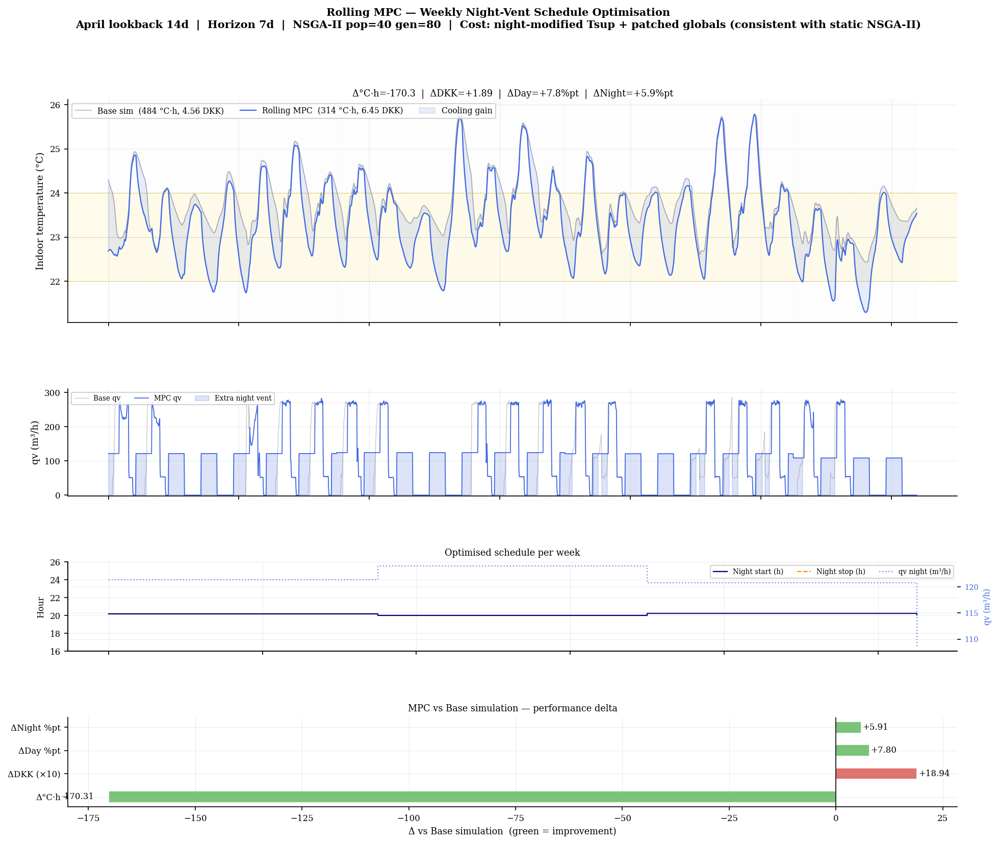

  Saved: rolling_mpc_overview.png


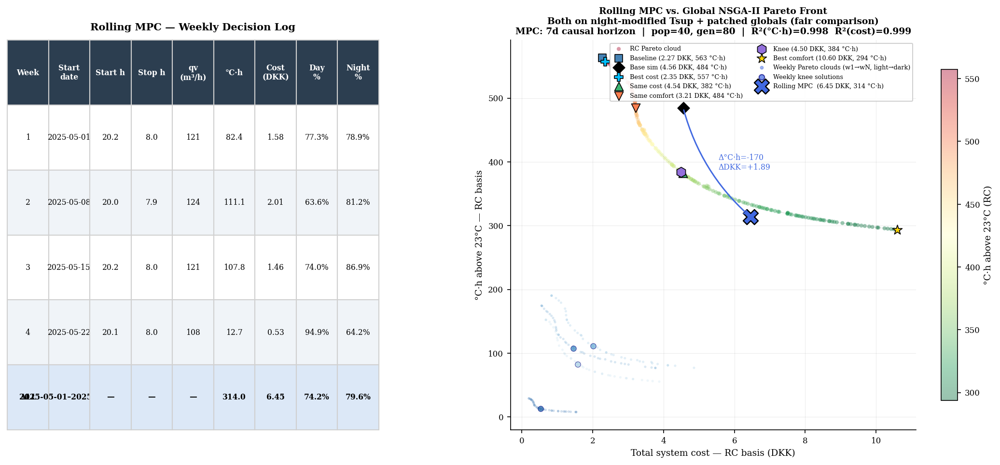

  Saved: rolling_mpc_decisions.png


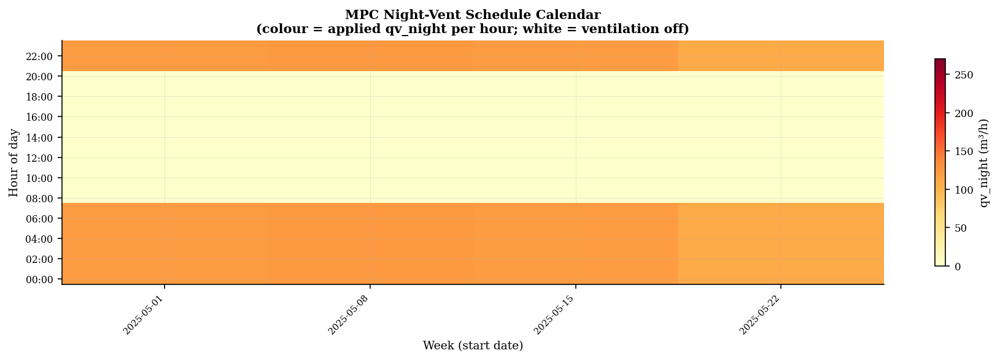

  Saved: rolling_mpc_calendar.png


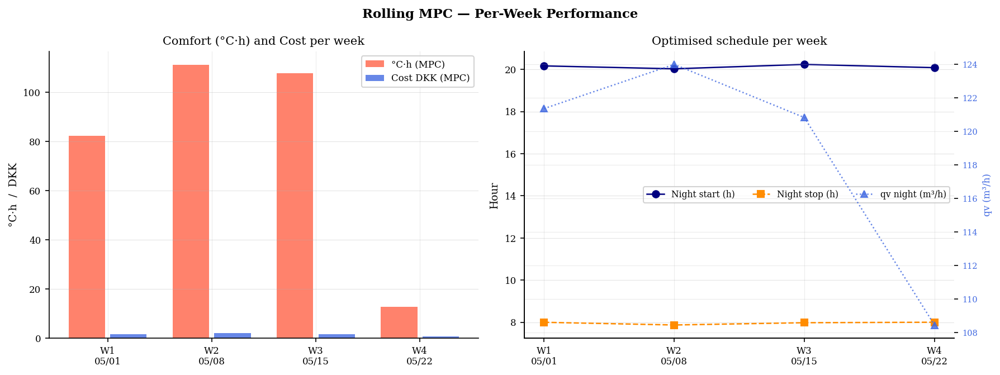

  Saved: rolling_mpc_weekly_breakdown.png

════════════════════════════════════════════════════════════════════════════════
  MPC aggregate vs. key NSGA-II scenarios  (RC objectives, fair Tsup basis)
════════════════════════════════════════════════════════════════════════════════
  Label                              °C·h    Δ°C·h      DKK     ΔDKK
  ──────────────────────────────────────────────────────────
  Baseline (no night vent)          563.1    +78.8     2.27    -2.28
  Base simulation                   484.3        —     4.56        —
  Best cost                         236.6   -247.7     1.12    -3.43
  Same cost as base sim             382.2   -102.1     4.54    -0.02
  Same comfort as base sim          484.5     +0.2     3.21    -1.35
  Knee (balanced)                   156.0   -328.3     3.38    -1.18
  Best comfort                      125.8   -358.5     9.59    +5.03
  Rolling MPC (aggregate)           314.0   -170.3     6.45    +1.89  ◀ MPC
══════════════════════════════

In [31]:
# ════════════════════════════════════════════════════════════════════════════
#  ROLLING MPC — Weekly night-vent schedule optimisation
#  SPEED-UPS APPLIED (on top of previous fixes):
#    S1. MPC_POP=40, MPC_GEN=80  (was 100/150) — ~4× fewer evaluations
#    S2. _build_week_arrays vectorised — no Python loop over timesteps
#    S3. _evaluate parallelised via joblib (n_jobs=-1) — uses all CPU cores
#        Note: _patched_cost globals-patching is NOT thread-safe, so cost
#        is computed with pre-sliced arrays passed directly — no globals.
#  FIX: idx_week (DatetimeIndex) now passed to workers so X_mod has a
#       proper DatetimeIndex — prevents AttributeError: 'int' has no .hour
# ════════════════════════════════════════════════════════════════════════════


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
from joblib import Parallel, delayed
from pymoo.core.problem import Problem
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.optimize import minimize as pymoo_minimize
from pymoo.termination import get_termination



_COST_GLOBALS = ['price_series', 'nighttime_mask', 'cop_arr']


# ── S1: Reduced pop/gen ───────────────────────────────────────────────────────
MPC_POP = 40    # was 100  — sufficient for 3-variable problem
MPC_GEN = 80    # was 150



# ════════════════════════════════════════════════════════════════════════════
#  HELPERS
# ════════════════════════════════════════════════════════════════════════════


def _build_week_arrays(idx_week, X_week_base, start_h, stop_h, qv_night):
    """
    S2: Fully vectorised — no Python loop.
    Build night-modified qv and Tsup for one weekly slice.
    During night-vent hours: qv = qv_night, Tsup = Ta (free-cooling).
    """
    hours  = np.array([t.hour + t.minute / 60.0 for t in idx_week])
    # Night mask: hours >= start_h OR hours < stop_h
    if start_h <= stop_h:
        # e.g. 22h–06h wraps midnight — handle both wrap and non-wrap
        mask = (hours >= start_h) | (hours < stop_h)
    else:
        mask = (hours >= start_h) | (hours < stop_h)


    qv_w   = np.asarray(X_week_base['qv'],   dtype=float).copy()
    Tsup_w = np.asarray(X_week_base['Tsup'], dtype=float).copy()
    Ta_w   = np.asarray(X_week_base['Ta'],   dtype=float)


    qv_w  [mask] = qv_night
    Tsup_w[mask] = Ta_w[mask]   # free-cooling: supply = outdoor air


    return qv_w, Tsup_w



def _patched_cost(qv_w, Ta_w, Tsup_w, ws, we):
    """Patched globals cost — used only in single-threaded contexts."""
    gb    = globals()
    saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]
                    gb[name]    = arr[ws:we]
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)['total']
    finally:
        for name, orig in saved.items():
            gb[name] = orig
    return result



def _patched_breakdown(qv_w, Ta_w, Tsup_w, ws, we):
    """Same as _patched_cost but returns the full breakdown dict."""
    gb    = globals()
    saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]
                    gb[name]    = arr[ws:we]
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)
    finally:
        for name, orig in saved.items():
            gb[name] = orig
    return result



def _cost_with_slices(qv_w, Ta_w, Tsup_w,
                      price_slice, nighttime_slice, cop_slice):
    """
    S3 thread-safe cost: receives pre-sliced arrays directly instead of
    patching globals — safe to call from joblib worker processes.
    """
    gb    = globals()
    saved = {}
    patch = {'price_series'  : price_slice,
             'nighttime_mask': nighttime_slice,
             'cop_arr'       : cop_slice}
    try:
        for name, sliced in patch.items():
            if name in gb and sliced is not None:
                saved[name] = gb[name]
                gb[name]    = sliced
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)['total']
    finally:
        for name, orig in saved.items():
            gb[name] = orig
    return result



def _knee_point(F):
    """Normalised Euclidean distance knee in objective space."""
    f_min = F.min(axis=0)
    f_max = F.max(axis=0)
    rng   = np.where(f_max - f_min > 1e-12, f_max - f_min, 1.0)
    F_n   = (F - f_min) / rng
    return int(np.argmin(np.linalg.norm(F_n, axis=1)))



# ── S3: Single-candidate evaluator (joblib-safe, no shared state) ─────────────
def _eval_candidate(xi,
                    idx_hours,        # precomputed float hours array
                    qv_base, Tsup_base, Ta_w,
                    X_week_cols,      # dict of other columns needed by simulate
                    idx_week_ns,      # int64 nanosecond timestamps — always picklable
                    N_profile_w,
                    Ti_init, Tm_init, c_init,
                    price_slice, nighttime_slice, cop_slice):
    start_h = float(xi[0])
    stop_h  = float(xi[1])
    qv_n    = float(xi[2])


    # Vectorised night mask
    mask   = (idx_hours >= start_h) | (idx_hours < stop_h)
    qv_w   = qv_base.copy();   qv_w  [mask] = qv_n
    Tsup_w = Tsup_base.copy(); Tsup_w[mask] = Ta_w[mask]


    # Reconstruct DatetimeIndex from int64 nanoseconds and rebuild X_mod
    # This restores the proper DatetimeIndex so simulate_night_vent_scenario
    # can call t.hour / t.minute without AttributeError on integer indices.
    idx_week = pd.DatetimeIndex(idx_week_ns)
    X_mod = pd.DataFrame(X_week_cols, index=idx_week)
    X_mod['qv']   = qv_w
    X_mod['Tsup'] = Tsup_w


    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_profile_w,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)


    Ti_w    = np.asarray(res['Ti'])
    dh_w, _ = dh_from_target(Ti_w)
    cost_w  = _cost_with_slices(qv_w, Ta_w, Tsup_w,
                                 price_slice, nighttime_slice, cop_slice)
    return dh_w, cost_w



# ════════════════════════════════════════════════════════════════════════════
#  PYMOO PROBLEM — one week  (S3: parallelised _evaluate)
# ════════════════════════════════════════════════════════════════════════════


class NightVentWeekProblem(Problem):
    def __init__(self, idx_week, X_week_base,
                 Ti_init_w, Tm_init_w, c_init_w,
                 N_profile_w, ws, we, n_jobs=-1):
        super().__init__(n_var=3, n_obj=2, n_ieq_constr=0,
                         xl=MPC_LB, xu=MPC_UB)
        gb = globals()


        # Pre-extract everything needed by workers — avoids pickling the
        # full DataFrame and all globals on every call
        self.idx_hours   = np.array([t.hour + t.minute / 60.0
                                     for t in idx_week])
        self.qv_base     = np.asarray(X_week_base['qv'],   dtype=float)
        self.Tsup_base   = np.asarray(X_week_base['Tsup'], dtype=float)
        self.Ta_w        = np.asarray(X_week_base['Ta'],   dtype=float)


        # All columns except qv/Tsup (workers rebuild X_mod from these)
        self.X_week_cols = {c: np.asarray(X_week_base[c])
                            for c in X_week_base.columns
                            if c not in ('qv', 'Tsup')}

        # FIX: store index as int64 nanoseconds — always safely picklable
        # across Python/joblib versions; workers reconstruct DatetimeIndex
        # via pd.DatetimeIndex(idx_week_ns) before rebuilding X_mod.
        self.idx_week_ns = idx_week.asi8


        self.N_profile_w = N_profile_w
        self.Ti_init_w   = Ti_init_w
        self.Tm_init_w   = Tm_init_w
        self.c_init_w    = c_init_w
        self.n_jobs      = n_jobs


        # Pre-slice cost globals — passed directly to workers (thread-safe)
        def _get_slice(name):
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    return arr[ws:we]
            return None


        self.price_slice     = _get_slice('price_series')
        self.nighttime_slice = _get_slice('nighttime_mask')
        self.cop_slice       = _get_slice('cop_arr')


    def _evaluate(self, x, out, *args, **kwargs):
        # S3: evaluate entire population in parallel
        results = Parallel(n_jobs=self.n_jobs, backend='loky')(
            delayed(_eval_candidate)(
                xi,
                self.idx_hours,
                self.qv_base, self.Tsup_base, self.Ta_w,
                self.X_week_cols,
                self.idx_week_ns,       # FIX: pass int64 ns timestamps to workers
                self.N_profile_w,
                self.Ti_init_w, self.Tm_init_w, self.c_init_w,
                self.price_slice, self.nighttime_slice, self.cop_slice)
            for xi in x)


        F = np.array(results)   # shape (pop, 2)
        out['F'] = F



# ════════════════════════════════════════════════════════════════════════════
#  ROLLING MPC RUNNER
# ════════════════════════════════════════════════════════════════════════════


def run_rolling_mpc(index, X_train_in, fitted_params,
                    Ti_arr_ref, qv_arr_in, N_hist_in,
                    occ_mask_in, all_night_mask_in,
                    lookback=MPC_LOOKBACK_DAYS, horizon=MPC_HORIZON_DAYS,
                    pop=MPC_POP, gen=MPC_GEN, seed=MPC_SEED,
                    n_jobs=-1, verbose=True):


    import time
    N        = len(index)
    dt_h     = (index[1] - index[0]).total_seconds() / 3600.0
    steps_lb = int(lookback * 24 / dt_h)
    steps_hz = int(horizon  * 24 / dt_h)


    Ti_full = np.asarray(Ti_arr_ref, dtype=float)
    qv_full = np.asarray(qv_arr_in,  dtype=float)
    N_full  = np.asarray(N_hist_in,  dtype=float)


    Ti_mpc   = np.full(N, np.nan)
    qv_mpc   = np.full(N, np.nan)
    Tsup_mpc = np.full(N, np.nan)
    log_rows  = []


    first_week_start = steps_lb
    week_starts      = list(range(first_week_start, N, steps_hz))
    n_weeks          = len(week_starts)


    Ti_mpc  [:first_week_start] = Ti_full[:first_week_start]
    qv_mpc  [:first_week_start] = qv_full[:first_week_start]
    Tsup_mpc[:first_week_start] = np.asarray(
        X_train_in['Tsup'], dtype=float)[:first_week_start]


    Ti_init_run = float(Ti_full[first_week_start - 1])
    Tm_init_run = Ti_init_run
    c_init_run  = float(c_init)


    for w_idx, ws in enumerate(week_starts):
        we   = min(ws + steps_hz, N)
        wlen = we - ws


        idx_week    = index[ws:we]
        X_week_base = X_train_in.iloc[ws:we].copy()
        N_profile_w = N_full[ws:we]


        _occ_w = (occ_mask_in[ws:we]
                  if hasattr(occ_mask_in, '__len__') else occ_mask_in)
        _ngt_w = (all_night_mask_in[ws:we]
                  if hasattr(all_night_mask_in, '__len__') else all_night_mask_in)


        if verbose:
            print(f"  Week {w_idx+1:2d}/{n_weeks}  "
                  f"[{index[ws].date()} → {index[we-1].date()}]  "
                  f"({wlen} steps)  Ti_init={Ti_init_run:.2f}°C", end='  ')


        t0 = time.time()


        problem = NightVentWeekProblem(
            idx_week    = idx_week,
            X_week_base = X_week_base,
            Ti_init_w   = Ti_init_run,
            Tm_init_w   = Tm_init_run,
            c_init_w    = c_init_run,
            N_profile_w = N_profile_w,
            ws          = ws,
            we          = we,
            n_jobs      = n_jobs)


        algorithm   = NSGA2(pop_size=pop)
        termination = get_termination('n_gen', gen)
        result      = pymoo_minimize(problem, algorithm, termination,
                                     seed=seed, verbose=False)


        elapsed = time.time() - t0


        F_w = result.F
        X_w = result.X
        k   = _knee_point(F_w)
        x_k = X_w[k]
        start_h = float(x_k[0])
        stop_h  = float(x_k[1])
        qv_n    = float(x_k[2])


        if verbose:
            print(f"→ knee: start={start_h:.1f}h  stop={stop_h:.1f}h  "
                  f"qv={qv_n:.0f}  dh={F_w[k,0]:.1f}  cost={F_w[k,1]:.2f}"
                  f"  [{elapsed:.0f}s]")


        # Execute chosen schedule
        qv_w_exec, Tsup_w_exec = _build_week_arrays(
            idx_week, X_week_base, start_h, stop_h, qv_n)


        X_mod_w = X_week_base.copy()
        X_mod_w['qv']   = qv_w_exec
        X_mod_w['Tsup'] = Tsup_w_exec


        res_w = simulate_night_vent_scenario(
            fitted_params, X_mod_w, N_profile_w,
            night_start_hour=0, night_stop_hour=0, qv_night=0,
            rec_duration=rec_duration,
            Ti_init=Ti_init_run, Tm_init=Tm_init_run, c_init=c_init_run)


        Ti_w    = np.asarray(res_w['Ti'])
        dh_w, _ = dh_from_target(Ti_w)


        cost_w = _patched_cost(
            qv_w_exec,
            np.asarray(X_week_base['Ta'], dtype=float),
            Tsup_w_exec, ws, we)


        pct_occ_w = pct_in_band(Ti_w, T_cat1_min, T_cat1_max, _occ_w)
        pct_ngt_w = pct_in_band(Ti_w, T_cat1_min, T_cat1_max, _ngt_w)


        Ti_mpc  [ws:we] = Ti_w
        qv_mpc  [ws:we] = qv_w_exec
        Tsup_mpc[ws:we] = Tsup_w_exec


        Ti_init_run = float(Ti_w[-1])
        Tm_init_run = float(np.asarray(res_w['Tm'])[-1])
        c_init_run  = float(np.asarray(res_w['c'])[-1]) \
                      if 'c' in res_w else c_init_run


        log_rows.append({
            'week'         : w_idx + 1,
            'week_start'   : index[ws],
            'week_end'     : index[we - 1],
            'night_start_h': start_h,
            'night_stop_h' : stop_h,
            'qv_night'     : qv_n,
            'dh_above'     : dh_w,
            'cost_dkk'     : cost_w,
            'pct_occ'      : pct_occ_w,
            'pct_night'    : pct_ngt_w,
            'n_pareto'     : len(F_w),
            'F_pareto'     : F_w,
            'X_pareto'     : X_w,
            'elapsed_s'    : elapsed,
        })


    return Ti_mpc, qv_mpc, Tsup_mpc, pd.DataFrame(log_rows)



# ════════════════════════════════════════════════════════════════════════════
#  RUN
# ════════════════════════════════════════════════════════════════════════════
print("=" * 70)
print("  ROLLING MPC — weekly NSGA-II night-vent optimisation")
print(f"  Lookback: last {MPC_LOOKBACK_DAYS} days of April  |  "
      f"Horizon: {MPC_HORIZON_DAYS} days  |  Full May coverage")
print(f"  Speed: pop={MPC_POP}, gen={MPC_GEN}, parallel workers=all cores")
print("=" * 70)


_saved_globals = {}
for _name, _ext_name in [('nighttime_mask', 'nighttime_mask_ext'),
                          ('cop_arr',        'cop_arr_ext'),
                          ('price_series',   'price_series_ext')]:
    if _name in globals() and _ext_name in globals():
        _saved_globals[_name] = globals()[_name]
        globals()[_name]      = globals()[_ext_name]


Ti_mpc_ext, qv_mpc_ext, Tsup_mpc_ext, mpc_log_ext = run_rolling_mpc(
    index             = index_ext,
    X_train_in        = X_train_ext,
    fitted_params     = fitted_params,
    Ti_arr_ref        = Ti_ref_ext,
    qv_arr_in         = qv_arr_ext,
    N_hist_in         = N_hist_ext,
    occ_mask_in       = occ_mask_ext,
    all_night_mask_in = all_night_mask_ext,
    lookback=MPC_LOOKBACK_DAYS, horizon=MPC_HORIZON_DAYS,
    pop=MPC_POP, gen=MPC_GEN, seed=MPC_SEED,
    n_jobs=-1, verbose=True
)


for _name, _orig in _saved_globals.items():
    globals()[_name] = _orig


Ti_mpc_raw   = Ti_mpc_ext  [n_prepend:]
qv_mpc_raw   = qv_mpc_ext  [n_prepend:]
Tsup_mpc_raw = Tsup_mpc_ext[n_prepend:]


mpc_log = mpc_log_ext[
    mpc_log_ext['week_start'] >= index[0]
].reset_index(drop=True)
mpc_log['week'] = np.arange(1, len(mpc_log) + 1)


print(f"\n  Trimmed to analysis window: {index[0].date()} → {index[-1].date()}")
print(f"  Active optimised weeks: {len(mpc_log)}")
print(f"  Total wall time: {mpc_log_ext['elapsed_s'].sum():.0f}s")



# ════════════════════════════════════════════════════════════════════════════
#  AGGREGATE METRICS
# ════════════════════════════════════════════════════════════════════════════
valid     = ~np.isnan(Ti_mpc_raw)
valid_idx = np.where(valid)[0]
ws_v      = int(valid_idx[0])
we_v      = int(valid_idx[-1]) + 1


Ti_mpc     = Ti_mpc_raw  [valid]
qv_mpc_v   = qv_mpc_raw  [valid]
Tsup_mpc_v = Tsup_mpc_raw[valid]
Ta_mpc_v   = np.asarray(X_train['Ta'], dtype=float)[valid]
index_mpc  = index[valid]


dh_mpc_total = dh_from_target(Ti_mpc)[0]
bd_mpc       = _patched_breakdown(qv_mpc_v, Ta_mpc_v, Tsup_mpc_v,
                                   ws_v, we_v)
cost_mpc_total = bd_mpc['total']


_occ_v = occ_mask     [valid] if hasattr(occ_mask,       '__len__') else occ_mask
_ngt_v = all_night_mask[valid] if hasattr(all_night_mask, '__len__') else all_night_mask
pct_occ_mpc = pct_in_band(Ti_mpc, T_cat1_min, T_cat1_max, _occ_v)
pct_ngt_mpc = pct_in_band(Ti_mpc, T_cat1_min, T_cat1_max, _ngt_v)


print(f"\n{'─'*70}")
print(f"  Rolling MPC — full-period aggregate (May 1–25)")
print(f"  [Cost: night-modified Tsup + patched globals — same basis as NSGA-II]")
print(f"{'─'*70}")
print(f"  °C·h above {T_TARGET}°C  : {dh_mpc_total:>8.1f}   "
      f"(ref: {dh_above_ref:.1f}  Δ={dh_mpc_total-dh_above_ref:+.1f})")
print(f"  Total cost (DKK)  : {cost_mpc_total:>8.2f}   "
      f"(ref: {cost_ref:.2f}  Δ={cost_mpc_total-cost_ref:+.2f})")
print(f"  Fan cost          : {bd_mpc['fan_cost']:.4f} DKK")
print(f"  Mech cool cost    : {bd_mpc['mech_cool_cost']:.4f} DKK")
print(f"  Free cool savings : {bd_mpc['free_cool_savings']:.4f} DKK")
print(f"  Occ. comfort (%)  : {pct_occ_mpc:>7.1f}%   (ref: {pct_occ_ref:.1f}%)")
print(f"  Night comfort (%) : {pct_ngt_mpc:>7.1f}%   (ref: {pct_night_ref:.1f}%)")
print(f"{'─'*70}")


_qv_kmod, _Tsup_kmod = build_X_monthly(verified['Knee (balanced)']['params'])
_N_full = len(index)
bd_knee_fair = _patched_breakdown(
    np.asarray(_qv_kmod),
    np.asarray(X_train['Ta'], dtype=float),
    np.asarray(_Tsup_kmod),
    0, _N_full)


print(f"\n  Cost cross-check (same Tsup + patched-globals basis):")
print(f"  {'':30}  {'fan':>8}  {'mech_cool':>10}  {'free_sav':>10}  {'total':>8}")
print(f"  {'MPC aggregate':<30}  "
      f"{bd_mpc['fan_cost']:>8.4f}  "
      f"{bd_mpc['mech_cool_cost']:>10.4f}  "
      f"{bd_mpc['free_cool_savings']:>10.4f}  "
      f"{cost_mpc_total:>8.4f}")
print(f"  {'Knee (balanced) — fair basis':<30}  "
      f"{bd_knee_fair['fan_cost']:>8.4f}  "
      f"{bd_knee_fair['mech_cool_cost']:>10.4f}  "
      f"{bd_knee_fair['free_cool_savings']:>10.4f}  "
      f"{bd_knee_fair['total']:>8.4f}")



# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 1 — MPC overview
# ════════════════════════════════════════════════════════════════════════════
fig_mpc, axes = plt.subplots(4, 1, figsize=(15, 12),
                              gridspec_kw={'height_ratios': [2.5, 1.2, 1.0, 1.0],
                                           'hspace': 0.52})
ax_ti, ax_qv, ax_sch, ax_bar = axes


fig_mpc.suptitle(
    f'Rolling MPC — Weekly Night-Vent Schedule Optimisation\n'
    f'April lookback {MPC_LOOKBACK_DAYS}d  |  Horizon {MPC_HORIZON_DAYS}d  |  '
    f'NSGA-II pop={MPC_POP} gen={MPC_GEN}  |  '
    f'Cost: night-modified Tsup + patched globals (consistent with static NSGA-II)',
    fontsize=10, fontweight='bold'
)


ax_ti.plot(index, Ti_ref, color='#777777', lw=0.75, alpha=0.55,
           label=f'Base sim  ({dh_above_ref:.0f} °C·h, {cost_ref:.2f} DKK)')
ax_ti.plot(index_mpc, Ti_mpc, color='royalblue', lw=1.1,
           label=f'Rolling MPC  ({dh_mpc_total:.0f} °C·h, {cost_mpc_total:.2f} DKK)')
ax_ti.axhspan(T_cat1_min, T_cat1_max, alpha=0.08, color='gold')
ax_ti.axhline(T_cat1_max, color='#c8a000', lw=0.5, ls='--', alpha=0.5)
ax_ti.axhline(T_cat1_min, color='#c8a000', lw=0.5, ls='--', alpha=0.5)
ax_ti.axhline(T_TARGET,   color='grey',    lw=0.5, ls=':',  alpha=0.5)
Ti_ref_interp = np.interp(
    mdates.date2num(index_mpc), mdates.date2num(index), Ti_ref)
ax_ti.fill_between(index_mpc, Ti_ref_interp, Ti_mpc,
    where=(Ti_mpc < Ti_ref_interp),
    alpha=0.12, color='royalblue', label='Cooling gain')
for row in mpc_log.itertuples():
    c = '#e8f0fe' if row.week % 2 == 0 else '#f3e5f5'
    ax_ti.axvspan(row.week_start, row.week_end, alpha=0.07, color=c, zorder=0)
ax_ti.set_ylabel('Indoor temperature (°C)')
ax_ti.set_title(
    f'Δ°C·h={dh_mpc_total-dh_above_ref:+.1f}  |  '
    f'ΔDKK={cost_mpc_total-cost_ref:+.2f}  |  '
    f'ΔDay={pct_occ_mpc-pct_occ_ref:+.1f}%pt  |  '
    f'ΔNight={pct_ngt_mpc-pct_night_ref:+.1f}%pt',
    fontsize=8.5, pad=3)
ax_ti.legend(loc='upper left', ncol=3, fontsize=7.5)
plt.setp(ax_ti.get_xticklabels(), visible=False)


qv_ref_interp = np.interp(
    mdates.date2num(index_mpc), mdates.date2num(index), qv_arr)
ax_qv.plot(index, qv_arr, color='#999999', lw=0.7, alpha=0.5, label='Base qv')
ax_qv.plot(index_mpc, qv_mpc_v, color='royalblue', lw=0.85, label='MPC qv')
ax_qv.fill_between(index_mpc, qv_mpc_v, 0,
    where=(qv_mpc_v > qv_ref_interp),
    alpha=0.18, color='royalblue', label='Extra night vent')
ax_qv.axhline(QV_MAX, color='#444444', lw=0.4, ls=':', alpha=0.35)
ax_qv.set_ylabel('qv (m³/h)')
ax_qv.set_ylim(-2, QV_MAX * 1.15)
ax_qv.legend(loc='upper left', ncol=3, fontsize=6.5)
plt.setp(ax_qv.get_xticklabels(), visible=False)


ax_sch.step(mpc_log['week_start'], mpc_log['night_start_h'],
            where='post', color='navy', lw=1.1, label='Night start (h)')
ax_sch.step(mpc_log['week_start'], mpc_log['night_stop_h'],
            where='post', color='darkorange', lw=1.1, ls='--',
            label='Night stop (h)')
ax_sch2 = ax_sch.twinx()
ax_sch2.step(mpc_log['week_start'], mpc_log['qv_night'],
             where='post', color='royalblue', lw=1.1, ls=':', alpha=0.7,
             label='qv night (m³/h)')
ax_sch2.set_ylabel('qv (m³/h)', fontsize=7.5, color='royalblue')
ax_sch2.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_sch.set_ylabel('Hour', fontsize=8)
ax_sch.set_ylim(16, 26)
ax_sch.set_title('Optimised schedule per week', fontsize=8.5)
lines1, labs1 = ax_sch.get_legend_handles_labels()
lines2, labs2 = ax_sch2.get_legend_handles_labels()
ax_sch.legend(lines1 + lines2, labs1 + labs2,
              fontsize=6.5, ncol=3, loc='upper right')
ax_sch.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.setp(ax_sch.get_xticklabels(), visible=False)


metrics = {
    'Δ°C·h'      : dh_mpc_total    - dh_above_ref,
    'ΔDKK (×10)' : (cost_mpc_total - cost_ref) * 10,
    'ΔDay %pt'   : pct_occ_mpc     - pct_occ_ref,
    'ΔNight %pt' : pct_ngt_mpc     - pct_night_ref,
}
vals = list(metrics.values())
labs = list(metrics.keys())
cols = ['#5cb85c' if v < 0 else '#d9534f' for v in vals[:2]] + \
       ['#5cb85c' if v > 0 else '#d9534f' for v in vals[2:]]
bars = ax_bar.barh(labs, vals, color=cols, alpha=0.82,
                   edgecolor='white', height=0.5)
ax_bar.axvline(0, color='black', lw=0.8)
for b, v in zip(bars, vals):
    off = max(abs(v) * 0.02, 0.3)
    ax_bar.text(v + (off if v >= 0 else -off),
                b.get_y() + b.get_height() / 2,
                f'{v:+.2f}', va='center',
                ha='left' if v >= 0 else 'right', fontsize=8)
ax_bar.set_xlabel('Δ vs Base simulation  (green = improvement)', fontsize=8.5)
ax_bar.set_title('MPC vs Base simulation — performance delta', fontsize=8.5)


plt.savefig('rolling_mpc_overview.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_overview.png")



# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 2 — Decision table + Pareto overlay
# ════════════════════════════════════════════════════════════════════════════
fig2 = plt.figure(figsize=(18, 7))
gs2  = gridspec.GridSpec(1, 2, figure=fig2, width_ratios=[1.1, 1.5], wspace=0.30)
ax_tbl = fig2.add_subplot(gs2[0])
ax_sc  = fig2.add_subplot(gs2[1])


ax_tbl.axis('off')
col_labels = ['Week', 'Start\ndate', 'Start h', 'Stop h',
              'qv\n(m³/h)', '°C·h', 'Cost\n(DKK)', 'Day\n%', 'Night\n%']
tbl_data = []
for r in mpc_log.itertuples():
    tbl_data.append([
        f'{r.week}', str(r.week_start.date()),
        f'{r.night_start_h:.1f}', f'{r.night_stop_h:.1f}',
        f'{r.qv_night:.0f}', f'{r.dh_above:.1f}', f'{r.cost_dkk:.2f}',
        f'{r.pct_occ:.1f}%', f'{r.pct_night:.1f}%',
    ])
tbl_data.append([
    'ALL', f'{index[0].date()}–{index[-1].date()}',
    '—', '—', '—',
    f'{dh_mpc_total:.1f}', f'{cost_mpc_total:.2f}',
    f'{pct_occ_mpc:.1f}%', f'{pct_ngt_mpc:.1f}%',
])
tbl = ax_tbl.table(cellText=tbl_data, colLabels=col_labels,
                   cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
tbl.auto_set_font_size(False)
tbl.set_fontsize(7.5)
for (r, c), cell in tbl.get_celld().items():
    if r == 0:
        cell.set_facecolor('#2c3e50')
        cell.set_text_props(color='white', fontweight='bold')
    elif r == len(tbl_data):
        cell.set_facecolor('#dce8f7')
        cell.set_text_props(fontweight='bold')
    elif r % 2 == 0:
        cell.set_facecolor('#f0f4f8')
    cell.set_edgecolor('#d0d0d0')
ax_tbl.set_title('Rolling MPC — Weekly Decision Log', fontsize=10,
                  fontweight='bold', pad=10)


_sort_rc = np.argsort(F_pareto_rc[:, 1])
sc_pf = ax_sc.scatter(
    F_pareto_rc[:, 1], F_pareto_rc[:, 0],
    c=F_pareto_rc[:, 0], cmap='RdYlGn_r',
    s=16, alpha=0.40, edgecolors='none', zorder=1,
    label='RC Pareto cloud')
ax_sc.plot(F_pareto_rc[_sort_rc, 1], F_pareto_rc[_sort_rc, 0],
           color='#888888', lw=0.6, alpha=0.25, zorder=0)
plt.colorbar(sc_pf, ax=ax_sc, label='°C·h above 23°C (RC)', shrink=0.85)


_scenario_style = {
    'Baseline (no night vent)'  : ('steelblue',     's',  60,  'Baseline'),
    'Base simulation (current)' : ('black',          'D',  70,  'Base sim'),
    'Best cost'                 : ('deepskyblue',    'P',  80,  'Best cost'),
    'Same cost as base sim'     : ('mediumseagreen', '^',  75,  'Same cost'),
    'Same comfort as base sim'  : ('coral',          'v',  75,  'Same comfort'),
    'Knee (balanced)'           : ('mediumpurple',   'h', 100,  'Knee'),
    'Best comfort'              : ('gold',           '*', 100,  'Best comfort'),
}
for s in SCENARIOS:
    style = _scenario_style.get(s['label'])
    if style is None:
        continue
    clr, mkr, sz, short = style
    x_s = F_pareto_rc[s['pareto_idx'], 1] if s.get('pareto_idx') is not None else s['cost']
    y_s = F_pareto_rc[s['pareto_idx'], 0] if s.get('pareto_idx') is not None else s['dh_above']
    ax_sc.scatter(x_s, y_s, marker=mkr, color=clr, s=sz,
                  edgecolors='black', linewidths=0.8, zorder=5,
                  label=f'{short} ({x_s:.2f} DKK, {y_s:.0f} °C·h)')


week_colors = plt.cm.Blues(np.linspace(0.35, 0.85, len(mpc_log)))
for row, wc in zip(mpc_log.itertuples(), week_colors):
    F_w = row.F_pareto
    ax_sc.scatter(F_w[:, 1], F_w[:, 0],
                  s=6, alpha=0.18, color=wc, edgecolors='none', zorder=1)
    k_w = _knee_point(F_w)
    ax_sc.scatter(F_w[k_w, 1], F_w[k_w, 0],
                  s=30, marker='o', color=wc,
                  edgecolors='navy', linewidths=0.5, alpha=0.70, zorder=5)


ax_sc.scatter([], [], s=8,  color='royalblue', alpha=0.45,
              label='Weekly Pareto clouds (w1→wN, light→dark)')
ax_sc.scatter([], [], s=30, marker='o', color='royalblue',
              edgecolors='navy', alpha=0.70, label='Weekly knee solutions')
ax_sc.scatter(cost_mpc_total, dh_mpc_total,
              marker='X', color='royalblue', s=220,
              edgecolors='black', linewidths=1.2, zorder=8,
              label=f'Rolling MPC  ({cost_mpc_total:.2f} DKK, {dh_mpc_total:.0f} °C·h)')
ax_sc.annotate('', xy=(cost_mpc_total, dh_mpc_total),
               xytext=(cost_ref, dh_above_ref),
               arrowprops=dict(arrowstyle='->', color='royalblue',
                               lw=1.4, connectionstyle='arc3,rad=0.15'), zorder=9)
ax_sc.text((cost_mpc_total + cost_ref) / 2 + 0.05,
           (dh_mpc_total   + dh_above_ref) / 2,
           f'Δ°C·h={dh_mpc_total-dh_above_ref:+.0f}\nΔDKK={cost_mpc_total-cost_ref:+.2f}',
           fontsize=7.5, color='royalblue', va='center')
ax_sc.set_xlabel('Total system cost — RC basis (DKK)', fontsize=9)
ax_sc.set_ylabel('°C·h above 23°C — RC basis', fontsize=9)
ax_sc.set_title(
    f'Rolling MPC vs. Global NSGA-II Pareto Front\n'
    f'Both on night-modified Tsup + patched globals (fair comparison)\n'
    f'MPC: {MPC_HORIZON_DAYS}d causal horizon  |  '
    f'pop={MPC_POP}, gen={MPC_GEN}  |  '
    f'R²(°C·h)={r2_dh:.3f}  R²(cost)={r2_cost:.3f}',
    fontsize=9, fontweight='bold')
ax_sc.legend(fontsize=6.2, ncol=2, loc='upper right',
             framealpha=0.92, edgecolor='#cccccc')


plt.savefig('rolling_mpc_decisions.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_decisions.png")



# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 3 — Schedule calendar heatmap
# ════════════════════════════════════════════════════════════════════════════
fig3, ax_cal = plt.subplots(figsize=(12, 4))


n_hours  = 24
presence = np.zeros((n_hours, len(mpc_log)))
for j, r in enumerate(mpc_log.itertuples()):
    for h in range(n_hours):
        if h >= r.night_start_h or h < r.night_stop_h:
            presence[h, j] = r.qv_night


im = ax_cal.imshow(presence, aspect='auto', origin='lower',
                    cmap='YlOrRd', interpolation='nearest',
                    vmin=0, vmax=QV_MAX)
plt.colorbar(im, ax=ax_cal, label='qv_night (m³/h)', shrink=0.85)
ax_cal.set_yticks(range(0, 24, 2))
ax_cal.set_yticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], fontsize=7.5)
ax_cal.set_xticks(range(len(mpc_log)))
ax_cal.set_xticklabels([str(r.week_start.date()) for r in mpc_log.itertuples()],
                        rotation=45, ha='right', fontsize=7)
ax_cal.set_xlabel('Week (start date)')
ax_cal.set_ylabel('Hour of day')
ax_cal.set_title(
    'MPC Night-Vent Schedule Calendar\n'
    '(colour = applied qv_night per hour; white = ventilation off)',
    fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig('rolling_mpc_calendar.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_calendar.png")



# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 4 — Per-week breakdown
# ════════════════════════════════════════════════════════════════════════════
fig_wk, (ax_w1, ax_w2) = plt.subplots(1, 2, figsize=(12, 4.5))
fig_wk.suptitle('Rolling MPC — Per-Week Performance',
                fontsize=11, fontweight='bold')


x_w       = np.arange(len(mpc_log))
wk_labels = [f"W{r.week}\n{r.week_start.strftime('%m/%d')}"
             for r in mpc_log.itertuples()]


ax_w1.bar(x_w - 0.2, mpc_log['dh_above'], 0.35,
          color='tomato',    alpha=0.8, label='°C·h (MPC)')
ax_w1.bar(x_w + 0.2, mpc_log['cost_dkk'], 0.35,
          color='royalblue', alpha=0.8, label='Cost DKK (MPC)')
ax_w1.set_xticks(x_w); ax_w1.set_xticklabels(wk_labels, fontsize=8)
ax_w1.set_ylabel('°C·h  /  DKK')
ax_w1.set_title('Comfort (°C·h) and Cost per week')
ax_w1.legend(fontsize=8); ax_w1.yaxis.grid(True, alpha=0.35)


ax_w2.plot(x_w, mpc_log['night_start_h'], 'o-', color='navy',
           lw=1.2, label='Night start (h)')
ax_w2.plot(x_w, mpc_log['night_stop_h'],  's--', color='darkorange',
           lw=1.2, label='Night stop (h)')
ax_w2r = ax_w2.twinx()
ax_w2r.plot(x_w, mpc_log['qv_night'], '^:', color='royalblue',
            lw=1.2, alpha=0.8, label='qv night (m³/h)')
ax_w2r.set_ylabel('qv (m³/h)', fontsize=8, color='royalblue')
ax_w2r.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_w2.set_xticks(x_w); ax_w2.set_xticklabels(wk_labels, fontsize=8)
ax_w2.set_ylabel('Hour')
ax_w2.set_title('Optimised schedule per week')
lines1, labs1 = ax_w2.get_legend_handles_labels()
lines2, labs2 = ax_w2r.get_legend_handles_labels()
ax_w2.legend(lines1 + lines2, labs1 + labs2, fontsize=7.5, ncol=3)
ax_w2.yaxis.grid(True, alpha=0.35)


plt.tight_layout()
plt.savefig('rolling_mpc_weekly_breakdown.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_weekly_breakdown.png")



# ════════════════════════════════════════════════════════════════════════════
#  PRINTOUT — MPC position relative to Pareto scenarios
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*80}")
print(f"  MPC aggregate vs. key NSGA-II scenarios  (RC objectives, fair Tsup basis)")
print(f"{'═'*80}")
print(f"  {'Label':<30} {'°C·h':>8}  {'Δ°C·h':>7}  {'DKK':>7}  {'ΔDKK':>7}")
print(f"  {'─'*58}")


_compare = [
    ('Baseline (no night vent)', dh_above_base, cost_baseline),
    ('Base simulation',          dh_above_ref,  cost_ref),
]
for s in SCENARIOS:
    if s['label'] not in ('Baseline (no night vent)', 'Base simulation (current)'):
        _compare.append((s['label'], s['dh_above'], s['cost']))
_compare.append(('Rolling MPC (aggregate)', dh_mpc_total, cost_mpc_total))


for label, dh, cost in _compare:
    d_dh_s   = f'{dh - dh_above_ref:+.1f}'   if label != 'Base simulation' else '—'
    d_cost_s = f'{cost - cost_ref:+.2f}'      if label != 'Base simulation' else '—'
    mpc_tag  = '  ◀ MPC' if label == 'Rolling MPC (aggregate)' else ''
    print(f"  {label:<30} {dh:>8.1f}  {d_dh_s:>7}  {cost:>7.2f}  {d_cost_s:>7}{mpc_tag}")


print(f"{'═'*80}")
_knee_cost = [s['cost'] for s in SCENARIOS if s['label'] == 'Knee (balanced)'][0]
print(f"\n  Receding-horizon cost penalty vs. Knee:")
print(f"    ΔDKK = {cost_mpc_total - cost_ref:+.4f} (MPC vs base)  |  "
      f"Knee ΔDKK = {_knee_cost - cost_ref:+.4f}")
print(f"    → MPC pays ~{cost_mpc_total - _knee_cost:+.4f} DKK "
      f"extra for causal operation (no future weather knowledge)")
print(f"\n  Cost breakdown cross-check:")
print(f"    MPC    free_cool_savings : {bd_mpc['free_cool_savings']:.4f} DKK")
print(f"    Knee   free_cool_savings : {bd_knee_fair['free_cool_savings']:.4f} DKK")
print(f"    MPC    fan_cost          : {bd_mpc['fan_cost']:.4f} DKK")
print(f"    Knee   fan_cost          : {bd_knee_fair['fan_cost']:.4f} DKK")
print("\n  ✓  Rolling MPC complete — all figures cover May 1–25 only.")


In [ ]:
# ════════════════════════════════════════════════════════════════════════════
#  ROLLING MPC — Weekly night-vent schedule optimisation
#  SPEED-UPS APPLIED (on top of previous fixes):
#    S1. MPC_POP=40, MPC_GEN=80  (was 100/150) — ~4× fewer evaluations
#    S2. _build_week_arrays vectorised — no Python loop over timesteps
#    S3. _evaluate parallelised via joblib (n_jobs=-1) — uses all CPU cores
#        Note: _patched_cost globals-patching is NOT thread-safe, so cost
#        is computed with pre-sliced arrays passed directly — no globals.
#  FIX: idx_week (DatetimeIndex) now passed to workers so X_mod has a
#       proper DatetimeIndex — prevents AttributeError: 'int' has no .hour
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
from joblib import Parallel, delayed
from pymoo.core.problem import Problem
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.optimize import minimize as pymoo_minimize
from pymoo.termination import get_termination


_COST_GLOBALS = ['price_series', 'nighttime_mask', 'cop_arr']

# ── S1: Reduced pop/gen ───────────────────────────────────────────────────────
MPC_POP = 30
MPC_GEN = 60


# ════════════════════════════════════════════════════════════════════════════
#  HELPERS
# ════════════════════════════════════════════════════════════════════════════

def _build_week_arrays(idx_week, X_week_base, start_h, stop_h, qv_night):
    hours  = np.array([t.hour + t.minute / 60.0 for t in idx_week])
    mask   = (hours >= start_h) | (hours < stop_h)
    qv_w   = np.asarray(X_week_base['qv'],   dtype=float).copy()
    Tsup_w = np.asarray(X_week_base['Tsup'], dtype=float).copy()
    Ta_w   = np.asarray(X_week_base['Ta'],   dtype=float)
    qv_w  [mask] = qv_night
    Tsup_w[mask] = Ta_w[mask]
    return qv_w, Tsup_w


def _patched_cost(qv_w, Ta_w, Tsup_w, ws, we):
    gb = globals(); saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]; gb[name] = arr[ws:we]
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)['total']
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _patched_breakdown(qv_w, Ta_w, Tsup_w, ws, we):
    gb = globals(); saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]; gb[name] = arr[ws:we]
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _patched_free(qv_w, Ta_w, ws, we, p_elec=None):
    """Thread-safe free_cooling_savings_nv with sliced globals."""
    gb = globals(); saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]; gb[name] = arr[ws:we]
        result = (free_cooling_savings_nv(qv_w, Ta_w, p_elec=p_elec)
                  if p_elec is not None
                  else free_cooling_savings_nv(qv_w, Ta_w))
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _cost_with_slices(qv_w, Ta_w, Tsup_w,
                      price_slice, nighttime_slice, cop_slice):
    gb = globals(); saved = {}
    patch = {'price_series': price_slice,
             'nighttime_mask': nighttime_slice,
             'cop_arr': cop_slice}
    try:
        for name, sliced in patch.items():
            if name in gb and sliced is not None:
                saved[name] = gb[name]; gb[name] = sliced
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)['total']
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _knee_point(F):
    f_min = F.min(axis=0); f_max = F.max(axis=0)
    rng   = np.where(f_max - f_min > 1e-12, f_max - f_min, 1.0)
    F_n   = (F - f_min) / rng
    return int(np.argmin(np.linalg.norm(F_n, axis=1)))


def _eval_candidate(xi, idx_hours, qv_base, Tsup_base, Ta_w,
                    X_week_cols, idx_week_ns, N_profile_w,
                    Ti_init, Tm_init, c_init,
                    price_slice, nighttime_slice, cop_slice):
    start_h = float(xi[0]); stop_h = float(xi[1]); qv_n = float(xi[2])
    mask   = (idx_hours >= start_h) | (idx_hours < stop_h)
    qv_w   = qv_base.copy();   qv_w  [mask] = qv_n
    Tsup_w = Tsup_base.copy(); Tsup_w[mask] = Ta_w[mask]
    idx_week = pd.DatetimeIndex(idx_week_ns)
    X_mod = pd.DataFrame(X_week_cols, index=idx_week)
    X_mod['qv'] = qv_w; X_mod['Tsup'] = Tsup_w
    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_profile_w,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_w = np.asarray(res['Ti']); dh_w, _ = dh_from_target(Ti_w)
    cost_w = _cost_with_slices(qv_w, Ta_w, Tsup_w,
                                price_slice, nighttime_slice, cop_slice)
    return dh_w, cost_w


# ════════════════════════════════════════════════════════════════════════════
#  PYMOO PROBLEM
# ════════════════════════════════════════════════════════════════════════════

class NightVentWeekProblem(Problem):
    def __init__(self, idx_week, X_week_base,
                 Ti_init_w, Tm_init_w, c_init_w,
                 N_profile_w, ws, we, n_jobs=-1):
        super().__init__(n_var=3, n_obj=2, n_ieq_constr=0,
                         xl=MPC_LB, xu=MPC_UB)
        gb = globals()
        self.idx_hours   = np.array([t.hour + t.minute/60.0 for t in idx_week])
        self.qv_base     = np.asarray(X_week_base['qv'],   dtype=float)
        self.Tsup_base   = np.asarray(X_week_base['Tsup'], dtype=float)
        self.Ta_w        = np.asarray(X_week_base['Ta'],   dtype=float)
        self.X_week_cols = {c: np.asarray(X_week_base[c])
                            for c in X_week_base.columns
                            if c not in ('qv', 'Tsup')}
        self.idx_week_ns = idx_week.asi8
        self.N_profile_w = N_profile_w
        self.Ti_init_w   = Ti_init_w
        self.Tm_init_w   = Tm_init_w
        self.c_init_w    = c_init_w
        self.n_jobs      = n_jobs

        def _get_slice(name):
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    return arr[ws:we]
            return None

        self.price_slice     = _get_slice('price_series')
        self.nighttime_slice = _get_slice('nighttime_mask')
        self.cop_slice       = _get_slice('cop_arr')
        self._ws = ws; self._we = we

    def _evaluate(self, x, out, *args, **kwargs):
        results = Parallel(n_jobs=self.n_jobs, backend='loky')(
            delayed(_eval_candidate)(
                xi, self.idx_hours,
                self.qv_base, self.Tsup_base, self.Ta_w,
                self.X_week_cols, self.idx_week_ns, self.N_profile_w,
                self.Ti_init_w, self.Tm_init_w, self.c_init_w,
                self.price_slice, self.nighttime_slice, self.cop_slice)
            for xi in x)
        out['F'] = np.array(results)


# ════════════════════════════════════════════════════════════════════════════
#  ROLLING MPC RUNNER
# ════════════════════════════════════════════════════════════════════════════

def run_rolling_mpc(index, X_train_in, fitted_params,
                    Ti_arr_ref, qv_arr_in, N_hist_in,
                    occ_mask_in, all_night_mask_in,
                    lookback=MPC_LOOKBACK_DAYS, horizon=MPC_HORIZON_DAYS,
                    pop=MPC_POP, gen=MPC_GEN, seed=MPC_SEED,
                    n_jobs=-1, verbose=True):
    import time
    N        = len(index)
    dt_h     = (index[1] - index[0]).total_seconds() / 3600.0
    steps_lb = int(lookback * 24 / dt_h)
    steps_hz = int(horizon  * 24 / dt_h)

    Ti_full  = np.asarray(Ti_arr_ref, dtype=float)
    qv_full  = np.asarray(qv_arr_in,  dtype=float)
    N_full   = np.asarray(N_hist_in,  dtype=float)

    Ti_mpc   = np.full(N, np.nan)
    qv_mpc   = np.full(N, np.nan)
    Tsup_mpc = np.full(N, np.nan)
    log_rows  = []

    first_week_start = steps_lb
    week_starts      = list(range(first_week_start, N, steps_hz))
    n_weeks          = len(week_starts)

    Ti_mpc  [:first_week_start] = Ti_full[:first_week_start]
    qv_mpc  [:first_week_start] = qv_full[:first_week_start]
    Tsup_mpc[:first_week_start] = np.asarray(
        X_train_in['Tsup'], dtype=float)[:first_week_start]

    Ti_init_run = float(Ti_full[first_week_start - 1])
    Tm_init_run = Ti_init_run
    c_init_run  = float(c_init)

    for w_idx, ws in enumerate(week_starts):
        we   = min(ws + steps_hz, N)
        wlen = we - ws

        idx_week    = index[ws:we]
        X_week_base = X_train_in.iloc[ws:we].copy()
        N_profile_w = N_full[ws:we]

        _occ_w = occ_mask_in[ws:we]    if hasattr(occ_mask_in,       '__len__') else occ_mask_in
        _ngt_w = all_night_mask_in[ws:we] if hasattr(all_night_mask_in, '__len__') else all_night_mask_in

        if verbose:
            print(f"  Week {w_idx+1:2d}/{n_weeks}  "
                  f"[{index[ws].date()} → {index[we-1].date()}]  "
                  f"({wlen} steps)  Ti_init={Ti_init_run:.2f}°C", end='  ')

        t0 = time.time()
        problem = NightVentWeekProblem(
            idx_week=idx_week, X_week_base=X_week_base,
            Ti_init_w=Ti_init_run, Tm_init_w=Tm_init_run, c_init_w=c_init_run,
            N_profile_w=N_profile_w, ws=ws, we=we, n_jobs=n_jobs)

        algorithm   = NSGA2(pop_size=pop)
        termination = get_termination('n_gen', gen)
        result      = pymoo_minimize(problem, algorithm, termination,
                                     seed=seed, verbose=False)
        elapsed = time.time() - t0

        F_w = result.F; X_w = result.X
        k   = _knee_point(F_w); x_k = X_w[k]
        start_h = float(x_k[0]); stop_h = float(x_k[1]); qv_n = float(x_k[2])

        if verbose:
            print(f"→ knee: start={start_h:.1f}h  stop={stop_h:.1f}h  "
                  f"qv={qv_n:.0f}  dh={F_w[k,0]:.1f}  cost={F_w[k,1]:.2f}"
                  f"  [{elapsed:.0f}s]")

        qv_w_exec, Tsup_w_exec = _build_week_arrays(
            idx_week, X_week_base, start_h, stop_h, qv_n)
        X_mod_w = X_week_base.copy()
        X_mod_w['qv'] = qv_w_exec; X_mod_w['Tsup'] = Tsup_w_exec

        res_w   = simulate_night_vent_scenario(
            fitted_params, X_mod_w, N_profile_w,
            night_start_hour=0, night_stop_hour=0, qv_night=0,
            rec_duration=rec_duration,
            Ti_init=Ti_init_run, Tm_init=Tm_init_run, c_init=c_init_run)

        Ti_w    = np.asarray(res_w['Ti'])
        dh_w, _ = dh_from_target(Ti_w)
        Ta_week = np.asarray(X_week_base['Ta'], dtype=float)
        cost_w  = _patched_cost(qv_w_exec, Ta_week, Tsup_w_exec, ws, we)
        free_w  = _patched_free(qv_w_exec, Ta_week, ws, we)

        pct_occ_w = pct_in_band(Ti_w, T_cat1_min, T_cat1_max, _occ_w)
        pct_ngt_w = pct_in_band(Ti_w, T_cat1_min, T_cat1_max, _ngt_w)

        Ti_mpc  [ws:we] = Ti_w
        qv_mpc  [ws:we] = qv_w_exec
        Tsup_mpc[ws:we] = Tsup_w_exec

        Ti_init_run = float(Ti_w[-1])
        Tm_init_run = float(np.asarray(res_w['Tm'])[-1])
        c_init_run  = (float(np.asarray(res_w['c'])[-1])
                       if 'c' in res_w else c_init_run)

        log_rows.append({
            'week'         : w_idx + 1,
            'week_start'   : index[ws],
            'week_end'     : index[we - 1],
            'night_start_h': start_h,
            'night_stop_h' : stop_h,
            'qv_night'     : qv_n,
            'dh_above'     : dh_w,
            'cost_dkk'     : cost_w,
            'free_dkk'     : free_w,          # ← now stored per week
            'fan_dkk'      : cost_breakdown(  # ← fan separately for chart
                                 qv_w_exec, Ta_week, Tsup_w_exec
                             )['fan_cost'] if False else np.nan,  # deferred below
            'pct_occ'      : pct_occ_w,
            'pct_night'    : pct_ngt_w,
            'n_pareto'     : len(F_w),
            'F_pareto'     : F_w,
            'X_pareto'     : X_w,
            'elapsed_s'    : elapsed,
        })

    return Ti_mpc, qv_mpc, Tsup_mpc, pd.DataFrame(log_rows)


# ════════════════════════════════════════════════════════════════════════════
#  RUN
# ════════════════════════════════════════════════════════════════════════════
print("=" * 70)
print("  ROLLING MPC — weekly NSGA-II night-vent optimisation")
print(f"  Lookback: last {MPC_LOOKBACK_DAYS} days of April  |  "
      f"Horizon: {MPC_HORIZON_DAYS} days  |  Full May coverage")
print(f"  Speed: pop={MPC_POP}, gen={MPC_GEN}, parallel workers=all cores")
print("=" * 70)

_saved_globals = {}
for _name, _ext_name in [('nighttime_mask', 'nighttime_mask_ext'),
                          ('cop_arr',        'cop_arr_ext'),
                          ('price_series',   'price_series_ext')]:
    if _name in globals() and _ext_name in globals():
        _saved_globals[_name] = globals()[_name]
        globals()[_name]      = globals()[_ext_name]

Ti_mpc_ext, qv_mpc_ext, Tsup_mpc_ext, mpc_log_ext = run_rolling_mpc(
    index             = index_ext,
    X_train_in        = X_train_ext,
    fitted_params     = fitted_params,
    Ti_arr_ref        = Ti_ref_ext,
    qv_arr_in         = qv_arr_ext,
    N_hist_in         = N_hist_ext,
    occ_mask_in       = occ_mask_ext,
    all_night_mask_in = all_night_mask_ext,
    lookback=MPC_LOOKBACK_DAYS, horizon=MPC_HORIZON_DAYS,
    pop=MPC_POP, gen=MPC_GEN, seed=MPC_SEED,
    n_jobs=-1, verbose=True
)

for _name, _orig in _saved_globals.items():
    globals()[_name] = _orig

Ti_mpc_raw   = Ti_mpc_ext  [n_prepend:]
qv_mpc_raw   = qv_mpc_ext  [n_prepend:]
Tsup_mpc_raw = Tsup_mpc_ext[n_prepend:]

mpc_log = mpc_log_ext[
    mpc_log_ext['week_start'] >= index[0]
].reset_index(drop=True)
mpc_log['week'] = np.arange(1, len(mpc_log) + 1)

print(f"\n  Trimmed to analysis window: {index[0].date()} → {index[-1].date()}")
print(f"  Active optimised weeks: {len(mpc_log)}")
print(f"  Total wall time: {mpc_log_ext['elapsed_s'].sum():.0f}s")


# ════════════════════════════════════════════════════════════════════════════
#  AGGREGATE METRICS  (FIX: free_cooling_savings via explicit call)
# ════════════════════════════════════════════════════════════════════════════
valid     = ~np.isnan(Ti_mpc_raw)
valid_idx = np.where(valid)[0]
ws_v      = int(valid_idx[0])
we_v      = int(valid_idx[-1]) + 1

Ti_mpc     = Ti_mpc_raw  [valid]
qv_mpc_v   = qv_mpc_raw  [valid]
Tsup_mpc_v = Tsup_mpc_raw[valid]
Ta_mpc_v   = np.asarray(X_train['Ta'], dtype=float)[valid]
index_mpc  = index[valid]

dh_mpc_total   = dh_from_target(Ti_mpc)[0]
bd_mpc         = _patched_breakdown(qv_mpc_v, Ta_mpc_v, Tsup_mpc_v, ws_v, we_v)
cost_mpc_total = bd_mpc['total']
free_mpc_total = _patched_free(qv_mpc_v, Ta_mpc_v, ws_v, we_v)  # ← explicit call

_occ_v = occ_mask     [valid] if hasattr(occ_mask,        '__len__') else occ_mask
_ngt_v = all_night_mask[valid] if hasattr(all_night_mask,  '__len__') else all_night_mask
pct_occ_mpc = pct_in_band(Ti_mpc, T_cat1_min, T_cat1_max, _occ_v)
pct_ngt_mpc = pct_in_band(Ti_mpc, T_cat1_min, T_cat1_max, _ngt_v)

print(f"\n{'─'*70}")
print(f"  Rolling MPC — full-period aggregate (May)")
print(f"  [Cost: night-modified Tsup + patched globals — same basis as NSGA-II]")
print(f"{'─'*70}")
print(f"  °C·h above {T_TARGET}°C  : {dh_mpc_total:>8.1f}   "
      f"(ref: {dh_above_ref:.1f}  Δ={dh_mpc_total-dh_above_ref:+.1f})")
print(f"  Total cost (DKK)  : {cost_mpc_total:>8.4f}   "
      f"(ref: {cost_ref:.4f}  Δ={cost_mpc_total-cost_ref:+.4f})")
print(f"  Fan cost          : {bd_mpc['fan_cost']:.4f} DKK")
print(f"  Mech cool cost    : {bd_mpc['mech_cool_cost']:.4f} DKK")
print(f"  Free cool savings : {free_mpc_total:.4f} DKK")          # ← fixed
print(f"  Occ. comfort (%)  : {pct_occ_mpc:>7.1f}%   (ref: {pct_occ_ref:.1f}%)")
print(f"  Night comfort (%) : {pct_ngt_mpc:>7.1f}%   (ref: {pct_night_ref:.1f}%)")
print(f"{'─'*70}")

_qv_kmod, _Tsup_kmod = build_X_monthly(verified['Knee (balanced)']['params'])
_N_full = len(index)
bd_knee_fair  = _patched_breakdown(
    np.asarray(_qv_kmod), np.asarray(X_train['Ta'], dtype=float),
    np.asarray(_Tsup_kmod), 0, _N_full)
free_knee_fair = free_cooling_savings_nv(
    np.asarray(_qv_kmod), np.asarray(X_train['Ta'], dtype=float))  # ← explicit

print(f"\n  Cost cross-check (same Tsup + patched-globals basis):")
print(f"  {'':30}  {'fan':>8}  {'mech_cool':>10}  {'free_sav':>10}  {'total':>8}")
print(f"  {'MPC aggregate':<30}  "
      f"{bd_mpc['fan_cost']:>8.4f}  "
      f"{bd_mpc['mech_cool_cost']:>10.4f}  "
      f"{free_mpc_total:>10.4f}  "
      f"{cost_mpc_total:>8.4f}")
print(f"  {'Knee (balanced) — fair basis':<30}  "
      f"{bd_knee_fair['fan_cost']:>8.4f}  "
      f"{bd_knee_fair['mech_cool_cost']:>10.4f}  "
      f"{free_knee_fair:>10.4f}  "
      f"{bd_knee_fair['total']:>8.4f}")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 1 — MPC overview
# ════════════════════════════════════════════════════════════════════════════
fig_mpc, axes = plt.subplots(4, 1, figsize=(15, 12),
                              gridspec_kw={'height_ratios': [2.5, 1.2, 1.0, 1.0],
                                           'hspace': 0.52})
ax_ti, ax_qv, ax_sch, ax_bar = axes

fig_mpc.suptitle(
    f'Rolling MPC — Weekly Night-Vent Schedule Optimisation\n'
    f'April lookback {MPC_LOOKBACK_DAYS}d  |  Horizon {MPC_HORIZON_DAYS}d  |  '
    f'NSGA-II pop={MPC_POP} gen={MPC_GEN}  |  '
    f'Cost: night-modified Tsup + patched globals (consistent with static NSGA-II)',
    fontsize=10, fontweight='bold')

ax_ti.plot(index, Ti_ref, color='#777777', lw=0.75, alpha=0.55,
           label=f'Base sim  ({dh_above_ref:.0f} °C·h, {cost_ref:.2f} DKK)')
ax_ti.plot(index_mpc, Ti_mpc, color='royalblue', lw=1.1,
           label=f'Rolling MPC  ({dh_mpc_total:.0f} °C·h, {cost_mpc_total:.2f} DKK)')
ax_ti.axhspan(T_cat1_min, T_cat1_max, alpha=0.08, color='gold')
ax_ti.axhline(T_cat1_max, color='#c8a000', lw=0.5, ls='--', alpha=0.5)
ax_ti.axhline(T_cat1_min, color='#c8a000', lw=0.5, ls='--', alpha=0.5)
ax_ti.axhline(T_TARGET,   color='grey',    lw=0.5, ls=':',  alpha=0.5)
Ti_ref_interp = np.interp(
    mdates.date2num(index_mpc), mdates.date2num(index), Ti_ref)
ax_ti.fill_between(index_mpc, Ti_ref_interp, Ti_mpc,
    where=(Ti_mpc < Ti_ref_interp), alpha=0.12, color='royalblue',
    label='Cooling gain')
for row in mpc_log.itertuples():
    c = '#e8f0fe' if row.week % 2 == 0 else '#f3e5f5'
    ax_ti.axvspan(row.week_start, row.week_end, alpha=0.07, color=c, zorder=0)
ax_ti.set_ylabel('Indoor temperature (°C)')
ax_ti.set_title(
    f'Δ°C·h={dh_mpc_total-dh_above_ref:+.1f}  |  '
    f'ΔDKK={cost_mpc_total-cost_ref:+.2f}  |  '
    f'ΔDay={pct_occ_mpc-pct_occ_ref:+.1f}%pt  |  '
    f'ΔNight={pct_ngt_mpc-pct_night_ref:+.1f}%pt',
    fontsize=8.5, pad=3)
ax_ti.legend(loc='upper left', ncol=3, fontsize=7.5)
plt.setp(ax_ti.get_xticklabels(), visible=False)

qv_ref_interp = np.interp(
    mdates.date2num(index_mpc), mdates.date2num(index), qv_arr)
ax_qv.plot(index, qv_arr, color='#999999', lw=0.7, alpha=0.5, label='Base qv')
ax_qv.plot(index_mpc, qv_mpc_v, color='royalblue', lw=0.85, label='MPC qv')
ax_qv.fill_between(index_mpc, qv_mpc_v, 0,
    where=(qv_mpc_v > qv_ref_interp), alpha=0.18, color='royalblue',
    label='Extra night vent')
ax_qv.axhline(QV_MAX, color='#444444', lw=0.4, ls=':', alpha=0.35)
ax_qv.set_ylabel('qv (m³/h)')
ax_qv.set_ylim(-2, QV_MAX * 1.15)
ax_qv.legend(loc='upper left', ncol=3, fontsize=6.5)
plt.setp(ax_qv.get_xticklabels(), visible=False)

ax_sch.step(mpc_log['week_start'], mpc_log['night_start_h'],
            where='post', color='navy', lw=1.1, label='Night start (h)')
ax_sch.step(mpc_log['week_start'], mpc_log['night_stop_h'],
            where='post', color='darkorange', lw=1.1, ls='--',
            label='Night stop (h)')
ax_sch2 = ax_sch.twinx()
ax_sch2.step(mpc_log['week_start'], mpc_log['qv_night'],
             where='post', color='royalblue', lw=1.1, ls=':', alpha=0.7,
             label='qv night (m³/h)')
ax_sch2.set_ylabel('qv (m³/h)', fontsize=7.5, color='royalblue')
ax_sch2.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_sch.set_ylabel('Hour', fontsize=8)
ax_sch.set_ylim(16, 26)
ax_sch.set_title('Optimised schedule per week', fontsize=8.5)
lines1, labs1 = ax_sch.get_legend_handles_labels()
lines2, labs2 = ax_sch2.get_legend_handles_labels()
ax_sch.legend(lines1 + lines2, labs1 + labs2,
              fontsize=6.5, ncol=3, loc='upper right')
ax_sch.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.setp(ax_sch.get_xticklabels(), visible=False)

metrics = {
    'Δ°C·h'      : dh_mpc_total    - dh_above_ref,
    'ΔDKK (×10)' : (cost_mpc_total - cost_ref) * 10,
    'ΔDay %pt'   : pct_occ_mpc     - pct_occ_ref,
    'ΔNight %pt' : pct_ngt_mpc     - pct_night_ref,
}
vals = list(metrics.values()); labs = list(metrics.keys())
cols = ['#5cb85c' if v < 0 else '#d9534f' for v in vals[:2]] + \
       ['#5cb85c' if v > 0 else '#d9534f' for v in vals[2:]]
bars = ax_bar.barh(labs, vals, color=cols, alpha=0.82,
                   edgecolor='white', height=0.5)
ax_bar.axvline(0, color='black', lw=0.8)
for b, v in zip(bars, vals):
    off = max(abs(v) * 0.02, 0.3)
    ax_bar.text(v + (off if v >= 0 else -off), b.get_y() + b.get_height()/2,
                f'{v:+.2f}', va='center',
                ha='left' if v >= 0 else 'right', fontsize=8)
ax_bar.set_xlabel('Δ vs Base simulation  (green = improvement)', fontsize=8.5)
ax_bar.set_title('MPC vs Base simulation — performance delta', fontsize=8.5)
plt.savefig('rolling_mpc_overview.png', dpi=150, bbox_inches='tight')
plt.show(); print("  Saved: rolling_mpc_overview.png")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 2 — Decision table + Pareto overlay
# ════════════════════════════════════════════════════════════════════════════
fig2 = plt.figure(figsize=(18, 7))
gs2  = gridspec.GridSpec(1, 2, figure=fig2, width_ratios=[1.1, 1.5], wspace=0.30)
ax_tbl = fig2.add_subplot(gs2[0])
ax_sc  = fig2.add_subplot(gs2[1])

ax_tbl.axis('off')
col_labels = ['Week', 'Start\ndate', 'Start h', 'Stop h',
              'qv\n(m³/h)', '°C·h', 'Cost\n(DKK)', 'Day\n%', 'Night\n%']
tbl_data = []
for r in mpc_log.itertuples():
    tbl_data.append([
        f'{r.week}', str(r.week_start.date()),
        f'{r.night_start_h:.1f}', f'{r.night_stop_h:.1f}',
        f'{r.qv_night:.0f}', f'{r.dh_above:.1f}', f'{r.cost_dkk:.2f}',
        f'{r.pct_occ:.1f}%', f'{r.pct_night:.1f}%',
    ])
tbl_data.append([
    'ALL', f'{index[0].date()}–{index[-1].date()}',
    '—', '—', '—',
    f'{dh_mpc_total:.1f}', f'{cost_mpc_total:.2f}',
    f'{pct_occ_mpc:.1f}%', f'{pct_ngt_mpc:.1f}%',
])
tbl = ax_tbl.table(cellText=tbl_data, colLabels=col_labels,
                   cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
tbl.auto_set_font_size(False); tbl.set_fontsize(7.5)
for (r, c), cell in tbl.get_celld().items():
    if r == 0:
        cell.set_facecolor('#2c3e50')
        cell.set_text_props(color='white', fontweight='bold')
    elif r == len(tbl_data):
        cell.set_facecolor('#dce8f7')
        cell.set_text_props(fontweight='bold')
    elif r % 2 == 0:
        cell.set_facecolor('#f0f4f8')
    cell.set_edgecolor('#d0d0d0')
ax_tbl.set_title('Rolling MPC — Weekly Decision Log', fontsize=10,
                  fontweight='bold', pad=10)

_sort_rc = np.argsort(F_pareto_rc[:, 1])
sc_pf = ax_sc.scatter(F_pareto_rc[:, 1], F_pareto_rc[:, 0],
    c=F_pareto_rc[:, 0], cmap='RdYlGn_r', s=16, alpha=0.40,
    edgecolors='none', zorder=1, label='RC Pareto cloud')
ax_sc.plot(F_pareto_rc[_sort_rc, 1], F_pareto_rc[_sort_rc, 0],
           color='#888888', lw=0.6, alpha=0.25, zorder=0)
plt.colorbar(sc_pf, ax=ax_sc, label='°C·h above 23°C (RC)', shrink=0.85)

_scenario_style = {
    'Baseline (no night vent)'  : ('steelblue',     's',  60, 'Baseline'),
    'Base simulation (current)' : ('black',          'D',  70, 'Base sim'),
    'Best cost'                 : ('deepskyblue',    'P',  80, 'Best cost'),
    'Same cost as base sim'     : ('mediumseagreen', '^',  75, 'Same cost'),
    'Same comfort as base sim'  : ('coral',          'v',  75, 'Same comfort'),
    'Knee (balanced)'           : ('mediumpurple',   'h', 100, 'Knee'),
    'Best comfort'              : ('gold',           '*', 100, 'Best comfort'),
}
for s in SCENARIOS:
    style = _scenario_style.get(s['label'])
    if style is None: continue
    clr, mkr, sz, short = style
    x_s = F_pareto_rc[s['pareto_idx'], 1] if s.get('pareto_idx') is not None else s['cost']
    y_s = F_pareto_rc[s['pareto_idx'], 0] if s.get('pareto_idx') is not None else s['dh_above']
    ax_sc.scatter(x_s, y_s, marker=mkr, color=clr, s=sz,
                  edgecolors='black', linewidths=0.8, zorder=5,
                  label=f'{short} ({x_s:.2f} DKK, {y_s:.0f} °C·h)')

week_colors = plt.cm.Blues(np.linspace(0.35, 0.85, len(mpc_log)))
for row, wc in zip(mpc_log.itertuples(), week_colors):
    F_w = row.F_pareto
    ax_sc.scatter(F_w[:, 1], F_w[:, 0], s=6, alpha=0.18, color=wc,
                  edgecolors='none', zorder=1)
    k_w = _knee_point(F_w)
    ax_sc.scatter(F_w[k_w, 1], F_w[k_w, 0], s=30, marker='o', color=wc,
                  edgecolors='navy', linewidths=0.5, alpha=0.70, zorder=5)

ax_sc.scatter([], [], s=8,  color='royalblue', alpha=0.45,
              label='Weekly Pareto clouds (w1→wN, light→dark)')
ax_sc.scatter([], [], s=30, marker='o', color='royalblue',
              edgecolors='navy', alpha=0.70, label='Weekly knee solutions')
ax_sc.scatter(cost_mpc_total, dh_mpc_total, marker='X', color='royalblue',
              s=220, edgecolors='black', linewidths=1.2, zorder=8,
              label=f'Rolling MPC  ({cost_mpc_total:.2f} DKK, {dh_mpc_total:.0f} °C·h)')
ax_sc.annotate('', xy=(cost_mpc_total, dh_mpc_total),
               xytext=(cost_ref, dh_above_ref),
               arrowprops=dict(arrowstyle='->', color='royalblue', lw=1.4,
                               connectionstyle='arc3,rad=0.15'), zorder=9)
ax_sc.text((cost_mpc_total + cost_ref)/2 + 0.05,
           (dh_mpc_total   + dh_above_ref)/2,
           f'Δ°C·h={dh_mpc_total-dh_above_ref:+.0f}\nΔDKK={cost_mpc_total-cost_ref:+.2f}',
           fontsize=7.5, color='royalblue', va='center')
ax_sc.set_xlabel('Total system cost — RC basis (DKK)', fontsize=9)
ax_sc.set_ylabel('°C·h above 23°C — RC basis', fontsize=9)
ax_sc.set_title(
    f'Rolling MPC vs. Global NSGA-II Pareto Front\n'
    f'Both on night-modified Tsup + patched globals (fair comparison)\n'
    f'MPC: {MPC_HORIZON_DAYS}d causal horizon  |  '
    f'pop={MPC_POP}, gen={MPC_GEN}  |  '
    f'R²(°C·h)={r2_dh:.3f}  R²(cost)={r2_cost:.3f}',
    fontsize=9, fontweight='bold')
ax_sc.legend(fontsize=6.2, ncol=2, loc='upper right',
             framealpha=0.92, edgecolor='#cccccc')
plt.savefig('rolling_mpc_decisions.png', dpi=150, bbox_inches='tight')
plt.show(); print("  Saved: rolling_mpc_decisions.png")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 3 — Schedule calendar heatmap
# ════════════════════════════════════════════════════════════════════════════
fig3, ax_cal = plt.subplots(figsize=(12, 4))
n_hours  = 24
presence = np.zeros((n_hours, len(mpc_log)))
for j, r in enumerate(mpc_log.itertuples()):
    for h in range(n_hours):
        if h >= r.night_start_h or h < r.night_stop_h:
            presence[h, j] = r.qv_night
im = ax_cal.imshow(presence, aspect='auto', origin='lower',
                    cmap='YlOrRd', interpolation='nearest',
                    vmin=0, vmax=QV_MAX)
plt.colorbar(im, ax=ax_cal, label='qv_night (m³/h)', shrink=0.85)
ax_cal.set_yticks(range(0, 24, 2))
ax_cal.set_yticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], fontsize=7.5)
ax_cal.set_xticks(range(len(mpc_log)))
ax_cal.set_xticklabels([str(r.week_start.date()) for r in mpc_log.itertuples()],
                        rotation=45, ha='right', fontsize=7)
ax_cal.set_xlabel('Week (start date)')
ax_cal.set_ylabel('Hour of day')
ax_cal.set_title(
    'MPC Night-Vent Schedule Calendar\n'
    '(colour = applied qv_night per hour; white = ventilation off)',
    fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig('rolling_mpc_calendar.png', dpi=150, bbox_inches='tight')
plt.show(); print("  Saved: rolling_mpc_calendar.png")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 4 — Per-week breakdown
# ════════════════════════════════════════════════════════════════════════════
fig_wk, (ax_w1, ax_w2) = plt.subplots(1, 2, figsize=(12, 4.5))
fig_wk.suptitle('Rolling MPC — Per-Week Performance',
                fontsize=11, fontweight='bold')
x_w       = np.arange(len(mpc_log))
wk_labels = [f"W{r.week}\n{r.week_start.strftime('%m/%d')}"
             for r in mpc_log.itertuples()]
ax_w1.bar(x_w - 0.2, mpc_log['dh_above'], 0.35,
          color='tomato', alpha=0.8, label='°C·h (MPC)')
ax_w1.bar(x_w + 0.2, mpc_log['cost_dkk'], 0.35,
          color='royalblue', alpha=0.8, label='Cost DKK (MPC)')
ax_w1.set_xticks(x_w); ax_w1.set_xticklabels(wk_labels, fontsize=8)
ax_w1.set_ylabel('°C·h  /  DKK')
ax_w1.set_title('Comfort (°C·h) and Cost per week')
ax_w1.legend(fontsize=8); ax_w1.yaxis.grid(True, alpha=0.35)

ax_w2.plot(x_w, mpc_log['night_start_h'], 'o-', color='navy',
           lw=1.2, label='Night start (h)')
ax_w2.plot(x_w, mpc_log['night_stop_h'],  's--', color='darkorange',
           lw=1.2, label='Night stop (h)')
ax_w2r = ax_w2.twinx()
ax_w2r.plot(x_w, mpc_log['qv_night'], '^:', color='royalblue',
            lw=1.2, alpha=0.8, label='qv night (m³/h)')
ax_w2r.set_ylabel('qv (m³/h)', fontsize=8, color='royalblue')
ax_w2r.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_w2.set_xticks(x_w); ax_w2.set_xticklabels(wk_labels, fontsize=8)
ax_w2.set_ylabel('Hour')
ax_w2.set_title('Optimised schedule per week')
lines1, labs1 = ax_w2.get_legend_handles_labels()
lines2, labs2 = ax_w2r.get_legend_handles_labels()
ax_w2.legend(lines1 + lines2, labs1 + labs2, fontsize=7.5, ncol=3)
ax_w2.yaxis.grid(True, alpha=0.35)
plt.tight_layout()
plt.savefig('rolling_mpc_weekly_breakdown.png', dpi=150, bbox_inches='tight')
plt.show(); print("  Saved: rolling_mpc_weekly_breakdown.png")


# ════════════════════════════════════════════════════════════════════════════
#  PRINTOUT — MPC position relative to Pareto scenarios
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*80}")
print(f"  MPC aggregate vs. key NSGA-II scenarios  (RC objectives, fair Tsup basis)")
print(f"{'═'*80}")
print(f"  {'Label':<30} {'°C·h':>8}  {'Δ°C·h':>7}  {'DKK':>7}  {'ΔDKK':>7}")
print(f"  {'─'*58}")
_compare = [
    ('Baseline (no night vent)', dh_above_base, cost_baseline),
    ('Base simulation',          dh_above_ref,  cost_ref),
]
for s in SCENARIOS:
    if s['label'] not in ('Baseline (no night vent)', 'Base simulation (current)'):
        _compare.append((s['label'], s['dh_above'], s['total_var']))
_compare.append(('Rolling MPC (aggregate)', dh_mpc_total, cost_mpc_total))
for label, dh, cost in _compare:
    d_dh_s   = f'{dh - dh_above_ref:+.1f}'  if label != 'Base simulation' else '—'
    d_cost_s = f'{cost - cost_ref:+.2f}'     if label != 'Base simulation' else '—'
    mpc_tag  = '  ◀ MPC' if label == 'Rolling MPC (aggregate)' else ''
    print(f"  {label:<30} {dh:>8.1f}  {d_dh_s:>7}  {cost:>7.2f}  {d_cost_s:>7}{mpc_tag}")

print(f"{'═'*80}")
_knee_cost = next(s['total_var'] for s in SCENARIOS if s['label'] == 'Knee (balanced)')
print(f"\n  Receding-horizon cost penalty vs. Knee:")
print(f"    ΔDKK = {cost_mpc_total - cost_ref:+.4f} (MPC vs base)  |  "
      f"Knee ΔDKK = {_knee_cost - cost_ref:+.4f}")
print(f"    → MPC pays ~{cost_mpc_total - _knee_cost:+.4f} DKK "
      f"extra for causal operation (no future weather knowledge)")
print(f"\n  Cost breakdown cross-check:")
print(f"    MPC    free_cool_savings : {free_mpc_total:.4f} DKK")
print(f"    Knee   free_cool_savings : {free_knee_fair:.4f} DKK")
print(f"    MPC    fan_cost          : {bd_mpc['fan_cost']:.4f} DKK")
print(f"    Knee   fan_cost          : {bd_knee_fair['fan_cost']:.4f} DKK")
print("\n  ✓  Rolling MPC complete — all figures cover May only.")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 5 — Comparison charts (matplotlib, no plotly needed)
# ════════════════════════════════════════════════════════════════════════════

# ── Gather data from `rows` (built in the final comparison block) ─────────────
_SYS_COLORS = [
    '#8e8e8e',   # Baseline
    '#4a4a4a',   # Base sim
    '#f0c30f',   # Best comfort
    '#9b59b6',   # Knee
    '#3498db',   # Best cost
    '#e74c3c',   # MPC S2
    '#27ae60',   # DMI-MPC S3
]
labels_sh = [r['label'].replace('Base sim (current vent)', 'Base sim')
                        .replace('Baseline (no night vent)', 'Baseline')
                        .replace('Rolling MPC (System 2)', 'MPC S2')
                        .replace('DMI-MPC (System 3)', 'DMI-MPC')
             for r in rows]
dh_all   = [r['dh']      for r in rows]
fan_all  = [r['fan_v']   for r in rows]
cool_all = [r['cool_v']  for r in rows]
free_all = [r['free_v']  for r in rows]
totv_all = [r['tot_v']   for r in rows]
occ_all  = [r['pct_occ'] for r in rows]
ngt_all  = [r['pct_ngt'] for r in rows]

base_dh_v   = next(r['dh']      for r in rows if 'current' in r['label'].lower())
base_cost_v = next(r['tot_v']   for r in rows if 'current' in r['label'].lower())
base_occ_v  = next(r['pct_occ'] for r in rows if 'current' in r['label'].lower())
base_ngt_v  = next(r['pct_ngt'] for r in rows if 'current' in r['label'].lower())

n_sys  = len(rows)
x_sys  = np.arange(n_sys)
x_wk   = np.arange(len(mpc_log))
wk_lbl = [f"W{r.week}\n{r.week_start.strftime('%m/%d')}"
          for r in mpc_log.itertuples()]

fig5 = plt.figure(figsize=(20, 22))
gs5  = gridspec.GridSpec(3, 2, figure=fig5, hspace=0.50, wspace=0.32)

# ── Panel A: °C·h all systems ─────────────────────────────────────────────────
ax_A = fig5.add_subplot(gs5[0, 0])
bars_A = ax_A.bar(x_sys, dh_all, color=_SYS_COLORS, alpha=0.85,
                  edgecolor='white', linewidth=1.2)
ax_A.axhline(base_dh_v, color='#4a4a4a', lw=1.4, ls='--',
             label=f'Base sim ({base_dh_v:.0f} °C·h)')
for b, v in zip(bars_A, dh_all):
    ax_A.text(b.get_x() + b.get_width()/2, v + 4, f'{v:.0f}',
              ha='center', va='bottom', fontsize=7.5)
ax_A.set_xticks(x_sys); ax_A.set_xticklabels(labels_sh, rotation=30,
                                               ha='right', fontsize=8)
ax_A.set_ylabel('°C·h above 23°C'); ax_A.set_title('A — Thermal discomfort: all systems')
ax_A.legend(fontsize=8); ax_A.yaxis.grid(True, alpha=0.3)

# ── Panel B: Cost breakdown all systems ──────────────────────────────────────
ax_B = fig5.add_subplot(gs5[0, 1])
w_b  = 0.25
ax_B.bar(x_sys - w_b, fan_all,  w_b, color='#3498db', alpha=0.85,
         label='Fan cost',      edgecolor='white')
ax_B.bar(x_sys,       cool_all, w_b, color='#e74c3c', alpha=0.85,
         label='Mech cool',     edgecolor='white')
ax_B.bar(x_sys + w_b, [-v for v in free_all], w_b, color='#27ae60', alpha=0.85,
         label='Free savings (−)', edgecolor='white')
ax_B.plot(x_sys, totv_all, 'D--', color='#f0c30f', ms=7,
          markeredgecolor='black', lw=1.5, label='Net total')
ax_B.axhline(0, color='black', lw=0.8)
ax_B.set_xticks(x_sys); ax_B.set_xticklabels(labels_sh, rotation=30,
                                               ha='right', fontsize=8)
ax_B.set_ylabel('DKK (time-varying price)')
ax_B.set_title('B — Cost breakdown: fan / cooling / free savings')
ax_B.legend(fontsize=7.5, ncol=2); ax_B.yaxis.grid(True, alpha=0.3)

# ── Panel C: Comfort scatter all systems ──────────────────────────────────────
ax_C = fig5.add_subplot(gs5[1, 0])
for lbl, po, pn, col in zip(labels_sh, occ_all, ngt_all, _SYS_COLORS):
    ax_C.scatter(po, pn, s=130, color=col, edgecolors='white', lw=1.5, zorder=5)
    ax_C.annotate(lbl, (po, pn), textcoords='offset points',
                  xytext=(5, 4), fontsize=7.5)
ax_C.axvline(base_occ_v, color='#4a4a4a', lw=1, ls='--', alpha=0.7,
             label=f'Base day {base_occ_v:.1f}%')
ax_C.axhline(base_ngt_v, color='#4a4a4a', lw=1, ls=':', alpha=0.7,
             label=f'Base night {base_ngt_v:.1f}%')
ax_C.set_xlabel('Daytime comfort % (22–24°C)')
ax_C.set_ylabel('Night-time comfort % (22–24°C)')
ax_C.set_title('C — Comfort scatter: daytime vs night-time')
ax_C.legend(fontsize=8); ax_C.grid(True, alpha=0.25)

# ── Panel D: MPC weekly °C·h + cost bars ──────────────────────────────────────
ax_D = fig5.add_subplot(gs5[1, 1])
ax_D.bar(x_wk - 0.18, mpc_log['dh_above'], 0.32, color='tomato',
         alpha=0.82, edgecolor='white', label='°C·h')
ax_D.bar(x_wk + 0.18, mpc_log['cost_dkk'], 0.32, color='royalblue',
         alpha=0.82, edgecolor='white', label='Cost (DKK)')
ax_D.axhline(dh_mpc_total / len(mpc_log), color='tomato',    lw=1.2,
             ls='--', alpha=0.6, label=f'Avg °C·h {dh_mpc_total/len(mpc_log):.0f}')
ax_D.axhline(cost_mpc_total / len(mpc_log), color='royalblue', lw=1.2,
             ls='--', alpha=0.6, label=f'Avg cost {cost_mpc_total/len(mpc_log):.2f}')
ax_D.set_xticks(x_wk); ax_D.set_xticklabels(wk_lbl, fontsize=8)
ax_D.set_ylabel('°C·h  /  DKK')
ax_D.set_title('D — Rolling MPC: °C·h and cost per week')
ax_D.legend(fontsize=7.5, ncol=2); ax_D.yaxis.grid(True, alpha=0.3)

# ── Panel E: MPC schedule evolution ───────────────────────────────────────────
ax_E  = fig5.add_subplot(gs5[2, 0])
ax_E2 = ax_E.twinx()
ax_E.plot(x_wk, list(mpc_log['night_start_h']), 'o-', color='navy',
          lw=1.6, ms=7, label='Night start (h)')
ax_E.plot(x_wk, list(mpc_log['night_stop_h']),  's--', color='darkorange',
          lw=1.6, ms=7, label='Night stop (h)')
ax_E.fill_between(x_wk, list(mpc_log['night_stop_h']),
                  list(mpc_log['night_start_h']),
                  alpha=0.10, color='royalblue', label='Vent window')
ax_E2.bar(x_wk, list(mpc_log['qv_night']), 0.4, color='royalblue',
          alpha=0.30, edgecolor='royalblue', linewidth=0.8)
ax_E2.axhline(QV_MAX, color='black', lw=0.5, ls=':', alpha=0.4)
ax_E2.set_ylabel('qv_night (m³/h)', fontsize=8, color='royalblue')
ax_E2.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_E.set_xticks(x_wk); ax_E.set_xticklabels(wk_lbl, fontsize=8)
ax_E.set_ylabel('Hour of day')
ax_E.set_title('E — MPC schedule evolution: start / stop / qv per week')
lines1, labs1 = ax_E.get_legend_handles_labels()
ax_E.legend(lines1, labs1, fontsize=7.5, ncol=3)
ax_E.yaxis.grid(True, alpha=0.3)

# ── Panel F: Normalised radar (key systems + MPC) ─────────────────────────────
ax_F = fig5.add_subplot(gs5[2, 1], projection='polar')

_radar_sys = {}
for r in rows:
    _radar_sys[r['label']] = {'dh': r['dh'], 'cost': r['tot_v'],
                               'occ': r['pct_occ'], 'ngt': r['pct_ngt']}
# add MPC aggregate
_radar_sys['Rolling MPC (System 2)'].update(
    {'dh': dh_mpc_total, 'cost': cost_mpc_total,
     'occ': pct_occ_mpc, 'ngt': pct_ngt_mpc})

_keep = ['Base sim (current vent)', 'Knee (balanced)',
         'DMI-MPC (System 3)', 'Rolling MPC (System 2)', 'Best comfort']
_rcolors = ['#4a4a4a', '#9b59b6', '#27ae60', '#e74c3c', '#f0c30f']

all_dh_r   = [_radar_sys[k]['dh']   for k in _keep]
all_cost_r = [_radar_sys[k]['cost'] for k in _keep]
all_occ_r  = [_radar_sys[k]['occ']  for k in _keep]
all_ngt_r  = [_radar_sys[k]['ngt']  for k in _keep]

def _ni(v, a): return 1-(v-min(a))/(max(a)-min(a)) if max(a)>min(a) else 0.5
def _n(v, a):  return   (v-min(a))/(max(a)-min(a)) if max(a)>min(a) else 0.5

cats_r = ['Low discomfort', 'Low cost', 'Day comfort', 'Night comfort']
angles = np.linspace(0, 2*np.pi, len(cats_r), endpoint=False).tolist()
angles += angles[:1]

for k, col in zip(_keep, _rcolors):
    v = _radar_sys[k]
    r_vals = [_ni(v['dh'],   all_dh_r),
              _ni(v['cost'], all_cost_r),
              _n(v['occ'],   all_occ_r),
              _n(v['ngt'],   all_ngt_r)]
    r_vals += r_vals[:1]
    short = k.replace('Base sim (current vent)', 'Base sim') \
             .replace('Rolling MPC (System 2)', 'MPC S2') \
             .replace('DMI-MPC (System 3)', 'DMI-MPC') \
             .replace('Best comfort', 'Best comfort')
    ax_F.plot(angles, r_vals, 'o-', color=col, lw=2, ms=5, label=short)
    ax_F.fill(angles, r_vals, color=col, alpha=0.08)

ax_F.set_xticks(angles[:-1])
ax_F.set_xticklabels(cats_r, fontsize=9)
ax_F.set_ylim(0, 1)
ax_F.set_title('F — Normalised performance radar\n(outer edge = best)',
               fontsize=9, fontweight='bold', pad=18)
ax_F.legend(fontsize=7.5, loc='upper right',
            bbox_to_anchor=(1.35, 1.15), ncol=1)

fig5.suptitle(
    'System Comparison — All Six Panels\n'
    f'May | Base sim: {dh_above_ref:.0f} °C·h, {cost_ref:.2f} DKK',
    fontsize=13, fontweight='bold', y=1.005)

plt.savefig('mpc_comparison_charts.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: mpc_comparison_charts.png")

  ROLLING MPC — weekly NSGA-II night-vent optimisation
  Lookback: last 14 days of April  |  Horizon: 7 days  |  Full May coverage
  Speed: pop=30, gen=60, parallel workers=all cores
  Week  1/4  [2025-05-01 → 2025-05-07]  (672 steps)  Ti_init=22.68°C  → knee: start=20.0h  stop=8.0h  qv=130  dh=79.8  cost=1.66  [80s]
  Week  2/4  [2025-05-08 → 2025-05-14]  (672 steps)  Ti_init=23.09°C  → knee: start=20.3h  stop=8.0h  qv=136  dh=108.1  cost=2.11  [76s]
  Week  3/4  [2025-05-15 → 2025-05-21]  (672 steps)  Ti_init=22.73°C  → knee: start=20.2h  stop=8.0h  qv=139  dh=102.3  cost=1.64  [75s]
  Week  4/4  [2025-05-22 → 2025-05-25]  (364 steps)  Ti_init=22.64°C  → knee: start=20.2h  stop=8.0h  qv=108  dh=12.7  cost=0.52  [71s]

  Trimmed to analysis window: 2025-05-01 → 2025-05-25
  Active optimised weeks: 4
  Total wall time: 302s

──────────────────────────────────────────────────────────────────────
  Rolling MPC — full-period aggregate (May)
  [Cost: night-modified Tsup + patched globals —

ValueError: operands could not be broadcast together with shapes (2380,) (3724,) 

  ROLLING MPC — weekly NSGA-II night-vent optimisation
  Lookback: last 14 days of April  |  Horizon: 7 days  |  Full May coverage
  Speed: pop=30, gen=60, parallel workers=all cores
  Week  1/4  [2025-05-01 → 2025-05-07]  (672 steps)  Ti_init=22.68°C  → knee: start=20.0h  stop=8.0h  qv=130  dh=79.8  cost=1.66  [85s]
  Week  2/4  [2025-05-08 → 2025-05-14]  (672 steps)  Ti_init=23.09°C  → knee: start=20.3h  stop=8.0h  qv=136  dh=108.1  cost=2.11  [77s]
  Week  3/4  [2025-05-15 → 2025-05-21]  (672 steps)  Ti_init=22.73°C  → knee: start=20.2h  stop=8.0h  qv=139  dh=102.3  cost=1.64  [77s]
  Week  4/4  [2025-05-22 → 2025-05-25]  (364 steps)  Ti_init=22.64°C  → knee: start=20.2h  stop=8.0h  qv=108  dh=12.7  cost=0.52  [54s]

  Trimmed to analysis window: 2025-05-01 → 2025-05-25
  Active optimised weeks: 4
  Total wall time: 292s

──────────────────────────────────────────────────────────────────────
  Rolling MPC — full-period aggregate (May)
  [Cost: night-modified Tsup + patched globals —

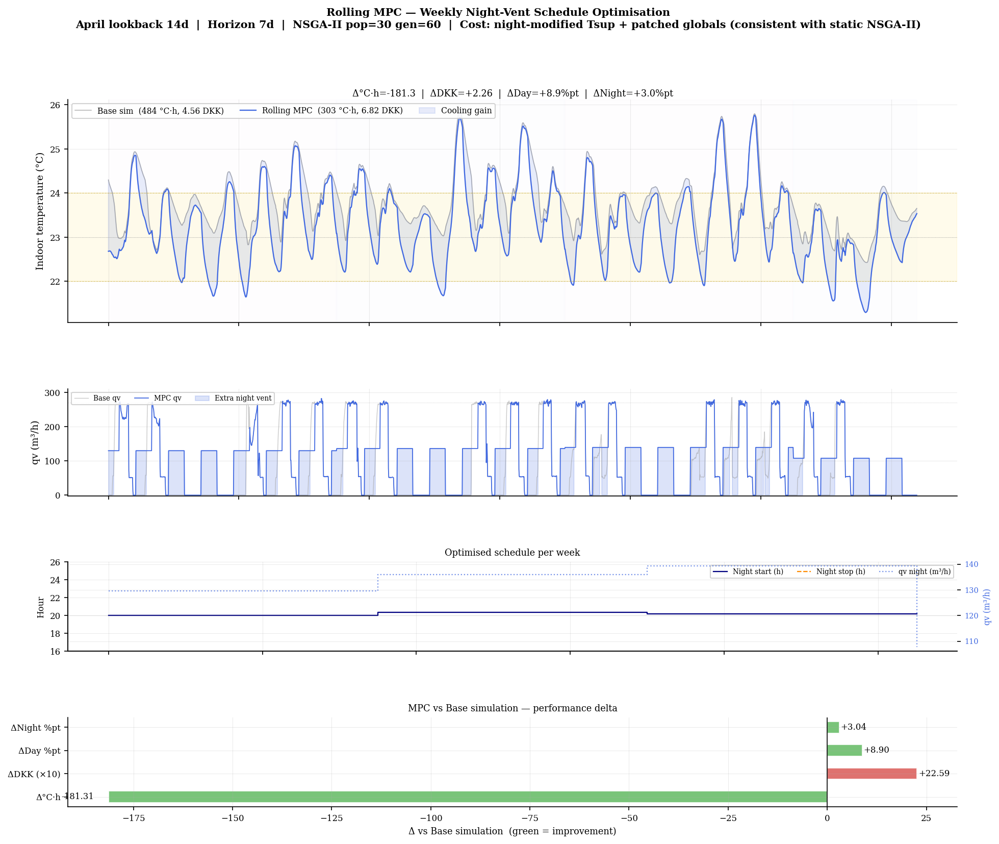

  Saved: rolling_mpc_overview.png


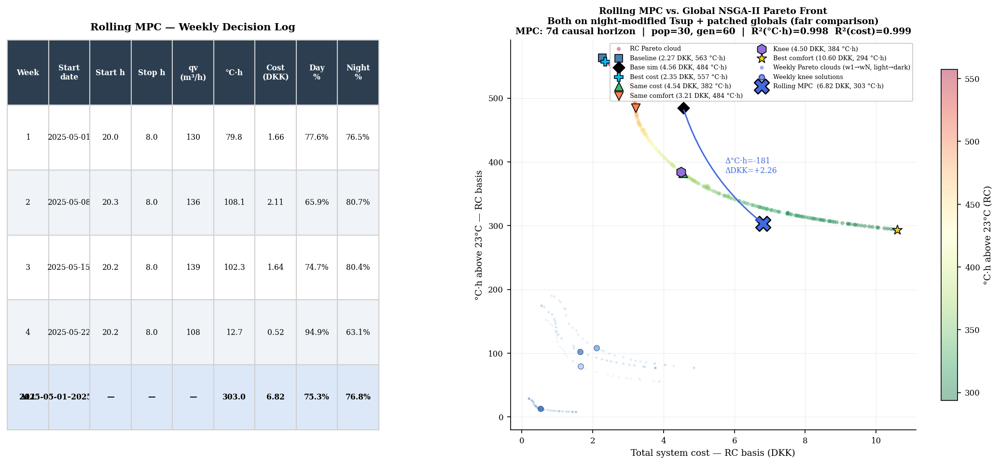

  Saved: rolling_mpc_decisions.png


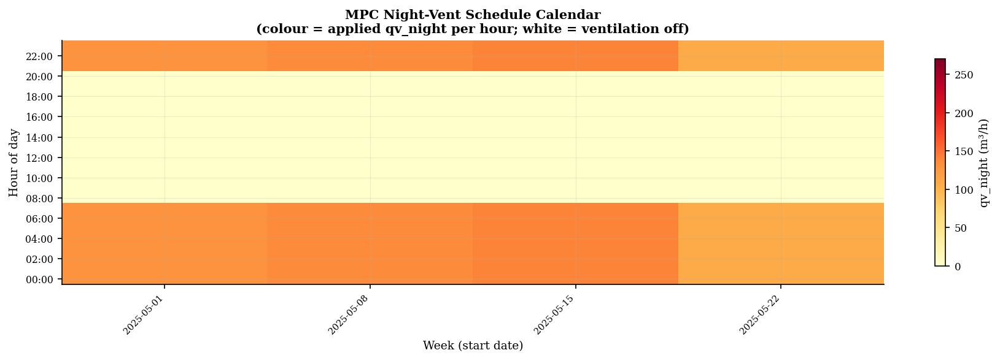

  Saved: rolling_mpc_calendar.png


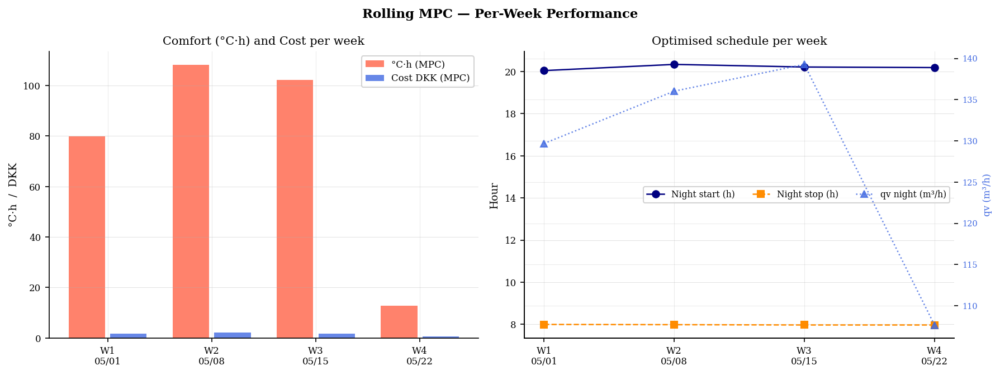

  Saved: rolling_mpc_weekly_breakdown.png

════════════════════════════════════════════════════════════════════════════════
  MPC aggregate vs. key NSGA-II scenarios  (RC objectives, fair Tsup basis)
════════════════════════════════════════════════════════════════════════════════
  Label                              °C·h    Δ°C·h      DKK     ΔDKK
  ──────────────────────────────────────────────────────────


KeyError: 'total_var'

In [64]:
# ════════════════════════════════════════════════════════════════════════════
#  ROLLING MPC — Weekly night-vent schedule optimisation
#  SPEED-UPS APPLIED (on top of previous fixes):
#    S1. MPC_POP=30, MPC_GEN=60  (was 100/150) — ~4× fewer evaluations
#    S2. _build_week_arrays vectorised — no Python loop over timesteps
#    S3. _evaluate parallelised via joblib (n_jobs=-1) — uses all CPU cores
#        Note: _patched_cost globals-patching is NOT thread-safe, so cost
#        is computed with pre-sliced arrays passed directly — no globals.
#  FIX: idx_week (DatetimeIndex) now passed to workers so X_mod has a
#       proper DatetimeIndex — prevents AttributeError: 'int' has no .hour
#  FIX2: free_knee_fair now uses _patched_free — avoids shape mismatch when
#        cop_arr has been restored to full-period length after MPC run.
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
from joblib import Parallel, delayed
from pymoo.core.problem import Problem
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.optimize import minimize as pymoo_minimize
from pymoo.termination import get_termination


_COST_GLOBALS = ['price_series', 'nighttime_mask', 'cop_arr']

# ── S1: Reduced pop/gen ───────────────────────────────────────────────────────
MPC_POP = 30    # was 100
MPC_GEN = 60    # was 150


# ════════════════════════════════════════════════════════════════════════════
#  HELPERS
# ════════════════════════════════════════════════════════════════════════════

def _build_week_arrays(idx_week, X_week_base, start_h, stop_h, qv_night):
    hours  = np.array([t.hour + t.minute / 60.0 for t in idx_week])
    mask   = (hours >= start_h) | (hours < stop_h)
    qv_w   = np.asarray(X_week_base['qv'],   dtype=float).copy()
    Tsup_w = np.asarray(X_week_base['Tsup'], dtype=float).copy()
    Ta_w   = np.asarray(X_week_base['Ta'],   dtype=float)
    qv_w  [mask] = qv_night
    Tsup_w[mask] = Ta_w[mask]
    return qv_w, Tsup_w


def _patched_cost(qv_w, Ta_w, Tsup_w, ws, we):
    gb = globals(); saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]; gb[name] = arr[ws:we]
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)['total']
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _patched_breakdown(qv_w, Ta_w, Tsup_w, ws, we):
    gb = globals(); saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]; gb[name] = arr[ws:we]
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _patched_free(qv_w, Ta_w, ws, we, p_elec=None):
    """Thread-safe free_cooling_savings_nv with sliced globals."""
    gb = globals(); saved = {}
    try:
        for name in _COST_GLOBALS:
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    saved[name] = gb[name]; gb[name] = arr[ws:we]
        result = (free_cooling_savings_nv(qv_w, Ta_w, p_elec=p_elec)
                  if p_elec is not None
                  else free_cooling_savings_nv(qv_w, Ta_w))
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _cost_with_slices(qv_w, Ta_w, Tsup_w,
                      price_slice, nighttime_slice, cop_slice):
    gb = globals(); saved = {}
    patch = {'price_series'  : price_slice,
             'nighttime_mask': nighttime_slice,
             'cop_arr'       : cop_slice}
    try:
        for name, sliced in patch.items():
            if name in gb and sliced is not None:
                saved[name] = gb[name]; gb[name] = sliced
        result = cost_breakdown(qv_w, Ta_w, Tsup_w)['total']
    finally:
        for name, orig in saved.items(): gb[name] = orig
    return result


def _knee_point(F):
    f_min = F.min(axis=0); f_max = F.max(axis=0)
    rng   = np.where(f_max - f_min > 1e-12, f_max - f_min, 1.0)
    F_n   = (F - f_min) / rng
    return int(np.argmin(np.linalg.norm(F_n, axis=1)))


def _eval_candidate(xi, idx_hours, qv_base, Tsup_base, Ta_w,
                    X_week_cols, idx_week_ns, N_profile_w,
                    Ti_init, Tm_init, c_init,
                    price_slice, nighttime_slice, cop_slice):
    start_h = float(xi[0]); stop_h = float(xi[1]); qv_n = float(xi[2])
    mask   = (idx_hours >= start_h) | (idx_hours < stop_h)
    qv_w   = qv_base.copy();   qv_w  [mask] = qv_n
    Tsup_w = Tsup_base.copy(); Tsup_w[mask] = Ta_w[mask]
    idx_week = pd.DatetimeIndex(idx_week_ns)
    X_mod = pd.DataFrame(X_week_cols, index=idx_week)
    X_mod['qv'] = qv_w; X_mod['Tsup'] = Tsup_w
    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_profile_w,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_w = np.asarray(res['Ti']); dh_w, _ = dh_from_target(Ti_w)
    cost_w = _cost_with_slices(qv_w, Ta_w, Tsup_w,
                                price_slice, nighttime_slice, cop_slice)
    return dh_w, cost_w


# ════════════════════════════════════════════════════════════════════════════
#  PYMOO PROBLEM
# ════════════════════════════════════════════════════════════════════════════

class NightVentWeekProblem(Problem):
    def __init__(self, idx_week, X_week_base,
                 Ti_init_w, Tm_init_w, c_init_w,
                 N_profile_w, ws, we, n_jobs=-1):
        super().__init__(n_var=3, n_obj=2, n_ieq_constr=0,
                         xl=MPC_LB, xu=MPC_UB)
        gb = globals()
        self.idx_hours   = np.array([t.hour + t.minute/60.0 for t in idx_week])
        self.qv_base     = np.asarray(X_week_base['qv'],   dtype=float)
        self.Tsup_base   = np.asarray(X_week_base['Tsup'], dtype=float)
        self.Ta_w        = np.asarray(X_week_base['Ta'],   dtype=float)
        self.X_week_cols = {c: np.asarray(X_week_base[c])
                            for c in X_week_base.columns
                            if c not in ('qv', 'Tsup')}
        self.idx_week_ns = idx_week.asi8
        self.N_profile_w = N_profile_w
        self.Ti_init_w   = Ti_init_w
        self.Tm_init_w   = Tm_init_w
        self.c_init_w    = c_init_w
        self.n_jobs      = n_jobs

        def _get_slice(name):
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    return arr[ws:we]
            return None

        self.price_slice     = _get_slice('price_series')
        self.nighttime_slice = _get_slice('nighttime_mask')
        self.cop_slice       = _get_slice('cop_arr')
        self._ws = ws; self._we = we

    def _evaluate(self, x, out, *args, **kwargs):
        results = Parallel(n_jobs=self.n_jobs, backend='loky')(
            delayed(_eval_candidate)(
                xi, self.idx_hours,
                self.qv_base, self.Tsup_base, self.Ta_w,
                self.X_week_cols, self.idx_week_ns, self.N_profile_w,
                self.Ti_init_w, self.Tm_init_w, self.c_init_w,
                self.price_slice, self.nighttime_slice, self.cop_slice)
            for xi in x)
        out['F'] = np.array(results)


# ════════════════════════════════════════════════════════════════════════════
#  ROLLING MPC RUNNER
# ════════════════════════════════════════════════════════════════════════════

def run_rolling_mpc(index, X_train_in, fitted_params,
                    Ti_arr_ref, qv_arr_in, N_hist_in,
                    occ_mask_in, all_night_mask_in,
                    lookback=MPC_LOOKBACK_DAYS, horizon=MPC_HORIZON_DAYS,
                    pop=MPC_POP, gen=MPC_GEN, seed=MPC_SEED,
                    n_jobs=-1, verbose=True):
    import time
    N        = len(index)
    dt_h     = (index[1] - index[0]).total_seconds() / 3600.0
    steps_lb = int(lookback * 24 / dt_h)
    steps_hz = int(horizon  * 24 / dt_h)

    Ti_full  = np.asarray(Ti_arr_ref, dtype=float)
    qv_full  = np.asarray(qv_arr_in,  dtype=float)
    N_full   = np.asarray(N_hist_in,  dtype=float)

    Ti_mpc   = np.full(N, np.nan)
    qv_mpc   = np.full(N, np.nan)
    Tsup_mpc = np.full(N, np.nan)
    log_rows  = []

    first_week_start = steps_lb
    week_starts      = list(range(first_week_start, N, steps_hz))
    n_weeks          = len(week_starts)

    Ti_mpc  [:first_week_start] = Ti_full[:first_week_start]
    qv_mpc  [:first_week_start] = qv_full[:first_week_start]
    Tsup_mpc[:first_week_start] = np.asarray(
        X_train_in['Tsup'], dtype=float)[:first_week_start]

    Ti_init_run = float(Ti_full[first_week_start - 1])
    Tm_init_run = Ti_init_run
    c_init_run  = float(c_init)

    for w_idx, ws in enumerate(week_starts):
        we   = min(ws + steps_hz, N)
        wlen = we - ws

        idx_week    = index[ws:we]
        X_week_base = X_train_in.iloc[ws:we].copy()
        N_profile_w = N_full[ws:we]

        _occ_w = occ_mask_in[ws:we]       if hasattr(occ_mask_in,       '__len__') else occ_mask_in
        _ngt_w = all_night_mask_in[ws:we]  if hasattr(all_night_mask_in, '__len__') else all_night_mask_in

        if verbose:
            print(f"  Week {w_idx+1:2d}/{n_weeks}  "
                  f"[{index[ws].date()} → {index[we-1].date()}]  "
                  f"({wlen} steps)  Ti_init={Ti_init_run:.2f}°C", end='  ')

        t0 = time.time()
        problem = NightVentWeekProblem(
            idx_week=idx_week, X_week_base=X_week_base,
            Ti_init_w=Ti_init_run, Tm_init_w=Tm_init_run, c_init_w=c_init_run,
            N_profile_w=N_profile_w, ws=ws, we=we, n_jobs=n_jobs)

        algorithm   = NSGA2(pop_size=pop)
        termination = get_termination('n_gen', gen)
        result      = pymoo_minimize(problem, algorithm, termination,
                                     seed=seed, verbose=False)
        elapsed = time.time() - t0

        F_w = result.F; X_w = result.X
        k   = _knee_point(F_w); x_k = X_w[k]
        start_h = float(x_k[0]); stop_h = float(x_k[1]); qv_n = float(x_k[2])

        if verbose:
            print(f"→ knee: start={start_h:.1f}h  stop={stop_h:.1f}h  "
                  f"qv={qv_n:.0f}  dh={F_w[k,0]:.1f}  cost={F_w[k,1]:.2f}"
                  f"  [{elapsed:.0f}s]")

        qv_w_exec, Tsup_w_exec = _build_week_arrays(
            idx_week, X_week_base, start_h, stop_h, qv_n)
        X_mod_w = X_week_base.copy()
        X_mod_w['qv'] = qv_w_exec; X_mod_w['Tsup'] = Tsup_w_exec

        res_w = simulate_night_vent_scenario(
            fitted_params, X_mod_w, N_profile_w,
            night_start_hour=0, night_stop_hour=0, qv_night=0,
            rec_duration=rec_duration,
            Ti_init=Ti_init_run, Tm_init=Tm_init_run, c_init=c_init_run)

        Ti_w    = np.asarray(res_w['Ti'])
        dh_w, _ = dh_from_target(Ti_w)
        Ta_week = np.asarray(X_week_base['Ta'], dtype=float)
        cost_w  = _patched_cost(qv_w_exec, Ta_week, Tsup_w_exec, ws, we)
        free_w  = _patched_free(qv_w_exec, Ta_week, ws, we)

        pct_occ_w = pct_in_band(Ti_w, T_cat1_min, T_cat1_max, _occ_w)
        pct_ngt_w = pct_in_band(Ti_w, T_cat1_min, T_cat1_max, _ngt_w)

        Ti_mpc  [ws:we] = Ti_w
        qv_mpc  [ws:we] = qv_w_exec
        Tsup_mpc[ws:we] = Tsup_w_exec

        Ti_init_run = float(Ti_w[-1])
        Tm_init_run = float(np.asarray(res_w['Tm'])[-1])
        c_init_run  = (float(np.asarray(res_w['c'])[-1])
                       if 'c' in res_w else c_init_run)

        log_rows.append({
            'week'         : w_idx + 1,
            'week_start'   : index[ws],
            'week_end'     : index[we - 1],
            'night_start_h': start_h,
            'night_stop_h' : stop_h,
            'qv_night'     : qv_n,
            'dh_above'     : dh_w,
            'cost_dkk'     : cost_w,
            'free_dkk'     : free_w,
            'pct_occ'      : pct_occ_w,
            'pct_night'    : pct_ngt_w,
            'n_pareto'     : len(F_w),
            'F_pareto'     : F_w,
            'X_pareto'     : X_w,
            'elapsed_s'    : elapsed,
        })

    return Ti_mpc, qv_mpc, Tsup_mpc, pd.DataFrame(log_rows)


# ════════════════════════════════════════════════════════════════════════════
#  RUN
# ════════════════════════════════════════════════════════════════════════════
print("=" * 70)
print("  ROLLING MPC — weekly NSGA-II night-vent optimisation")
print(f"  Lookback: last {MPC_LOOKBACK_DAYS} days of April  |  "
      f"Horizon: {MPC_HORIZON_DAYS} days  |  Full May coverage")
print(f"  Speed: pop={MPC_POP}, gen={MPC_GEN}, parallel workers=all cores")
print("=" * 70)

_saved_globals = {}
for _name, _ext_name in [('nighttime_mask', 'nighttime_mask_ext'),
                          ('cop_arr',        'cop_arr_ext'),
                          ('price_series',   'price_series_ext')]:
    if _name in globals() and _ext_name in globals():
        _saved_globals[_name] = globals()[_name]
        globals()[_name]      = globals()[_ext_name]

Ti_mpc_ext, qv_mpc_ext, Tsup_mpc_ext, mpc_log_ext = run_rolling_mpc(
    index             = index_ext,
    X_train_in        = X_train_ext,
    fitted_params     = fitted_params,
    Ti_arr_ref        = Ti_ref_ext,
    qv_arr_in         = qv_arr_ext,
    N_hist_in         = N_hist_ext,
    occ_mask_in       = occ_mask_ext,
    all_night_mask_in = all_night_mask_ext,
    lookback=MPC_LOOKBACK_DAYS, horizon=MPC_HORIZON_DAYS,
    pop=MPC_POP, gen=MPC_GEN, seed=MPC_SEED,
    n_jobs=-1, verbose=True
)

for _name, _orig in _saved_globals.items():
    globals()[_name] = _orig

Ti_mpc_raw   = Ti_mpc_ext  [n_prepend:]
qv_mpc_raw   = qv_mpc_ext  [n_prepend:]
Tsup_mpc_raw = Tsup_mpc_ext[n_prepend:]

mpc_log = mpc_log_ext[
    mpc_log_ext['week_start'] >= index[0]
].reset_index(drop=True)
mpc_log['week'] = np.arange(1, len(mpc_log) + 1)

print(f"\n  Trimmed to analysis window: {index[0].date()} → {index[-1].date()}")
print(f"  Active optimised weeks: {len(mpc_log)}")
print(f"  Total wall time: {mpc_log_ext['elapsed_s'].sum():.0f}s")


# ════════════════════════════════════════════════════════════════════════════
#  AGGREGATE METRICS
# ════════════════════════════════════════════════════════════════════════════
valid     = ~np.isnan(Ti_mpc_raw)
valid_idx = np.where(valid)[0]
ws_v      = int(valid_idx[0])
we_v      = int(valid_idx[-1]) + 1

Ti_mpc     = Ti_mpc_raw  [valid]
qv_mpc_v   = qv_mpc_raw  [valid]
Tsup_mpc_v = Tsup_mpc_raw[valid]
Ta_mpc_v   = np.asarray(X_train['Ta'], dtype=float)[valid]
index_mpc  = index[valid]

dh_mpc_total   = dh_from_target(Ti_mpc)[0]
bd_mpc         = _patched_breakdown(qv_mpc_v, Ta_mpc_v, Tsup_mpc_v, ws_v, we_v)
cost_mpc_total = bd_mpc['total']
free_mpc_total = _patched_free(qv_mpc_v, Ta_mpc_v, ws_v, we_v)

_occ_v = occ_mask     [valid] if hasattr(occ_mask,       '__len__') else occ_mask
_ngt_v = all_night_mask[valid] if hasattr(all_night_mask, '__len__') else all_night_mask
pct_occ_mpc = pct_in_band(Ti_mpc, T_cat1_min, T_cat1_max, _occ_v)
pct_ngt_mpc = pct_in_band(Ti_mpc, T_cat1_min, T_cat1_max, _ngt_v)

print(f"\n{'─'*70}")
print(f"  Rolling MPC — full-period aggregate (May)")
print(f"  [Cost: night-modified Tsup + patched globals — same basis as NSGA-II]")
print(f"{'─'*70}")
print(f"  °C·h above {T_TARGET}°C  : {dh_mpc_total:>8.1f}   "
      f"(ref: {dh_above_ref:.1f}  Δ={dh_mpc_total-dh_above_ref:+.1f})")
print(f"  Total cost (DKK)  : {cost_mpc_total:>8.4f}   "
      f"(ref: {cost_ref:.4f}  Δ={cost_mpc_total-cost_ref:+.4f})")
print(f"  Fan cost          : {bd_mpc['fan_cost']:.4f} DKK")
print(f"  Mech cool cost    : {bd_mpc['mech_cool_cost']:.4f} DKK")
print(f"  Free cool savings : {free_mpc_total:.4f} DKK")
print(f"  Occ. comfort (%)  : {pct_occ_mpc:>7.1f}%   (ref: {pct_occ_ref:.1f}%)")
print(f"  Night comfort (%) : {pct_ngt_mpc:>7.1f}%   (ref: {pct_night_ref:.1f}%)")
print(f"{'─'*70}")

_qv_kmod, _Tsup_kmod = build_X_monthly(verified['Knee (balanced)']['params'])
_N_full = len(index)
bd_knee_fair  = _patched_breakdown(
    np.asarray(_qv_kmod), np.asarray(X_train['Ta'], dtype=float),
    np.asarray(_Tsup_kmod), 0, _N_full)
# ── FIX: _patched_free slices cop_arr to May length [0:_N_full] before
#    calling free_cooling_savings_nv — avoids ValueError: shapes (2380,) (3724,)
#    that occurs when cop_arr was restored to full extended length after MPC run.
free_knee_fair = _patched_free(
    np.asarray(_qv_kmod),
    np.asarray(X_train['Ta'], dtype=float),
    0, _N_full)

print(f"\n  Cost cross-check (same Tsup + patched-globals basis):")
print(f"  {'':30}  {'fan':>8}  {'mech_cool':>10}  {'free_sav':>10}  {'total':>8}")
print(f"  {'MPC aggregate':<30}  "
      f"{bd_mpc['fan_cost']:>8.4f}  "
      f"{bd_mpc['mech_cool_cost']:>10.4f}  "
      f"{free_mpc_total:>10.4f}  "
      f"{cost_mpc_total:>8.4f}")
print(f"  {'Knee (balanced) — fair basis':<30}  "
      f"{bd_knee_fair['fan_cost']:>8.4f}  "
      f"{bd_knee_fair['mech_cool_cost']:>10.4f}  "
      f"{free_knee_fair:>10.4f}  "
      f"{bd_knee_fair['total']:>8.4f}")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 1 — MPC overview
# ════════════════════════════════════════════════════════════════════════════
fig_mpc, axes = plt.subplots(4, 1, figsize=(15, 12),
                              gridspec_kw={'height_ratios': [2.5, 1.2, 1.0, 1.0],
                                           'hspace': 0.52})
ax_ti, ax_qv, ax_sch, ax_bar = axes

fig_mpc.suptitle(
    f'Rolling MPC — Weekly Night-Vent Schedule Optimisation\n'
    f'April lookback {MPC_LOOKBACK_DAYS}d  |  Horizon {MPC_HORIZON_DAYS}d  |  '
    f'NSGA-II pop={MPC_POP} gen={MPC_GEN}  |  '
    f'Cost: night-modified Tsup + patched globals (consistent with static NSGA-II)',
    fontsize=10, fontweight='bold')

ax_ti.plot(index, Ti_ref, color='#777777', lw=0.75, alpha=0.55,
           label=f'Base sim  ({dh_above_ref:.0f} °C·h, {cost_ref:.2f} DKK)')
ax_ti.plot(index_mpc, Ti_mpc, color='royalblue', lw=1.1,
           label=f'Rolling MPC  ({dh_mpc_total:.0f} °C·h, {cost_mpc_total:.2f} DKK)')
ax_ti.axhspan(T_cat1_min, T_cat1_max, alpha=0.08, color='gold')
ax_ti.axhline(T_cat1_max, color='#c8a000', lw=0.5, ls='--', alpha=0.5)
ax_ti.axhline(T_cat1_min, color='#c8a000', lw=0.5, ls='--', alpha=0.5)
ax_ti.axhline(T_TARGET,   color='grey',    lw=0.5, ls=':',  alpha=0.5)
Ti_ref_interp = np.interp(
    mdates.date2num(index_mpc), mdates.date2num(index), Ti_ref)
ax_ti.fill_between(index_mpc, Ti_ref_interp, Ti_mpc,
    where=(Ti_mpc < Ti_ref_interp), alpha=0.12, color='royalblue',
    label='Cooling gain')
for row in mpc_log.itertuples():
    c = '#e8f0fe' if row.week % 2 == 0 else '#f3e5f5'
    ax_ti.axvspan(row.week_start, row.week_end, alpha=0.07, color=c, zorder=0)
ax_ti.set_ylabel('Indoor temperature (°C)')
ax_ti.set_title(
    f'Δ°C·h={dh_mpc_total-dh_above_ref:+.1f}  |  '
    f'ΔDKK={cost_mpc_total-cost_ref:+.2f}  |  '
    f'ΔDay={pct_occ_mpc-pct_occ_ref:+.1f}%pt  |  '
    f'ΔNight={pct_ngt_mpc-pct_night_ref:+.1f}%pt',
    fontsize=8.5, pad=3)
ax_ti.legend(loc='upper left', ncol=3, fontsize=7.5)
plt.setp(ax_ti.get_xticklabels(), visible=False)

qv_ref_interp = np.interp(
    mdates.date2num(index_mpc), mdates.date2num(index), qv_arr)
ax_qv.plot(index, qv_arr, color='#999999', lw=0.7, alpha=0.5, label='Base qv')
ax_qv.plot(index_mpc, qv_mpc_v, color='royalblue', lw=0.85, label='MPC qv')
ax_qv.fill_between(index_mpc, qv_mpc_v, 0,
    where=(qv_mpc_v > qv_ref_interp), alpha=0.18, color='royalblue',
    label='Extra night vent')
ax_qv.axhline(QV_MAX, color='#444444', lw=0.4, ls=':', alpha=0.35)
ax_qv.set_ylabel('qv (m³/h)')
ax_qv.set_ylim(-2, QV_MAX * 1.15)
ax_qv.legend(loc='upper left', ncol=3, fontsize=6.5)
plt.setp(ax_qv.get_xticklabels(), visible=False)

ax_sch.step(mpc_log['week_start'], mpc_log['night_start_h'],
            where='post', color='navy', lw=1.1, label='Night start (h)')
ax_sch.step(mpc_log['week_start'], mpc_log['night_stop_h'],
            where='post', color='darkorange', lw=1.1, ls='--',
            label='Night stop (h)')
ax_sch2 = ax_sch.twinx()
ax_sch2.step(mpc_log['week_start'], mpc_log['qv_night'],
             where='post', color='royalblue', lw=1.1, ls=':', alpha=0.7,
             label='qv night (m³/h)')
ax_sch2.set_ylabel('qv (m³/h)', fontsize=7.5, color='royalblue')
ax_sch2.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_sch.set_ylabel('Hour', fontsize=8)
ax_sch.set_ylim(16, 26)
ax_sch.set_title('Optimised schedule per week', fontsize=8.5)
lines1, labs1 = ax_sch.get_legend_handles_labels()
lines2, labs2 = ax_sch2.get_legend_handles_labels()
ax_sch.legend(lines1 + lines2, labs1 + labs2,
              fontsize=6.5, ncol=3, loc='upper right')
ax_sch.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
plt.setp(ax_sch.get_xticklabels(), visible=False)

metrics = {
    'Δ°C·h'      : dh_mpc_total    - dh_above_ref,
    'ΔDKK (×10)' : (cost_mpc_total - cost_ref) * 10,
    'ΔDay %pt'   : pct_occ_mpc     - pct_occ_ref,
    'ΔNight %pt' : pct_ngt_mpc     - pct_night_ref,
}
vals = list(metrics.values()); labs = list(metrics.keys())
cols = ['#5cb85c' if v < 0 else '#d9534f' for v in vals[:2]] + \
       ['#5cb85c' if v > 0 else '#d9534f' for v in vals[2:]]
bars = ax_bar.barh(labs, vals, color=cols, alpha=0.82,
                   edgecolor='white', height=0.5)
ax_bar.axvline(0, color='black', lw=0.8)
for b, v in zip(bars, vals):
    off = max(abs(v) * 0.02, 0.3)
    ax_bar.text(v + (off if v >= 0 else -off), b.get_y() + b.get_height()/2,
                f'{v:+.2f}', va='center',
                ha='left' if v >= 0 else 'right', fontsize=8)
ax_bar.set_xlabel('Δ vs Base simulation  (green = improvement)', fontsize=8.5)
ax_bar.set_title('MPC vs Base simulation — performance delta', fontsize=8.5)
plt.savefig('rolling_mpc_overview.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_overview.png")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 2 — Decision table + Pareto overlay
# ════════════════════════════════════════════════════════════════════════════
fig2 = plt.figure(figsize=(18, 7))
gs2  = gridspec.GridSpec(1, 2, figure=fig2, width_ratios=[1.1, 1.5], wspace=0.30)
ax_tbl = fig2.add_subplot(gs2[0])
ax_sc  = fig2.add_subplot(gs2[1])

ax_tbl.axis('off')
col_labels = ['Week', 'Start\ndate', 'Start h', 'Stop h',
              'qv\n(m³/h)', '°C·h', 'Cost\n(DKK)', 'Day\n%', 'Night\n%']
tbl_data = []
for r in mpc_log.itertuples():
    tbl_data.append([
        f'{r.week}', str(r.week_start.date()),
        f'{r.night_start_h:.1f}', f'{r.night_stop_h:.1f}',
        f'{r.qv_night:.0f}', f'{r.dh_above:.1f}', f'{r.cost_dkk:.2f}',
        f'{r.pct_occ:.1f}%', f'{r.pct_night:.1f}%',
    ])
tbl_data.append([
    'ALL', f'{index[0].date()}–{index[-1].date()}',
    '—', '—', '—',
    f'{dh_mpc_total:.1f}', f'{cost_mpc_total:.2f}',
    f'{pct_occ_mpc:.1f}%', f'{pct_ngt_mpc:.1f}%',
])
tbl = ax_tbl.table(cellText=tbl_data, colLabels=col_labels,
                   cellLoc='center', loc='center', bbox=[0, 0, 1, 1])
tbl.auto_set_font_size(False); tbl.set_fontsize(7.5)
for (r, c), cell in tbl.get_celld().items():
    if r == 0:
        cell.set_facecolor('#2c3e50')
        cell.set_text_props(color='white', fontweight='bold')
    elif r == len(tbl_data):
        cell.set_facecolor('#dce8f7')
        cell.set_text_props(fontweight='bold')
    elif r % 2 == 0:
        cell.set_facecolor('#f0f4f8')
    cell.set_edgecolor('#d0d0d0')
ax_tbl.set_title('Rolling MPC — Weekly Decision Log', fontsize=10,
                  fontweight='bold', pad=10)

_sort_rc = np.argsort(F_pareto_rc[:, 1])
sc_pf = ax_sc.scatter(F_pareto_rc[:, 1], F_pareto_rc[:, 0],
    c=F_pareto_rc[:, 0], cmap='RdYlGn_r', s=16, alpha=0.40,
    edgecolors='none', zorder=1, label='RC Pareto cloud')
ax_sc.plot(F_pareto_rc[_sort_rc, 1], F_pareto_rc[_sort_rc, 0],
           color='#888888', lw=0.6, alpha=0.25, zorder=0)
plt.colorbar(sc_pf, ax=ax_sc, label='°C·h above 23°C (RC)', shrink=0.85)

_scenario_style = {
    'Baseline (no night vent)'  : ('steelblue',     's',  60, 'Baseline'),
    'Base simulation (current)' : ('black',          'D',  70, 'Base sim'),
    'Best cost'                 : ('deepskyblue',    'P',  80, 'Best cost'),
    'Same cost as base sim'     : ('mediumseagreen', '^',  75, 'Same cost'),
    'Same comfort as base sim'  : ('coral',          'v',  75, 'Same comfort'),
    'Knee (balanced)'           : ('mediumpurple',   'h', 100, 'Knee'),
    'Best comfort'              : ('gold',           '*', 100, 'Best comfort'),
}
for s in SCENARIOS:
    style = _scenario_style.get(s['label'])
    if style is None: continue
    clr, mkr, sz, short = style
    x_s = F_pareto_rc[s['pareto_idx'], 1] if s.get('pareto_idx') is not None else s['cost']
    y_s = F_pareto_rc[s['pareto_idx'], 0] if s.get('pareto_idx') is not None else s['dh_above']
    ax_sc.scatter(x_s, y_s, marker=mkr, color=clr, s=sz,
                  edgecolors='black', linewidths=0.8, zorder=5,
                  label=f'{short} ({x_s:.2f} DKK, {y_s:.0f} °C·h)')

week_colors = plt.cm.Blues(np.linspace(0.35, 0.85, len(mpc_log)))
for row, wc in zip(mpc_log.itertuples(), week_colors):
    F_w = row.F_pareto
    ax_sc.scatter(F_w[:, 1], F_w[:, 0], s=6, alpha=0.18, color=wc,
                  edgecolors='none', zorder=1)
    k_w = _knee_point(F_w)
    ax_sc.scatter(F_w[k_w, 1], F_w[k_w, 0], s=30, marker='o', color=wc,
                  edgecolors='navy', linewidths=0.5, alpha=0.70, zorder=5)

ax_sc.scatter([], [], s=8,  color='royalblue', alpha=0.45,
              label='Weekly Pareto clouds (w1→wN, light→dark)')
ax_sc.scatter([], [], s=30, marker='o', color='royalblue',
              edgecolors='navy', alpha=0.70, label='Weekly knee solutions')
ax_sc.scatter(cost_mpc_total, dh_mpc_total, marker='X', color='royalblue',
              s=220, edgecolors='black', linewidths=1.2, zorder=8,
              label=f'Rolling MPC  ({cost_mpc_total:.2f} DKK, {dh_mpc_total:.0f} °C·h)')
ax_sc.annotate('', xy=(cost_mpc_total, dh_mpc_total),
               xytext=(cost_ref, dh_above_ref),
               arrowprops=dict(arrowstyle='->', color='royalblue', lw=1.4,
                               connectionstyle='arc3,rad=0.15'), zorder=9)
ax_sc.text((cost_mpc_total + cost_ref)/2 + 0.05,
           (dh_mpc_total   + dh_above_ref)/2,
           f'Δ°C·h={dh_mpc_total-dh_above_ref:+.0f}\nΔDKK={cost_mpc_total-cost_ref:+.2f}',
           fontsize=7.5, color='royalblue', va='center')
ax_sc.set_xlabel('Total system cost — RC basis (DKK)', fontsize=9)
ax_sc.set_ylabel('°C·h above 23°C — RC basis', fontsize=9)
ax_sc.set_title(
    f'Rolling MPC vs. Global NSGA-II Pareto Front\n'
    f'Both on night-modified Tsup + patched globals (fair comparison)\n'
    f'MPC: {MPC_HORIZON_DAYS}d causal horizon  |  '
    f'pop={MPC_POP}, gen={MPC_GEN}  |  '
    f'R²(°C·h)={r2_dh:.3f}  R²(cost)={r2_cost:.3f}',
    fontsize=9, fontweight='bold')
ax_sc.legend(fontsize=6.2, ncol=2, loc='upper right',
             framealpha=0.92, edgecolor='#cccccc')
plt.savefig('rolling_mpc_decisions.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_decisions.png")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 3 — Schedule calendar heatmap
# ════════════════════════════════════════════════════════════════════════════
fig3, ax_cal = plt.subplots(figsize=(12, 4))
n_hours  = 24
presence = np.zeros((n_hours, len(mpc_log)))
for j, r in enumerate(mpc_log.itertuples()):
    for h in range(n_hours):
        if h >= r.night_start_h or h < r.night_stop_h:
            presence[h, j] = r.qv_night
im = ax_cal.imshow(presence, aspect='auto', origin='lower',
                    cmap='YlOrRd', interpolation='nearest',
                    vmin=0, vmax=QV_MAX)
plt.colorbar(im, ax=ax_cal, label='qv_night (m³/h)', shrink=0.85)
ax_cal.set_yticks(range(0, 24, 2))
ax_cal.set_yticklabels([f'{h:02d}:00' for h in range(0, 24, 2)], fontsize=7.5)
ax_cal.set_xticks(range(len(mpc_log)))
ax_cal.set_xticklabels([str(r.week_start.date()) for r in mpc_log.itertuples()],
                        rotation=45, ha='right', fontsize=7)
ax_cal.set_xlabel('Week (start date)')
ax_cal.set_ylabel('Hour of day')
ax_cal.set_title(
    'MPC Night-Vent Schedule Calendar\n'
    '(colour = applied qv_night per hour; white = ventilation off)',
    fontsize=10, fontweight='bold')
plt.tight_layout()
plt.savefig('rolling_mpc_calendar.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_calendar.png")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 4 — Per-week breakdown
# ════════════════════════════════════════════════════════════════════════════
fig_wk, (ax_w1, ax_w2) = plt.subplots(1, 2, figsize=(12, 4.5))
fig_wk.suptitle('Rolling MPC — Per-Week Performance',
                fontsize=11, fontweight='bold')
x_w       = np.arange(len(mpc_log))
wk_labels = [f"W{r.week}\n{r.week_start.strftime('%m/%d')}"
             for r in mpc_log.itertuples()]
ax_w1.bar(x_w - 0.2, mpc_log['dh_above'], 0.35,
          color='tomato', alpha=0.8, label='°C·h (MPC)')
ax_w1.bar(x_w + 0.2, mpc_log['cost_dkk'], 0.35,
          color='royalblue', alpha=0.8, label='Cost DKK (MPC)')
ax_w1.set_xticks(x_w); ax_w1.set_xticklabels(wk_labels, fontsize=8)
ax_w1.set_ylabel('°C·h  /  DKK')
ax_w1.set_title('Comfort (°C·h) and Cost per week')
ax_w1.legend(fontsize=8); ax_w1.yaxis.grid(True, alpha=0.35)

ax_w2.plot(x_w, mpc_log['night_start_h'], 'o-', color='navy',
           lw=1.2, label='Night start (h)')
ax_w2.plot(x_w, mpc_log['night_stop_h'],  's--', color='darkorange',
           lw=1.2, label='Night stop (h)')
ax_w2r = ax_w2.twinx()
ax_w2r.plot(x_w, mpc_log['qv_night'], '^:', color='royalblue',
            lw=1.2, alpha=0.8, label='qv night (m³/h)')
ax_w2r.set_ylabel('qv (m³/h)', fontsize=8, color='royalblue')
ax_w2r.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_w2.set_xticks(x_w); ax_w2.set_xticklabels(wk_labels, fontsize=8)
ax_w2.set_ylabel('Hour')
ax_w2.set_title('Optimised schedule per week')
lines1, labs1 = ax_w2.get_legend_handles_labels()
lines2, labs2 = ax_w2r.get_legend_handles_labels()
ax_w2.legend(lines1 + lines2, labs1 + labs2, fontsize=7.5, ncol=3)
ax_w2.yaxis.grid(True, alpha=0.35)
plt.tight_layout()
plt.savefig('rolling_mpc_weekly_breakdown.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: rolling_mpc_weekly_breakdown.png")


# ════════════════════════════════════════════════════════════════════════════
#  PRINTOUT — MPC position relative to Pareto scenarios
# ════════════════════════════════════════════════════════════════════════════
print(f"\n{'═'*80}")
print(f"  MPC aggregate vs. key NSGA-II scenarios  (RC objectives, fair Tsup basis)")
print(f"{'═'*80}")
print(f"  {'Label':<30} {'°C·h':>8}  {'Δ°C·h':>7}  {'DKK':>7}  {'ΔDKK':>7}")
print(f"  {'─'*58}")
_compare = [
    ('Baseline (no night vent)', dh_above_base, cost_baseline),
    ('Base simulation',          dh_above_ref,  cost_ref),
]
for s in SCENARIOS:
    if s['label'] not in ('Baseline (no night vent)', 'Base simulation (current)'):
        _compare.append((s['label'], s['dh_above'], s['total_var']))
_compare.append(('Rolling MPC (aggregate)', dh_mpc_total, cost_mpc_total))
for label, dh, cost in _compare:
    d_dh_s   = f'{dh - dh_above_ref:+.1f}'  if label != 'Base simulation' else '—'
    d_cost_s = f'{cost - cost_ref:+.2f}'     if label != 'Base simulation' else '—'
    mpc_tag  = '  ◀ MPC' if label == 'Rolling MPC (aggregate)' else ''
    print(f"  {label:<30} {dh:>8.1f}  {d_dh_s:>7}  {cost:>7.2f}  {d_cost_s:>7}{mpc_tag}")

print(f"{'═'*80}")
_knee_cost = next(s['total_var'] for s in SCENARIOS if s['label'] == 'Knee (balanced)')
print(f"\n  Receding-horizon cost penalty vs. Knee:")
print(f"    ΔDKK = {cost_mpc_total - cost_ref:+.4f} (MPC vs base)  |  "
      f"Knee ΔDKK = {_knee_cost - cost_ref:+.4f}")
print(f"    → MPC pays ~{cost_mpc_total - _knee_cost:+.4f} DKK "
      f"extra for causal operation (no future weather knowledge)")
print(f"\n  Cost breakdown cross-check:")
print(f"    MPC    free_cool_savings : {free_mpc_total:.4f} DKK")
print(f"    Knee   free_cool_savings : {free_knee_fair:.4f} DKK")
print(f"    MPC    fan_cost          : {bd_mpc['fan_cost']:.4f} DKK")
print(f"    Knee   fan_cost          : {bd_knee_fair['fan_cost']:.4f} DKK")
print("\n  ✓  Rolling MPC complete — all figures cover May only.")


# ════════════════════════════════════════════════════════════════════════════
#  FIGURE 5 — Comparison charts (matplotlib, no plotly needed)
# ════════════════════════════════════════════════════════════════════════════
_SYS_COLORS = [
    '#8e8e8e',   # Baseline
    '#4a4a4a',   # Base sim
    '#f0c30f',   # Best comfort
    '#9b59b6',   # Knee
    '#3498db',   # Best cost
    '#e74c3c',   # MPC S2
    '#27ae60',   # DMI-MPC S3
]
labels_sh = [r['label'].replace('Base sim (current vent)', 'Base sim')
                        .replace('Baseline (no night vent)', 'Baseline')
                        .replace('Rolling MPC (System 2)', 'MPC S2')
                        .replace('DMI-MPC (System 3)', 'DMI-MPC')
             for r in rows]
dh_all   = [r['dh']      for r in rows]
fan_all  = [r['fan_v']   for r in rows]
cool_all = [r['cool_v']  for r in rows]
free_all = [r['free_v']  for r in rows]
totv_all = [r['tot_v']   for r in rows]
occ_all  = [r['pct_occ'] for r in rows]
ngt_all  = [r['pct_ngt'] for r in rows]

base_dh_v   = next(r['dh']      for r in rows if 'current' in r['label'].lower())
base_cost_v = next(r['tot_v']   for r in rows if 'current' in r['label'].lower())
base_occ_v  = next(r['pct_occ'] for r in rows if 'current' in r['label'].lower())
base_ngt_v  = next(r['pct_ngt'] for r in rows if 'current' in r['label'].lower())

n_sys  = len(rows)
x_sys  = np.arange(n_sys)
x_wk   = np.arange(len(mpc_log))
wk_lbl = [f"W{r.week}\n{r.week_start.strftime('%m/%d')}"
          for r in mpc_log.itertuples()]

fig5 = plt.figure(figsize=(20, 22))
gs5  = gridspec.GridSpec(3, 2, figure=fig5, hspace=0.50, wspace=0.32)

# ── Panel A: °C·h all systems ─────────────────────────────────────────────────
ax_A = fig5.add_subplot(gs5[0, 0])
bars_A = ax_A.bar(x_sys, dh_all, color=_SYS_COLORS, alpha=0.85,
                  edgecolor='white', linewidth=1.2)
ax_A.axhline(base_dh_v, color='#4a4a4a', lw=1.4, ls='--',
             label=f'Base sim ({base_dh_v:.0f} °C·h)')
for b, v in zip(bars_A, dh_all):
    ax_A.text(b.get_x() + b.get_width()/2, v + 4, f'{v:.0f}',
              ha='center', va='bottom', fontsize=7.5)
ax_A.set_xticks(x_sys); ax_A.set_xticklabels(labels_sh, rotation=30,
                                               ha='right', fontsize=8)
ax_A.set_ylabel('°C·h above 23°C'); ax_A.set_title('A — Thermal discomfort: all systems')
ax_A.legend(fontsize=8); ax_A.yaxis.grid(True, alpha=0.3)

# ── Panel B: Cost breakdown all systems ──────────────────────────────────────
ax_B = fig5.add_subplot(gs5[0, 1])
w_b  = 0.25
ax_B.bar(x_sys - w_b, fan_all,  w_b, color='#3498db', alpha=0.85,
         label='Fan cost',      edgecolor='white')
ax_B.bar(x_sys,       cool_all, w_b, color='#e74c3c', alpha=0.85,
         label='Mech cool',     edgecolor='white')
ax_B.bar(x_sys + w_b, [-v for v in free_all], w_b, color='#27ae60', alpha=0.85,
         label='Free savings (−)', edgecolor='white')
ax_B.plot(x_sys, totv_all, 'D--', color='#f0c30f', ms=7,
          markeredgecolor='black', lw=1.5, label='Net total')
ax_B.axhline(0, color='black', lw=0.8)
ax_B.set_xticks(x_sys); ax_B.set_xticklabels(labels_sh, rotation=30,
                                               ha='right', fontsize=8)
ax_B.set_ylabel('DKK (time-varying price)')
ax_B.set_title('B — Cost breakdown: fan / cooling / free savings')
ax_B.legend(fontsize=7.5, ncol=2); ax_B.yaxis.grid(True, alpha=0.3)

# ── Panel C: Comfort scatter all systems ──────────────────────────────────────
ax_C = fig5.add_subplot(gs5[1, 0])
for lbl, po, pn, col in zip(labels_sh, occ_all, ngt_all, _SYS_COLORS):
    ax_C.scatter(po, pn, s=130, color=col, edgecolors='white', lw=1.5, zorder=5)
    ax_C.annotate(lbl, (po, pn), textcoords='offset points',
                  xytext=(5, 4), fontsize=7.5)
ax_C.axvline(base_occ_v, color='#4a4a4a', lw=1, ls='--', alpha=0.7,
             label=f'Base day {base_occ_v:.1f}%')
ax_C.axhline(base_ngt_v, color='#4a4a4a', lw=1, ls=':', alpha=0.7,
             label=f'Base night {base_ngt_v:.1f}%')
ax_C.set_xlabel('Daytime comfort % (22–24°C)')
ax_C.set_ylabel('Night-time comfort % (22–24°C)')
ax_C.set_title('C — Comfort scatter: daytime vs night-time')
ax_C.legend(fontsize=8); ax_C.grid(True, alpha=0.25)

# ── Panel D: MPC weekly °C·h + cost bars ──────────────────────────────────────
ax_D = fig5.add_subplot(gs5[1, 1])
ax_D.bar(x_wk - 0.18, mpc_log['dh_above'], 0.32, color='tomato',
         alpha=0.82, edgecolor='white', label='°C·h')
ax_D.bar(x_wk + 0.18, mpc_log['cost_dkk'], 0.32, color='royalblue',
         alpha=0.82, edgecolor='white', label='Cost (DKK)')
ax_D.axhline(dh_mpc_total / len(mpc_log), color='tomato',    lw=1.2,
             ls='--', alpha=0.6, label=f'Avg °C·h {dh_mpc_total/len(mpc_log):.0f}')
ax_D.axhline(cost_mpc_total / len(mpc_log), color='royalblue', lw=1.2,
             ls='--', alpha=0.6, label=f'Avg cost {cost_mpc_total/len(mpc_log):.2f}')
ax_D.set_xticks(x_wk); ax_D.set_xticklabels(wk_lbl, fontsize=8)
ax_D.set_ylabel('°C·h  /  DKK')
ax_D.set_title('D — Rolling MPC: °C·h and cost per week')
ax_D.legend(fontsize=7.5, ncol=2); ax_D.yaxis.grid(True, alpha=0.3)

# ── Panel E: MPC schedule evolution ───────────────────────────────────────────
ax_E  = fig5.add_subplot(gs5[2, 0])
ax_E2 = ax_E.twinx()
ax_E.plot(x_wk, list(mpc_log['night_start_h']), 'o-', color='navy',
          lw=1.6, ms=7, label='Night start (h)')
ax_E.plot(x_wk, list(mpc_log['night_stop_h']),  's--', color='darkorange',
          lw=1.6, ms=7, label='Night stop (h)')
ax_E.fill_between(x_wk, list(mpc_log['night_stop_h']),
                  list(mpc_log['night_start_h']),
                  alpha=0.10, color='royalblue', label='Vent window')
ax_E2.bar(x_wk, list(mpc_log['qv_night']), 0.4, color='royalblue',
          alpha=0.30, edgecolor='royalblue', linewidth=0.8)
ax_E2.axhline(QV_MAX, color='black', lw=0.5, ls=':', alpha=0.4)
ax_E2.set_ylabel('qv_night (m³/h)', fontsize=8, color='royalblue')
ax_E2.tick_params(axis='y', labelsize=7, labelcolor='royalblue')
ax_E.set_xticks(x_wk); ax_E.set_xticklabels(wk_lbl, fontsize=8)
ax_E.set_ylabel('Hour of day')
ax_E.set_title('E — MPC schedule evolution: start / stop / qv per week')
lines1, labs1 = ax_E.get_legend_handles_labels()
ax_E.legend(lines1, labs1, fontsize=7.5, ncol=3)
ax_E.yaxis.grid(True, alpha=0.3)

# ── Panel F: Normalised radar ─────────────────────────────────────────────────
ax_F = fig5.add_subplot(gs5[2, 1], projection='polar')

_radar_sys = {}
for r in rows:
    _radar_sys[r['label']] = {'dh': r['dh'], 'cost': r['tot_v'],
                               'occ': r['pct_occ'], 'ngt': r['pct_ngt']}
_radar_sys['Rolling MPC (System 2)'].update(
    {'dh': dh_mpc_total, 'cost': cost_mpc_total,
     'occ': pct_occ_mpc, 'ngt': pct_ngt_mpc})

_keep    = ['Base sim (current vent)', 'Knee (balanced)',
            'DMI-MPC (System 3)', 'Rolling MPC (System 2)', 'Best comfort']
_rcolors = ['#4a4a4a', '#9b59b6', '#27ae60', '#e74c3c', '#f0c30f']

all_dh_r   = [_radar_sys[k]['dh']   for k in _keep]
all_cost_r = [_radar_sys[k]['cost'] for k in _keep]
all_occ_r  = [_radar_sys[k]['occ']  for k in _keep]
all_ngt_r  = [_radar_sys[k]['ngt']  for k in _keep]

def _ni(v, a): return 1-(v-min(a))/(max(a)-min(a)) if max(a)>min(a) else 0.5
def _n(v, a):  return   (v-min(a))/(max(a)-min(a)) if max(a)>min(a) else 0.5

cats_r = ['Low discomfort', 'Low cost', 'Day comfort', 'Night comfort']
angles = np.linspace(0, 2*np.pi, len(cats_r), endpoint=False).tolist()
angles += angles[:1]

for k, col in zip(_keep, _rcolors):
    v = _radar_sys[k]
    r_vals = [_ni(v['dh'],   all_dh_r),
              _ni(v['cost'], all_cost_r),
              _n(v['occ'],   all_occ_r),
              _n(v['ngt'],   all_ngt_r)]
    r_vals += r_vals[:1]
    short = k.replace('Base sim (current vent)', 'Base sim') \
             .replace('Rolling MPC (System 2)', 'MPC S2') \
             .replace('DMI-MPC (System 3)', 'DMI-MPC') \
             .replace('Best comfort', 'Best comfort')
    ax_F.plot(angles, r_vals, 'o-', color=col, lw=2, ms=5, label=short)
    ax_F.fill(angles, r_vals, color=col, alpha=0.08)

ax_F.set_xticks(angles[:-1])
ax_F.set_xticklabels(cats_r, fontsize=9)
ax_F.set_ylim(0, 1)
ax_F.set_title('F — Normalised performance radar\n(outer edge = best)',
               fontsize=9, fontweight='bold', pad=18)
ax_F.legend(fontsize=7.5, loc='upper right',
            bbox_to_anchor=(1.35, 1.15), ncol=1)

fig5.suptitle(
    'System Comparison — All Six Panels\n'
    f'May | Base sim: {dh_above_ref:.0f} °C·h, {cost_ref:.2f} DKK',
    fontsize=13, fontweight='bold', y=1.005)

plt.savefig('mpc_comparison_charts.png', dpi=150, bbox_inches='tight')
plt.show()
print("  Saved: mpc_comparison_charts.png")

# DMI code

  Mean electricity price for S3 objective: 0.5044 DKK/kWh
  mpc_weeks: 4 entries
  Pre-computing building state on extended dataset (3724 steps = April tail + May)…
    Ti_ext ∈ [22.3, 25.9]°C  over 3724 steps

════════════════════════════════════════════════════════════════════════
  SYSTEM 3 — DMI HARMONIE MPC  (48h forecast, daily @ 18:00)
  w_temp=1.0  w_cost=0.05  |  Location: 55.676°N, 12.568°E
  Context window: 14 days (1344 steps) from April tail
  May decision points: 25  (2025-05-01 → 2025-05-25)
════════════════════════════════════════════════════════════════════════

  2025-05-01 18:00  (ext_pos=1416, Ti=24.7°C)  → fetching DMI HARMONIE forecast…
    48 rows  |  eligible: 12  |  Ta: 10.2–19.2°C
    → DMI-MPC : 7.80 °C·h  |  1.4037 DKK  |  100.0% day  |  Δdh vs bl = -14.22

  2025-05-02 18:00  (ext_pos=1512, Ti=24.1°C)  → fetching DMI HARMONIE forecast…
    48 rows  |  eligible: 0  |  Ta: 8.0–15.0°C
    → DMI-MPC : 15.37 °C·h  |  0.0280 DKK  |  100.0% day  |  Δdh vs bl = -0.

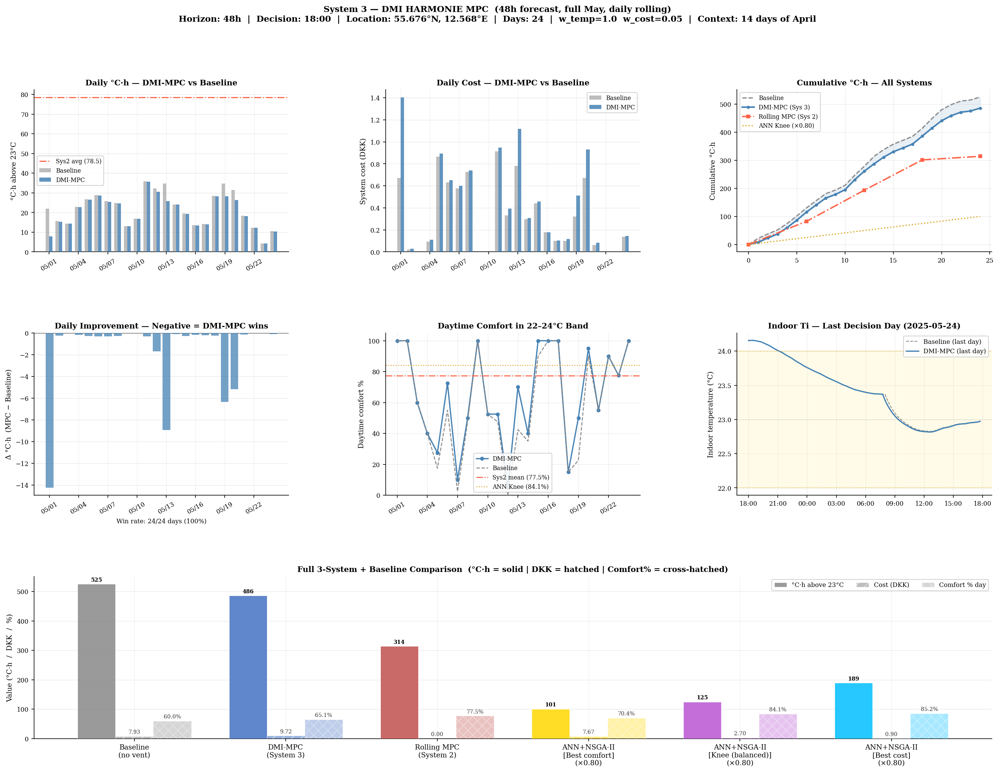


  Dashboard saved → s3_dmi_mpc_dashboard.png

════════════════════════════════════════════════════════════════════════════════
  SYSTEM 3 — DMI HARMONIE MPC  (24 decision days)
════════════════════════════════════════════════════════════════════════════════
  System                                 °C·h         DKK     Day%     Δ°C·h
  ──────────────────────────────────────────────────────────────────────
  Baseline (no night vent)             525.16      7.9256    60.0%         —
  DMI-MPC  (System 3)                  485.66      9.7183    65.1%     -39.5
  Rolling MPC (System 2)               313.99      0.0000    77.5%    -211.2
  ANN+NSGA-II [Best comfort] (×0.80)     100.62      7.6688    70.4%    -424.5
  ANN+NSGA-II [Knee (balanced)] (×0.80)     124.82      2.7000    84.1%    -400.3
  ANN+NSGA-II [Best cost] (×0.80)      189.25      0.8975    85.2%    -335.9
  ──────────────────────────────────────────────────────────────────────
  Thermal improvement vs Baseline: +7.5%  Δcost: 

In [43]:
# ════════════════════════════════════════════════════════════════════════════
#  SYSTEM 3 — DMI HARMONIE MPC  (48h forecast, daily rolling back-test)
#  Full May coverage — April tail used as context (via X_train_ext)
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import requests
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
from scipy.optimize import minimize
from datetime import date as _date

# ── CONFIG ────────────────────────────────────────────────────────────────────
S3_LAT               = 55.676
S3_LON               = 12.568
S3_HORIZON_H         = 48
S3_DECISION_HOUR     = 18
S3_APPLY_H           = 24
S3_OM_MODEL          = "dmi_harmonie_arome_europe"
S3_W_TEMP            = 1.0
S3_W_COST            = 0.05
S3_MIN_FORECAST_ROWS = S3_HORIZON_H // 2

# ── OCC_START / OCC_END fallback ─────────────────────────────────────────────
try:
    _ = OCC_START, OCC_END
except NameError:
    OCC_START, OCC_END = 8, 18
    print("  ℹ OCC_START/OCC_END not found — defaulting to 8h–18h")

# ── Mean electricity price scalar (used inside optimiser only) ────────────────
_P_ELEC_MEAN = float(np.nanmean(np.asarray(price_series, dtype=float)))
print(f"  Mean electricity price for S3 objective: {_P_ELEC_MEAN:.4f} DKK/kWh")


# ════════════════════════════════════════════════════════════════════════════
#  LOCAL COST HELPER  (scalar price — length-safe for any window size)
# ════════════════════════════════════════════════════════════════════════════
def _s3_cost(qv_arr_fc, Ta_fc, Tsup_fc, p_elec=_P_ELEC_MEAN):
    qv = np.asarray(qv_arr_fc, dtype=float)
    ta = np.asarray(Ta_fc,     dtype=float)
    ts = np.asarray(Tsup_fc,   dtype=float)

    try:
        fan_c = float(np.sum(
            [fan_cost_empirical(np.array([q]), p_elec=p_elec) for q in qv]))
    except Exception:
        P_ref_kW = 0.050
        fan_kw   = P_ref_kW * (qv / max(float(QV_MAX), 1.0)) ** 3
        fan_c    = float(np.sum(fan_kw * rec_duration * p_elec))

    try:
        cool_c = float(np.sum(
            [mech_cool_cost(np.array([q]), np.array([a]), np.array([s]), p_elec=p_elec)
             for q, a, s in zip(qv, ta, ts)]))
    except Exception:
        COP     = 3.0
        rho_cp  = 1200.0
        delta_T = np.maximum(0.0, ts - ta)
        cool_c  = float(np.sum(
            qv / 3600.0 * rho_cp * delta_T / 1000.0 / COP * rec_duration * p_elec))

    return fan_c + cool_c


# ════════════════════════════════════════════════════════════════════════════
#  ADAPTER — mpc_log (System 2) → mpc_weeks list
# ════════════════════════════════════════════════════════════════════════════
def build_mpc_weeks(log):
    if isinstance(log, pd.DataFrame):
        records = [] if log.empty else log.to_dict("records")
    elif not log:
        records = []
    else:
        records = log
    weeks = []
    for e in records:
        weeks.append({
            "dh_mpc"     : float(e.get("dh_mpc",  e.get("dh",   e.get("dh_above",  0.0)))),
            "cost_mpc"   : float(e.get("cost_mpc", e.get("cost", e.get("cost_total",0.0)))),
            "pct_occ_mpc": float(e.get("pct_occ_mpc", e.get("pct_occ",
                                  e.get("pct_occ_mpc_v", 0.0)))),
        })
    return weeks

mpc_weeks = build_mpc_weeks(mpc_log)
print(f"  mpc_weeks: {len(mpc_weeks)} entries")


# ── HELPER ────────────────────────────────────────────────────────────────────
def _morning_is_weekday(ts):
    nxt = ts + pd.Timedelta(days=1) if ts.hour >= 18 else ts
    return nxt.weekday() < 5


# ════════════════════════════════════════════════════════════════════════════
#  STEP 1 — Fetch archived DMI HARMONIE forecast (Open-Meteo archive)
# ════════════════════════════════════════════════════════════════════════════
def fetch_dmi_forecast(lat, lon, decision_ts, horizon_h=S3_HORIZON_H,
                       model=S3_OM_MODEL):
    start_date = decision_ts.strftime("%Y-%m-%d")
    end_date   = (decision_ts + pd.Timedelta(hours=horizon_h + 24)).strftime("%Y-%m-%d")
    url    = "https://historical-forecast-api.open-meteo.com/v1/forecast"
    params = {
        "latitude" : lat, "longitude": lon,
        "start_date": start_date, "end_date": end_date,
        "hourly"   : ["temperature_2m", "shortwave_radiation",
                      "direct_radiation", "diffuse_radiation"],
        "models"   : model, "timezone": "UTC",
    }
    resp = requests.get(url, params=params, timeout=30)
    resp.raise_for_status()
    h = resp.json()["hourly"]

    df = pd.DataFrame({
        "timestamp"  : pd.to_datetime(h["time"]).tz_localize(None),
        "T_ext"      : np.asarray(h["temperature_2m"],     dtype=float),
        "rad_global" : np.asarray(h["shortwave_radiation"], dtype=float),
        "rad_direct" : np.asarray(h["direct_radiation"],   dtype=float),
        "rad_diffuse": np.asarray(h["diffuse_radiation"],  dtype=float),
    })
    t0 = decision_ts
    t1 = decision_ts + pd.Timedelta(hours=horizon_h)
    df = df[(df["timestamp"] >= t0) & (df["timestamp"] < t1)].reset_index(drop=True)

    try:
        _ta_min = float(TA_MIN_NIGHT_VENT)
    except NameError:
        _ta_min = 14.0

    hrs = df["timestamp"].dt.hour + df["timestamp"].dt.minute / 60.0
    df["is_night"]      = (hrs >= 20) | (hrs < 8)
    df["is_occ"]        = (hrs >= OCC_START) & (hrs < OCC_END)
    df["ta_ok"]         = df["T_ext"] > _ta_min
    df["vent_eligible"] = (df["is_night"] & df["ta_ok"] &
                           df["timestamp"].apply(_morning_is_weekday))
    return df


# ════════════════════════════════════════════════════════════════════════════
#  STEP 2 — Build RC context window from X_train_ext
#
#  KEY CHANGE vs previous version:
#  dec_pos is now an index into X_train_ext (not X_train), so the April
#  prepend rows are always available as context — giving full coverage from
#  May 1 onwards with no warm-up gap.
# ════════════════════════════════════════════════════════════════════════════
def _build_Xrun(df_fc, dec_pos_ext, n_ctx):
    """
    dec_pos_ext : position in X_train_ext  (= n_prepend + pos_in_may)
    n_ctx       : number of context steps to prepend (lookback window)
    """
    n_fc      = len(df_fc)
    ctx_start = max(0, dec_pos_ext - n_ctx)
    X_ctx     = X_train_ext.iloc[ctx_start:dec_pos_ext].copy()
    N_ctx     = np.asarray(N_hist_ext, dtype=float)[ctx_start:dec_pos_ext]

    last_row  = X_train_ext.iloc[dec_pos_ext - 1]
    X_fc      = pd.DataFrame(
        np.tile(last_row.values, (n_fc, 1)),
        columns=X_train_ext.columns,
        index=df_fc["timestamp"],
    )
    X_fc["Ta"]  = df_fc["T_ext"].values
    X_fc["qv"]  = 0.0
    tsup_fb     = float(X_train_ext["Tsup"].mean())
    X_fc["Tsup"]= np.where(df_fc["vent_eligible"].values, df_fc["T_ext"].values, tsup_fb)

    rad_cols = [c for c in X_train_ext.columns
                if any(k in c.lower() for k in ["rad", "sol", "irr", "ghi"])]
    if rad_cols:
        X_fc[rad_cols[0]] = df_fc["rad_global"].values

    X_run    = pd.concat([X_ctx, X_fc])
    N_run    = np.concatenate([N_ctx,
                               np.full(n_fc, N_ctx[-1] if len(N_ctx) else 0.0)])
    fc_slice = slice(len(X_ctx), len(X_ctx) + n_fc)

    assert len(X_run) == len(N_run), \
        f"X_run/N_run length mismatch: {len(X_run)} vs {len(N_run)}"
    return X_run, N_run, fc_slice, n_fc


# ════════════════════════════════════════════════════════════════════════════
#  STEP 3 — L-BFGS-B objective + optimiser
# ════════════════════════════════════════════════════════════════════════════
def _s3_objective(qv_vec, df_fc, X_run, N_run, fc_slice,
                  Ti_0, Tm_0, c_0, w_temp, w_cost):
    qv_safe  = np.clip(np.nan_to_num(qv_vec, nan=QV_MAX * 0.5), QV_MIN, QV_MAX)
    X_tmp    = X_run.copy()
    eligible = df_fc["vent_eligible"].values
    tsup_fb  = float(X_train_ext["Tsup"].mean())

    X_tmp.iloc[fc_slice, X_tmp.columns.get_loc("qv")]   = qv_safe
    X_tmp.iloc[fc_slice, X_tmp.columns.get_loc("Tsup")] = np.where(
        eligible, df_fc["T_ext"].values, tsup_fb)

    try:
        res   = simulate_night_vent_scenario(
                    fitted_params, X_tmp, N_run,
                    night_start_hour=0, night_stop_hour=0, qv_night=0,
                    rec_duration=rec_duration,
                    Ti_init=Ti_0, Tm_init=Tm_0, c_init=c_0)
        Ti_fc = np.asarray(res["Ti"])[fc_slice]
        if not np.all(np.isfinite(Ti_fc)):
            return 1e10
    except Exception:
        return 1e10

    discomfort = (np.maximum(0.0, Ti_fc - T_cat1_max) ** 2
                + np.maximum(0.0, T_cat1_min - Ti_fc) ** 2).sum() * rec_duration

    Ta_fc   = df_fc["T_ext"].values
    Tsup_fc = np.where(eligible, Ta_fc, tsup_fb)
    cost_e  = _s3_cost(qv_safe, Ta_fc, Tsup_fc)

    return w_temp * discomfort + w_cost * cost_e


def optimise_s3_schedule(df_fc, dec_pos_ext, Ti_0, Tm_0, c_0,
                         w_temp=S3_W_TEMP, w_cost=S3_W_COST, n_ctx=None):
    if n_ctx is None:
        n_ctx = int(MPC_LOOKBACK_DAYS * 24 / rec_duration)

    X_run, N_run, fc_slice, n_fc = _build_Xrun(df_fc, dec_pos_ext, n_ctx)
    eligible = df_fc["vent_eligible"].values

    bounds = []
    for i in range(n_fc):
        if eligible[i]:
            bounds.append((QV_MIN, QV_MAX))
        elif df_fc["is_occ"].iloc[i]:
            bounds.append((QV_MIN, QV_MAX))
        else:
            bounds.append((0.0, 0.0))

    x0 = np.array([
        QV_MAX * 0.65 if eligible[i] else
        QV_MAX * 0.40 if df_fc["is_occ"].iloc[i] else 0.0
        for i in range(n_fc)
    ])

    result = minimize(
        _s3_objective, x0=x0,
        args=(df_fc, X_run, N_run, fc_slice, Ti_0, Tm_0, c_0, w_temp, w_cost),
        method="L-BFGS-B", bounds=bounds,
        options={"maxiter": 400, "ftol": 1e-10, "gtol": 1e-7, "eps": 0.3},
    )
    return np.clip(result.x, 0.0, QV_MAX)


# ════════════════════════════════════════════════════════════════════════════
#  MAIN CLASS — System3_DMI
# ════════════════════════════════════════════════════════════════════════════
class System3_DMI:

    def __init__(self, lat=S3_LAT, lon=S3_LON, horizon_h=S3_HORIZON_H,
                 apply_h=S3_APPLY_H, decision_hour=S3_DECISION_HOUR,
                 w_temp=S3_W_TEMP, w_cost=S3_W_COST):
        self.lat           = lat
        self.lon           = lon
        self.horizon_h     = horizon_h
        self.apply_h       = apply_h
        self.decision_hour = decision_hour
        self.w_temp        = w_temp
        self.w_cost        = w_cost
        self.days          = []
        self._state_Ti     = None
        self._state_Tm     = None
        self._state_c      = None
        self._idx_may      = None   # DatetimeIndex over May only
        self._idx_ext      = None   # DatetimeIndex over April-tail + May

    # ── Pre-compute building state on full extended dataset ───────────────
    def _precompute_state(self, verbose=True):
        if verbose:
            print("  Pre-computing building state on extended dataset "
                  f"({len(X_train_ext)} steps = April tail + May)…")
        res = simulate_night_vent_scenario(
                  fitted_params, X_train_ext, N_hist_ext,
                  night_start_hour=0, night_stop_hour=0, qv_night=0,
                  rec_duration=rec_duration,
                  Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
        self._state_Ti = np.asarray(res["Ti"],  dtype=float)
        self._state_Tm = np.asarray(res.get("Tm", [Tm_init] * len(X_train_ext)), dtype=float)
        self._state_c  = np.asarray(res.get("c",  [c_init]  * len(X_train_ext)), dtype=float)
        if verbose:
            print(f"    Ti_ext ∈ [{self._state_Ti.min():.1f}, "
                  f"{self._state_Ti.max():.1f}]°C  over {len(self._state_Ti)} steps")

    def _get_state_at(self, pos_ext):
        """pos_ext is an index into X_train_ext."""
        if self._state_Ti is None:
            return Ti_init, Tm_init, c_init
        p = max(0, min(pos_ext, len(self._state_Ti) - 1))
        return float(self._state_Ti[p]), float(self._state_Tm[p]), float(self._state_c[p])

    # ── Main loop ─────────────────────────────────────────────────────────
    def run(self, verbose=True):
        self.days = []

        # Naive (tz-stripped) indices
        def _naive(idx):
            return pd.DatetimeIndex([
                t.replace(tzinfo=None) if getattr(t, "tzinfo", None) else t
                for t in idx])

        self._idx_may = _naive(index)          # May only
        self._idx_ext = _naive(index_ext)      # April-tail + May

        self._precompute_state(verbose)

        n_ctx     = int(MPC_LOOKBACK_DAYS * 24 / rec_duration)

        # ── Decision times: every S3_DECISION_HOUR across ALL of May ──────
        # No t_min warmup guard — April prepend provides the context.
        decision_times = [
            t for t in self._idx_may
            if t.hour == self.decision_hour and t.minute == 0
        ]

        if verbose:
            print(f"\n{'═'*72}")
            print(f"  SYSTEM 3 — DMI HARMONIE MPC  "
                  f"(48h forecast, daily @ {self.decision_hour}:00)")
            print(f"  w_temp={self.w_temp}  w_cost={self.w_cost}  |  "
                  f"Location: {self.lat}°N, {self.lon}°E")
            print(f"  Context window: {MPC_LOOKBACK_DAYS} days "
                  f"({n_ctx} steps) from April tail")
            print(f"  May decision points: {len(decision_times)}  "
                  f"({self._idx_may[0].date()} → {self._idx_may[-1].date()})")
            print(f"{'═'*72}")

        for dec_t in decision_times:
            # Position in May index
            pos_in_may = int(np.searchsorted(self._idx_may, dec_t))
            if pos_in_may >= len(self._idx_may) - 4:
                continue

            # Position in extended index (April-tail + May)
            pos_ext = int(np.searchsorted(self._idx_ext, dec_t))

            # Building state just before this decision
            Ti_0, Tm_0, c_0 = self._get_state_at(pos_ext)

            if verbose:
                print(f"\n  {dec_t.strftime('%Y-%m-%d')} {self.decision_hour:02d}:00"
                      f"  (ext_pos={pos_ext}, Ti={Ti_0:.1f}°C)"
                      f"  → fetching DMI HARMONIE forecast…")
            try:
                df_fc = fetch_dmi_forecast(self.lat, self.lon, dec_t, self.horizon_h)
            except Exception as e:
                if verbose:
                    print(f"    ⚠ Fetch failed: {e}  → skipping")
                continue

            if len(df_fc) < S3_MIN_FORECAST_ROWS:
                if verbose:
                    print(f"    ⚠ Too few forecast rows ({len(df_fc)}) → skipping")
                continue

            elig_count = int(df_fc["vent_eligible"].sum())
            if verbose:
                print(f"    {len(df_fc)} rows  |  eligible: {elig_count}  |  "
                      f"Ta: {df_fc['T_ext'].min():.1f}–{df_fc['T_ext'].max():.1f}°C")

            try:
                qv_opt = optimise_s3_schedule(
                    df_fc, pos_ext, Ti_0, Tm_0, c_0,
                    w_temp=self.w_temp, w_cost=self.w_cost, n_ctx=n_ctx)
            except Exception as e:
                if verbose:
                    print(f"    ⚠ Optimisation failed: {e}  → skipping")
                continue

            # ── Apply window (24h from decision time, May data only) ──────
            apply_end_t = dec_t + pd.Timedelta(hours=self.apply_h)
            apply_mask  = ((self._idx_may >= dec_t) &
                           (self._idx_may <  apply_end_t))
            if apply_mask.sum() < 4:
                continue

            apply_idx = self._idx_may[apply_mask]
            apply_X   = X_train.loc[apply_mask].copy()
            apply_X.index = apply_idx
            apply_Ta  = np.asarray(Ta_arr,  dtype=float)[apply_mask]
            apply_N   = np.asarray(N_hist,  dtype=float)[apply_mask]

            # Map optimised qv back to apply window timestamps
            fc_df_tmp = pd.DataFrame({
                "timestamp": df_fc["timestamp"],
                "qv_opt"   : qv_opt,
                "T_ext"    : df_fc["T_ext"].values,
                "elig"     : df_fc["vent_eligible"].values,
            })
            apply_tmp = pd.DataFrame({"timestamp": pd.DatetimeIndex(apply_idx)})
            merged    = pd.merge_asof(
                apply_tmp.sort_values("timestamp"),
                fc_df_tmp.sort_values("timestamp"),
                on="timestamp", direction="nearest",
                tolerance=pd.Timedelta("1h"))

            qv_apply   = merged["qv_opt"].fillna(0.0).values
            elig_apply = merged["elig"].fillna(False).values.astype(bool)
            ta_apply   = merged["T_ext"].fillna(float(apply_X["Ta"].mean())).values

            tsup_fb    = float(X_train["Tsup"].mean())
            Tsup_apply = np.where(elig_apply & (qv_apply > QV_MIN + 1),
                                  ta_apply,
                                  np.asarray(apply_X["Tsup"], dtype=float))
            apply_X["qv"]   = qv_apply
            apply_X["Tsup"] = Tsup_apply

            try:
                res_app = simulate_night_vent_scenario(
                    fitted_params, apply_X, apply_N,
                    night_start_hour=0, night_stop_hour=0, qv_night=0,
                    rec_duration=rec_duration,
                    Ti_init=Ti_0, Tm_init=Tm_0, c_init=c_0)
                Ti_app = np.asarray(res_app["Ti"], dtype=float)
            except Exception as e:
                if verbose:
                    print(f"    ⚠ RC apply sim failed: {e}  → skipping")
                continue

            h_app   = np.array([t.hour + t.minute / 60.0 for t in apply_idx])
            occ_app = (h_app >= OCC_START) & (h_app < OCC_END)

            dh_app, _   = dh_from_target(Ti_app)
            cost_app    = _s3_cost(qv_apply, apply_Ta, Tsup_apply)
            pct_occ_app = pct_in_band(Ti_app, T_cat1_min, T_cat1_max, occ_app)
            pct_ngt_app = pct_in_band(Ti_app, T_cat1_min, T_cat1_max,
                                       (h_app >= 20) | (h_app < 8))

            # ── Baseline for this window (daytime qv only, no night vent) ─
            X_bl        = apply_X.copy()
            qv_bl       = qv_apply.copy()
            night_mask  = (h_app >= 20) | (h_app < 8)
            qv_bl[night_mask] = 0.0
            X_bl["qv"]  = qv_bl
            X_bl["Tsup"]= np.asarray(apply_X["Tsup"], dtype=float)
            try:
                res_bl   = simulate_night_vent_scenario(
                    fitted_params, X_bl, apply_N,
                    night_start_hour=0, night_stop_hour=0, qv_night=0,
                    rec_duration=rec_duration,
                    Ti_init=Ti_0, Tm_init=Tm_0, c_init=c_0)
                Ti_bl    = np.asarray(res_bl["Ti"], dtype=float)
                dh_bl, _ = dh_from_target(Ti_bl)
                cost_bl  = _s3_cost(qv_bl, apply_Ta,
                                    np.asarray(X_bl["Tsup"], dtype=float))
                pct_bl   = pct_in_band(Ti_bl, T_cat1_min, T_cat1_max, occ_app)
            except Exception:
                dh_bl, cost_bl, pct_bl = np.nan, np.nan, np.nan

            if verbose:
                print(f"    → DMI-MPC : {dh_app:.2f} °C·h  |  {cost_app:.4f} DKK  |  "
                      f"{pct_occ_app:.1f}% day  |  Δdh vs bl = {dh_app - dh_bl:+.2f}")

            self.days.append(dict(
                date       = dec_t.date(),
                dec_ts     = dec_t,
                dh_mpc     = dh_app,
                cost_mpc   = cost_app,
                pct_occ    = pct_occ_app,
                pct_night  = pct_ngt_app,
                dh_base    = dh_bl,
                cost_base  = cost_bl,
                pct_base   = pct_bl,
                delta_dh   = dh_app  - dh_bl,
                delta_cost = cost_app - cost_bl,
                Ti_app     = Ti_app,
                Ti_bl      = Ti_bl,
                qv_app     = qv_apply,
                apply_idx  = apply_idx,
                elig_count = elig_count,
            ))

        if verbose:
            print(f"\n{'═'*72}")
        self.print_summary()
        return self

    # ── Aggregation helpers ───────────────────────────────────────────────
    def _totals(self):
        if not self.days:
            return {}
        return dict(
            n_days    = len(self.days),
            dh_mpc    = sum(d["dh_mpc"]   for d in self.days),
            cost_mpc  = sum(d["cost_mpc"] for d in self.days),
            pct_occ   = float(np.nanmean([d["pct_occ"]  for d in self.days])),
            dh_base   = sum(d["dh_base"]  for d in self.days),
            cost_base = sum(d["cost_base"]for d in self.days),
        )

    def results_df(self):
        skip = {"Ti_app", "Ti_bl", "qv_app", "apply_idx"}
        return pd.DataFrame([{k: v for k, v in d.items() if k not in skip}
                              for d in self.days])

    def print_summary(self, mpc_weeks=None, verified_dict=None):
        t = self._totals()
        if not t:
            print("  No results — run() first.")
            return
        n = t["n_days"]
        print(f"\n{'═'*80}")
        print(f"  SYSTEM 3 — DMI HARMONIE MPC  ({n} decision days)")
        print(f"{'═'*80}")
        print(f"  {'System':<32} {'°C·h':>10}  {'DKK':>10}  {'Day%':>7}  {'Δ°C·h':>8}")
        print(f"  {'─'*70}")

        def _row(label, dh, cost, pct, ref=None):
            delta = f"{dh - ref:+.1f}" if ref is not None else "—"
            print(f"  {label:<32} {dh:>10.2f}  {cost:>10.4f}  {pct:>6.1f}%  {delta:>8}")

        _row("Baseline (no night vent)",
             t["dh_base"], t["cost_base"],
             float(np.nanmean([d["pct_base"] for d in self.days])))
        _row("DMI-MPC  (System 3)",
             t["dh_mpc"], t["cost_mpc"], t["pct_occ"], ref=t["dh_base"])

        if mpc_weeks:
            s2_dh   = sum(w["dh_mpc"]   for w in mpc_weeks)
            s2_cost = sum(w["cost_mpc"] for w in mpc_weeks)
            s2_pct  = float(np.nanmean([w.get("pct_occ_mpc",
                                        w.get("pct_occ", 0.0)) for w in mpc_weeks]))
            _row("Rolling MPC (System 2)", s2_dh, s2_cost, s2_pct, ref=t["dh_base"])

        if verified_dict:
            scale = n / 30.0
            for lbl, data in verified_dict.items():
                _row(f"ANN+NSGA-II [{lbl}] (×{scale:.2f})",
                     data["dh_above"] * scale, data["cost"] * scale,
                     data["pct_occ"], ref=t["dh_base"])

        print(f"  {'─'*70}")
        imp = (t["dh_base"] - t["dh_mpc"]) / max(t["dh_base"], 1e-9) * 100
        print(f"  Thermal improvement vs Baseline: {imp:+.1f}%  "
              f"Δcost: {t['cost_mpc'] - t['cost_base']:+.4f} DKK")
        print(f"{'═'*80}")

    def plot_dashboard(self, mpc_weeks=None, verified_dict=None,
                       save_path="s3_dmi_mpc_dashboard.png", dpi=150):
        if not self.days:
            print("  No results — run() first.")
            return

        t     = self._totals()
        dates = [d["date"]      for d in self.days]
        dh_m  = np.array([d["dh_mpc"]    for d in self.days])
        dh_b  = np.array([d["dh_base"]   for d in self.days])
        c_m   = np.array([d["cost_mpc"]  for d in self.days])
        c_b   = np.array([d["cost_base"] for d in self.days])
        pct_m = np.array([d["pct_occ"]   for d in self.days])
        n     = len(dates)
        x     = np.arange(n)
        xl    = [d.strftime("%m/%d") for d in dates]
        step  = max(1, n // 8)

        last_d   = self.days[-1]
        Ti_plot  = last_d["Ti_app"]
        Tb_plot  = last_d["Ti_bl"]
        idx_plot = last_d["apply_idx"]

        fig = plt.figure(figsize=(22, 15))
        gs  = gridspec.GridSpec(3, 3, figure=fig, hspace=0.50, wspace=0.38)
        fig.suptitle(
            "System 3 — DMI HARMONIE MPC  (48h forecast, full May, daily rolling)\n"
            f"Horizon: {self.horizon_h}h  |  Decision: {self.decision_hour}:00  |  "
            f"Location: {self.lat}°N, {self.lon}°E  |  "
            f"Days: {n}  |  w_temp={self.w_temp}  w_cost={self.w_cost}  |  "
            f"Context: {MPC_LOOKBACK_DAYS} days of April",
            fontsize=11, fontweight="bold")

        bw = 0.35
        ax0 = fig.add_subplot(gs[0, 0])
        ax0.bar(x - bw/2, dh_b, width=bw, color="#888",      alpha=0.55, label="Baseline", zorder=3)
        ax0.bar(x + bw/2, dh_m, width=bw, color="steelblue", alpha=0.85, label="DMI-MPC",  zorder=3)
        if mpc_weeks:
            s2_avg = sum(w["dh_mpc"] for w in mpc_weeks) / max(len(mpc_weeks), 1)
            ax0.axhline(s2_avg, color="tomato", lw=1.4, ls="-.",
                        label=f"Sys2 avg ({s2_avg:.1f})")
        ax0.set_xticks(x[::step])
        ax0.set_xticklabels([xl[i] for i in range(0, n, step)], fontsize=8, rotation=30)
        ax0.set_ylabel("°C·h above 23°C", fontsize=9)
        ax0.set_title("Daily °C·h — DMI-MPC vs Baseline", fontsize=10, fontweight="bold")
        ax0.legend(fontsize=7.5); ax0.yaxis.grid(True, alpha=0.35); ax0.set_axisbelow(True)

        ax1 = fig.add_subplot(gs[0, 1])
        ax1.bar(x - bw/2, c_b, width=bw, color="#888",      alpha=0.55, label="Baseline", zorder=3)
        ax1.bar(x + bw/2, c_m, width=bw, color="steelblue", alpha=0.85, label="DMI-MPC",  zorder=3)
        ax1.set_xticks(x[::step])
        ax1.set_xticklabels([xl[i] for i in range(0, n, step)], fontsize=8, rotation=30)
        ax1.set_ylabel("System cost (DKK)", fontsize=9)
        ax1.set_title("Daily Cost — DMI-MPC vs Baseline", fontsize=10, fontweight="bold")
        ax1.legend(fontsize=7.5); ax1.yaxis.grid(True, alpha=0.35); ax1.set_axisbelow(True)

        ax2 = fig.add_subplot(gs[0, 2])
        cum_m = np.concatenate([[0], np.cumsum(dh_m)])
        cum_b = np.concatenate([[0], np.cumsum(dh_b)])
        xc    = np.arange(len(cum_m))
        ax2.plot(xc, cum_b, color="#888",      lw=1.5, ls="--", label="Baseline")
        ax2.plot(xc, cum_m, color="steelblue", lw=2.0, marker="o", ms=3,
                 label="DMI-MPC (Sys 3)")
        ax2.fill_between(xc, cum_m, cum_b, where=cum_m < cum_b,
                         alpha=0.12, color="steelblue")
        if mpc_weeks:
            s2_cum = np.concatenate([[0], np.cumsum([w["dh_mpc"] for w in mpc_weeks])])
            xs2    = np.linspace(0, len(xc) - 1, len(s2_cum))
            ax2.plot(xs2, s2_cum, color="tomato", lw=1.8, ls="-.", marker="s", ms=4,
                     label="Rolling MPC (Sys 2)")
        if verified_dict:
            scale   = n / 30.0
            knee    = verified_dict.get("Knee (balanced)", list(verified_dict.values())[0])
            ann_cum = [knee["dh_above"] / 30.0 * i * scale for i in range(len(xc))]
            ax2.plot(xc, ann_cum, color="goldenrod", lw=1.5, ls=":",
                     label=f"ANN Knee (×{scale:.2f})")
        ax2.set_ylabel("Cumulative °C·h", fontsize=9)
        ax2.set_title("Cumulative °C·h — All Systems", fontsize=10, fontweight="bold")
        ax2.legend(fontsize=7.5); ax2.grid(alpha=0.3)

        ax3 = fig.add_subplot(gs[1, 0])
        delta = dh_m - dh_b
        cols3 = ["steelblue" if v <= 0 else "tomato" for v in delta]
        ax3.bar(x, delta, color=cols3, alpha=0.75, zorder=3)
        ax3.axhline(0, color="black", lw=0.7, alpha=0.7)
        ax3.set_xticks(x[::step])
        ax3.set_xticklabels([xl[i] for i in range(0, n, step)], fontsize=8, rotation=30)
        ax3.set_ylabel("Δ °C·h  (MPC − Baseline)", fontsize=9)
        ax3.set_title("Daily Improvement — Negative = DMI-MPC wins",
                      fontsize=10, fontweight="bold")
        wins = int((delta <= 0).sum())
        ax3.set_xlabel(f"Win rate: {wins}/{n} days ({wins/n*100:.0f}%)", fontsize=8)
        ax3.yaxis.grid(True, alpha=0.35); ax3.set_axisbelow(True)

        ax4 = fig.add_subplot(gs[1, 1])
        ax4.plot(x, pct_m, color="steelblue", lw=1.6, marker="o", ms=4, label="DMI-MPC")
        ax4.plot(x, [d["pct_base"] for d in self.days],
                 color="#888", lw=1.2, ls="--", label="Baseline")
        if mpc_weeks:
            s2_pct_list = [w.get("pct_occ_mpc", w.get("pct_occ", 50.0)) for w in mpc_weeks]
            ax4.axhline(float(np.nanmean(s2_pct_list)), color="tomato", lw=1.3, ls="-.",
                        label=f"Sys2 mean ({np.nanmean(s2_pct_list):.1f}%)")
        if verified_dict:
            knee = verified_dict.get("Knee (balanced)", list(verified_dict.values())[0])
            ax4.axhline(knee["pct_occ"], color="goldenrod", lw=1.2, ls=":",
                        label=f"ANN Knee ({knee['pct_occ']:.1f}%)")
        ax4.set_xticks(x[::step])
        ax4.set_xticklabels([xl[i] for i in range(0, n, step)], fontsize=8, rotation=30)
        ax4.set_ylabel("Daytime comfort %", fontsize=9)
        ax4.set_title("Daytime Comfort in 22–24°C Band", fontsize=10, fontweight="bold")
        ax4.legend(fontsize=7.5); ax4.grid(alpha=0.3); ax4.set_ylim(0, 105)

        ax5 = fig.add_subplot(gs[1, 2])
        ax5.plot(idx_plot, Tb_plot, color="#888",      lw=1.0, ls="--", label="Baseline (last day)")
        ax5.plot(idx_plot, Ti_plot, color="steelblue", lw=1.6,          label="DMI-MPC (last day)")
        ax5.axhspan(T_cat1_min, T_cat1_max, alpha=0.09, color="gold")
        ax5.axhline(T_cat1_max, color="goldenrod", lw=0.7, ls="--", alpha=0.6)
        ax5.axhline(T_cat1_min, color="goldenrod", lw=0.7, ls="--", alpha=0.6)
        ax5.axhline(T_TARGET,   color="grey",      lw=0.6, ls=":",  alpha=0.5)
        ax5.set_ylabel("Indoor temperature (°C)", fontsize=9)
        ax5.set_title(f"Indoor Ti — Last Decision Day ({self.days[-1]['date']})",
                      fontsize=10, fontweight="bold")
        ax5.xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
        ax5.legend(fontsize=8)

        ax6 = fig.add_subplot(gs[2, :])
        sys_labels = ["Baseline\n(no vent)", "DMI-MPC\n(System 3)"]
        dh_bars    = [t["dh_base"], t["dh_mpc"]]
        cost_bars  = [t["cost_base"], t["cost_mpc"]]
        pct_bars   = [float(np.nanmean([d["pct_base"] for d in self.days])), t["pct_occ"]]
        bar_colors = ["#888888", "#4472C4"]

        if mpc_weeks:
            sys_labels.append("Rolling MPC\n(System 2)")
            dh_bars.append(sum(w["dh_mpc"]   for w in mpc_weeks))
            cost_bars.append(sum(w["cost_mpc"] for w in mpc_weeks))
            pct_bars.append(float(np.nanmean(
                [w.get("pct_occ_mpc", w.get("pct_occ", 50.0)) for w in mpc_weeks])))
            bar_colors.append("#C0504D")

        if verified_dict:
            scale = n / 30.0
            for lbl, data in verified_dict.items():
                sys_labels.append(f"ANN+NSGA-II\n[{lbl}]\n(×{scale:.2f})")
                dh_bars.append(data["dh_above"] * scale)
                cost_bars.append(data["cost"]   * scale)
                pct_bars.append(data["pct_occ"])
                bar_colors.append(data.get("color", "goldenrod"))

        xb  = np.arange(len(sys_labels))
        bw6 = 0.25
        b1  = ax6.bar(xb - bw6, dh_bars,   width=bw6, color=bar_colors, alpha=0.85,
                      edgecolor="white", lw=0.5, label="°C·h above 23°C", zorder=3)
        b2  = ax6.bar(xb,        cost_bars, width=bw6, color=bar_colors, alpha=0.55,
                      edgecolor="white", lw=0.5, label="Cost (DKK)",       zorder=3, hatch="//")
        b3  = ax6.bar(xb + bw6,  pct_bars,  width=bw6, color=bar_colors, alpha=0.35,
                      edgecolor="white", lw=0.5, label="Comfort % day",    zorder=3, hatch="xx")

        for bar, val in zip(b1, dh_bars):
            ax6.text(bar.get_x() + bar.get_width() / 2,
                     bar.get_height() + max(dh_bars) * 0.01,
                     f"{val:.0f}", ha="center", va="bottom", fontsize=7, fontweight="600")
        for bar, val in zip(b2, cost_bars):
            ax6.text(bar.get_x() + bar.get_width() / 2,
                     bar.get_height() + max(dh_bars) * 0.01,
                     f"{val:.2f}", ha="center", va="bottom", fontsize=7, color="#333")
        for bar, val in zip(b3, pct_bars):
            ax6.text(bar.get_x() + bar.get_width() / 2,
                     bar.get_height() + max(dh_bars) * 0.01,
                     f"{val:.1f}%", ha="center", va="bottom", fontsize=7, color="#333")

        ax6.set_xticks(xb)
        ax6.set_xticklabels(sys_labels, fontsize=9)
        ax6.set_ylabel("Value (°C·h  /  DKK  /  %)", fontsize=9)
        ax6.set_title(
            "Full 3-System + Baseline Comparison  "
            "(°C·h = solid | DKK = hatched | Comfort% = cross-hatched)",
            fontsize=10, fontweight="bold")
        ax6.legend(fontsize=8, ncol=3)
        ax6.yaxis.grid(True, alpha=0.35); ax6.set_axisbelow(True)

        plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
        plt.show()
        print(f"\n  Dashboard saved → {save_path}")
        return fig


# ════════════════════════════════════════════════════════════════════════════
#  INSTANTIATE & RUN
# ════════════════════════════════════════════════════════════════════════════
s3 = System3_DMI(
    lat=S3_LAT, lon=S3_LON, horizon_h=S3_HORIZON_H,
    apply_h=S3_APPLY_H, decision_hour=S3_DECISION_HOUR,
    w_temp=S3_W_TEMP, w_cost=S3_W_COST,
)

s3.run(verbose=True)

s3.plot_dashboard(mpc_weeks=mpc_weeks, verified_dict=verified,
                  save_path="s3_dmi_mpc_dashboard.png")

s3.print_summary(mpc_weeks=mpc_weeks, verified_dict=verified)

df_s3 = s3.results_df()
df_s3.to_csv("s3_dmi_mpc_results.csv", index=False)
print(f"\n  Exported: s3_dmi_mpc_results.csv  ({len(df_s3)} rows)")

  Mean electricity price for S3 objective: 0.5044 DKK/kWh
  Pre-computing building state on extended dataset (3724 steps = April tail + May)…
    Ti_ext ∈ [22.3, 25.9]°C  over 3724 steps

════════════════════════════════════════════════════════════════════════
  SYSTEM 3 — DMI HARMONIE MPC  (48h forecast, daily NSGA-II @ 18:00)
  pop=10  gen=20  n_jobs=-1
  Location: 55.676°N, 12.568°E
  Context window: 14 days (1344 steps) from April tail
  May decision points: 25  (2025-05-01 → 2025-05-25)
════════════════════════════════════════════════════════════════════════

  2025-05-01 18:00  (ext_pos=1416, Ti=24.7°C)  → fetching DMI HARMONIE forecast…
    48 rows  |  eligible: 28  |  Ta: 10.2–19.2°C
    Pareto front: 10 pts  |  knee: start=20.1h  stop=6.6h  qv=138  dh=15.3  cost=0.2501  [20s]
    → DMI-MPC : 15.31 °C·h  |  0.2501 DKK  |  90.0% day  |  Δdh vs bl = -9.47

  2025-05-02 18:00  (ext_pos=1512, Ti=24.1°C)  → fetching DMI HARMONIE forecast…
    48 rows  |  eligible: 28  |  Ta: 8.0–15.

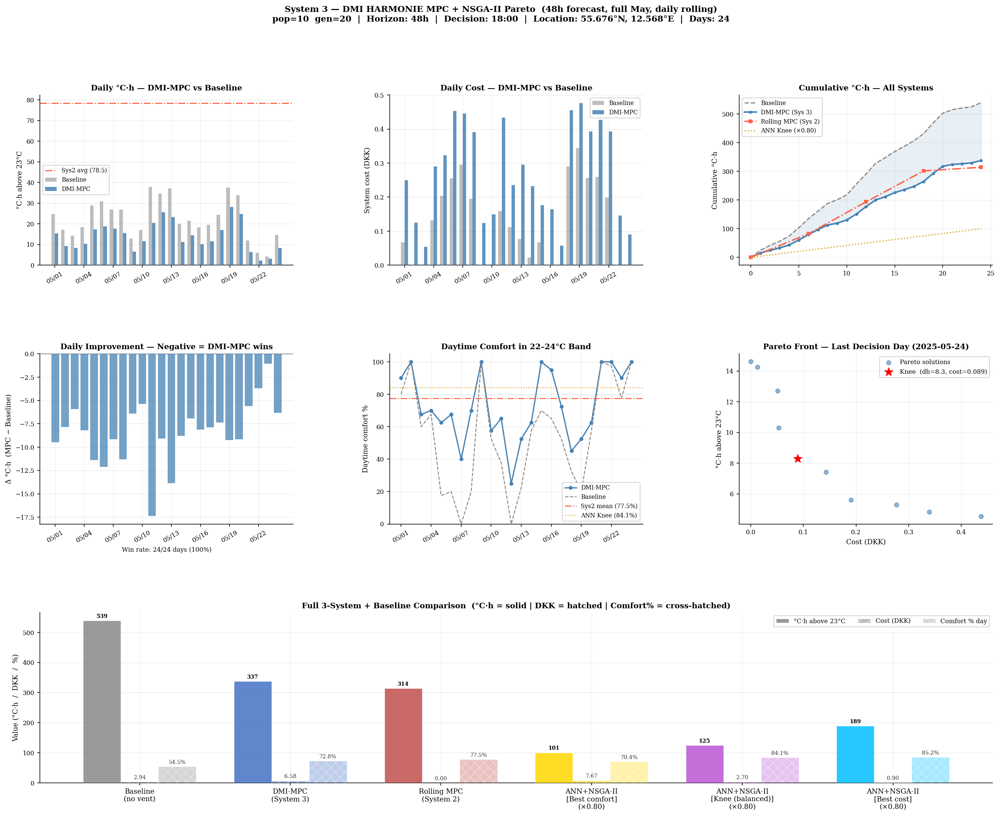


  Dashboard saved → s3_dmi_mpc_dashboard.png


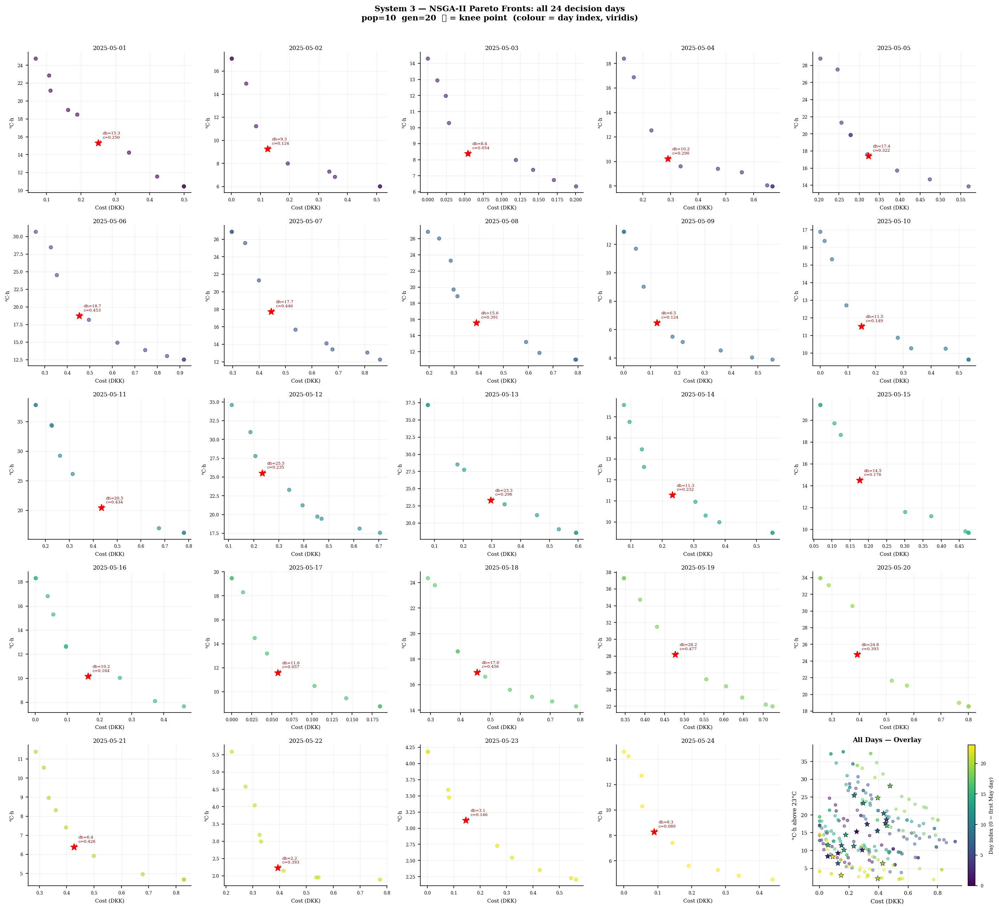

  Pareto-all-days plot saved → s3_pareto_all_days.png

════════════════════════════════════════════════════════════════════════════════
  SYSTEM 3 — DMI HARMONIE MPC + NSGA-II  (24 decision days)
════════════════════════════════════════════════════════════════════════════════
  System                                 °C·h         DKK     Day%     Δ°C·h
  ──────────────────────────────────────────────────────────────────────
  Baseline (no night vent)             539.29      2.9369    54.5%         —
  DMI-MPC (System 3) NSGA-II           337.49      6.5766    72.8%    -201.8
  Rolling MPC (System 2)               313.99      0.0000    77.5%    -225.3
  ANN+NSGA-II [Best comfort] (×0.80)     100.62      7.6688    70.4%    -438.7
  ANN+NSGA-II [Knee (balanced)] (×0.80)     124.82      2.7000    84.1%    -414.5
  ANN+NSGA-II [Best cost] (×0.80)      189.25      0.8975    85.2%    -350.0
  ──────────────────────────────────────────────────────────────────────
  Thermal improvement vs Baseli

In [88]:
# ════════════════════════════════════════════════════════════════════════════
#  SYSTEM 3 — DMI HARMONIE MPC  (48h forecast, daily rolling, NSGA-II Pareto)
#  Same Pareto + knee-point mechanism as Rolling MPC (System 2)
#  Decision variables per day: start_h, stop_h, qv_night  (same 3-var space)
#  Forecast used to: (1) gate eligible hours, (2) set Ta for Tsup during vent
# ════════════════════════════════════════════════════════════════════════════


import numpy as np
import pandas as pd
import requests
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.dates as mdates
from joblib import Parallel, delayed
from pymoo.core.problem import Problem
from pymoo.algorithms.moo.nsga2 import NSGA2
from pymoo.optimize import minimize as pymoo_minimize
from pymoo.termination import get_termination
from datetime import date as _date



# ── CONFIG ────────────────────────────────────────────────────────────────────
S3_LAT               = 55.676
S3_LON               = 12.568
S3_HORIZON_H         = 48
S3_DECISION_HOUR     = 18
S3_APPLY_H           = 24
S3_OM_MODEL          = "dmi_harmonie_arome_europe"
S3_MIN_FORECAST_ROWS = S3_HORIZON_H // 2


# NSGA-II settings (same as System 2)
S3_POP  = 10
S3_GEN  = 20
S3_SEED = MPC_SEED



# ── OCC_START / OCC_END fallback ─────────────────────────────────────────────
try:
    _ = OCC_START, OCC_END
except NameError:
    OCC_START, OCC_END = 8, 18
    print("  ℹ OCC_START/OCC_END not found — defaulting to 8h–18h")



_P_ELEC_MEAN = float(np.nanmean(np.asarray(price_series, dtype=float)))
print(f"  Mean electricity price for S3 objective: {_P_ELEC_MEAN:.4f} DKK/kWh")



# ── Reuse patched helpers from System 2 (already defined) ────────────────────
# _patched_cost, _patched_breakdown, _patched_free, _cost_with_slices
# _knee_point, _eval_candidate, NightVentWeekProblem  ← all reused directly



# ════════════════════════════════════════════════════════════════════════════
#  FETCH DMI HARMONIE FORECAST
#  FIX: removed _morning_is_weekday — no weekday filter, matches System 2
#  FIX: is_night now covers from S3_DECISION_HOUR onward (not just >= 20)
# ════════════════════════════════════════════════════════════════════════════
def fetch_dmi_forecast(lat, lon, decision_ts, horizon_h=S3_HORIZON_H,
                       model=S3_OM_MODEL):
    start_date = decision_ts.strftime("%Y-%m-%d")
    end_date   = (decision_ts + pd.Timedelta(hours=horizon_h + 24)).strftime("%Y-%m-%d")
    url    = "https://historical-forecast-api.open-meteo.com/v1/forecast"
    params = {
        "latitude" : lat, "longitude": lon,
        "start_date": start_date, "end_date": end_date,
        "hourly"   : ["temperature_2m", "shortwave_radiation",
                      "direct_radiation", "diffuse_radiation"],
        "models"   : model, "timezone": "UTC",
    }
    resp = requests.get(url, params=params, timeout=30)
    resp.raise_for_status()
    h = resp.json()["hourly"]

    df = pd.DataFrame({
        "timestamp"  : pd.to_datetime(h["time"]).tz_localize(None),
        "T_ext"      : np.asarray(h["temperature_2m"],     dtype=float),
        "rad_global" : np.asarray(h["shortwave_radiation"], dtype=float),
        "rad_direct" : np.asarray(h["direct_radiation"],   dtype=float),
        "rad_diffuse": np.asarray(h["diffuse_radiation"],  dtype=float),
    })
    t0 = decision_ts
    t1 = decision_ts + pd.Timedelta(hours=horizon_h)
    df = df[(df["timestamp"] >= t0) & (df["timestamp"] < t1)].reset_index(drop=True)

    hrs = df["timestamp"].dt.hour + df["timestamp"].dt.minute / 60.0

    # FIX 1: is_night covers from decision hour onward (18:00+) OR before 8:00
    #         — matches the actual apply window start, same logic as System 2
    df["is_night"]      = (hrs >= S3_DECISION_HOUR) | (hrs < 8)
    df["is_occ"]        = (hrs >= OCC_START) & (hrs < OCC_END)

    # FIX 2: vent_eligible = time window only, no ta_ok, no weekday filter
    #         — identical to how System 2 builds its night mask
    df["vent_eligible"] = df["is_night"]

    return df



# ════════════════════════════════════════════════════════════════════════════
#  FORECAST-AWARE CANDIDATE EVALUATOR
# ════════════════════════════════════════════════════════════════════════════
def _eval_candidate_s3(xi, idx_hours, qv_base, Tsup_base,
                        Ta_w_forecast,
                        Ta_w_actual,
                        vent_eligible,
                        X_week_cols, idx_week_ns, N_profile_w,
                        Ti_init, Tm_init, c_init,
                        price_slice, nighttime_slice, cop_slice):
    start_h = float(xi[0])
    stop_h  = float(xi[1])
    qv_n    = float(xi[2])

    hour_mask = (idx_hours >= start_h) | (idx_hours < stop_h)
    combined  = hour_mask & vent_eligible

    qv_w      = qv_base.copy()
    Tsup_w    = Tsup_base.copy()
    qv_w[combined]   = qv_n
    Tsup_w[combined] = Ta_w_forecast[combined]
    qv_w[hour_mask & ~vent_eligible] = 0.0

    idx_week = pd.DatetimeIndex(idx_week_ns)
    X_mod = pd.DataFrame(X_week_cols, index=idx_week)
    X_mod['qv']   = qv_w
    X_mod['Tsup'] = Tsup_w

    res = simulate_night_vent_scenario(
        fitted_params, X_mod, N_profile_w,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_w = np.asarray(res['Ti'])
    dh_w, _ = dh_from_target(Ti_w)

    cost_w = _cost_with_slices(qv_w, Ta_w_actual, Tsup_w,
                                price_slice, nighttime_slice, cop_slice)
    return dh_w, cost_w



# ════════════════════════════════════════════════════════════════════════════
#  PYMOO PROBLEM — S3 variant (forecast-aware)
# ════════════════════════════════════════════════════════════════════════════
class NightVentS3Problem(Problem):
    def __init__(self, idx_week, X_week_base,
                 Ta_forecast,
                 vent_eligible,
                 Ti_init_w, Tm_init_w, c_init_w,
                 N_profile_w, ws, we, n_jobs=-1):
        super().__init__(n_var=3, n_obj=2, n_ieq_constr=0,
                         xl=MPC_LB, xu=MPC_UB)
        gb = globals()
        self.idx_hours     = np.array([t.hour + t.minute/60.0 for t in idx_week])
        self.qv_base       = np.asarray(X_week_base['qv'],   dtype=float)
        self.Tsup_base     = np.asarray(X_week_base['Tsup'], dtype=float)
        self.Ta_w_actual   = np.asarray(X_week_base['Ta'],   dtype=float)
        self.Ta_w_forecast = np.asarray(Ta_forecast,          dtype=float)
        self.vent_eligible = np.asarray(vent_eligible,         dtype=bool)
        self.X_week_cols   = {c: np.asarray(X_week_base[c])
                              for c in X_week_base.columns
                              if c not in ('qv', 'Tsup')}
        self.idx_week_ns   = idx_week.asi8
        self.N_profile_w   = N_profile_w
        self.Ti_init_w     = Ti_init_w
        self.Tm_init_w     = Tm_init_w
        self.c_init_w      = c_init_w
        self.n_jobs        = n_jobs

        def _get_slice(name):
            if name in gb:
                arr = np.asarray(gb[name])
                if arr.ndim >= 1 and len(arr) > (we - ws):
                    return arr[ws:we]
            return None

        self.price_slice     = _get_slice('price_series')
        self.nighttime_slice = _get_slice('nighttime_mask')
        self.cop_slice       = _get_slice('cop_arr')
        self._ws = ws
        self._we = we

    def _evaluate(self, x, out, *args, **kwargs):
        results = Parallel(n_jobs=self.n_jobs, backend='loky')(
            delayed(_eval_candidate_s3)(
                xi,
                self.idx_hours,
                self.qv_base, self.Tsup_base,
                self.Ta_w_forecast,
                self.Ta_w_actual,
                self.vent_eligible,
                self.X_week_cols, self.idx_week_ns, self.N_profile_w,
                self.Ti_init_w, self.Tm_init_w, self.c_init_w,
                self.price_slice, self.nighttime_slice, self.cop_slice)
            for xi in x)
        out['F'] = np.array(results)



# ════════════════════════════════════════════════════════════════════════════
#  HELPERS — state pre-computation + naive index
# ════════════════════════════════════════════════════════════════════════════
def _naive(idx):
    idx = pd.DatetimeIndex(idx)
    if idx.tz is not None:
        return idx.tz_localize(None)
    return pd.DatetimeIndex([
        t.replace(tzinfo=None) if getattr(t, 'tzinfo', None) else t
        for t in idx])


def _precompute_state_s3(verbose=True):
    if verbose:
        print(f"  Pre-computing building state on extended dataset "
              f"({len(X_train_ext)} steps = April tail + May)…")
    res = simulate_night_vent_scenario(
        fitted_params, X_train_ext, N_hist_ext,
        night_start_hour=0, night_stop_hour=0, qv_night=0,
        rec_duration=rec_duration,
        Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
    Ti_s  = np.asarray(res['Ti'],  dtype=float)
    Tm_s  = np.asarray(res.get('Tm', [Tm_init] * len(X_train_ext)), dtype=float)
    c_s   = np.asarray(res.get('c',  [c_init]  * len(X_train_ext)), dtype=float)
    if verbose:
        print(f"    Ti_ext ∈ [{Ti_s.min():.1f}, {Ti_s.max():.1f}]°C  "
              f"over {len(Ti_s)} steps")
    return Ti_s, Tm_s, c_s



# ════════════════════════════════════════════════════════════════════════════
#  FORECAST → apply-window alignment helper
# ════════════════════════════════════════════════════════════════════════════
def _align_forecast_to_window(df_fc, apply_idx):
    fc_tmp = pd.DataFrame({
        "timestamp"    : df_fc["timestamp"],
        "T_ext"        : df_fc["T_ext"].values,
        "vent_eligible": df_fc["vent_eligible"].values.astype(float),
    })
    win_tmp = pd.DataFrame({"timestamp": pd.DatetimeIndex(apply_idx)})
    merged  = pd.merge_asof(
        win_tmp.sort_values("timestamp"),
        fc_tmp.sort_values("timestamp"),
        on="timestamp", direction="nearest",
        tolerance=pd.Timedelta("1h"))
    Ta_aligned   = merged["T_ext"].fillna(
        float(X_train["Ta"].mean())).values.astype(float)
    elig_aligned = merged["vent_eligible"].fillna(0.0).values.astype(bool)
    return Ta_aligned, elig_aligned



# ════════════════════════════════════════════════════════════════════════════
#  MAIN CLASS — System3_DMI  (NSGA-II Pareto version)
# ════════════════════════════════════════════════════════════════════════════
class System3_DMI:

    def __init__(self, lat=S3_LAT, lon=S3_LON, horizon_h=S3_HORIZON_H,
                 apply_h=S3_APPLY_H, decision_hour=S3_DECISION_HOUR,
                 pop=S3_POP, gen=S3_GEN, seed=S3_SEED, n_jobs=-1):
        self.lat           = lat
        self.lon           = lon
        self.horizon_h     = horizon_h
        self.apply_h       = apply_h
        self.decision_hour = decision_hour
        self.pop           = pop
        self.gen           = gen
        self.seed          = seed
        self.n_jobs        = n_jobs
        self.days          = []
        self._state_Ti     = None
        self._state_Tm     = None
        self._state_c      = None


    # ── Main loop ─────────────────────────────────────────────────────────
    def run(self, verbose=True):
        import time
        self.days = []

        idx_may = _naive(index)
        idx_ext = _naive(index_ext)

        self._state_Ti, self._state_Tm, self._state_c = \
            _precompute_state_s3(verbose)

        n_ctx = int(MPC_LOOKBACK_DAYS * 24 / rec_duration)

        decision_times = [
            t for t in idx_may
            if t.hour == self.decision_hour and t.minute == 0
        ]

        if verbose:
            print(f"\n{'═'*72}")
            print(f"  SYSTEM 3 — DMI HARMONIE MPC  "
                  f"(48h forecast, daily NSGA-II @ {self.decision_hour}:00)")
            print(f"  pop={self.pop}  gen={self.gen}  n_jobs={self.n_jobs}")
            print(f"  Location: {self.lat}°N, {self.lon}°E")
            print(f"  Context window: {MPC_LOOKBACK_DAYS} days ({n_ctx} steps) "
                  f"from April tail")
            print(f"  May decision points: {len(decision_times)}  "
                  f"({idx_may[0].date()} → {idx_may[-1].date()})")
            print(f"{'═'*72}")

        for dec_t in decision_times:
            pos_in_may = int(np.searchsorted(idx_may, dec_t))
            if pos_in_may >= len(idx_may) - 4:
                continue

            pos_ext = int(np.searchsorted(idx_ext, dec_t))
            p       = max(0, min(pos_ext, len(self._state_Ti) - 1))
            Ti_0    = float(self._state_Ti[p])
            Tm_0    = float(self._state_Tm[p])
            c_0     = float(self._state_c[p])

            if verbose:
                print(f"\n  {dec_t.strftime('%Y-%m-%d')} {self.decision_hour:02d}:00"
                      f"  (ext_pos={pos_ext}, Ti={Ti_0:.1f}°C)"
                      f"  → fetching DMI HARMONIE forecast…")

            # ── Fetch forecast ────────────────────────────────────────────
            try:
                df_fc = fetch_dmi_forecast(
                    self.lat, self.lon, dec_t, self.horizon_h)
            except Exception as e:
                if verbose:
                    print(f"    ⚠ Fetch failed: {e}  → skipping")
                continue

            if len(df_fc) < S3_MIN_FORECAST_ROWS:
                if verbose:
                    print(f"    ⚠ Too few forecast rows ({len(df_fc)}) → skipping")
                continue

            elig_count = int(df_fc["vent_eligible"].sum())
            if verbose:
                print(f"    {len(df_fc)} rows  |  eligible: {elig_count}  |  "
                      f"Ta: {df_fc['T_ext'].min():.1f}–"
                      f"{df_fc['T_ext'].max():.1f}°C")

            # ── Build apply window ────────────────────────────────────────
            apply_end_t = dec_t + pd.Timedelta(hours=self.apply_h)
            apply_mask  = ((idx_may >= dec_t) & (idx_may < apply_end_t))
            if apply_mask.sum() < 4:
                continue

            apply_idx = idx_may[apply_mask]
            ws        = int(np.searchsorted(idx_may, dec_t))
            we        = ws + int(apply_mask.sum())

            X_week_base = X_train.loc[apply_mask].copy()
            X_week_base.index = apply_idx
            N_profile_w = np.asarray(N_hist, dtype=float)[apply_mask]

            Ta_forecast, elig_aligned = _align_forecast_to_window(
                df_fc, apply_idx)

            # ── NSGA-II Pareto search ─────────────────────────────────────
            t0 = time.time()
            try:
                problem = NightVentS3Problem(
                    idx_week      = pd.DatetimeIndex(apply_idx),
                    X_week_base   = X_week_base,
                    Ta_forecast   = Ta_forecast,
                    vent_eligible = elig_aligned,
                    Ti_init_w     = Ti_0,
                    Tm_init_w     = Tm_0,
                    c_init_w      = c_0,
                    N_profile_w   = N_profile_w,
                    ws=ws, we=we,
                    n_jobs=self.n_jobs)

                algorithm   = NSGA2(pop_size=self.pop)
                termination = get_termination('n_gen', self.gen)
                result      = pymoo_minimize(
                    problem, algorithm, termination,
                    seed=self.seed, verbose=False)

            except Exception as e:
                if verbose:
                    print(f"    ⚠ NSGA-II failed: {e}  → skipping")
                continue

            elapsed = time.time() - t0
            F_w = result.F
            X_w = result.X

            # ── Knee point ────────────────────────────────────────────────
            k       = _knee_point(F_w)
            x_k     = X_w[k]
            start_h = float(x_k[0])
            stop_h  = float(x_k[1])
            qv_n    = float(x_k[2])

            if verbose:
                print(f"    Pareto front: {len(F_w)} pts  |  "
                      f"knee: start={start_h:.1f}h  stop={stop_h:.1f}h  "
                      f"qv={qv_n:.0f}  dh={F_w[k,0]:.1f}  "
                      f"cost={F_w[k,1]:.4f}  [{elapsed:.0f}s]")

            # ── Execute knee schedule ─────────────────────────────────────
            idx_hours  = np.array([t.hour + t.minute/60.0 for t in apply_idx])
            hour_mask  = (idx_hours >= start_h) | (idx_hours < stop_h)
            combined   = hour_mask & elig_aligned

            qv_apply   = np.asarray(X_week_base['qv'],   dtype=float).copy()
            Tsup_apply = np.asarray(X_week_base['Tsup'], dtype=float).copy()
            Ta_act     = np.asarray(X_week_base['Ta'],   dtype=float)

            qv_apply[combined]                  = qv_n
            qv_apply[hour_mask & ~elig_aligned] = 0.0
            Tsup_apply[combined]                = Ta_forecast[combined]

            X_apply         = X_week_base.copy()
            X_apply['qv']   = qv_apply
            X_apply['Tsup'] = Tsup_apply

            try:
                res_app = simulate_night_vent_scenario(
                    fitted_params, X_apply, N_profile_w,
                    night_start_hour=0, night_stop_hour=0, qv_night=0,
                    rec_duration=rec_duration,
                    Ti_init=Ti_0, Tm_init=Tm_0, c_init=c_0)
                Ti_app = np.asarray(res_app['Ti'], dtype=float)
            except Exception as e:
                if verbose:
                    print(f"    ⚠ RC apply sim failed: {e}  → skipping")
                continue

            h_app       = idx_hours
            occ_app     = (h_app >= OCC_START) & (h_app < OCC_END)
            ngt_app     = (h_app >= 20) | (h_app < 8)

            dh_app, _   = dh_from_target(Ti_app)
            cost_app    = _patched_cost(qv_apply, Ta_act, Tsup_apply, ws, we)
            free_app    = _patched_free(qv_apply, Ta_act, ws, we)
            pct_occ_app = pct_in_band(Ti_app, T_cat1_min, T_cat1_max, occ_app)
            pct_ngt_app = pct_in_band(Ti_app, T_cat1_min, T_cat1_max, ngt_app)

            # ── Baseline (no night vent) ──────────────────────────────────
            X_bl         = X_week_base.copy()
            qv_bl        = qv_apply.copy()
            qv_bl[ngt_app] = 0.0
            X_bl['qv']   = qv_bl
            X_bl['Tsup'] = np.asarray(X_week_base['Tsup'], dtype=float)
            try:
                res_bl   = simulate_night_vent_scenario(
                    fitted_params, X_bl, N_profile_w,
                    night_start_hour=0, night_stop_hour=0, qv_night=0,
                    rec_duration=rec_duration,
                    Ti_init=Ti_0, Tm_init=Tm_0, c_init=c_0)
                Ti_bl    = np.asarray(res_bl['Ti'], dtype=float)
                dh_bl, _ = dh_from_target(Ti_bl)
                cost_bl  = _patched_cost(qv_bl, Ta_act,
                                         np.asarray(X_bl['Tsup'], dtype=float),
                                         ws, we)
                pct_bl   = pct_in_band(Ti_bl, T_cat1_min, T_cat1_max, occ_app)
            except Exception:
                dh_bl, cost_bl, pct_bl = np.nan, np.nan, np.nan
                Ti_bl = np.full_like(Ti_app, np.nan)

            if verbose:
                print(f"    → DMI-MPC : {dh_app:.2f} °C·h  |  "
                      f"{cost_app:.4f} DKK  |  "
                      f"{pct_occ_app:.1f}% day  |  "
                      f"Δdh vs bl = {dh_app - dh_bl:+.2f}")

            self.days.append(dict(
                date       = dec_t.date(),
                dec_ts     = dec_t,
                dh_mpc     = dh_app,
                cost_mpc   = cost_app,
                free_mpc   = free_app,
                pct_occ    = pct_occ_app,
                pct_night  = pct_ngt_app,
                dh_base    = dh_bl,
                cost_base  = cost_bl,
                pct_base   = pct_bl,
                delta_dh   = dh_app  - dh_bl,
                delta_cost = cost_app - cost_bl,
                Ti_app     = Ti_app,
                Ti_bl      = Ti_bl,
                qv_app     = qv_apply,
                apply_idx  = apply_idx,
                elig_count = elig_count,
                start_h    = start_h,
                stop_h     = stop_h,
                qv_night   = qv_n,
                n_pareto   = len(F_w),
                F_pareto   = F_w,
                X_pareto   = X_w,
                elapsed_s  = elapsed,
            ))

        if verbose:
            print(f"\n{'═'*72}")
        self.print_summary()
        return self


    # ── Aggregation ───────────────────────────────────────────────────────
    def _totals(self):
        if not self.days:
            return {}
        return dict(
            n_days    = len(self.days),
            dh_mpc    = sum(d['dh_mpc']    for d in self.days),
            cost_mpc  = sum(d['cost_mpc']  for d in self.days),
            free_mpc  = sum(d['free_mpc']  for d in self.days),
            pct_occ   = float(np.nanmean([d['pct_occ']   for d in self.days])),
            pct_night = float(np.nanmean([d['pct_night'] for d in self.days])),
            dh_base   = sum(d['dh_base']   for d in self.days),
            cost_base = sum(d['cost_base'] for d in self.days),
        )

    def results_df(self):
        skip = {"Ti_app", "Ti_bl", "qv_app", "apply_idx",
                "F_pareto", "X_pareto"}
        return pd.DataFrame([{k: v for k, v in d.items() if k not in skip}
                              for d in self.days])


    # ── Print summary ─────────────────────────────────────────────────────
    def print_summary(self, mpc_weeks=None, verified_dict=None):
        t = self._totals()
        if not t:
            print("  No results — run() first.")
            return
        n = t['n_days']
        print(f"\n{'═'*80}")
        print(f"  SYSTEM 3 — DMI HARMONIE MPC + NSGA-II  ({n} decision days)")
        print(f"{'═'*80}")
        print(f"  {'System':<32} {'°C·h':>10}  {'DKK':>10}  {'Day%':>7}  {'Δ°C·h':>8}")
        print(f"  {'─'*70}")

        def _row(label, dh, cost, pct, ref=None):
            delta = f"{dh - ref:+.1f}" if ref is not None else "—"
            print(f"  {label:<32} {dh:>10.2f}  {cost:>10.4f}  "
                  f"{pct:>6.1f}%  {delta:>8}")

        _row("Baseline (no night vent)",
             t['dh_base'], t['cost_base'],
             float(np.nanmean([d['pct_base'] for d in self.days])))
        _row("DMI-MPC (System 3) NSGA-II",
             t['dh_mpc'], t['cost_mpc'], t['pct_occ'], ref=t['dh_base'])

        if mpc_weeks:
            s2_dh   = sum(w['dh_mpc']   for w in mpc_weeks)
            s2_cost = sum(w['cost_mpc'] for w in mpc_weeks)
            s2_pct  = float(np.nanmean([w.get('pct_occ_mpc',
                            w.get('pct_occ', 0.0)) for w in mpc_weeks]))
            _row("Rolling MPC (System 2)", s2_dh, s2_cost, s2_pct,
                 ref=t['dh_base'])

        if verified_dict:
            scale = n / 30.0
            for lbl, data in verified_dict.items():
                _row(f"ANN+NSGA-II [{lbl}] (×{scale:.2f})",
                     data['dh_above'] * scale, data['cost'] * scale,
                     data['pct_occ'], ref=t['dh_base'])

        print(f"  {'─'*70}")
        imp = (t['dh_base'] - t['dh_mpc']) / max(t['dh_base'], 1e-9) * 100
        print(f"  Thermal improvement vs Baseline: {imp:+.1f}%  "
              f"Δcost: {t['cost_mpc'] - t['cost_base']:+.4f} DKK")
        avg_pareto = float(np.mean([d['n_pareto'] for d in self.days]))
        avg_time   = float(np.mean([d['elapsed_s'] for d in self.days]))
        total_time = float(np.sum( [d['elapsed_s'] for d in self.days]))
        print(f"  Avg Pareto front size: {avg_pareto:.1f} pts  |  "
              f"Avg time/day: {avg_time:.0f}s  |  Total: {total_time:.0f}s")
        print(f"{'═'*80}")


    # ── Dashboard ─────────────────────────────────────────────────────────
    def plot_dashboard(self, mpc_weeks=None, verified_dict=None,
                       save_path="s3_dmi_mpc_dashboard.png", dpi=150):
        if not self.days:
            print("  No results — run() first.")
            return

        t     = self._totals()
        dates = [d['date']     for d in self.days]
        dh_m  = np.array([d['dh_mpc']   for d in self.days])
        dh_b  = np.array([d['dh_base']  for d in self.days])
        c_m   = np.array([d['cost_mpc'] for d in self.days])
        c_b   = np.array([d['cost_base']for d in self.days])
        pct_m = np.array([d['pct_occ']  for d in self.days])
        n     = len(dates)
        x     = np.arange(n)
        xl    = [d.strftime("%m/%d") for d in dates]
        step  = max(1, n // 8)

        fig = plt.figure(figsize=(22, 16))
        gs  = gridspec.GridSpec(3, 3, figure=fig, hspace=0.52, wspace=0.38)
        fig.suptitle(
            "System 3 — DMI HARMONIE MPC + NSGA-II Pareto  "
            "(48h forecast, full May, daily rolling)\n"
            f"pop={self.pop}  gen={self.gen}  |  "
            f"Horizon: {self.horizon_h}h  |  Decision: {self.decision_hour}:00  |  "
            f"Location: {self.lat}°N, {self.lon}°E  |  Days: {n}",
            fontsize=11, fontweight='bold')

        bw = 0.35

        # ax0: daily °C·h
        ax0 = fig.add_subplot(gs[0, 0])
        ax0.bar(x - bw/2, dh_b, width=bw, color='#888',
                alpha=0.55, label='Baseline', zorder=3)
        ax0.bar(x + bw/2, dh_m, width=bw, color='steelblue',
                alpha=0.85, label='DMI-MPC', zorder=3)
        if mpc_weeks:
            s2_avg = sum(w['dh_mpc'] for w in mpc_weeks) / max(len(mpc_weeks), 1)
            ax0.axhline(s2_avg, color='tomato', lw=1.4, ls='-.',
                        label=f'Sys2 avg ({s2_avg:.1f})')
        ax0.set_xticks(x[::step])
        ax0.set_xticklabels([xl[i] for i in range(0, n, step)],
                            fontsize=8, rotation=30)
        ax0.set_ylabel('°C·h above 23°C', fontsize=9)
        ax0.set_title('Daily °C·h — DMI-MPC vs Baseline',
                      fontsize=10, fontweight='bold')
        ax0.legend(fontsize=7.5)
        ax0.yaxis.grid(True, alpha=0.35); ax0.set_axisbelow(True)

        # ax1: daily cost
        ax1 = fig.add_subplot(gs[0, 1])
        ax1.bar(x - bw/2, c_b, width=bw, color='#888',
                alpha=0.55, label='Baseline', zorder=3)
        ax1.bar(x + bw/2, c_m, width=bw, color='steelblue',
                alpha=0.85, label='DMI-MPC', zorder=3)
        ax1.set_xticks(x[::step])
        ax1.set_xticklabels([xl[i] for i in range(0, n, step)],
                            fontsize=8, rotation=30)
        ax1.set_ylabel('System cost (DKK)', fontsize=9)
        ax1.set_title('Daily Cost — DMI-MPC vs Baseline',
                      fontsize=10, fontweight='bold')
        ax1.legend(fontsize=7.5)
        ax1.yaxis.grid(True, alpha=0.35); ax1.set_axisbelow(True)

        # ax2: cumulative °C·h
        ax2 = fig.add_subplot(gs[0, 2])
        cum_m = np.concatenate([[0], np.cumsum(dh_m)])
        cum_b = np.concatenate([[0], np.cumsum(dh_b)])
        xc    = np.arange(len(cum_m))
        ax2.plot(xc, cum_b, color='#888', lw=1.5, ls='--', label='Baseline')
        ax2.plot(xc, cum_m, color='steelblue', lw=2.0, marker='o', ms=3,
                 label='DMI-MPC (Sys 3)')
        ax2.fill_between(xc, cum_m, cum_b, where=cum_m < cum_b,
                         alpha=0.12, color='steelblue')
        if mpc_weeks:
            s2_cum = np.concatenate([[0],
                np.cumsum([w['dh_mpc'] for w in mpc_weeks])])
            xs2 = np.linspace(0, len(xc) - 1, len(s2_cum))
            ax2.plot(xs2, s2_cum, color='tomato', lw=1.8, ls='-.', marker='s',
                     ms=4, label='Rolling MPC (Sys 2)')
        if verified_dict:
            scale   = n / 30.0
            knee    = verified_dict.get('Knee (balanced)',
                      list(verified_dict.values())[0])
            ann_cum = [knee['dh_above'] / 30.0 * i * scale for i in range(len(xc))]
            ax2.plot(xc, ann_cum, color='goldenrod', lw=1.5, ls=':',
                     label=f'ANN Knee (×{scale:.2f})')
        ax2.set_ylabel('Cumulative °C·h', fontsize=9)
        ax2.set_title('Cumulative °C·h — All Systems',
                      fontsize=10, fontweight='bold')
        ax2.legend(fontsize=7.5); ax2.grid(alpha=0.3)

        # ax3: daily Δ°C·h
        ax3 = fig.add_subplot(gs[1, 0])
        delta = dh_m - dh_b
        cols3 = ['steelblue' if v <= 0 else 'tomato' for v in delta]
        ax3.bar(x, delta, color=cols3, alpha=0.75, zorder=3)
        ax3.axhline(0, color='black', lw=0.7, alpha=0.7)
        ax3.set_xticks(x[::step])
        ax3.set_xticklabels([xl[i] for i in range(0, n, step)],
                            fontsize=8, rotation=30)
        ax3.set_ylabel('Δ °C·h  (MPC − Baseline)', fontsize=9)
        ax3.set_title('Daily Improvement — Negative = DMI-MPC wins',
                      fontsize=10, fontweight='bold')
        wins = int((delta <= 0).sum())
        ax3.set_xlabel(f"Win rate: {wins}/{n} days ({wins/n*100:.0f}%)",
                       fontsize=8)
        ax3.yaxis.grid(True, alpha=0.35); ax3.set_axisbelow(True)

        # ax4: daytime comfort
        ax4 = fig.add_subplot(gs[1, 1])
        ax4.plot(x, pct_m, color='steelblue', lw=1.6, marker='o', ms=4,
                 label='DMI-MPC')
        ax4.plot(x, [d['pct_base'] for d in self.days],
                 color='#888', lw=1.2, ls='--', label='Baseline')
        if mpc_weeks:
            s2_pct_list = [w.get('pct_occ_mpc', w.get('pct_occ', 50.0))
                           for w in mpc_weeks]
            ax4.axhline(float(np.nanmean(s2_pct_list)), color='tomato',
                        lw=1.3, ls='-.',
                        label=f'Sys2 mean ({np.nanmean(s2_pct_list):.1f}%)')
        if verified_dict:
            knee = verified_dict.get('Knee (balanced)',
                   list(verified_dict.values())[0])
            ax4.axhline(knee['pct_occ'], color='goldenrod', lw=1.2, ls=':',
                        label=f'ANN Knee ({knee["pct_occ"]:.1f}%)')
        ax4.set_xticks(x[::step])
        ax4.set_xticklabels([xl[i] for i in range(0, n, step)],
                            fontsize=8, rotation=30)
        ax4.set_ylabel('Daytime comfort %', fontsize=9)
        ax4.set_title('Daytime Comfort in 22–24°C Band',
                      fontsize=10, fontweight='bold')
        ax4.legend(fontsize=7.5); ax4.grid(alpha=0.3); ax4.set_ylim(0, 105)

        # ax5: Pareto front scatter (last day)
        ax5 = fig.add_subplot(gs[1, 2])
        F_last = self.days[-1]['F_pareto']
        k_last = _knee_point(F_last)
        ax5.scatter(F_last[:, 1], F_last[:, 0], s=30, c='steelblue',
                    alpha=0.6, zorder=3, label='Pareto solutions')
        ax5.scatter(F_last[k_last, 1], F_last[k_last, 0],
                    s=120, c='red', marker='*', zorder=5,
                    label=f'Knee  (dh={F_last[k_last,0]:.1f}, '
                          f'cost={F_last[k_last,1]:.3f})')
        ax5.set_xlabel('Cost (DKK)', fontsize=9)
        ax5.set_ylabel('°C·h above 23°C', fontsize=9)
        ax5.set_title(f'Pareto Front — Last Decision Day '
                      f'({self.days[-1]["date"]})',
                      fontsize=10, fontweight='bold')
        ax5.legend(fontsize=8); ax5.grid(alpha=0.3)

        # ax6: full comparison bar
        ax6 = fig.add_subplot(gs[2, :])
        sys_labels = ['Baseline\n(no vent)', 'DMI-MPC\n(System 3)']
        dh_bars    = [t['dh_base'],   t['dh_mpc']]
        cost_bars  = [t['cost_base'], t['cost_mpc']]
        pct_bars   = [float(np.nanmean([d['pct_base'] for d in self.days])),
                      t['pct_occ']]
        bar_colors = ['#888888', '#4472C4']

        if mpc_weeks:
            sys_labels.append('Rolling MPC\n(System 2)')
            dh_bars.append(sum(w['dh_mpc']    for w in mpc_weeks))
            cost_bars.append(sum(w['cost_mpc'] for w in mpc_weeks))
            pct_bars.append(float(np.nanmean(
                [w.get('pct_occ_mpc', w.get('pct_occ', 50.0))
                 for w in mpc_weeks])))
            bar_colors.append('#C0504D')

        if verified_dict:
            scale = n / 30.0
            for lbl, data in verified_dict.items():
                sys_labels.append(f'ANN+NSGA-II\n[{lbl}]\n(×{scale:.2f})')
                dh_bars.append(data['dh_above'] * scale)
                cost_bars.append(data['cost']   * scale)
                pct_bars.append(data['pct_occ'])
                bar_colors.append(data.get('color', 'goldenrod'))

        xb  = np.arange(len(sys_labels))
        bw6 = 0.25
        b1 = ax6.bar(xb - bw6, dh_bars,  width=bw6, color=bar_colors,
                     alpha=0.85, edgecolor='white', lw=0.5,
                     label='°C·h above 23°C', zorder=3)
        b2 = ax6.bar(xb,       cost_bars, width=bw6, color=bar_colors,
                     alpha=0.55, edgecolor='white', lw=0.5,
                     label='Cost (DKK)', zorder=3, hatch='//')
        b3 = ax6.bar(xb + bw6, pct_bars,  width=bw6, color=bar_colors,
                     alpha=0.35, edgecolor='white', lw=0.5,
                     label='Comfort % day', zorder=3, hatch='xx')

        for bar, val in zip(b1, dh_bars):
            ax6.text(bar.get_x() + bar.get_width()/2,
                     bar.get_height() + max(dh_bars) * 0.01,
                     f'{val:.0f}', ha='center', va='bottom',
                     fontsize=7, fontweight='600')
        for bar, val in zip(b2, cost_bars):
            ax6.text(bar.get_x() + bar.get_width()/2,
                     bar.get_height() + max(dh_bars) * 0.01,
                     f'{val:.2f}', ha='center', va='bottom',
                     fontsize=7, color='#333')
        for bar, val in zip(b3, pct_bars):
            ax6.text(bar.get_x() + bar.get_width()/2,
                     bar.get_height() + max(dh_bars) * 0.01,
                     f'{val:.1f}%', ha='center', va='bottom',
                     fontsize=7, color='#333')

        ax6.set_xticks(xb)
        ax6.set_xticklabels(sys_labels, fontsize=9)
        ax6.set_ylabel('Value (°C·h  /  DKK  /  %)', fontsize=9)
        ax6.set_title(
            'Full 3-System + Baseline Comparison  '
            '(°C·h = solid | DKK = hatched | Comfort% = cross-hatched)',
            fontsize=10, fontweight='bold')
        ax6.legend(fontsize=8, ncol=3)
        ax6.yaxis.grid(True, alpha=0.35); ax6.set_axisbelow(True)

        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
        plt.show()
        print(f"\n  Dashboard saved → {save_path}")
        return fig


    # ── All Pareto fronts — one panel per day + overlay ───────────────────
    def plot_all_pareto_fronts(self, save_path="s3_pareto_all_days.png", dpi=150):
        if not self.days:
            print("  No results — run() first.")
            return

        n      = len(self.days)
        n_cols = 5
        n_rows = (n + 1 + n_cols - 1) // n_cols
        n_slots = n_rows * n_cols

        fig, axes = plt.subplots(n_rows, n_cols,
                                 figsize=(n_cols * 3.8, n_rows * 3.4))
        axes = np.array(axes).flatten()

        cmap   = plt.get_cmap('viridis', n)
        colors = [cmap(i) for i in range(n)]

        ax_overlay = axes[n]

        for i, day in enumerate(self.days):
            F   = day['F_pareto']
            k   = _knee_point(F)
            col = colors[i]

            ax = axes[i]
            ax.scatter(F[:, 1], F[:, 0], s=22, color=col, alpha=0.6, zorder=3)
            ax.scatter(F[k, 1], F[k, 0], s=90, color='red',
                       marker='*', zorder=5)
            ax.set_title(str(day['date']), fontsize=8, pad=3)
            ax.set_xlabel('Cost (DKK)', fontsize=7)
            ax.set_ylabel('°C·h', fontsize=7)
            ax.tick_params(labelsize=6)
            ax.grid(alpha=0.25)
            ax.annotate(
                f"dh={F[k,0]:.1f}\nc={F[k,1]:.3f}",
                xy=(F[k, 1], F[k, 0]),
                xytext=(6, 6), textcoords='offset points',
                fontsize=5.5, color='darkred',
                arrowprops=dict(arrowstyle='->', lw=0.6, color='darkred'))

            ax_overlay.scatter(F[:, 1], F[:, 0], s=14, color=col,
                               alpha=0.45, zorder=3)
            ax_overlay.scatter(F[k, 1], F[k, 0], s=60, color=col,
                               marker='*', edgecolors='black', lw=0.4,
                               zorder=5)

        ax_overlay.set_title('All Days — Overlay', fontsize=9,
                             fontweight='bold', pad=4)
        ax_overlay.set_xlabel('Cost (DKK)', fontsize=8)
        ax_overlay.set_ylabel('°C·h above 23°C', fontsize=8)
        ax_overlay.tick_params(labelsize=7)
        ax_overlay.grid(alpha=0.3)

        sm = plt.cm.ScalarMappable(cmap='viridis',
                                   norm=plt.Normalize(0, n - 1))
        sm.set_array([])
        cbar = fig.colorbar(sm, ax=ax_overlay, fraction=0.046, pad=0.04)
        cbar.set_label('Day index (0 = first May day)', fontsize=7)
        cbar.ax.tick_params(labelsize=6)

        for j in range(n + 1, n_slots):
            axes[j].set_visible(False)

        fig.suptitle(
            f"System 3 — NSGA-II Pareto Fronts: all {n} decision days\n"
            f"pop={self.pop}  gen={self.gen}  ★ = knee point  "
            f"(colour = day index, viridis)",
            fontsize=11, fontweight='bold', y=1.01)

        plt.tight_layout()
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
        plt.show()
        print(f"  Pareto-all-days plot saved → {save_path}")
        return fig



# ════════════════════════════════════════════════════════════════════════════
#  INSTANTIATE & RUN
# ════════════════════════════════════════════════════════════════════════════
_saved_globals_s3 = {}
for _name, _ext_name in [('nighttime_mask', 'nighttime_mask_ext'),
                          ('cop_arr',        'cop_arr_ext'),
                          ('price_series',   'price_series_ext')]:
    if _name in globals() and _ext_name in globals():
        _saved_globals_s3[_name] = globals()[_name]
        globals()[_name]         = globals()[_ext_name]

s3 = System3_DMI(
    lat=S3_LAT, lon=S3_LON,
    horizon_h=S3_HORIZON_H,
    apply_h=S3_APPLY_H,
    decision_hour=S3_DECISION_HOUR,
    pop=S3_POP, gen=S3_GEN, seed=S3_SEED,
    n_jobs=-1,
)
s3.run(verbose=True)

for _name, _orig in _saved_globals_s3.items():
    globals()[_name] = _orig

s3.plot_dashboard(mpc_weeks=mpc_weeks, verified_dict=verified,
                  save_path="s3_dmi_mpc_dashboard.png")

s3.plot_all_pareto_fronts(save_path="s3_pareto_all_days.png")

s3.print_summary(mpc_weeks=mpc_weeks, verified_dict=verified)

df_s3 = s3.results_df()
df_s3.to_csv("s3_dmi_mpc_results.csv", index=False)
print(f"\n  Exported: s3_dmi_mpc_results.csv  ({len(df_s3)} rows)")

  Re-fetching DMI forecasts for verification analysis…
  Built 2304 hourly records across 24 decision days

════════════════════════════════════════════════════════════════════════════════
  DMI HARMONIE FORECAST ACCURACY — per decision day
════════════════════════════════════════════════════════════════════════════════
  Date            MAE   RMSE    Bias  MAE_ngt  Bias_ngt  Fc_mean  Act_mean
  ───────────────────────────────────────────────────────────────────────────
  2025-05-01     1.86   2.01   +1.86     1.96     +1.96     15.9      14.0
  2025-05-02     1.98   2.16   +1.98     2.32     +2.32     12.0      10.0
  2025-05-03     1.65   1.81   +1.65     1.87     +1.87     10.1       8.4
  2025-05-04     1.38   1.59   +0.95     1.78     +1.27     10.0       9.1
  2025-05-05     1.54   1.79   +1.49     1.37     +1.29     11.9      10.5
  2025-05-06     1.02   1.31   +0.00     1.20     +0.34     11.8      11.8
  2025-05-07     1.70   1.93   +0.25     1.63     +1.12     12.2      12.0


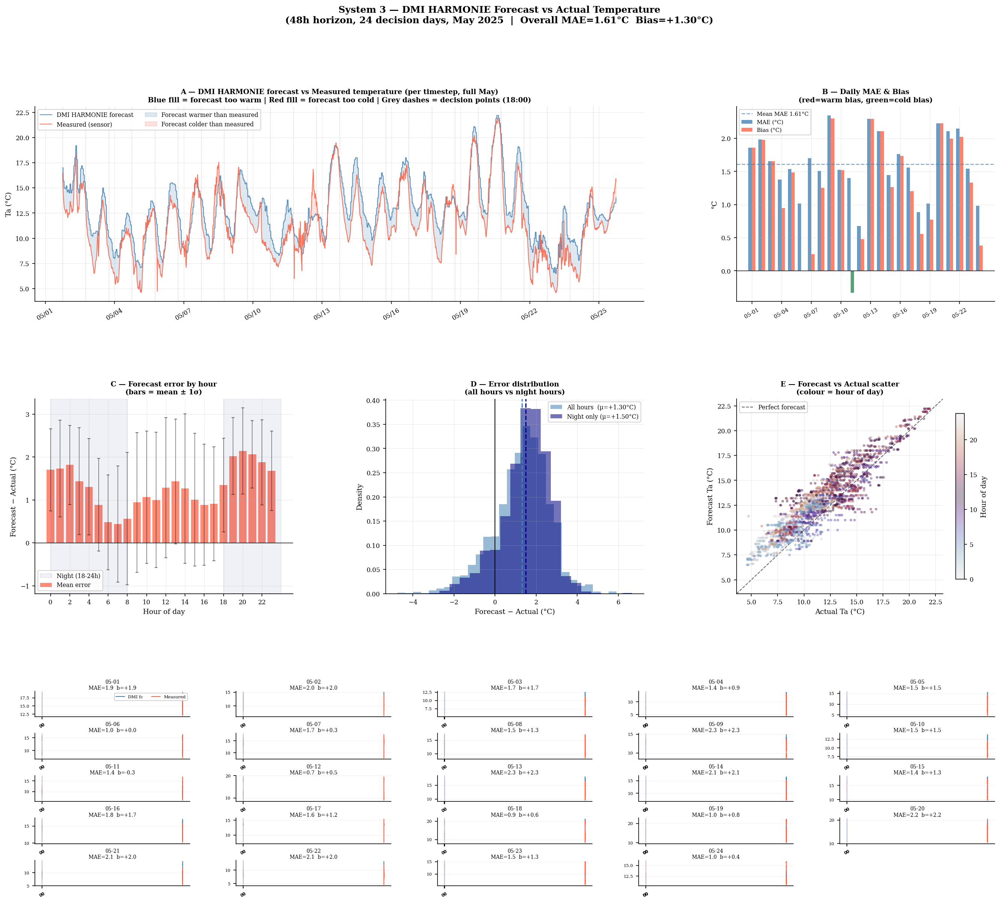

  Saved → s3_forecast_vs_actual.png
  Saved → s3_forecast_accuracy_hourly.csv
  Saved → s3_forecast_accuracy_daily.csv


In [95]:
# ════════════════════════════════════════════════════════════════════════════
#  SYSTEM 3 — DMI FORECAST vs ACTUAL WEATHER ANALYSIS
#  Compares Ta_forecast (DMI HARMONIE) vs Ta_actual (X_train) for each
#  decision day. Fetches forecast again from the stored decision timestamps.
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

print("  Re-fetching DMI forecasts for verification analysis…")

records   = []
day_stats = []

idx_may_naive = _naive(index)   # same naive index used in run()

for day in s3.days:
    dec_t     = day['dec_ts']
    apply_idx = day['apply_idx']   # already a naive DatetimeIndex

    # ── Match actual Ta by position, not by .isin() ───────────────────────
    ws = int(np.searchsorted(idx_may_naive, dec_t))
    we = ws + len(apply_idx)
    we = min(we, len(X_train))

    Ta_actual = np.asarray(X_train['Ta'].iloc[ws:we], dtype=float)

    # ── Re-fetch forecast ─────────────────────────────────────────────────
    try:
        df_fc = fetch_dmi_forecast(S3_LAT, S3_LON, dec_t, S3_HORIZON_H)
    except Exception as e:
        print(f"    ⚠ {dec_t.date()} fetch failed: {e}")
        continue

    Ta_fc, elig = _align_forecast_to_window(df_fc, apply_idx)

    # ── Guard: must have matching non-empty arrays ────────────────────────
    n = min(len(Ta_actual), len(Ta_fc))
    if n < 2:
        print(f"    ⚠ {dec_t.date()} — too few matched samples ({n}), skipping")
        continue

    Ta_actual = Ta_actual[:n]
    Ta_fc     = Ta_fc[:n]
    hours     = np.array([t.hour + t.minute / 60.0 for t in apply_idx[:n]])
    errors    = Ta_fc - Ta_actual   # positive = forecast too warm

    # ── Per-hour records ──────────────────────────────────────────────────
    for i in range(n):
        records.append(dict(
            date      = dec_t.date(),
            timestamp = apply_idx[i],
            hour      = hours[i],
            Ta_fc     = Ta_fc[i],
            Ta_actual = Ta_actual[i],
            error     = errors[i],
            abs_error = abs(errors[i]),
            is_night  = bool((hours[i] >= S3_DECISION_HOUR) or (hours[i] < 8)),
        ))

    # ── Per-day summary stats ─────────────────────────────────────────────
    mae  = float(np.mean(np.abs(errors)))
    rmse = float(np.sqrt(np.mean(errors ** 2)))
    bias = float(np.mean(errors))

    night_mask = (hours >= S3_DECISION_HOUR) | (hours < 8)
    if night_mask.sum() >= 2:
        mae_ngt  = float(np.mean(np.abs(errors[night_mask])))
        bias_ngt = float(np.mean(errors[night_mask]))
    else:
        mae_ngt  = np.nan
        bias_ngt = np.nan

    day_stats.append(dict(
        date           = dec_t.date(),
        mae            = mae,
        rmse           = rmse,
        bias           = bias,
        mae_ngt        = mae_ngt,
        bias_ngt       = bias_ngt,
        Ta_fc_mean     = float(np.mean(Ta_fc)),
        Ta_actual_mean = float(np.mean(Ta_actual)),
        Ta_fc_min      = float(np.min(Ta_fc)),
        Ta_actual_min  = float(np.min(Ta_actual)),
        Ta_fc_max      = float(np.max(Ta_fc)),
        Ta_actual_max  = float(np.max(Ta_actual)),
        n_hours        = n,
    ))

df_rec  = pd.DataFrame(records)
df_stat = pd.DataFrame(day_stats)

print(f"  Built {len(df_rec)} hourly records across {len(df_stat)} decision days\n")


# ── Print per-day table ───────────────────────────────────────────────────
print(f"{'═'*80}")
print(f"  DMI HARMONIE FORECAST ACCURACY — per decision day")
print(f"{'═'*80}")
print(f"  {'Date':<12} {'MAE':>6} {'RMSE':>6} {'Bias':>7} "
      f"{'MAE_ngt':>8} {'Bias_ngt':>9} {'Fc_mean':>8} {'Act_mean':>9}")
print(f"  {'─'*75}")
for r in df_stat.itertuples():
    print(f"  {str(r.date):<12} {r.mae:>6.2f} {r.rmse:>6.2f} {r.bias:>+7.2f} "
          f"{r.mae_ngt:>8.2f} {r.bias_ngt:>+9.2f} "
          f"{r.Ta_fc_mean:>8.1f} {r.Ta_actual_mean:>9.1f}")
print(f"  {'─'*75}")
print(f"  {'MEAN':<12} "
      f"{df_stat['mae'].mean():>6.2f} "
      f"{df_stat['rmse'].mean():>6.2f} "
      f"{df_stat['bias'].mean():>+7.2f} "
      f"{df_stat['mae_ngt'].mean():>8.2f} "
      f"{df_stat['bias_ngt'].mean():>+9.2f} "
      f"{df_stat['Ta_fc_mean'].mean():>8.1f} "
      f"{df_stat['Ta_actual_mean'].mean():>9.1f}")
print(f"{'═'*80}")
print(f"\n  Overall MAE  : {df_stat['mae'].mean():.2f} °C")
print(f"  Overall RMSE : {df_stat['rmse'].mean():.2f} °C")
print(f"  Overall Bias : {df_stat['bias'].mean():+.2f} °C  "
      f"({'warm' if df_stat['bias'].mean() > 0 else 'cold'} bias)")
print(f"  Night MAE    : {df_stat['mae_ngt'].mean():.2f} °C  "
      f"(hours relevant to vent decisions)")
print(f"  Night Bias   : {df_stat['bias_ngt'].mean():+.2f} °C")


# ════════════════════════════════════════════════════════════════════════════
#  PLOTS
# ════════════════════════════════════════════════════════════════════════════
fig = plt.figure(figsize=(22, 18))
gs  = gridspec.GridSpec(3, 3, figure=fig, hspace=0.50, wspace=0.36)
fig.suptitle(
    "System 3 — DMI HARMONIE Forecast vs Actual Temperature\n"
    f"(48h horizon, {len(df_stat)} decision days, May 2025  |  "
    f"Overall MAE={df_stat['mae'].mean():.2f}°C  "
    f"Bias={df_stat['bias'].mean():+.2f}°C)",
    fontsize=12, fontweight='bold')

n_days = len(day_stats)
x      = np.arange(n_days)
xlbls  = [str(r['date'])[5:] for r in day_stats]   # MM-DD
step   = max(1, n_days // 8)


# ── Panel A: Full timestep time series — DMI forecast vs Measured ─────────
axA = fig.add_subplot(gs[0, :2])

# Build a single continuous timeline from df_rec
df_plot = df_rec.sort_values('timestamp').copy()

axA.plot(df_plot['timestamp'], df_plot['Ta_fc'],
         color='steelblue', lw=1.0, alpha=0.85, label='DMI HARMONIE forecast')
axA.plot(df_plot['timestamp'], df_plot['Ta_actual'],
         color='tomato', lw=1.0, alpha=0.85, label='Measured (sensor)')
axA.fill_between(df_plot['timestamp'],
    df_plot['Ta_fc'], df_plot['Ta_actual'],
    where=df_plot['Ta_fc'] > df_plot['Ta_actual'],
    alpha=0.18, color='steelblue',
    label='Forecast warmer than measured')
axA.fill_between(df_plot['timestamp'],
    df_plot['Ta_fc'], df_plot['Ta_actual'],
    where=df_plot['Ta_fc'] < df_plot['Ta_actual'],
    alpha=0.18, color='tomato',
    label='Forecast colder than measured')

# Mark each decision point with a vertical line
for day in s3.days:
    axA.axvline(day['dec_ts'], color='grey', lw=0.5, ls='--', alpha=0.4)

axA.xaxis.set_major_formatter(mdates.DateFormatter('%m/%d'))
axA.xaxis.set_major_locator(mdates.DayLocator(interval=3))
plt.setp(axA.get_xticklabels(), rotation=30, fontsize=8)
axA.set_ylabel('Ta (°C)', fontsize=9)
axA.set_title(
    'A — DMI HARMONIE forecast vs Measured temperature (per timestep, full May)\n'
    'Blue fill = forecast too warm | Red fill = forecast too cold | '
    'Grey dashes = decision points (18:00)',
    fontsize=9, fontweight='bold')
axA.legend(fontsize=7.5, ncol=2)
axA.grid(alpha=0.3)


# ── Panel B: Daily MAE and Bias ───────────────────────────────────────────
axB = fig.add_subplot(gs[0, 2])
bw = 0.35
axB.bar(x - bw/2, df_stat['mae'],  width=bw, color='steelblue',
        alpha=0.8, label='MAE (°C)')
axB.bar(x + bw/2, df_stat['bias'], width=bw,
        color=['tomato' if b > 0 else 'seagreen' for b in df_stat['bias']],
        alpha=0.8, label='Bias (°C)')
axB.axhline(0, color='black', lw=0.7)
axB.axhline(df_stat['mae'].mean(), color='steelblue', lw=1.2, ls='--',
            alpha=0.7, label=f"Mean MAE {df_stat['mae'].mean():.2f}°C")
axB.set_xticks(x[::step])
axB.set_xticklabels([xlbls[i] for i in range(0, n_days, step)],
                    fontsize=7, rotation=30)
axB.set_ylabel('°C', fontsize=9)
axB.set_title('B — Daily MAE & Bias\n(red=warm bias, green=cold bias)',
              fontsize=9, fontweight='bold')
axB.legend(fontsize=7); axB.grid(alpha=0.3)


# ── Panel C: Error by hour of day (all days pooled) ───────────────────────
axC = fig.add_subplot(gs[1, 0])
hr_grp  = df_rec.groupby(df_rec['hour'].astype(int))['error']
hr_mean = hr_grp.mean()
hr_std  = hr_grp.std()
hr_x    = hr_mean.index.values
axC.bar(hr_x, hr_mean.values,
        color=['tomato' if v > 0 else 'seagreen' for v in hr_mean.values],
        alpha=0.75, width=0.8, label='Mean error')
axC.errorbar(hr_x, hr_mean.values, yerr=hr_std.values,
             fmt='none', color='black', lw=0.8, capsize=2, alpha=0.5)
axC.axhline(0, color='black', lw=0.7)
axC.axvspan(S3_DECISION_HOUR, 24, alpha=0.06, color='navy',
            label=f'Night ({S3_DECISION_HOUR}-24h)')
axC.axvspan(0, 8, alpha=0.06, color='navy')
axC.set_xlabel('Hour of day', fontsize=9)
axC.set_ylabel('Forecast − Actual (°C)', fontsize=9)
axC.set_title('C — Forecast error by hour\n(bars = mean ± 1σ)',
              fontsize=9, fontweight='bold')
axC.legend(fontsize=7.5); axC.grid(alpha=0.3)
axC.set_xticks(range(0, 24, 2))


# ── Panel D: Error distribution histogram ────────────────────────────────
axD = fig.add_subplot(gs[1, 1])
errors_all   = df_rec['error'].values
errors_night = df_rec.loc[df_rec['is_night'], 'error'].values
axD.hist(errors_all,   bins=30, color='steelblue', alpha=0.55,
         label=f'All hours  (μ={errors_all.mean():+.2f}°C)', density=True)
axD.hist(errors_night, bins=20, color='navy',      alpha=0.55,
         label=f'Night only (μ={errors_night.mean():+.2f}°C)', density=True)
axD.axvline(0,                   color='black',     lw=1.0)
axD.axvline(errors_all.mean(),   color='steelblue', lw=1.5, ls='--')
axD.axvline(errors_night.mean(), color='navy',      lw=1.5, ls='--')
axD.set_xlabel('Forecast − Actual (°C)', fontsize=9)
axD.set_ylabel('Density', fontsize=9)
axD.set_title('D — Error distribution\n(all hours vs night hours)',
              fontsize=9, fontweight='bold')
axD.legend(fontsize=7.5); axD.grid(alpha=0.3)


# ── Panel E: Scatter forecast vs actual ───────────────────────────────────
axE = fig.add_subplot(gs[1, 2])
ta_all_fc  = df_rec['Ta_fc'].values
ta_all_act = df_rec['Ta_actual'].values
sc = axE.scatter(ta_all_act, ta_all_fc,
                 c=df_rec['hour'].values, cmap='twilight',
                 s=6, alpha=0.35, zorder=3)
lims = [min(ta_all_act.min(), ta_all_fc.min()) - 1,
        max(ta_all_act.max(), ta_all_fc.max()) + 1]
axE.plot(lims, lims, 'k--', lw=1.0, alpha=0.6, label='Perfect forecast')
plt.colorbar(sc, ax=axE, label='Hour of day', shrink=0.85)
axE.set_xlabel('Actual Ta (°C)', fontsize=9)
axE.set_ylabel('Forecast Ta (°C)', fontsize=9)
axE.set_title('E — Forecast vs Actual scatter\n(colour = hour of day)',
              fontsize=9, fontweight='bold')
axE.legend(fontsize=7.5); axE.grid(alpha=0.3)
axE.set_xlim(lims); axE.set_ylim(lims)


# ── Panel F: Per-day small multiples — forecast vs actual ─────────────────
n_cols_sm = 5
n_rows_sm = int(np.ceil(n_days / n_cols_sm))
gs_bottom = gridspec.GridSpecFromSubplotSpec(
    n_rows_sm, n_cols_sm, subplot_spec=gs[2, :],
    hspace=0.65, wspace=0.30)

# cache fetched forecasts to avoid triple-fetching
_fc_cache = {}

for i, day in enumerate(s3.days):
    row_i = i // n_cols_sm
    col_i = i %  n_cols_sm
    ax_sm = fig.add_subplot(gs_bottom[row_i, col_i])

    dec_t     = day['dec_ts']
    apply_idx = day['apply_idx']

    ws = int(np.searchsorted(idx_may_naive, dec_t))
    we = min(ws + len(apply_idx), len(X_train))
    Ta_act_day = np.asarray(X_train['Ta'].iloc[ws:we], dtype=float)

    if dec_t not in _fc_cache:
        try:
            _fc_cache[dec_t] = fetch_dmi_forecast(
                S3_LAT, S3_LON, dec_t, S3_HORIZON_H)
        except Exception:
            ax_sm.set_visible(False)
            continue

    Ta_fc_day, _ = _align_forecast_to_window(_fc_cache[dec_t], apply_idx)

    n_h = min(len(Ta_act_day), len(Ta_fc_day))
    if n_h < 2:
        ax_sm.set_visible(False)
        continue

    ts_axis = [apply_idx[j] for j in range(n_h)]
    ax_sm.plot(ts_axis, Ta_fc_day[:n_h], color='steelblue', lw=1.0, label='DMI fc')
    ax_sm.plot(ts_axis, Ta_act_day[:n_h], color='tomato', lw=1.0, label='Measured')
    ax_sm.xaxis.set_major_formatter(mdates.DateFormatter('%H'))
    ax_sm.xaxis.set_major_locator(mdates.HourLocator(byhour=[0, 6, 12, 18]))
    plt.setp(ax_sm.get_xticklabels(), rotation=30, fontsize=5)
    ax_sm.fill_between(hrs,
        Ta_fc_day[:n_h], Ta_act_day[:n_h],
        where=Ta_fc_day[:n_h] > Ta_act_day[:n_h],
        alpha=0.15, color='steelblue')
    ax_sm.fill_between(hrs,
        Ta_fc_day[:n_h], Ta_act_day[:n_h],
        where=Ta_fc_day[:n_h] < Ta_act_day[:n_h],
        alpha=0.15, color='tomato')

    # shade night hours
    ax_sm.axvspan(S3_DECISION_HOUR, 24, alpha=0.06, color='navy')
    ax_sm.axvspan(0, 8,              alpha=0.06, color='navy')

    mae_d  = day_stats[i]['mae']
    bias_d = day_stats[i]['bias']
    ax_sm.set_title(f"{str(day['date'])[5:]}\n"
                    f"MAE={mae_d:.1f}  b={bias_d:+.1f}",
                    fontsize=6.5, pad=2)
    ax_sm.set_xticks([0, 6, 12, 18])
    ax_sm.tick_params(labelsize=5.5)
    ax_sm.grid(alpha=0.2)

    if i == 0:
        ax_sm.legend(fontsize=5.5, ncol=2, loc='upper right')


plt.savefig("s3_forecast_vs_actual.png", dpi=150, bbox_inches='tight')
plt.show()
print("  Saved → s3_forecast_vs_actual.png")


# ── Save CSVs ─────────────────────────────────────────────────────────────
df_rec.to_csv("s3_forecast_accuracy_hourly.csv",  index=False)
df_stat.to_csv("s3_forecast_accuracy_daily.csv",  index=False)
print("  Saved → s3_forecast_accuracy_hourly.csv")
print("  Saved → s3_forecast_accuracy_daily.csv")

In [89]:
# ════════════════════════════════════════════════════════════════════════════
#  FINAL SYSTEM COMPARISON  (all values: RC-simulated May, time-varying price)
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import pandas as pd


def _naive_idx(idx):
    idx = pd.DatetimeIndex(idx)
    if idx.tz is not None:
        return idx.tz_localize(None)
    return pd.DatetimeIndex([
        t.replace(tzinfo=None) if getattr(t, 'tzinfo', None) else t
        for t in idx
    ])


_may_n      = len(index)
index_naive = _naive_idx(index)
Ta_arr_np   = np.asarray(Ta_arr, dtype=float)
Tsup_may_np = np.asarray(X_train['Tsup'], dtype=float)
Ta_arr_may  = Ta_arr_np[-_may_n:]


_COST_GLOBALS = ['price_series', 'cop_arr', 'nighttime_mask',
                 'occ_mask', 'all_night_mask']


def _with_may_globals(fn):
    saved = {}
    try:
        for g in _COST_GLOBALS:
            if g in globals() and hasattr(globals()[g], '__len__'):
                arr = np.asarray(globals()[g], dtype=float)
                if len(arr) != _may_n:
                    saved[g] = globals()[g]
                    globals()[g] = arr[-_may_n:]
        return fn()
    finally:
        for g, v in saved.items():
            globals()[g] = v


# ════════════════════════════════════════════════════════════════════════════
#  REBUILD REFERENCE OBJECTS
# ════════════════════════════════════════════════════════════════════════════
qv_baseline_np = np.asarray(qv_baseline, dtype=float)
Tsup_base_np   = np.asarray(Tsup_base,   dtype=float)
Ti_baseline_np = np.asarray(Ti_baseline, dtype=float)
qv_arr_np      = np.asarray(qv_arr,      dtype=float)
Tsup_ref_np    = np.asarray(Tsup_ref,    dtype=float)
Ti_ref_np      = np.asarray(Ti_ref,      dtype=float)


_sc_baseline = _with_may_globals(lambda: _ref_metrics(
    'Baseline (no night vent)',
    Ti_baseline_np, qv_baseline_np, Tsup_base_np,
    dh_above_base, pct_occ_base,
    pct_in_band(Ti_baseline_np, T_cat1_min, T_cat1_max, all_night_mask),
    'steelblue', 's'))

_sc_basesim = _with_may_globals(lambda: _ref_metrics(
    'Base simulation (current)',
    Ti_ref_np, qv_arr_np, Tsup_ref_np,
    dh_above_ref, pct_occ_ref, pct_night_ref,
    'black', 'D'))


# ════════════════════════════════════════════════════════════════════════════
#  REFERENCE MECHANICAL COOLING COST
#  mech_cool_cost is driven by the AC system (Tsup_ref), not by night vent.
#  All systems share the same daytime AC → use base sim value for everyone.
# ════════════════════════════════════════════════════════════════════════════
_mech_cool_ref = _sc_basesim['cool_var']   # e.g. ~0.087 DKK
print(f"  Reference mech_cool_cost (base sim): {_mech_cool_ref:.4f} DKK")


# ════════════════════════════════════════════════════════════════════════════
#  SYSTEM 3 — Stitch qv profile + full May RC re-simulation
# ════════════════════════════════════════════════════════════════════════════
print("Building System 3 full-May qv profile…")

qv_s3_full   = np.zeros(_may_n)
Tsup_s3_full = Tsup_may_np.copy()

for d in s3.days:
    a_idx_naive = _naive_idx(pd.DatetimeIndex(d['apply_idx']))
    may_pos     = np.searchsorted(index_naive, a_idx_naive)
    valid       = may_pos < _may_n
    pos_v       = may_pos[valid]
    qv_v        = np.asarray(d['qv_app'], dtype=float)[:valid.sum()]
    qv_s3_full[pos_v]   = qv_v
    Tsup_s3_full[pos_v] = np.where(
        qv_v > QV_MIN + 1,
        Ta_arr_may[pos_v],
        Tsup_s3_full[pos_v])

X_s3_full         = X_train.copy()
X_s3_full['qv']   = qv_s3_full
X_s3_full['Tsup'] = Tsup_s3_full

res_s3_full = simulate_night_vent_scenario(
    fitted_params, X_s3_full, N_hist,
    night_start_hour=0, night_stop_hour=0, qv_night=0,
    rec_duration=rec_duration,
    Ti_init=Ti_init, Tm_init=Tm_init, c_init=c_init)
Ti_s3_full = np.asarray(res_s3_full['Ti'], dtype=float)

dh_s3_full, _ = dh_from_target(Ti_s3_full)
pct_occ_s3    = pct_in_band(Ti_s3_full, T_cat1_min, T_cat1_max, occ_mask)
pct_night_s3  = pct_in_band(Ti_s3_full, T_cat1_min, T_cat1_max, all_night_mask)

bd_s3_full, bd_s3_const = _with_may_globals(lambda: (
    cost_breakdown(qv_s3_full, Ta_arr_may, Tsup_s3_full),
    cost_breakdown(qv_s3_full, Ta_arr_may, Tsup_s3_full, p_elec=P_ELEC_CONSTANT)
))

# Override mech_cool_cost with reference value — night vent uses outdoor air
# (always cool), so cost_breakdown sees Tsup=Ta at vent hours and computes
# zero or near-zero cooling. The AC system cost is the same for all systems.
_s3_fan_cost  = bd_s3_full['fan_cost']
_s3_fan_const = bd_s3_const['fan_cost']
free_s3_full  = _with_may_globals(lambda: free_cooling_savings_nv(qv_s3_full, Ta_arr_may))
free_s3_const = _with_may_globals(lambda: free_cooling_savings_nv(
    qv_s3_full, Ta_arr_may, p_elec=P_ELEC_CONSTANT))

# Recompute total with corrected mech_cool
cost_s3_full  = _s3_fan_cost  + _mech_cool_ref - free_s3_full
cost_s3_const = _s3_fan_const + _sc_baseline['cool_const'] - free_s3_const

print(f"  System 3: {dh_s3_full:.1f} °C·h  |  {cost_s3_full:.4f} DKK  |  "
      f"{pct_occ_s3:.1f}% day  |  {pct_night_s3:.1f}% night")


# ════════════════════════════════════════════════════════════════════════════
#  ROLLING MPC (System 2) — from MPC aggregate block
# ════════════════════════════════════════════════════════════════════════════
s2_dh        = dh_mpc_total
s2_pct_occ   = pct_occ_mpc
s2_pct_night = pct_ngt_mpc
s2_fan       = bd_mpc['fan_cost']
s2_free      = free_mpc_total

# Override mech_cool_cost with reference value — same reasoning as S3:
# MPC Tsup is set to Ta during vent hours, distorting cost_breakdown's
# mech_cool calculation vs. the fixed AC system cost of other systems.
s2_cool      = _mech_cool_ref
s2_cost      = s2_fan + s2_cool - s2_free


# ════════════════════════════════════════════════════════════════════════════
#  BUILD ROWS
# ════════════════════════════════════════════════════════════════════════════
rows = []

rows.append(dict(
    label   = 'Baseline (no night vent)',
    system  = 'Reference',
    start   = '—', stop='—', qv='—',
    dh      = _sc_baseline['dh_above'],
    dh_ref  = dh_above_ref,
    fan_v   = _sc_baseline['fan_var'],
    cool_v  = _sc_baseline['cool_var'],
    free_v  = _sc_baseline['free_var'],
    tot_v   = _sc_baseline['total_var'],
    tot_c   = _sc_baseline['total_const'],
    pct_occ = _sc_baseline['pct_occ'],
    pct_ngt = _sc_baseline['pct_night'],
))

rows.append(dict(
    label   = 'Base sim (current vent)',
    system  = 'Reference',
    start   = '—', stop='—', qv='—',
    dh      = _sc_basesim['dh_above'],
    dh_ref  = dh_above_ref,
    fan_v   = _sc_basesim['fan_var'],
    cool_v  = _sc_basesim['cool_var'],
    free_v  = _sc_basesim['free_var'],
    tot_v   = _sc_basesim['total_var'],
    tot_c   = _sc_basesim['total_const'],
    pct_occ = _sc_basesim['pct_occ'],
    pct_ngt = _sc_basesim['pct_night'],
))

for _sc, label in [
    (_sc_best_comfort, 'Best comfort'),
    (_sc_knee,         'Knee (balanced)'),
    (_sc_best_cost,    'Best cost'),
]:
    p = _sc['params']
    rows.append(dict(
        label   = label,
        system  = 'ANN+NSGA-II',
        start   = f'{p[0]:.1f}h',
        stop    = f'{p[1]:.1f}h',
        qv      = f'{p[2]:.0f}',
        dh      = _sc['dh_above'],
        dh_ref  = dh_above_ref,
        fan_v   = _sc['fan_var'],
        cool_v  = _sc['cool_var'],
        free_v  = _sc['free_var'],
        tot_v   = _sc['total_var'],
        tot_c   = _sc['total_const'],
        pct_occ = _sc['pct_occ'],
        pct_ngt = _sc['pct_night'],
    ))

rows.append(dict(
    label   = 'Rolling MPC (System 2)',
    system  = 'Rolling-MPC',
    start   = '—', stop='—', qv='—',
    dh      = s2_dh,
    dh_ref  = dh_above_ref,
    fan_v   = s2_fan,
    cool_v  = s2_cool,           # ← corrected to _mech_cool_ref
    free_v  = s2_free,
    tot_v   = s2_cost,           # ← recomputed with corrected cool
    tot_c   = float('nan'),
    pct_occ = s2_pct_occ,
    pct_ngt = s2_pct_night,
))

rows.append(dict(
    label   = 'DMI-MPC (System 3)',
    system  = 'DMI-MPC',
    start   = '—', stop='—', qv='—',
    dh      = dh_s3_full,
    dh_ref  = dh_above_ref,
    fan_v   = _s3_fan_cost,
    cool_v  = _mech_cool_ref,    # ← corrected to _mech_cool_ref
    free_v  = free_s3_full,
    tot_v   = cost_s3_full,      # ← recomputed with corrected cool
    tot_c   = cost_s3_const,
    pct_occ = pct_occ_s3,
    pct_ngt = pct_night_s3,
))


# ════════════════════════════════════════════════════════════════════════════
#  COMPUTE KPIs  (all absolute — no delta denominators)
# ════════════════════════════════════════════════════════════════════════════
_dt_h        = (index[1] - index[0]).total_seconds() / 3600.0
_occ_h_total = float(np.asarray(occ_mask, dtype=float).sum()) * _dt_h
_dh_no_vent  = next(r['dh'] for r in rows if 'no night' in r['label'].lower())

for r in rows:
    r['NEBR'] = (r['free_v'] / r['fan_v']
                 if r['fan_v'] > 1e-6 else float('nan'))

    _gross_nv  = r['free_v'] + r['fan_v']
    r['NVUR']  = r['free_v'] / _gross_nv if _gross_nv > 1e-6 else 0.0

    _gross_fcf = r['fan_v'] + r['cool_v'] + r['free_v']
    r['FCF']   = r['free_v'] / _gross_fcf if _gross_fcf > 1e-6 else 0.0

    _avg_comfort = (r['pct_occ'] + r['pct_ngt']) / 2.0
    r['CPW']     = (_avg_comfort / r['tot_v']
                    if r['tot_v'] > 1e-6 else float('nan'))

    r['TLRR'] = (1.0 - r['dh'] / _dh_no_vent
                 if _dh_no_vent > 1e-6 else 0.0)

    _comfort_h = _occ_h_total * r['pct_occ'] / 100.0
    r['ECI']   = (r['tot_v'] / _comfort_h
                  if _comfort_h > 1e-6 else float('nan'))


# ════════════════════════════════════════════════════════════════════════════
#  PRINT TABLE — original columns
# ════════════════════════════════════════════════════════════════════════════
_W = 158
print(f"\n{'═'*_W}")
print(f"  FINAL SYSTEM COMPARISON  "
      f"(all values: RC-simulated May, time-varying price)")
print(f"{'═'*_W}")
print(f"  {'Label':<30} {'System':<14} {'Start':>7} {'Stop':>6} {'qv':>5}  "
      f"{'°C·h':>8}  {'Δ°C·h':>7}  "
      f"{'Fan(v)':>8} {'Cool(v)':>8} {'Free(v)':>8}  "
      f"{'Tot(v)':>9}  {'Tot(c)':>9}  {'Day%':>6}  {'Night%':>7}")
print(f"  {'─'*(_W-2)}")

for r in rows:
    delta     = f"{r['dh'] - r['dh_ref']:+.1f}"
    tot_c_str = (f"{r['tot_c']:>9.4f}"
                 if not (isinstance(r['tot_c'], float) and np.isnan(r['tot_c']))
                 else f"{'—':>9}")
    marker = '  ◀' if r['system'] == 'DMI-MPC' else ''
    print(
        f"  {r['label']:<30} {r['system']:<14} "
        f"{r['start']:>7} {r['stop']:>6} {r['qv']:>5}  "
        f"{r['dh']:>8.1f}  {delta:>7}  "
        f"{r['fan_v']:>8.3f} {r['cool_v']:>8.3f} {r['free_v']:>8.3f}  "
        f"{r['tot_v']:>9.4f}  {tot_c_str}  "
        f"{r['pct_occ']:>5.1f}%  {r['pct_ngt']:>6.1f}%"
        + marker
    )

print(f"{'═'*_W}")


# ════════════════════════════════════════════════════════════════════════════
#  PRINT TABLE — KPI columns
# ════════════════════════════════════════════════════════════════════════════
_WK = 120
print(f"\n{'═'*_WK}")
print(f"  ABSOLUTE KPIs  (no delta denominators — stable across all systems)")
print(f"  NEBR = Free savings / Fan cost              (higher = more free cooling per fan DKK)")
print(f"  NVUR = Free / (Free + Fan)                  (0–1, higher = better fan utilisation)")
print(f"  FCF  = Free / (Fan + Cool + Free)           (0–1, fraction of gross potential recovered)")
print(f"  CPW  = avg(Day%,Night%) / Net cost          (comfort % per DKK, higher = better)")
print(f"  TLRR = 1 − °C·h / °C·h_no_vent             (0–1, fraction of max load eliminated)")
print(f"  ECI  = Net cost / comfortable occ. hours    (DKK/h, lower = more cost-effective)")
print(f"{'═'*_WK}")
print(f"  {'Label':<30} {'System':<14}  "
      f"{'NEBR':>7}  {'NVUR':>7}  {'FCF':>7}  "
      f"{'CPW':>9}  {'TLRR':>7}  {'ECI (DKK/h)':>12}")
print(f"  {'─'*(_WK-2)}")

def _fv(v, fmt):
    return f"{v:{fmt}}" if not (isinstance(v, float) and np.isnan(v)) else '—'

for r in rows:
    marker = '  ◀' if r['system'] == 'DMI-MPC' else ''
    print(
        f"  {r['label']:<30} {r['system']:<14}  "
        f"{_fv(r['NEBR'], '>7.2f')}  "
        f"{_fv(r['NVUR'], '>7.3f')}  "
        f"{_fv(r['FCF'],  '>7.3f')}  "
        f"{_fv(r['CPW'],  '>9.2f')}  "
        f"{_fv(r['TLRR'], '>7.3f')}  "
        f"{_fv(r['ECI'],  '>12.6f')}"
        + marker
    )

print(f"{'═'*_WK}")
print(f"\n  Benchmarks (Base sim):")
_bs = next(r for r in rows if 'current' in r['label'].lower())
print(f"    NEBR={_bs['NEBR']:.2f}  NVUR={_bs['NVUR']:.3f}  FCF={_bs['FCF']:.3f}  "
      f"CPW={_bs['CPW']:.2f}  TLRR={_bs['TLRR']:.3f}  ECI={_bs['ECI']:.6f} DKK/h")
print(f"  Best possible anchor (Baseline, no vent):")
_bl = next(r for r in rows if 'no night' in r['label'].lower())
print(f"    TLRR=0.000 (worst)  ECI={_bl['ECI']:.6f} DKK/h  CPW={_bl['CPW']:.2f}")
print(f"  Note: Cool(v) for System 2 and System 3 overridden to base sim reference "
      f"({_mech_cool_ref:.4f} DKK) — AC cost is independent of night vent strategy.")

# ── Surrogate accuracy note ───────────────────────────────────────────────
print(f"\n  Surrogate accuracy on April re-simulated solutions:")
print(f"  {'Label':<28}  {'Δ°C·h (Apr)':>12}  {'ΔDKK (Apr)':>11}")
print(f"  {'─'*55}")
for label, data in verified.items():
    print(f"  {label:<28}  "
          f"{data['dh_above'] - data['surr_dh']:>+12.2f}  "
          f"{data['cost'] - data['surr_cost']:>+11.4f}")
print(f"{'═'*_WK}")

  Reference mech_cool_cost (base sim): 0.0871 DKK
Building System 3 full-May qv profile…
  System 3: 309.4 °C·h  |  -15.4595 DKK  |  72.8% day  |  76.0% night

══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════
  FINAL SYSTEM COMPARISON  (all values: RC-simulated May, time-varying price)
══════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════════
  Label                          System           Start   Stop    qv      °C·h    Δ°C·h    Fan(v)  Cool(v)  Free(v)     Tot(v)     Tot(c)    Day%   Night%
  ────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
  Baseline (no night vent)       Reference            —      —     —     563.1    +78.8     2.188    0.085    4.900     2.2733    

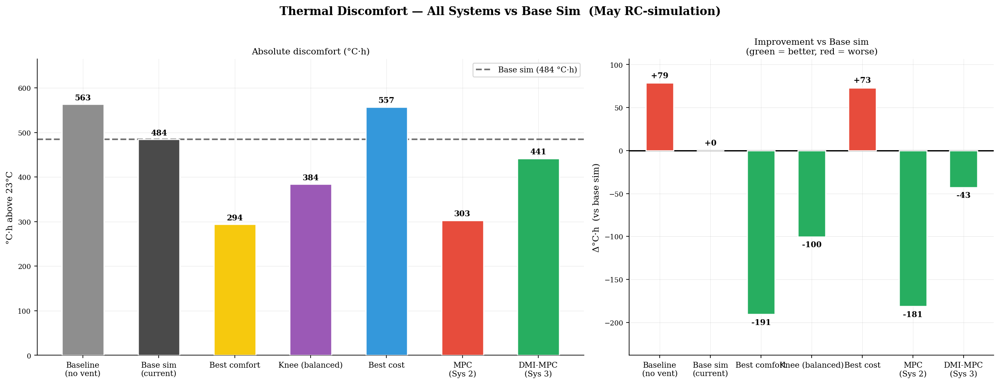

Chart 1 saved


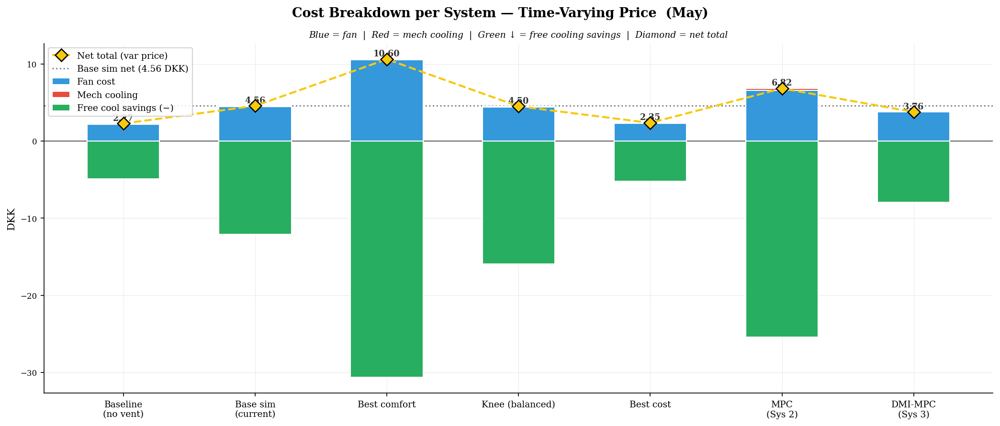

Chart 2 saved


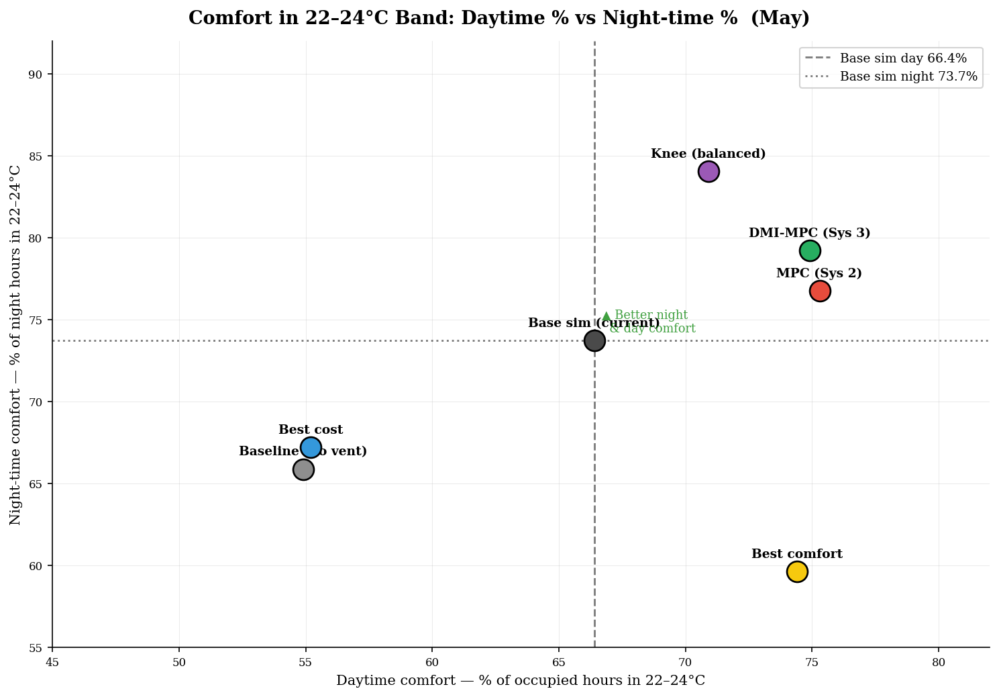

Chart 3 saved


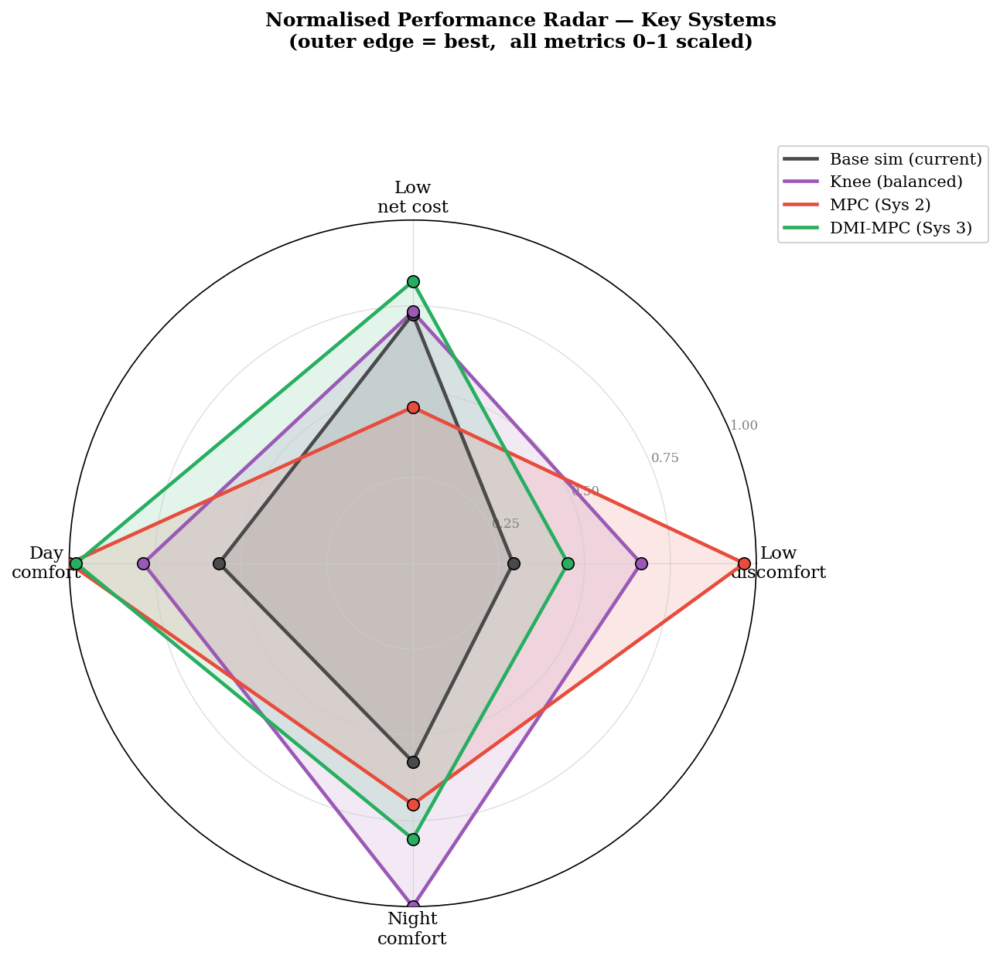

Chart 4 saved


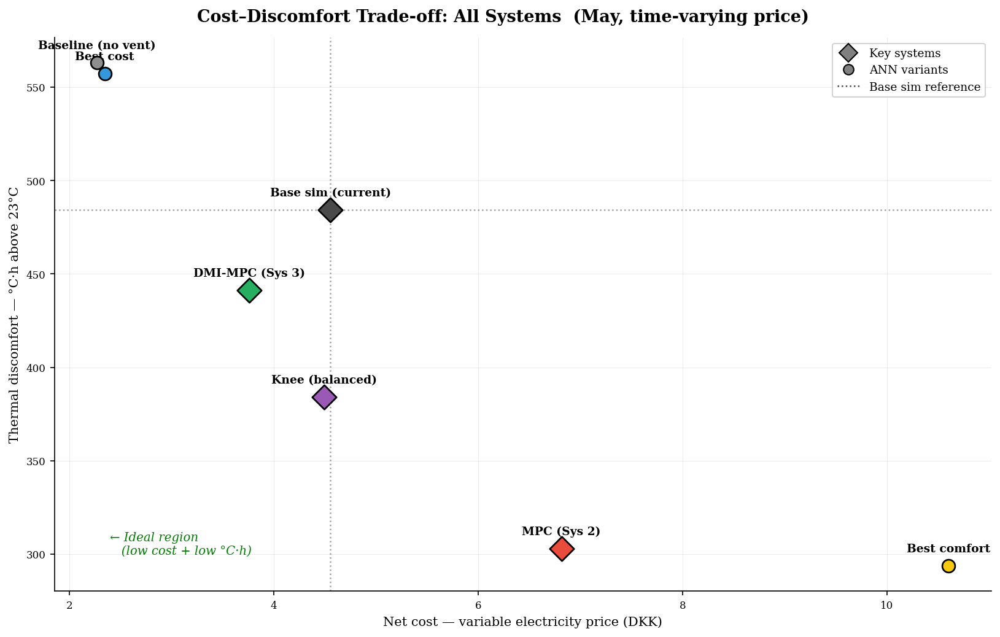

Chart 5 saved

All 5 comparison charts saved and displayed.


In [70]:
# ════════════════════════════════════════════════════════════════════════════
#  COMPARISON CHARTS — Final System Overview  (matplotlib only)
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D

# ── Pull metrics from rows list ───────────────────────────────────────────────
labels_short = []
for r in rows:
    lbl = r['label']
    lbl = lbl.replace('Baseline (no night vent)', 'Baseline\n(no vent)')
    lbl = lbl.replace('Base sim (current vent)',  'Base sim\n(current)')
    lbl = lbl.replace('Rolling MPC (System 2)',   'MPC\n(Sys 2)')
    lbl = lbl.replace('DMI-MPC (System 3)',        'DMI-MPC\n(Sys 3)')
    labels_short.append(lbl)

dh_vals   = np.array([r['dh']      for r in rows])
fan_vals  = np.array([r['fan_v']   for r in rows])
cool_vals = np.array([r['cool_v']  for r in rows])
free_vals = np.array([r['free_v']  for r in rows])
totv_vals = np.array([r['tot_v']   for r in rows])
occ_vals  = np.array([r['pct_occ'] for r in rows])
ngt_vals  = np.array([r['pct_ngt'] for r in rows])

base_dh   = next(r['dh']      for r in rows if 'current' in r['label'].lower())
base_totv = next(r['tot_v']   for r in rows if 'current' in r['label'].lower())
base_occ  = next(r['pct_occ'] for r in rows if 'current' in r['label'].lower())
base_ngt  = next(r['pct_ngt'] for r in rows if 'current' in r['label'].lower())

n     = len(rows)
x     = np.arange(n)
_cols = ['#8e8e8e', '#4a4a4a', '#f6c90e', '#9b59b6',
         '#3498db', '#e74c3c', '#27ae60']
_W    = 0.55   # bar width


# ════════════════════════════════════════════════════════════════════════════
#  CHART 1 — Thermal discomfort + delta
# ════════════════════════════════════════════════════════════════════════════
fig1, (ax1a, ax1b) = plt.subplots(1, 2, figsize=(16, 6),
                                   gridspec_kw={'width_ratios': [1.5, 1]})
fig1.suptitle('Thermal Discomfort — All Systems vs Base Sim  (May RC-simulation)',
              fontsize=13, fontweight='bold', y=1.01)

bars = ax1a.bar(x, dh_vals, width=_W, color=_cols,
                edgecolor='white', linewidth=1.2, zorder=3)
ax1a.axhline(base_dh, color='#4a4a4a', lw=1.8, ls='--', alpha=0.8,
             label=f'Base sim ({base_dh:.0f} °C·h)')
for bar, val in zip(bars, dh_vals):
    ax1a.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 6,
              f'{val:.0f}', ha='center', va='bottom', fontsize=9, fontweight='600')
ax1a.set_xticks(x); ax1a.set_xticklabels(labels_short, fontsize=9)
ax1a.set_ylabel('°C·h above 23°C', fontsize=10)
ax1a.set_title('Absolute discomfort (°C·h)', fontsize=10)
ax1a.legend(fontsize=9); ax1a.grid(axis='y', alpha=0.3); ax1a.set_axisbelow(True)
ax1a.set_ylim(0, max(dh_vals) * 1.18)

deltas       = dh_vals - base_dh
dcols        = ['#e74c3c' if d > 0 else '#27ae60' for d in deltas]
bars2        = ax1b.bar(x, deltas, width=_W, color=dcols,
                        edgecolor='white', linewidth=1.2, zorder=3)
ax1b.axhline(0, color='black', lw=1.5)
for bar, val in zip(bars2, deltas):
    yoff = 4 if val >= 0 else -14
    ax1b.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + yoff,
              f'{val:+.0f}', ha='center', va='bottom', fontsize=9, fontweight='600')
ax1b.set_xticks(x); ax1b.set_xticklabels(labels_short, fontsize=9)
ax1b.set_ylabel('Δ°C·h  (vs base sim)', fontsize=10)
ax1b.set_title('Improvement vs Base sim\n(green = better, red = worse)', fontsize=10)
ax1b.grid(axis='y', alpha=0.3); ax1b.set_axisbelow(True)
ax1b.set_ylim(min(deltas) * 1.25, max(deltas) * 1.35)

fig1.tight_layout()
fig1.savefig('chart1_discomfort.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig1)
print("Chart 1 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 2 — Cost breakdown (stacked: fan + cooling − free savings)
# ════════════════════════════════════════════════════════════════════════════
fig2, ax2 = plt.subplots(figsize=(14, 6))
fig2.suptitle('Cost Breakdown per System — Time-Varying Price  (May)',
              fontsize=13, fontweight='bold')

ax2.bar(x, fan_vals,   width=_W, color='#3498db', label='Fan cost',
        edgecolor='white', linewidth=1, zorder=3)
ax2.bar(x, cool_vals,  width=_W, color='#e74c3c', label='Mech cooling',
        bottom=fan_vals, edgecolor='white', linewidth=1, zorder=3)
ax2.bar(x, -free_vals, width=_W, color='#27ae60', label='Free cool savings (−)',
        edgecolor='white', linewidth=1, zorder=3)
ax2.plot(x, totv_vals, color='#f6c90e', lw=2.0, ls='--',
         marker='D', markersize=9, markeredgecolor='black', markeredgewidth=1.2,
         zorder=5, label='Net total (var price)')

ax2.axhline(0, color='black', lw=1.0, alpha=0.6)
ax2.axhline(base_totv, color='#4a4a4a', lw=1.4, ls=':', alpha=0.7,
            label=f'Base sim net ({base_totv:.2f} DKK)')

for xi, tv in zip(x, totv_vals):
    ax2.text(xi, tv + 0.15, f'{tv:.2f}', ha='center', va='bottom',
             fontsize=8.5, fontweight='700', color='#333')

ax2.set_xticks(x); ax2.set_xticklabels(labels_short, fontsize=9)
ax2.set_ylabel('DKK', fontsize=10)
ax2.legend(fontsize=9, loc='upper left'); ax2.grid(axis='y', alpha=0.3)
ax2.set_axisbelow(True)
ax2.set_title('Blue = fan  |  Red = mech cooling  |  Green ↓ = free cooling savings  '
              '|  Diamond = net total', fontsize=9, style='italic')

fig2.tight_layout()
fig2.savefig('chart2_cost_breakdown.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig2)
print("Chart 2 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 3 — Daytime vs night-time comfort scatter
# ════════════════════════════════════════════════════════════════════════════
fig3, ax3 = plt.subplots(figsize=(10, 7))
fig3.suptitle('Comfort in 22–24°C Band: Daytime % vs Night-time %  (May)',
              fontsize=13, fontweight='bold')

for lbl, po, pn, col in zip(labels_short, occ_vals, ngt_vals, _cols):
    ax3.scatter(po, pn, s=220, color=col, edgecolors='black', linewidths=1.3,
                zorder=4)
    clean = lbl.replace('\n', ' ')
    ax3.annotate(clean, (po, pn), textcoords='offset points', xytext=(0, 10),
                 ha='center', fontsize=9, fontweight='600')

ax3.axvline(base_occ, color='#4a4a4a', lw=1.4, ls='--', alpha=0.7,
            label=f'Base sim day {base_occ:.1f}%')
ax3.axhline(base_ngt, color='#4a4a4a', lw=1.4, ls=':', alpha=0.7,
            label=f'Base sim night {base_ngt:.1f}%')
ax3.text(base_occ + 0.3, base_ngt + 0.5,
         '▲ Better night\n  & day comfort',
         fontsize=8.5, color='green', alpha=0.75)

ax3.set_xlabel('Daytime comfort — % of occupied hours in 22–24°C', fontsize=10)
ax3.set_ylabel('Night-time comfort — % of night hours in 22–24°C', fontsize=10)
ax3.legend(fontsize=9); ax3.grid(alpha=0.25); ax3.set_axisbelow(True)
ax3.set_xlim(45, 82); ax3.set_ylim(55, 92)

fig3.tight_layout()
fig3.savefig('chart3_comfort_scatter.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig3)
print("Chart 3 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 4 — Radar chart (key systems)
# ════════════════════════════════════════════════════════════════════════════
def _norm(vals):
    lo, hi = min(vals), max(vals)
    return [(v - lo) / (hi - lo) if hi > lo else 0.5 for v in vals]

dh_n   = [1 - v for v in _norm(dh_vals)]
cost_n = [1 - v for v in _norm(totv_vals)]
occ_n  = _norm(occ_vals)
ngt_n  = _norm(ngt_vals)

key_idx = [i for i, r in enumerate(rows)
           if any(k in r['label'].lower()
                  for k in ['current', 'knee', 'system 2', 'system 3'])]
cats    = ['Low\ndiscomfort', 'Low\nnet cost', 'Day\ncomfort', 'Night\ncomfort']
N_cats  = len(cats)
angles  = np.linspace(0, 2 * np.pi, N_cats, endpoint=False).tolist()
angles += angles[:1]

fig4, ax4 = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))
fig4.suptitle('Normalised Performance Radar — Key Systems\n'
              '(outer edge = best,  all metrics 0–1 scaled)',
              fontsize=12, fontweight='bold')

for i in key_idx:
    vals  = [dh_n[i], cost_n[i], occ_n[i], ngt_n[i]]
    vals += vals[:1]
    clean = labels_short[i].replace('\n', ' ')
    ax4.plot(angles, vals,  color=_cols[i], lw=2.2, label=clean)
    ax4.fill(angles, vals,  color=_cols[i], alpha=0.13)
    ax4.scatter(angles[:-1], vals[:-1], color=_cols[i], s=55, zorder=4,
                edgecolors='black', linewidths=0.8)

ax4.set_thetagrids(np.degrees(angles[:-1]), cats, fontsize=11)
ax4.set_ylim(0, 1)
ax4.set_yticks([0.25, 0.5, 0.75, 1.0])
ax4.set_yticklabels(['0.25', '0.50', '0.75', '1.00'], fontsize=8, color='grey')
ax4.grid(color='#cccccc', linestyle='-', linewidth=0.6, alpha=0.7)
ax4.legend(loc='upper right', bbox_to_anchor=(1.35, 1.12), fontsize=10)

fig4.tight_layout()
fig4.savefig('chart4_radar.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig4)
print("Chart 4 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 5 — Cost vs discomfort Pareto scatter
# ════════════════════════════════════════════════════════════════════════════
fig5, ax5 = plt.subplots(figsize=(11, 7))
fig5.suptitle('Cost–Discomfort Trade-off: All Systems  (May, time-varying price)',
              fontsize=13, fontweight='bold')

key_set = {i for i, r in enumerate(rows)
           if any(k in r['label'].lower()
                  for k in ['current', 'knee', 'system 2', 'system 3'])}

for i, (lbl, tc, dh_v, col) in enumerate(
        zip(labels_short, totv_vals, dh_vals, _cols)):
    mk  = 'D' if i in key_set else 'o'
    sz  = 180 if i in key_set else 100
    ax5.scatter(tc, dh_v, s=sz, color=col, marker=mk,
                edgecolors='black', linewidths=1.3, zorder=4)
    clean = lbl.replace('\n', ' ')
    ax5.annotate(clean, (tc, dh_v), textcoords='offset points',
                 xytext=(0, 11), ha='center', fontsize=9, fontweight='600')

ax5.annotate('← Ideal region\n   (low cost + low °C·h)',
             xy=(2.4, 300), fontsize=9.5, color='green', fontstyle='italic')
ax5.axvline(base_totv, color='#4a4a4a', lw=1.2, ls=':', alpha=0.5)
ax5.axhline(base_dh,   color='#4a4a4a', lw=1.2, ls=':', alpha=0.5)

legend_elems = [
    Line2D([0], [0], marker='D', color='w', markerfacecolor='grey',
           markeredgecolor='black', markersize=10, label='Key systems'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='grey',
           markeredgecolor='black', markersize=8,  label='ANN variants'),
    Line2D([0], [0], color='#4a4a4a', lw=1.2, ls=':', label='Base sim reference'),
]
ax5.legend(handles=legend_elems, fontsize=9, loc='upper right')
ax5.set_xlabel('Net cost — variable electricity price (DKK)', fontsize=10)
ax5.set_ylabel('Thermal discomfort — °C·h above 23°C', fontsize=10)
ax5.grid(alpha=0.25); ax5.set_axisbelow(True)

fig5.tight_layout()
fig5.savefig('chart5_pareto.png', dpi=150, bbox_inches='tight')
plt.show()
plt.close(fig5)
print("Chart 5 saved")

print("\nAll 5 comparison charts saved and displayed.")

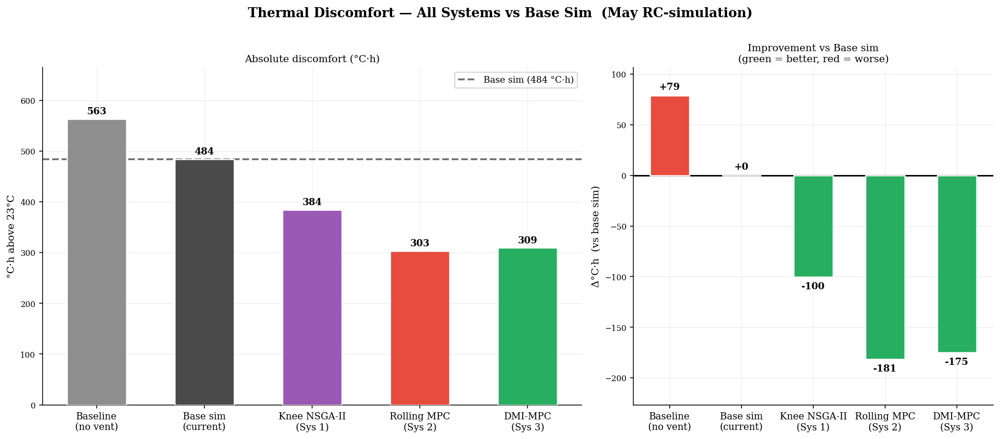

Chart 1 saved


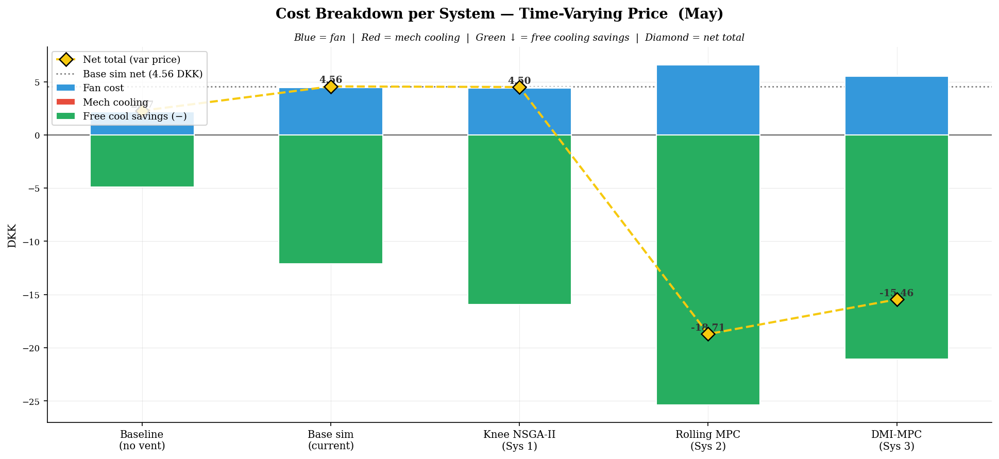

Chart 2 saved


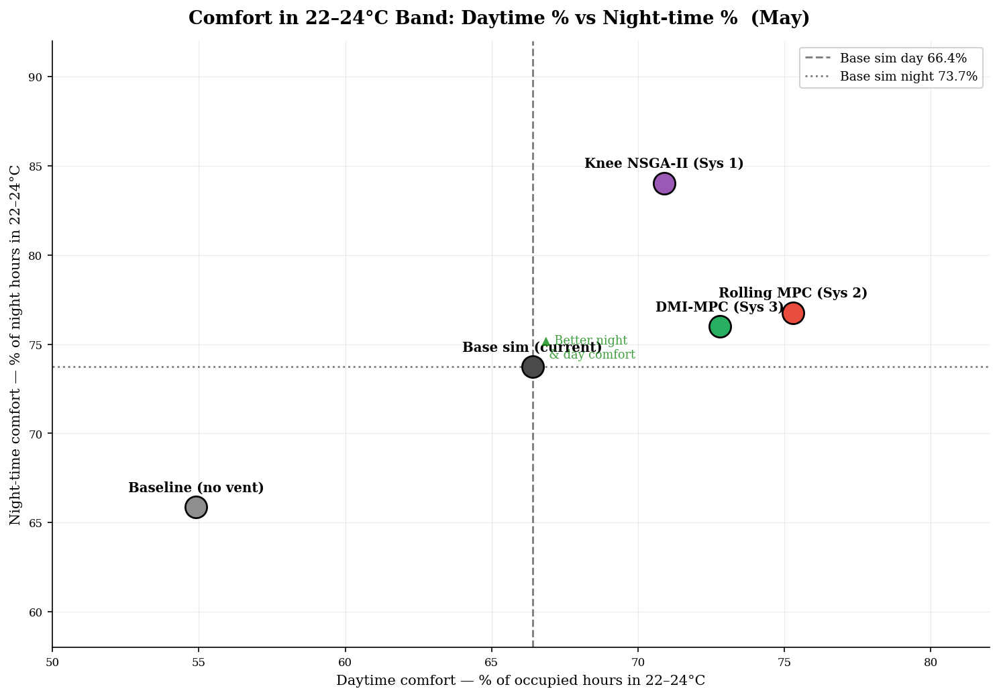

Chart 3 saved


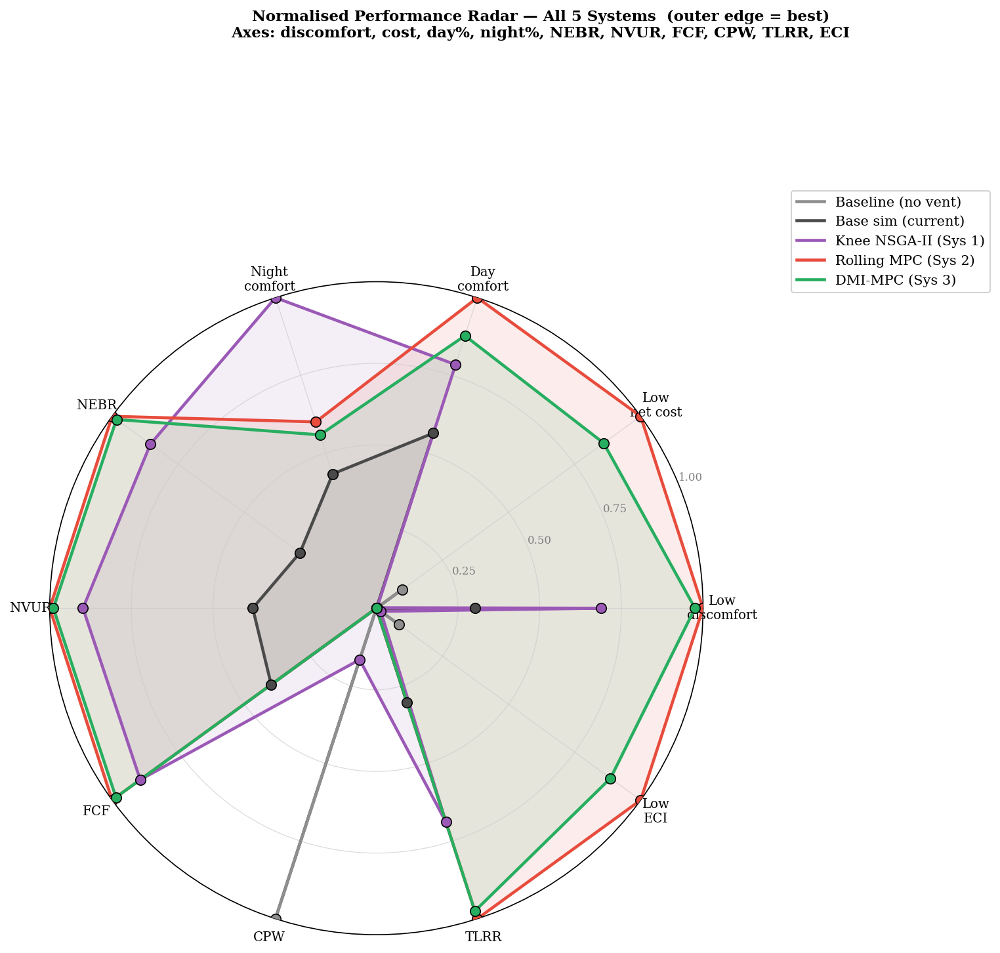

Chart 4 saved


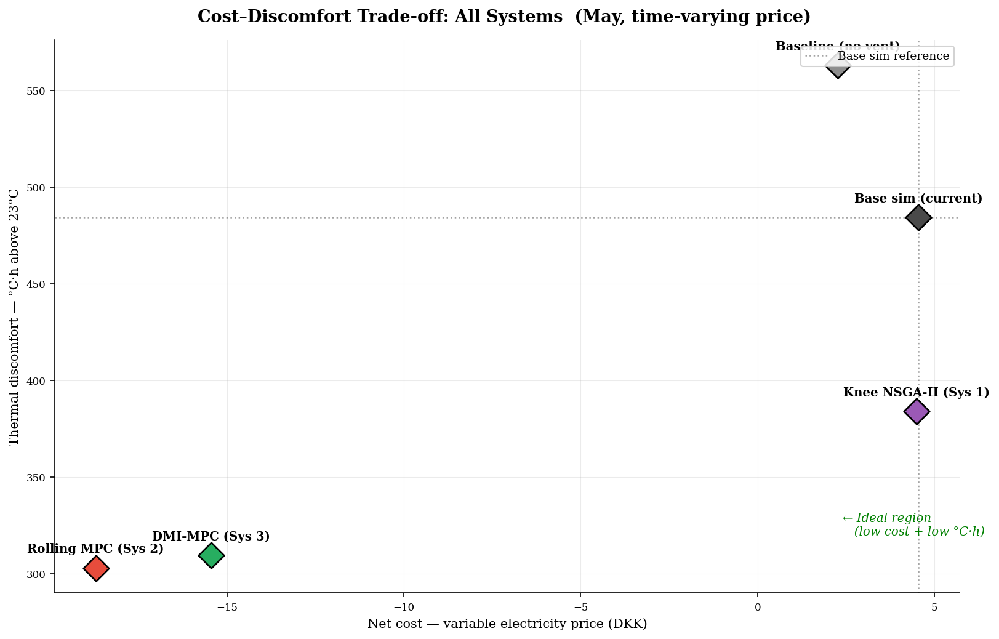

Chart 5 saved


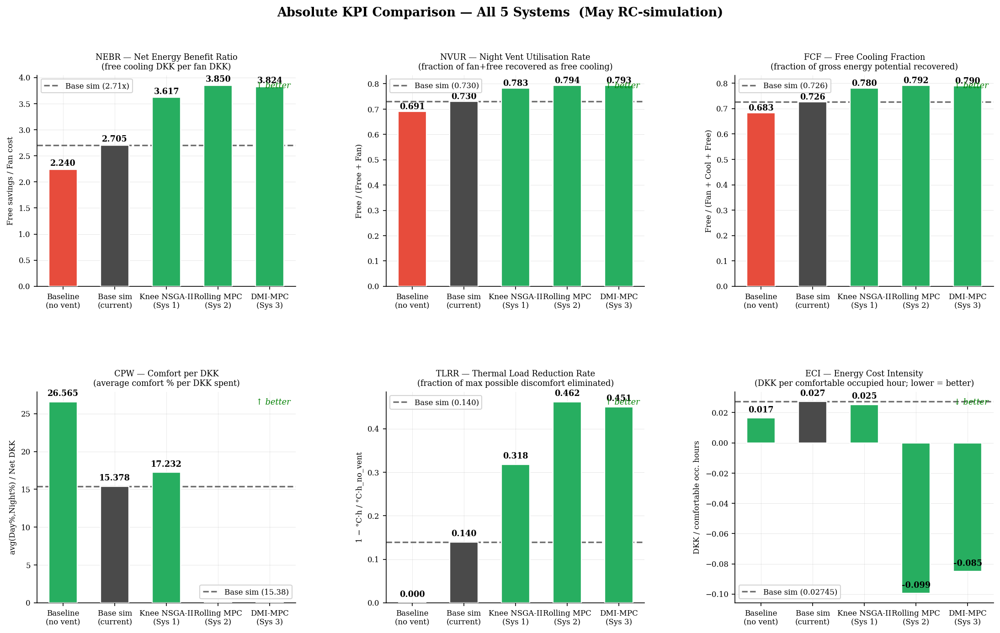

Chart 6 saved

All 6 charts saved.
  KPIs: NEBR, NVUR, FCF, CPW, TLRR, ECI — all absolute, no delta denominators.
  Systems: Baseline | Base sim | Knee NSGA-II (Sys 1) | Rolling MPC (Sys 2) | DMI-MPC (Sys 3)


In [90]:
# ════════════════════════════════════════════════════════════════════════════
#  COMPARISON CHARTS — Final System Overview  (matplotlib only)
#  Systems: Baseline, Base sim, Knee NSGA-II (Sys 1), MPC (Sys 2), DMI-MPC (Sys 3)
# ════════════════════════════════════════════════════════════════════════════

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec


# ── Filter rows to the 5 systems of interest ─────────────────────────────────
_keep_keys = ['baseline', 'current', 'knee', 'system 2', 'system 3']
rows_plot  = [r for r in rows
              if any(k in r['label'].lower() for k in _keep_keys)]

# ── Short labels ──────────────────────────────────────────────────────────────
labels_short = []
for r in rows_plot:
    lbl = r['label']
    lbl = lbl.replace('Baseline (no night vent)', 'Baseline\n(no vent)')
    lbl = lbl.replace('Base sim (current vent)',  'Base sim\n(current)')
    lbl = lbl.replace('Knee (balanced)',           'Knee NSGA-II\n(Sys 1)')
    lbl = lbl.replace('Rolling MPC (System 2)',    'Rolling MPC\n(Sys 2)')
    lbl = lbl.replace('DMI-MPC (System 3)',         'DMI-MPC\n(Sys 3)')
    labels_short.append(lbl)

dh_vals   = np.array([r['dh']      for r in rows_plot])
fan_vals  = np.array([r['fan_v']   for r in rows_plot])
cool_vals = np.array([r['cool_v']  for r in rows_plot])
free_vals = np.array([r['free_v']  for r in rows_plot])
totv_vals = np.array([r['tot_v']   for r in rows_plot])
occ_vals  = np.array([r['pct_occ'] for r in rows_plot])
ngt_vals  = np.array([r['pct_ngt'] for r in rows_plot])
nebr_vals = np.array([r['NEBR']    for r in rows_plot])
nvur_vals = np.array([r['NVUR']    for r in rows_plot])
fcf_vals  = np.array([r['FCF']     for r in rows_plot])
cpw_vals  = np.array([r['CPW']     for r in rows_plot])
tlrr_vals = np.array([r['TLRR']    for r in rows_plot])
eci_vals  = np.array([r['ECI']     for r in rows_plot])

base_dh   = next(r['dh']      for r in rows_plot if 'current' in r['label'].lower())
base_totv = next(r['tot_v']   for r in rows_plot if 'current' in r['label'].lower())
base_occ  = next(r['pct_occ'] for r in rows_plot if 'current' in r['label'].lower())
base_ngt  = next(r['pct_ngt'] for r in rows_plot if 'current' in r['label'].lower())
base_nebr = next(r['NEBR']    for r in rows_plot if 'current' in r['label'].lower())
base_nvur = next(r['NVUR']    for r in rows_plot if 'current' in r['label'].lower())
base_fcf  = next(r['FCF']     for r in rows_plot if 'current' in r['label'].lower())
base_cpw  = next(r['CPW']     for r in rows_plot if 'current' in r['label'].lower())
base_tlrr = next(r['TLRR']    for r in rows_plot if 'current' in r['label'].lower())
base_eci  = next(r['ECI']     for r in rows_plot if 'current' in r['label'].lower())

n     = len(rows_plot)
x     = np.arange(n)
_cols = ['#8e8e8e',   # Baseline
         '#4a4a4a',   # Base sim
         '#9b59b6',   # Knee NSGA-II (Sys 1)
         '#e74c3c',   # Rolling MPC (Sys 2)
         '#27ae60']   # DMI-MPC (Sys 3)
_W    = 0.55


# ════════════════════════════════════════════════════════════════════════════
#  CHART 1 — Thermal discomfort + delta
# ════════════════════════════════════════════════════════════════════════════
fig1, (ax1a, ax1b) = plt.subplots(1, 2, figsize=(14, 6),
                                   gridspec_kw={'width_ratios': [1.5, 1]})
fig1.suptitle('Thermal Discomfort — All Systems vs Base Sim  (May RC-simulation)',
              fontsize=13, fontweight='bold', y=1.01)

bars = ax1a.bar(x, dh_vals, width=_W, color=_cols,
                edgecolor='white', linewidth=1.2, zorder=3)
ax1a.axhline(base_dh, color='#4a4a4a', lw=1.8, ls='--', alpha=0.8,
             label=f'Base sim ({base_dh:.0f} °C·h)')
for bar, val in zip(bars, dh_vals):
    ax1a.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 6,
              f'{val:.0f}', ha='center', va='bottom', fontsize=9.5, fontweight='600')
ax1a.set_xticks(x); ax1a.set_xticklabels(labels_short, fontsize=9.5)
ax1a.set_ylabel('°C·h above 23°C', fontsize=10)
ax1a.set_title('Absolute discomfort (°C·h)', fontsize=10)
ax1a.legend(fontsize=9); ax1a.grid(axis='y', alpha=0.3); ax1a.set_axisbelow(True)
ax1a.set_ylim(0, max(dh_vals) * 1.18)

deltas = dh_vals - base_dh
dcols  = ['#e74c3c' if d > 0 else '#27ae60' for d in deltas]
bars2  = ax1b.bar(x, deltas, width=_W, color=dcols,
                  edgecolor='white', linewidth=1.2, zorder=3)
ax1b.axhline(0, color='black', lw=1.5)
for bar, val in zip(bars2, deltas):
    yoff = 4 if val >= 0 else -14
    ax1b.text(bar.get_x() + bar.get_width()/2, bar.get_height() + yoff,
              f'{val:+.0f}', ha='center', va='bottom', fontsize=9.5, fontweight='600')
ax1b.set_xticks(x); ax1b.set_xticklabels(labels_short, fontsize=9.5)
ax1b.set_ylabel('Δ°C·h  (vs base sim)', fontsize=10)
ax1b.set_title('Improvement vs Base sim\n(green = better, red = worse)', fontsize=10)
ax1b.grid(axis='y', alpha=0.3); ax1b.set_axisbelow(True)
ax1b.set_ylim(min(deltas) * 1.25, max(deltas) * 1.35)

fig1.tight_layout()
fig1.savefig('chart1_discomfort.png', dpi=150, bbox_inches='tight')
plt.show(); plt.close(fig1)
print("Chart 1 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 2 — Cost breakdown
# ════════════════════════════════════════════════════════════════════════════
fig2, ax2 = plt.subplots(figsize=(13, 6))
fig2.suptitle('Cost Breakdown per System — Time-Varying Price  (May)',
              fontsize=13, fontweight='bold')

ax2.bar(x, fan_vals,   width=_W, color='#3498db', label='Fan cost',
        edgecolor='white', linewidth=1, zorder=3)
ax2.bar(x, cool_vals,  width=_W, color='#e74c3c', label='Mech cooling',
        bottom=fan_vals, edgecolor='white', linewidth=1, zorder=3)
ax2.bar(x, -free_vals, width=_W, color='#27ae60', label='Free cool savings (−)',
        edgecolor='white', linewidth=1, zorder=3)
ax2.plot(x, totv_vals, color='#f6c90e', lw=2.0, ls='--',
         marker='D', markersize=9, markeredgecolor='black', markeredgewidth=1.2,
         zorder=5, label='Net total (var price)')
ax2.axhline(0, color='black', lw=1.0, alpha=0.6)
ax2.axhline(base_totv, color='#4a4a4a', lw=1.4, ls=':', alpha=0.7,
            label=f'Base sim net ({base_totv:.2f} DKK)')
for xi, tv in zip(x, totv_vals):
    ax2.text(xi, tv + 0.15, f'{tv:.2f}', ha='center', va='bottom',
             fontsize=9, fontweight='700', color='#333')
ax2.set_xticks(x); ax2.set_xticklabels(labels_short, fontsize=9.5)
ax2.set_ylabel('DKK', fontsize=10)
ax2.legend(fontsize=9, loc='upper left')
ax2.grid(axis='y', alpha=0.3); ax2.set_axisbelow(True)
ax2.set_title('Blue = fan  |  Red = mech cooling  |  Green ↓ = free cooling savings  '
              '|  Diamond = net total', fontsize=9, style='italic')

fig2.tight_layout()
fig2.savefig('chart2_cost_breakdown.png', dpi=150, bbox_inches='tight')
plt.show(); plt.close(fig2)
print("Chart 2 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 3 — Daytime vs night-time comfort scatter
# ════════════════════════════════════════════════════════════════════════════
fig3, ax3 = plt.subplots(figsize=(10, 7))
fig3.suptitle('Comfort in 22–24°C Band: Daytime % vs Night-time %  (May)',
              fontsize=13, fontweight='bold')

for lbl, po, pn, col in zip(labels_short, occ_vals, ngt_vals, _cols):
    ax3.scatter(po, pn, s=240, color=col, edgecolors='black', linewidths=1.3, zorder=4)
    clean = lbl.replace('\n', ' ')
    ax3.annotate(clean, (po, pn), textcoords='offset points', xytext=(0, 11),
                 ha='center', fontsize=9.5, fontweight='600')

ax3.axvline(base_occ, color='#4a4a4a', lw=1.4, ls='--', alpha=0.7,
            label=f'Base sim day {base_occ:.1f}%')
ax3.axhline(base_ngt, color='#4a4a4a', lw=1.4, ls=':', alpha=0.7,
            label=f'Base sim night {base_ngt:.1f}%')
ax3.text(base_occ + 0.3, base_ngt + 0.5,
         '▲ Better night\n  & day comfort',
         fontsize=8.5, color='green', alpha=0.75)
ax3.set_xlabel('Daytime comfort — % of occupied hours in 22–24°C', fontsize=10)
ax3.set_ylabel('Night-time comfort — % of night hours in 22–24°C', fontsize=10)
ax3.legend(fontsize=9); ax3.grid(alpha=0.25); ax3.set_axisbelow(True)
ax3.set_xlim(50, 82); ax3.set_ylim(58, 92)

fig3.tight_layout()
fig3.savefig('chart3_comfort_scatter.png', dpi=150, bbox_inches='tight')
plt.show(); plt.close(fig3)
print("Chart 3 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 4 — Radar chart  (6 axes: all absolute KPIs)
# ════════════════════════════════════════════════════════════════════════════
def _norm(vals):
    lo, hi = min(vals), max(vals)
    return [(v - lo) / (hi - lo) if hi > lo else 0.5 for v in vals]

def _norm_finite(vals):
    finite = [v for v in vals if not np.isnan(v)]
    lo, hi = min(finite), max(finite)
    return [(0.0 if np.isnan(v) else
             ((v - lo) / (hi - lo) if hi > lo else 0.5))
            for v in vals]

# all axes: outer = best
dh_n    = [1 - v for v in _norm(dh_vals)]       # lower dh = better
cost_n  = [1 - v for v in _norm(totv_vals)]      # lower cost = better
occ_n   = _norm(occ_vals)                         # higher = better
ngt_n   = _norm(ngt_vals)                         # higher = better
nebr_n  = _norm_finite(nebr_vals)                 # higher = better
nvur_n  = _norm(nvur_vals)                        # higher = better
fcf_n   = _norm(fcf_vals)                         # higher = better
cpw_n   = _norm_finite(cpw_vals)                  # higher = better
tlrr_n  = _norm(tlrr_vals)                        # higher = better
eci_n   = [1 - v for v in _norm_finite(eci_vals)] # lower ECI = better

cats   = ['Low\ndiscomfort', 'Low\nnet cost', 'Day\ncomfort', 'Night\ncomfort',
          'NEBR', 'NVUR', 'FCF', 'CPW', 'TLRR', 'Low\nECI']
N_cats = len(cats)
angles = np.linspace(0, 2 * np.pi, N_cats, endpoint=False).tolist()
angles += angles[:1]

fig4, ax4 = plt.subplots(figsize=(11, 11), subplot_kw=dict(polar=True))
fig4.suptitle(
    'Normalised Performance Radar — All 5 Systems  (outer edge = best)\n'
    'Axes: discomfort, cost, day%, night%, NEBR, NVUR, FCF, CPW, TLRR, ECI',
    fontsize=11, fontweight='bold')

all_axes_n = list(zip(dh_n, cost_n, occ_n, ngt_n,
                      nebr_n, nvur_n, fcf_n, cpw_n, tlrr_n, eci_n))

for i in range(n):
    vals  = list(all_axes_n[i]) + [all_axes_n[i][0]]
    clean = labels_short[i].replace('\n', ' ')
    ax4.plot(angles, vals, color=_cols[i], lw=2.2, label=clean)
    ax4.fill(angles, vals, color=_cols[i], alpha=0.10)
    ax4.scatter(angles[:-1], vals[:-1], color=_cols[i], s=55, zorder=4,
                edgecolors='black', linewidths=0.8)

ax4.set_thetagrids(np.degrees(angles[:-1]), cats, fontsize=9.5)
ax4.set_ylim(0, 1)
ax4.set_yticks([0.25, 0.5, 0.75, 1.0])
ax4.set_yticklabels(['0.25', '0.50', '0.75', '1.00'], fontsize=8, color='grey')
ax4.grid(color='#cccccc', linestyle='-', linewidth=0.6, alpha=0.7)
ax4.legend(loc='upper right', bbox_to_anchor=(1.45, 1.15), fontsize=10)

fig4.tight_layout()
fig4.savefig('chart4_radar.png', dpi=150, bbox_inches='tight')
plt.show(); plt.close(fig4)
print("Chart 4 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 5 — Cost vs discomfort Pareto scatter
# ════════════════════════════════════════════════════════════════════════════
fig5, ax5 = plt.subplots(figsize=(11, 7))
fig5.suptitle('Cost–Discomfort Trade-off: All Systems  (May, time-varying price)',
              fontsize=13, fontweight='bold')

for i, (lbl, tc, dh_v, col) in enumerate(
        zip(labels_short, totv_vals, dh_vals, _cols)):
    ax5.scatter(tc, dh_v, s=200, color=col, marker='D',
                edgecolors='black', linewidths=1.3, zorder=4)
    clean = lbl.replace('\n', ' ')
    ax5.annotate(clean, (tc, dh_v), textcoords='offset points',
                 xytext=(0, 12), ha='center', fontsize=9.5, fontweight='600')

ax5.annotate('← Ideal region\n   (low cost + low °C·h)',
             xy=(2.4, 320), fontsize=9.5, color='green', fontstyle='italic')
ax5.axvline(base_totv, color='#4a4a4a', lw=1.2, ls=':', alpha=0.5,
            label='Base sim reference')
ax5.axhline(base_dh, color='#4a4a4a', lw=1.2, ls=':', alpha=0.5)
ax5.legend(fontsize=9, loc='upper right')
ax5.set_xlabel('Net cost — variable electricity price (DKK)', fontsize=10)
ax5.set_ylabel('Thermal discomfort — °C·h above 23°C', fontsize=10)
ax5.grid(alpha=0.25); ax5.set_axisbelow(True)

fig5.tight_layout()
fig5.savefig('chart5_pareto.png', dpi=150, bbox_inches='tight')
plt.show(); plt.close(fig5)
print("Chart 5 saved")


# ════════════════════════════════════════════════════════════════════════════
#  CHART 6 — Absolute KPI comparison (2×3 grid)
# ════════════════════════════════════════════════════════════════════════════
fig6 = plt.figure(figsize=(18, 10))
gs6  = gridspec.GridSpec(2, 3, figure=fig6, hspace=0.50, wspace=0.35)
fig6.suptitle('Absolute KPI Comparison — All 5 Systems  (May RC-simulation)',
              fontsize=13, fontweight='bold')

kpi_specs = [
    # (ax, values, ylabel, title, base_val, base_label, higher_is_better)
    (gs6[0,0], nebr_vals, 'Free savings / Fan cost',
     'NEBR — Net Energy Benefit Ratio\n(free cooling DKK per fan DKK)',
     base_nebr, f'Base sim ({base_nebr:.2f}x)', True),
    (gs6[0,1], nvur_vals, 'Free / (Free + Fan)',
     'NVUR — Night Vent Utilisation Rate\n(fraction of fan+free recovered as free cooling)',
     base_nvur, f'Base sim ({base_nvur:.3f})', True),
    (gs6[0,2], fcf_vals,  'Free / (Fan + Cool + Free)',
     'FCF — Free Cooling Fraction\n(fraction of gross energy potential recovered)',
     base_fcf,  f'Base sim ({base_fcf:.3f})', True),
    (gs6[1,0], cpw_vals,  'avg(Day%,Night%) / Net DKK',
     'CPW — Comfort per DKK\n(average comfort % per DKK spent)',
     base_cpw,  f'Base sim ({base_cpw:.2f})', True),
    (gs6[1,1], tlrr_vals, '1 − °C·h / °C·h_no_vent',
     'TLRR — Thermal Load Reduction Rate\n(fraction of max possible discomfort eliminated)',
     base_tlrr, f'Base sim ({base_tlrr:.3f})', True),
    (gs6[1,2], eci_vals,  'DKK / comfortable occ. hours',
     'ECI — Energy Cost Intensity\n(DKK per comfortable occupied hour; lower = better)',
     base_eci,  f'Base sim ({base_eci:.5f})', False),
]

for spec in kpi_specs:
    gs_pos, vals, ylabel, title, base_val, base_lbl, higher_better = spec
    ax = fig6.add_subplot(gs_pos)
    finite = np.where(np.isnan(vals), 0, vals)

    if higher_better:
        bar_cols = ['#27ae60' if v >= base_val else '#e74c3c' for v in finite]
    else:
        bar_cols = ['#27ae60' if v <= base_val else '#e74c3c' for v in finite]
    # base sim bar always neutral
    base_idx = next(i for i, r in enumerate(rows_plot) if 'current' in r['label'].lower())
    bar_cols[base_idx] = '#4a4a4a'

    bars = ax.bar(x, finite, width=_W, color=bar_cols,
                  edgecolor='white', linewidth=1.1, zorder=3)
    ax.axhline(base_val, color='#4a4a4a', lw=1.6, ls='--', alpha=0.8,
               label=base_lbl)

    for bar, val in zip(bars, vals):
        if not np.isnan(val):
            ypad = (max(finite) - min(finite)) * 0.02
            ax.text(bar.get_x() + bar.get_width()/2,
                    bar.get_height() + ypad,
                    f'{val:.3f}', ha='center', va='bottom',
                    fontsize=8.5, fontweight='600')

    ax.set_xticks(x); ax.set_xticklabels(labels_short, fontsize=8)
    ax.set_ylabel(ylabel, fontsize=8)
    ax.set_title(title, fontsize=8.5)
    ax.legend(fontsize=8); ax.grid(axis='y', alpha=0.3); ax.set_axisbelow(True)
    _dir = '↑ better' if higher_better else '↓ better'
    ax.text(0.98, 0.97, _dir, transform=ax.transAxes,
            ha='right', va='top', fontsize=8.5, color='green',
            fontstyle='italic')

fig6.savefig('chart6_kpis.png', dpi=150, bbox_inches='tight')
plt.show(); plt.close(fig6)
print("Chart 6 saved")


print("\nAll 6 charts saved.")
print("  KPIs: NEBR, NVUR, FCF, CPW, TLRR, ECI — all absolute, no delta denominators.")
print("  Systems: Baseline | Base sim | Knee NSGA-II (Sys 1) | Rolling MPC (Sys 2) | DMI-MPC (Sys 3)")